# Je passe à la partie préparation du Machine Learning

## 1) Importation des librairies

In [1]:
from pandas import DataFrame, read_json
import pandas as pd
import numpy as np
import re
import time
from datetime import datetime
import csv
import os

import pandas_profiling

%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
import random
random.seed(3)

In [3]:
insta_ml = pd.read_json('BACKUP/insta_avec_follower_final-BACKUP.json')

In [4]:
insta_ml.head(3)

,page_id,page_username,date_time,date,code_jour_semaine,day,month,year,time,publication_id,...,publication_shortcode,publication_thumbnail_src,hashtag_list,hashtag_list_count,publication_word_list,publication_word_list_count,hour,week_weekend,page_nb_followers,edi_lib
0,4741863243,librairielestempsmodernes,2017-03-09 22:16:32,2017-03-09,4,9,3,2017,22:16:32,1466950865096294144,...,BRbqAohBD9A,https://scontent-cdt1-1.cdninstagram.com/vp/5b...,pas de hashtag,0,,0,22,0,218,1
1,4741863243,librairielestempsmodernes,2017-03-01 20:16:30,2017-03-01,3,1,3,2017,20:16:30,1461092250598961920,...,BRG16klBvN5,https://scontent-cdt1-1.cdninstagram.com/vp/bc...,pas de hashtag,0,,0,20,0,218,1
2,3655964171,librairielibellule,2019-10-11 16:56:30,2019-10-11,5,11,10,2019,16:56:30,2152397435142459904,...,B3e2hA5INJC,https://scontent-cdt1-1.cdninstagram.com/vp/cb...,"[#librairie, #libellule, #librairieLibellule, ...",21,"[On, est, dans, la, place, au, Salon, ""Lire, e...",41,16,0,236,1


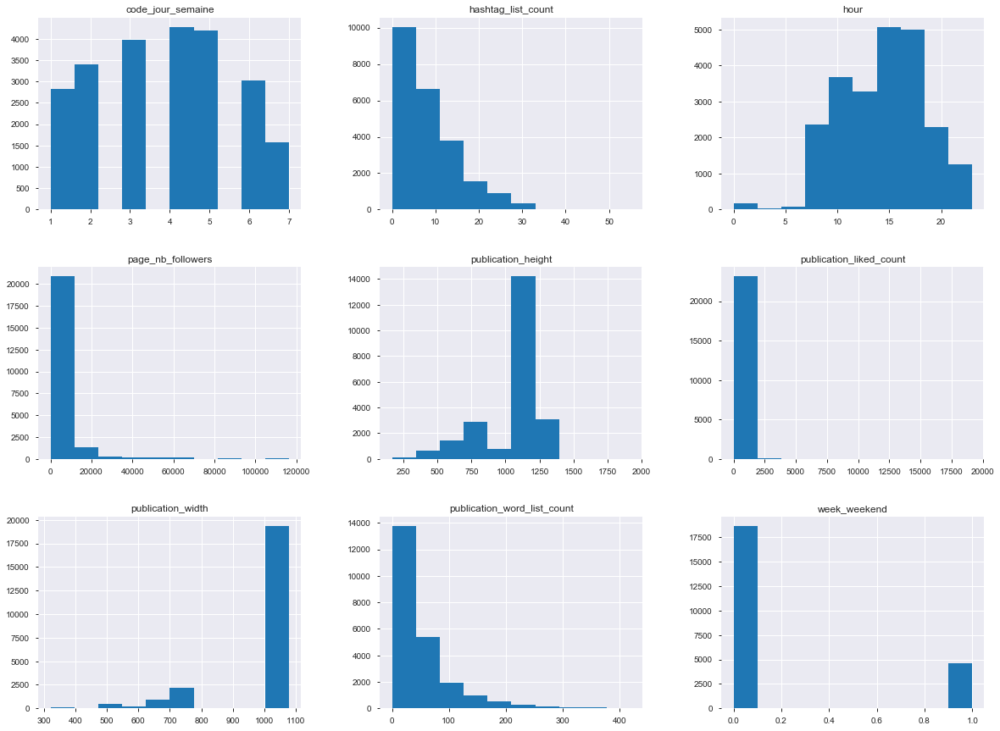

In [5]:
insta_ml[['code_jour_semaine','hour','publication_liked_count','publication_height','publication_width','hashtag_list_count','publication_word_list_count','week_weekend','page_nb_followers']].hist(figsize=(20,15))
plt.show()

## 2) Martice de corrélation des colonnes numériques

Pour supprimer d'éventuelles colonnes qui auraient un effet sur le modèle.
A noter : Je supprime les colonnes de date et les Id des compte et publications qui ne servent pas à prédire le nombre de like d'une publication. Les Date/datetime ont été découpés en day/month/year/hour/code jour. Toutefois, je ne conserve que code_jour et hour pour la suite du travail
Je retire également les colonnes publication_video_view_count et publication_comment_count qui sont des informations postérieures à la publication et donc sont un résultat de la publication tout comme l'est le nombre de like.


In [6]:
insta_ml_num = insta_ml.select_dtypes(include=['int64','float64','datetime64[ns]']).drop(columns=['publication_id','page_id','date_time','date','publication_video_view_count','year','month','day','publication_comment_count'])
insta_ml_num_corr = insta_ml_num.corr()

Regardons de plus près les coefficients de corrélation de la target publication_liked_count aka le nombre de like pour une publication.

In [7]:
insta_ml_num_corr['publication_liked_count'].sort_values(ascending=False)

publication_liked_count            1.000000
publication_preview_liked_count    0.965878
page_nb_followers                  0.630412
publication_word_list_count        0.104775
publication_width                  0.048080
hour                               0.046769
hashtag_list_count                 0.041036
publication_height                 0.038913
week_weekend                      -0.023608
code_jour_semaine                 -0.031972
edi_lib                           -0.186804
Name: publication_liked_count, dtype: float64

#### Note : 
- On observe une corrélation entre le nombre de likes pour une publication et le nombre de followers d'un compte.  --> on pourrait par exemple avancer l'hypothèse que plus on a de personnes qui suivent un compte plus ce dernier aura de like à ses publications.
- il y a une faible corrélation négative en le fait d'être un libraire ou un éditeur et le nb de like. donc le fait d'être l'un ou l'autre n'aurait pas d'influence sur le nb de likes. 

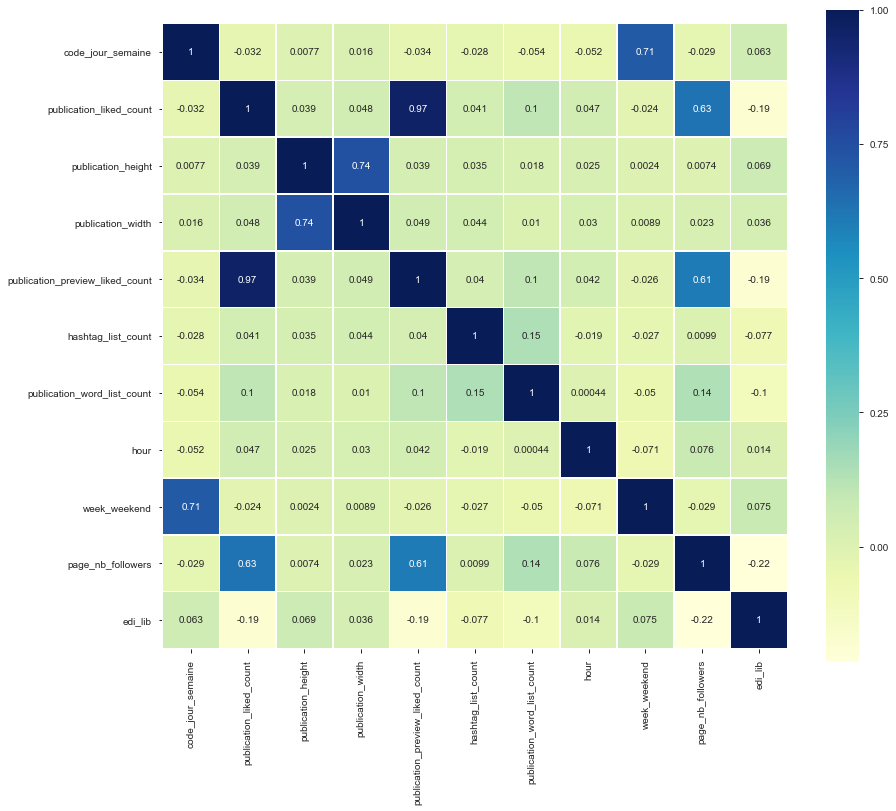

In [8]:
# Set up the matplotlib figure
fig, ax = plt.subplots(figsize=(14, 12))

# Generate a custom diverging colormap #
cmap="YlGnBu"

# Draw the heatmap with the mask and correct aspect ratio (mask=mask)
ax = sns.heatmap(insta_ml_num_corr, cmap=cmap, annot=True, annot_kws={"size": 10},square=True, linewidths=.5)

#### Note : 
- il y a une forte corrélation entre les variables `week_weekend` et `code_jour_semaine` mais ceci est normal puisque les codes 6 et 7 sont liées au weekend et le restant des jours à la semaine (week)

## 3) Analyse statistique des variables numériques

In [9]:
insta_ml_num.describe()

,code_jour_semaine,publication_liked_count,publication_height,publication_width,publication_preview_liked_count,hashtag_list_count,publication_word_list_count,hour,week_weekend,page_nb_followers,edi_lib
count,23273.000000,23273.000000,23273.000000,23273.000000,23273.000000,23273.000000,23273.000000,23273.000000,23273.000000,23273.000000,23273.000000
mean,3.815795,121.053066,1020.172131,1011.138401,125.078761,7.847248,51.624586,14.448245,0.197439,5053.062132,0.404933
std,1.766579,324.104156,219.487253,160.662926,342.748317,6.900461,56.647929,4.054596,0.398075,12561.795879,0.490890
min,1.000000,0.000000,166.000000,320.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14.000000,0.000000
25%,2.000000,21.000000,970.000000,1080.000000,21.000000,3.000000,17.000000,11.000000,0.000000,423.000000,0.000000
50%,4.000000,41.000000,1080.000000,1080.000000,41.000000,7.000000,33.000000,15.000000,0.000000,1180.000000,0.000000
75%,5.000000,93.000000,1080.000000,1080.000000,94.000000,11.000000,64.000000,18.000000,0.000000,2902.000000,1.000000
max,7.000000,19170.000000,1921.000000,1080.000000,19170.000000,55.000000,420.000000,23.000000,1.000000,116483.000000,1.000000


Note : A l'analyse de ces données statistiques, je choisis de calculer le log pour la colonne `page_nb_followers`

## 4) Log de la colonne `page_nb_followers`

In [10]:
insta_ml_log = insta_ml.copy()
insta_ml_log[['page_nb_followers_log']]=insta_ml_log[['page_nb_followers']].apply(lambda x: np.log(x+1))

In [11]:
insta_ml_log.describe()

,page_id,code_jour_semaine,day,month,year,publication_id,publication_liked_count,publication_height,publication_width,publication_preview_liked_count,publication_comment_count,publication_video_view_count,hashtag_list_count,publication_word_list_count,hour,week_weekend,page_nb_followers,edi_lib,page_nb_followers_log
count,2.327300e+04,23273.000000,23273.000000,23273.000000,23273.000000,2.327300e+04,23273.000000,23273.000000,23273.000000,23273.000000,23273.000000,23273.000000,23273.000000,23273.000000,23273.000000,23273.000000,23273.000000,23273.000000,23273.000000
mean,5.133394e+09,3.815795,15.252825,9.135178,2018.885876,2.106244e+18,121.053066,1020.172131,1011.138401,125.078761,5.522666,40.569673,7.847248,51.624586,14.448245,0.197439,5053.062132,0.404933,7.172471
std,3.201941e+09,1.766579,8.699103,2.165155,0.469181,1.393463e+17,324.104156,219.487253,160.662926,342.748317,42.464824,765.493331,6.900461,56.647929,4.054596,0.398075,12561.795879,0.490890,1.552458
min,7.116210e+05,1.000000,1.000000,1.000000,2013.000000,5.238321e+17,0.000000,166.000000,320.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14.000000,0.000000,2.708050
25%,2.293382e+09,2.000000,8.000000,9.000000,2019.000000,2.121803e+18,21.000000,970.000000,1080.000000,21.000000,0.000000,0.000000,3.000000,17.000000,11.000000,0.000000,423.000000,0.000000,6.049733
50%,4.778906e+09,4.000000,15.000000,10.000000,2019.000000,2.150879e+18,41.000000,1080.000000,1080.000000,41.000000,1.000000,0.000000,7.000000,33.000000,15.000000,0.000000,1180.000000,0.000000,7.074117
75%,7.224781e+09,5.000000,23.000000,10.000000,2019.000000,2.164740e+18,93.000000,1080.000000,1080.000000,94.000000,3.000000,0.000000,11.000000,64.000000,18.000000,0.000000,2902.000000,1.000000,7.973500
max,2.124722e+10,7.000000,31.000000,12.000000,2019.000000,2.178615e+18,19170.000000,1921.000000,1080.000000,19170.000000,2136.000000,90015.000000,55.000000,420.000000,23.000000,1.000000,116483.000000,1.000000,11.665509


In [12]:
import plotly.express as px
fig = px.box(insta_ml_log, y="page_nb_followers_log")
fig.show()

In [13]:
insta_ml_log.shape

(23273, 31)

## 5) Séparation des variables en Features et Target
- y = la target : est le nombre de like pour une publication.
- X = les variables retenues : les infos de temporalité (date, jour de la semaine, semaine/weekend, heure), le nombre de commentaires, le type de publication, la taille de la publication, le nombre de mots dans une publication, le nombre de hashtag, le nombre de vue si la publication est une vidéo, s'il s'agit d'un éditeur ou une librairie, le nombre de fans du compte. 

In [14]:
# y pour la Target
y= insta_ml_log["publication_liked_count"]
y=y.apply(lambda x: np.log(x+1)) #car y.min()=0

# X pour les Features - 9 variables explicatives
X=insta_ml_log[['code_jour_semaine', 'hour', 'publication_type', 'publication_height',
                   'publication_is_video', 'hashtag_list_count', 'publication_word_list_count', 
                   'page_nb_followers_log','edi_lib']] 

# je supprime les features suivantes après un essai avec qui va vers un over-fitting : 'publication_width','week_weekend', 

**Note** : 
- Pour la variable catégorielle `publication_type`, je vais utiliser la méthode get.dummies pour obtenir 3 colonnes numérique.
- pour la variable `publication_is_video`, il s'agit d'une variable de type boléen. Je la transforme en 0 pour False et 1 pour True. 

## 6) publication_is_video

In [15]:
X['publication_is_video'] = np.where(X['publication_is_video']==True,1,0)

/usr/local/Cellar/ipython/7.8.0/libexec/vendor/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [16]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23273 entries, 0 to 23272
Data columns (total 9 columns):
code_jour_semaine              23273 non-null int64
hour                           23273 non-null int64
publication_type               23273 non-null object
publication_height             23273 non-null int64
publication_is_video           23273 non-null int64
hashtag_list_count             23273 non-null int64
publication_word_list_count    23273 non-null int64
page_nb_followers_log          23273 non-null float64
edi_lib                        23273 non-null int64
dtypes: float64(1), int64(7), object(1)
memory usage: 1.6+ MB


## 7) publication_type
Utilisation de la fonction get.dummies

In [17]:
X = pd.get_dummies(X)

In [18]:
X.drop(columns='publication_type_GraphVideo', inplace=True)

In [19]:
X.shape, y.shape

((23273, 10), (23273,))

## 8) Split des données en training (80%) et testing (20%) .
Je réalise un split classique de type 80% pour le training et 20% pour le test.

In [20]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X,y ,train_size=0.80, test_size=0.20)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((18618, 10), (4655, 10), (18618,), (4655,))

## 9) Sélection du modèle via la Cross-Validation

Je décide de passer par la méthode de cross-validation pour choisir mon modèle de prédiction. <br/>

La validation croisée en français est une méthode qui permet d'estimer les performances de généralisation de plusieurs modèles à partir de l’ensemble d’apprentissage. Cette estimation pourra être comparée à l’estimation obtenue sur l’ensemble de test mis de côté au départ. <br/>

La cross validation consiste à recommencer sur plusieurs découpages train/test différents du jeu de données initial de manière à s’assurer que la prédiction est stable et éviter d'overfitting.

In [21]:
from sklearn import metrics

#print('Liste des scores existants dans le module sklearn:\n\n',metrics.SCORERS.keys())

from sklearn.model_selection import cross_val_score
from sklearn.metrics import r2_score

from sklearn.linear_model import Ridge
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import BaggingRegressor
from xgboost import XGBRegressor

regressors = {'K-Nearest Neighbor': KNeighborsRegressor(n_neighbors=3),
              'Decision Tree': DecisionTreeRegressor(),
              'Ridge Regression': Ridge(),
              'Random Forest': RandomForestRegressor(),
              'Gradient Boosting': GradientBoostingRegressor(), 
              'AdaBoost': AdaBoostRegressor(),
              'Bagging Regressor': BaggingRegressor(),
              'Linear Regression': LinearRegression(),
              'XGB Regressor':XGBRegressor(objective ='reg:squarederror')}

def compare_models(x, y, model_dict, folds=3):
    results = []
    
    for name, model in model_dict.items():
        scores = cross_val_score(model, x, y, cv=folds, scoring='r2')
        stats = [name, scores.mean()*100, min(scores), max(scores), scores.std(), pd.Series(scores).mad()]
        results.append(stats)
        print(model)
    
    df = pd.DataFrame(results, columns = ['Model', 'Mean', 'Min', 'Max','Std', 'Mad'])
    df = df.sort_values('Mean', ascending = False)
    return df

compare_models(X_train, y_train, regressors, 10)

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=3, p=2,
                    weights='uniform')
DecisionTreeRegressor(criterion='mse', max_depth=None, max_features=None,
                      max_leaf_nodes=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=None, splitter='best')
Ridge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001)


/usr/local/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.

/usr/local/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.

/usr/local/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.

/usr/local/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.

/usr/local/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.

/usr/local/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning:

The default value of n_estimators will chan

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators='warn',
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)
GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
                          learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, presort='auto',
                          random_state=N

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
             n_jobs=1, nthread=None, objective='reg:squarederror',
             random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
             seed=None, silent=None, subsample=1, verbosity=1)


,Model,Mean,Min,Max,Std,Mad
3,Random Forest,77.039718,0.751812,0.786423,0.012278,0.011015
6,Bagging Regressor,76.975554,0.753046,0.789896,0.011510,0.009648
8,XGB Regressor,72.927894,0.708898,0.744848,0.010891,0.009682
4,Gradient Boosting,72.927308,0.709075,0.745298,0.010942,0.009567
2,Ridge Regression,68.597130,0.667096,0.699939,0.010524,0.009335
7,Linear Regression,68.597123,0.667096,0.699936,0.010523,0.009334
5,AdaBoost,61.152739,0.536322,0.653934,0.031080,0.022897
1,Decision Tree,59.018283,0.566882,0.615325,0.014828,0.012034
0,K-Nearest Neighbor,35.751225,0.334817,0.382665,0.013951,0.011402


## 10) Grid Search pour le XGBoost, Gradient Boosting, Bagging Regressor / Ajout de Random Forest après suppression de 3 features
J'ai choisi de faire d'appliquer la méthode de Grid search sur les modèles ayant la meilleur moyenne de r2_score. 

In [23]:
%%time
from sklearn.model_selection import GridSearchCV

#XGBoost

model_xgb = XGBRegressor(objective ='reg:squarederror')
grid_param_xgb = {"n_estimators":[50,100,150],
                 "learning_rate"    : [0.05, 0.10, 0.15] ,
                 "max_depth"        : [3,5,6,7], #4,5,10,20, 50, 100,200,500
                 "min_child_weight" : [1,3]
                 }
grid_xgb=GridSearchCV(model_xgb,grid_param_xgb,cv=5)

#Ajout de Random Forest après suppression de features 

model_rfr = RandomForestRegressor() 
grid_param_rfr = { 
            #"n_estimators": [10,20,30],
            "max_features": ["auto", "sqrt", "log2"],
            "max_depth": [3,5,10,None],
            'bootstrap':[True, False]}
grid_rfr=GridSearchCV(model_rfr,grid_param_rfr,cv=5)


#Gradient Boosting

model_gbr = GradientBoostingRegressor()
grid_param_gbr = {"max_depth": [1,2,3],
                  'n_estimators': [50,100,150],
                  "loss":['ls', 'lad', 'huber', 'quantile'],
                  "max_features":['auto', 'sqrt', 'log2',None]}
grid_gradient=GridSearchCV(model_gbr,grid_param_gbr,cv=5)


#Bagging Regressor

model_bg = BaggingRegressor()
grid_param_bg = {"n_estimators": [5,10,20,50],
                 "max_features":[1,2,3,4,5],
                 "bootstrap": [True, False],
                 "bootstrap_features": [True, False]
                }
grid_bagging=GridSearchCV(model_bg,grid_param_bg,cv=5)

grid_model_list={'gradient':grid_gradient,
                 'bagging':grid_bagging,
                'random_forest':grid_rfr,
                 'xgboost':grid_xgb}


def grid_models(x, y, grid_dict):
    for name, model in grid_dict.items(): 
        model.fit(X_train,y_train)
        print(name)
        print(model.best_score_)
        print(model.best_params_)

grid_models(X_train, y_train, grid_model_list)

gradient
0.7347892902386045
{'loss': 'huber', 'max_depth': 3, 'max_features': 'auto', 'n_estimators': 150}
bagging
0.6736535785851654
{'bootstrap': False, 'bootstrap_features': False, 'max_features': 5, 'n_estimators': 50}


/usr/local/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.

/usr/local/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.

/usr/local/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.

/usr/local/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.

/usr/local/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.

/usr/local/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning:

The default value of n_estimators will chan

/usr/local/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.

/usr/local/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.

/usr/local/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.

/usr/local/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.

/usr/local/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.

/usr/local/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning:

The default value of n_estimators will chan

/usr/local/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.

/usr/local/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.

/usr/local/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.

/usr/local/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.

/usr/local/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.

/usr/local/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning:

The default value of n_estimators will chan

random_forest
0.7644619546083644
{'bootstrap': True, 'max_depth': None, 'max_features': 'auto'}


/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version


/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version


/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version


/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version


/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version


/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version


/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version


xgboost
0.7817164831164947
{'learning_rate': 0.15, 'max_depth': 7, 'min_child_weight': 3, 'n_estimators': 150}
CPU times: user 12min 36s, sys: 7.01 s, total: 12min 43s
Wall time: 12min 44s


## 11) Cross Validation pour les 4 modèles retenus et les paramètres retenus 

In [25]:
%%time
"""
gradient
0.7347892902386045
{'loss': 'huber', 'max_depth': 3, 'max_features': 'auto', 'n_estimators': 150}
bagging
0.6736535785851654
{'bootstrap': False, 'bootstrap_features': False, 'max_features': 5, 'n_estimators': 50}
random_forest
0.7644619546083644
{'bootstrap': True, 'max_depth': None, 'max_features': 'auto'}
xgboost
0.7817164831164947
{'learning_rate': 0.15, 'max_depth': 7, 'min_child_weight': 3, 'n_estimators': 150}
"""

regressors2 = {
            'Gradient Boosting': GradientBoostingRegressor(loss= 'huber',max_depth= 3, max_features= 'auto', n_estimators= 150), 
            'Bagging Regressor': BaggingRegressor(bootstrap= False, bootstrap_features= False, max_features= 5, n_estimators= 20),
            'RF Regressor_grid':RandomForestRegressor(bootstrap=True, max_depth=None, max_features= 'auto'),#, min_samples_split= 8, n_estimators= 30
            'XGB Regressor_grid': XGBRegressor(objective ='reg:squarederror', learning_rate=0.15, max_depth= 7,min_child_weight= 3,n_estimators = 150)}#,n_estimators= 100, min_child_weight=5,

def compare_models_tuned(x, y, model_dict, folds=3):
    results = []
    
    for name, model in model_dict.items():
        scores = cross_val_score(model, x, y, cv=folds, scoring='r2')
        stats = [name, scores.mean()*100, min(scores), max(scores), scores.std(), pd.Series(scores).mad()]
        results.append(stats)
    
    df = pd.DataFrame(results, columns = ['Model', 'Mean', 'Min', 'Max','Std', 'Mad'])
    df = df.sort_values('Mean', ascending = False)
    return df

compare_models_tuned(X_train, y_train, regressors2, 5)

/usr/local/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.

/usr/local/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.

/usr/local/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.

/usr/local/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.

/usr/local/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a fut

CPU times: user 20.6 s, sys: 178 ms, total: 20.8 s
Wall time: 20.8 s


,Model,Mean,Min,Max,Std,Mad
3,XGB Regressor_grid,78.171629,0.771982,0.789428,0.006221,0.005333
2,RF Regressor_grid,76.445332,0.752458,0.772295,0.007036,0.006146
0,Gradient Boosting,73.477267,0.726295,0.742327,0.006304,0.005866
1,Bagging Regressor,68.618409,0.606957,0.755300,0.063241,0.059851


## 12) Je retiens donc le modèle xgboost

In [26]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_squared_log_error

#X_test.drop(columns=['label', 'prediction'], inplace=True)
# suite à Grid 17h20 = xgb_reg = XGBRegressor(objective ='reg:squarederror', learning_rate=0.15, max_depth= 4,n_estimators= 500, min_child_weight=2)#,n_estimators= 100, min_child_weight=5,

xgb_reg = XGBRegressor(objective ='reg:squarederror', learning_rate=0.15, max_depth= 7,min_child_weight= 3,n_estimators = 150)
# fitting the model
xgb_reg.fit(X_train, y_train)

# predict the response
y_test_predict_xgb_reg = xgb_reg.predict(X_test)


R2_test =  round(r2_score(y_test, y_test_predict_xgb_reg),2)*100
R2_train = round(r2_score(y_train, xgb_reg.predict(X_train)),2)*100 
print('\nR2_score_train', R2_train, '\nR2_score_test', R2_test)

rmsle_test = np.sqrt(mean_squared_error(y_test, y_test_predict_xgb_reg))
rmsle_train = np.sqrt(mean_squared_error(y_train, xgb_reg.predict(X_train)))
print('\nrmse_score_train', rmsle_train, '\nrmse_score_test', rmsle_test)

real_rmse_test = np.sqrt(mean_squared_error(np.exp(y_test), np.exp(y_test_predict_xgb_reg)))
real_rmse_train = np.sqrt(mean_squared_error(np.exp(y_train), np.exp(xgb_reg.predict(X_train))))
print('\nreal_rmse_score_train', real_rmse_train, '\nreal_rmse_score_test', real_rmse_test)


/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version




R2_score_train 87.0 
R2_score_test 79.0

rmse_score_train 0.43232170594884334 
rmse_score_test 0.5597696915166557

real_rmse_score_train 125.50858990581293 
real_rmse_score_test 310.3749697932225


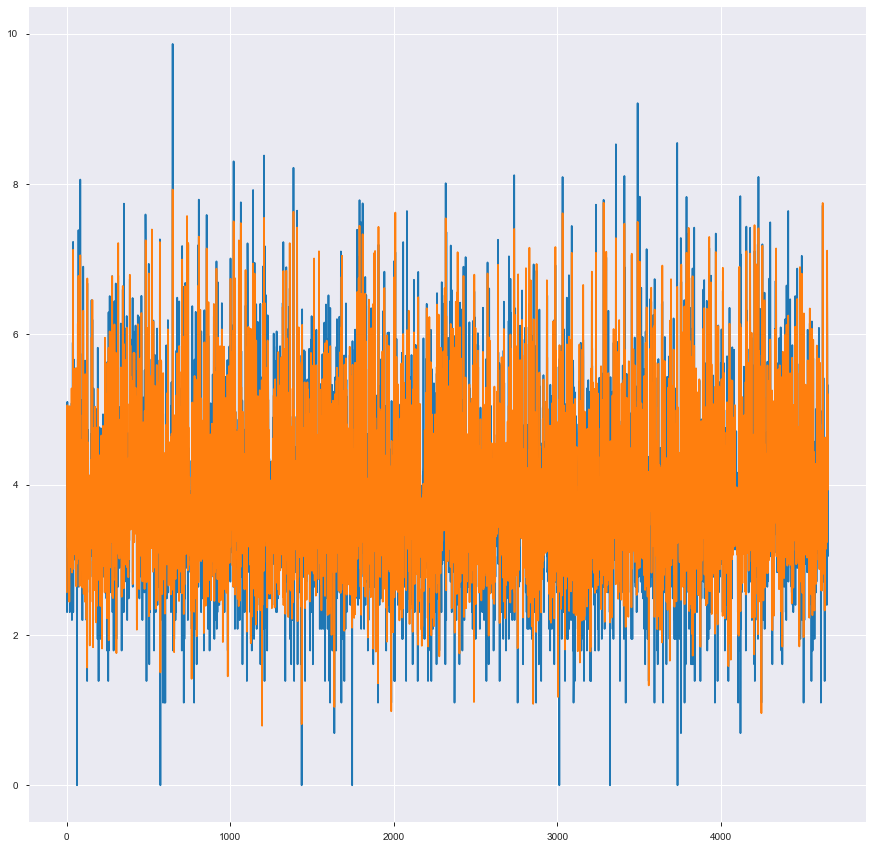

In [27]:
plt.figure(figsize=(15,15))
plt.plot(range(len(y_test)), y_test)
plt.plot(range(len(y_test_predict_xgb_reg)), y_test_predict_xgb_reg)


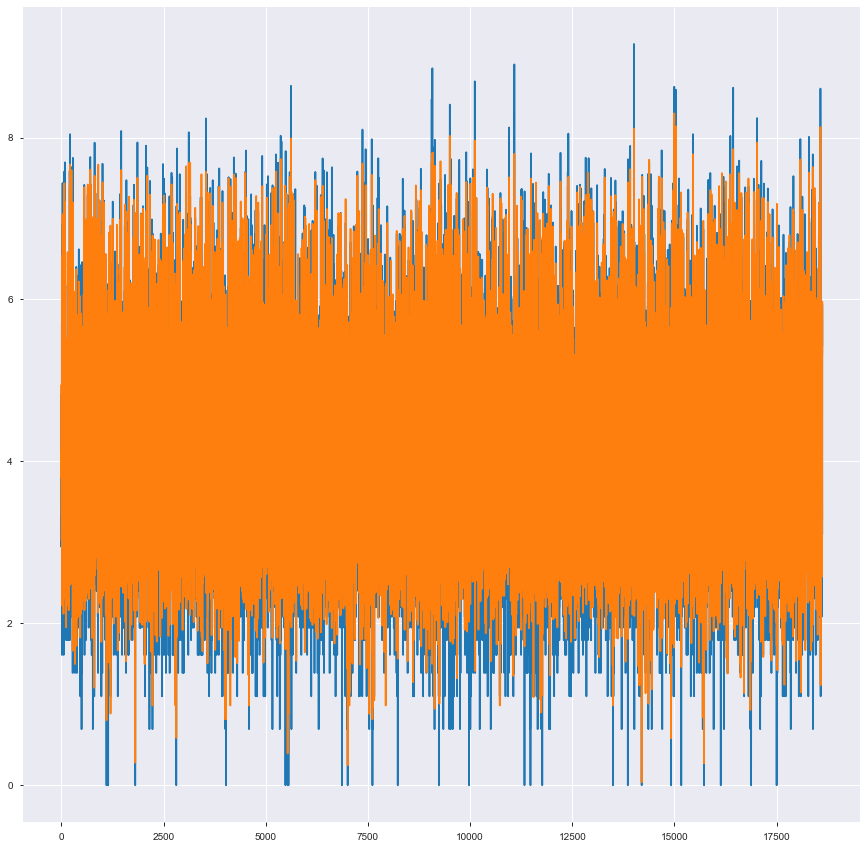

In [28]:
plt.figure(figsize=(15,15))
plt.plot(range(len(y_train)), y_train)
plt.plot(range(len(xgb_reg.predict(X_train))), xgb_reg.predict(X_train))

In [29]:
print('\nFeature_importances:\n', dict(zip(X.columns,xgb_reg.fit(X_train, y_train).feature_importances_)))

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version




Feature_importances:
 {'code_jour_semaine': 0.019719105, 'hour': 0.022657935, 'publication_height': 0.03540064, 'publication_is_video': 0.07459401, 'hashtag_list_count': 0.04710293, 'publication_word_list_count': 0.026910147, 'page_nb_followers_log': 0.5252578, 'edi_lib': 0.17185867, 'publication_type_GraphImage': 0.021165576, 'publication_type_GraphSidecar': 0.055333134}


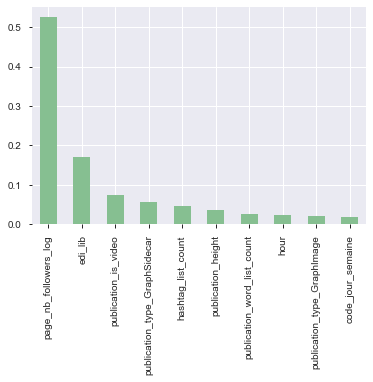

In [30]:
pd.Series(xgb_reg.feature_importances_, index=X_train.columns).nlargest(10).plot(kind='bar',color='#86bf91')

**A FAIRE** : Commentaires des features importances

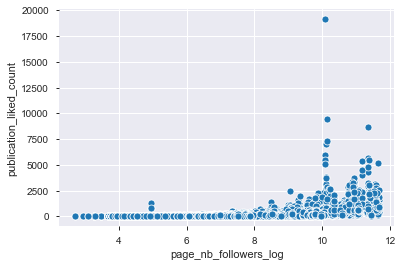

In [31]:
ax = sns.scatterplot(x="page_nb_followers_log", y="publication_liked_count", data=insta_ml_log)

## 13) Découpage des heures en tranche d'heures
Lorsque je regarde le nb de like moyen par heure, je remarque qu'il y a des tranches d'actions. Une plutôt le matin, une autre à l'heure du repas-début d'après-midi, puis fin d'après-mi et enfin fin de soirée. les données statistiques vont en ce sens. C'est pourquoi je voudrais tester l'éventualité qu'un apprentissage suivant la tranche horaire est plus pertinente que simplement l'heure.

In [32]:
insta_ml = insta_ml.assign(tranche_horaire=insta_ml['hour'].map(lambda day: '0_11' if day in [0,11] else (
    '11_15' if day in [11,15] else ('15_18' if day in [15,18] else '18_23'))))

Je relance mon modèle avec la nouvelle variable.

In [33]:
# y pour la Target
y_th= y #th==tranche horaire

X_th=insta_ml[['code_jour_semaine', 'tranche_horaire', 'publication_type', 'publication_height',
                   'publication_is_video', 'hashtag_list_count', 'publication_word_list_count'
                     ,'page_nb_followers', 'edi_lib']] 

X_th[['page_nb_followers_log']]=X_th[['page_nb_followers']].apply(lambda x: np.log(x+1))
X_th['publication_is_video'] = np.where(X_th['publication_is_video']==True,1,0)
X_th = pd.get_dummies(X_th)
X_th.drop(columns=['publication_type_GraphVideo','page_nb_followers'], inplace=True)


X_th_train, X_th_test, y_th_train, y_th_test = train_test_split(X_th,y_th ,train_size=0.80, test_size=0.20)

X_th_train.shape, X_th_test.shape, y_th_train.shape, y_th_test.shape

/usr/local/lib/python3.7/site-packages/pandas/core/frame.py:3509: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/Cellar/ipython/7.8.0/libexec/vendor/lib/python3.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



((18618, 13), (4655, 13), (18618,), (4655,))

In [34]:
xgb_reg = XGBRegressor(objective ='reg:squarederror', learning_rate=0.15, max_depth= 7,min_child_weight= 3,n_estimators = 150)
# fitting the model
xgb_reg.fit(X_th_train, y_th_train)

# predict the response
y_th_test_predict_xgb_reg = xgb_reg.predict(X_th_test)


R2_test =  round(r2_score(y_th_test, y_th_test_predict_xgb_reg),2)*100
R2_train = round(r2_score(y_th_train, xgb_reg.predict(X_th_train)),2)*100 
print('\nR2_score_train', R2_train, '\nR2_score_test', R2_test)

rmsle_test = np.sqrt(mean_squared_error(y_th_test, y_th_test_predict_xgb_reg))
rmsle_train = np.sqrt(mean_squared_error(y_th_train, xgb_reg.predict(X_th_train)))
print('\nrmse_score_train', rmsle_train, '\nrmse_score_test', rmsle_test)

real_rmse_test = np.sqrt(mean_squared_error(np.exp(y_th_test), np.exp(y_th_test_predict_xgb_reg)))
real_rmse_train = np.sqrt(mean_squared_error(np.exp(y_th_train), np.exp(xgb_reg.predict(X_th_train))))
print('\nreal_rmse_score_train', real_rmse_train, '\nreal_rmse_score_test', real_rmse_test)


R2_score_train 87.0 
R2_score_test 79.0

rmse_score_train 0.438381566926402 
rmse_score_test 0.5609408813793711

real_rmse_score_train 125.4951335720667 
real_rmse_score_test 324.45647932406075


### ***########################################################***

### Engineering : Un peu de NLP

## 14) Emoji
1) je crée une colonne qui répertorie les **émojis présents** dans les publications puis je crée une colonne qui indique le **nombre d'émojis** par publications.

In [35]:
import demoji
demoji.download_codes()

... OK (Got response in 0.32 seconds)
Writing emoji data to /Users/eleonore/.demoji/codes.json ...
... OK


In [53]:
dict_emoji2=[demoji.findall(text) for text in insta_ml['text_publication'] ]
list_of_emoj_temp = set([key for dico in dict_emoji2 for key, value in dico.items()] )

In [46]:
def countEmoji(publi):
    list_of_emoj=[hashtag for hashtag in re.sub(r"\w+", r"", publi).split() for h in hashtag if(h in list_of_emoj_temp)]
    return list_of_emoj

insta_ml = insta_ml.assign(emoji_list=insta_ml['text_publication'].map(lambda text: countEmoji(text) ))
insta_ml = insta_ml.assign(emoji_count=insta_ml['emoji_list'].map(lambda emo: len(emo)))
insta_ml.drop(columns=['emoji_list'], inplace=True)

Pas de texte 
 [] 0
Pas de texte 
 [] 0
On est dans la place au Salon "Lire en Poche" à Gradignan. Le stand est installé et fin prêt à vous recevoir ! Ce week-end venez célébrer avec nous le livre de poche ! La librairie reste ouverte aux horaires habituelles. #librairie #libellule #librairieLibellule #livre #livres #book #books #comics #comicbooks #BD #bandedessinee #manga #lireenpoche #livresdepoche #gradignan #cultiverlaliberte #marmande #lotetgaronne #gironde #aquitaine #nouvelleaquitaine 
 [] 0
Elle est là !! Sœur Marie Thérèse est de retour ! Enfin ! Après des années absences, elle nous avait manqué ! #librairie #libellule #librairieLibellule #livre #livres #book #books #comics #comicbooks #BD #bandedessinee #soeurmarietherese #desbatignolles #glenat #humour #marmande #lotetgaronne #aquitaine #nouvelleaquitaine 
 [] 0
C'est la rentrée littéraire ! C'est le moment de se régaler avec les dernières nouveautés ! Et tout est est à la librairie Libellule ! #librairie #libellule #librai

#scienceshumaines #histoire #connerie #librairie #lamemoiredumonde #interforum 
 ['📚', '📖'] 2
­Amis Espagnols, Amis Républicains, Amis de la mémoire du monde,
📚
Ce soir à 18h dans votre librairie préférée, je vous rappelle que Joachim Garcia vient inaugurer le premier rendez vous littéraire autour du thème de la Retirada.
Historien de la période et orateur de grand talent, il vous embarquera pour retracer le parcours des républicains espagnols du début des années trente jusqu’au milieu du XXe siècle.
Ne ratez ce rendez vous.
Sinon vous aurez une seconde chance le mardi 15 octobre toujours à 18H avec Hubert Auque pour son très beau roman, Sébastia, enfant de la Retirada.

Jacky. 📖

#librairie #lamemoiredumonde
#Avignon
#rencontre #commemoration #retirada #exposition #sanguine #espagne🇪🇸 
 ['📚', '📖'] 2
Rencontre avec Amélie Nothomb. 
La rencontre est déjà complète. 
Mais il est toujours possible de venir à la dédicace... On peut déjà penser à quelques cadeaux de fin d'année, le temps pas

#conseildelibraire #pasdelivressanslibrairies #avantlecalendrierdelavent #livresjeunesse #jeuxpourenfants #puzzle #livre #livrestagram #book #bookstagram #paris7 #librairiejeunesse #librairiejeunessejeuxlislà #jeuxlisla #jeuxlislà #chalila 
 [] 0
#jour1 de l’Avant Calendrier de l’Avent chez Jeux Lis Là !
Pour vous aider à préparer les listes de Noël, nous allons vous proposer pendant un mois des sélections thématiques de livres (mais pas que!) : il y en aura pour tous les goûts 😃
Aujourd’hui «Ouvrons nous au monde » avec :
Cartes (édition reçue et augmentée) de À. Mizielinska @editions_ruedumonde 
Voyage autour du monde de Croft et Li @grundjeunesse (@lonelyplanetfr )
Une promenade en Europe de @amelielaffaiteur @laroussejeunesse 
Le grand livre animé de la Terre de Graviou et Baumann @editionstourbillon 
Regarde autour du monde illustretpar Emire Hayashi @grandiravecnathan 
Le Tour du monde de Loup le jeu de @orianne_lallemand Et @eleonore_thuillier @editionsauzou 
Quizz autour du mon

@editionsalbinmichel #victoriamas @victoriamas47  #lebaldesfolles #prixstanislas @tatianaderosnay #dedicace #conference #Entreelivres #verdun #lorraine #meuse #librairie #livres #lecture 
 ['🏆', '❗️', '❗️❗️', '❗️❗️'] 4
RENTRÉE LITTÉRAIRE
Nous vous proposons 3 dates pour vous présenter nos coups de cœur de la Rentrée Littéraire.

Samedi 7 septembre
Jeudi 12 Septembre
Samedi 12 octobre

Dès 19h45-20h

Événements gratuits, sur inscription (date, nombre de personnes)

A très vite pour de belles soirées littéraires !

@editionsalbinmichel @flammarionlivres @auxforgesdevulcain @editionsstock @editions_gallimard @actessud
@robert_laffont
Et d'autres ! 
 [] 0
RENTRÉE LITTÉRAIRE

SORJ CHALANDON
Coup de cœur de Jérôme !

@editionsgrasset #unejoieferoce #sorjchalandon
#RENTREELITTERAIRE #verdun #lorraine #meuse #librairie #livres #lecture 
Dans quelques jours, nous vous annoncerons les dates des soirées littéraires.

Encore un peu d'attente avant de belles surprises... 
 [] 0
DÉDICACE - Samedi 27

#backtoschool #school #kids #schoolyear #schoolready #firstdayofschool #ecole #rentree #rentreedesclasses #cahier #trousse #cartable #paper #pencil #enseignant #étudiant #fourniturescolaire #happy #marseille #igersmarseille #library #papeterie 👍📚📖🖍📝📅📏☀ 
 ['😲', '👍😂', '👍😂', '👍📚📖🖍📝📅📏☀', '👍📚📖🖍📝📅📏☀', '👍📚📖🖍📝📅📏☀', '👍📚📖🖍📝📅📏☀', '👍📚📖🖍📝📅📏☀', '👍📚📖🖍📝📅📏☀', '👍📚📖🖍📝📅📏☀', '👍📚📖🖍📝📅📏☀'] 11
AMOUR TOUJOURS !!! Une idylle naissante et c'est la fête à la librairie 😂❤
#instabook #booklovers #book #livre #livrestagram #librairie #illustration #enfants #children #tchoupi #superhero #friendly #friends #funny #happy #love #people #scoop #marseille #igersmarseille #streetphotography #picoftheday 
 ['😂❤', '😂❤'] 2
COUP DE ❤ ❤ ❤ 
Suite... #coupdecoeur #roman #instabook #instalife #bookface #bookstagram #reads #livre #booklovers #lecturedumoment #instagood #ecrivain #suspense #thriller #marseille #igersmarseille #picoftheday #happy #funny #love 📚📸 
 ['❤', '❤', '❤', '📚📸', '📚📸'] 5
COUP DE ❤❤❤
Prenez un jeune homme très am

#auchatlent #editionszulma #rl2019 #rentreelitteraire 
 [] 0
🌹 Vitrine jeunesse de juin 🌹
Halloween sous le soleil...
#auchatlent #vitrinelibrairie #orange 
 ['🌹', '🌹'] 2
Du 11 au 25 mai, venez découvrir les œuvres originales de Servan, illustratrice de Drôle de journée pour Lola et Pépé chocolat, aux @ztl_editions.fr ! Et on se retrouve jeudi 23 mai à 19h30 pour échanger autour de la lecture confortable en compagnie de Servan et Sandra, éditrice !
#auchatlent #ztleditions #lectureconfortable #dyslexie 
 [] 0
💜 Du nouveau au rayon papeterie 💜
Les cartes et carnets de l'@atelierhappyworkshop font leur entrée à la librairie ! Je vous invite vivement à découvrir leur univers et leur démarche sur leur site...
#auchatlent #atelierhappyworkshop #papeterie #carterie 
 ['💜', '💜'] 2
Fanny, en stage à la librairie, a lu pour vous Petit pays de Gaël Faye :
Gaby, enfant heureux du Burundi, une mère Rwandaise et un père Français, deux parents très différents qui lui ont offert une vaste culture... 

On vous a déjà dit qu’on aimait beaucoup le travail d’@olivier_tallec ???😍😊 ça tombe bien, il y a plusieurs nouveautés qui sont arrivées #oliviertallec #abecebetes #actessudjunior #cestmonarbre #pastel #quelmalpoli #perecastor 
 ['???😍😊', '???😍😊'] 2
Ambiance studieuse à la librairie.
#andreas #isacochet #largentine #futuropolis #dedicacealadin 
 [] 0
Échantillon des sorties de la semaine.
Du bon, du très bon et encore mieux.
#sortiesbd #aladinbd #larentreelitteraire 
 [] 0
A la librairie Aladin on se demande aussi où est Steve ?#oueststeve 
 [] 0
En ce jour de forte chaleur, notre professionnalisme nous a poussé à tester Game of dragon boules dead, le jeu de @davy_mourier !
Fraîcheur et bienséance sont au rendez-vous... ou pas !!
#gameofdragonboulesdead
#davymourier #aladinjoue 
 [] 0
Dédicace en charmante compagnie avec un invité surprise !!
#audemermilliod #casterman_bd  #ilfallaitquejevousledise #ericsagot 
 [] 0
En octobre 2017, nous recevions Aude Mermilliod pour la sortie des ref

#plumedéquinoxe #salondulivre #dédicace #mer #ocean #océarium #oran #histoire 
 [] 0
Marie Verdier était sur @RFI hier pour présenter "Le Tour du monde du français", une des dernières nouveautés de La Librairie Vuibert !

http://www.la-librairie-vuibert.com/livre/9782311102802-le-tour-du-monde-du-francais

#nouveauté #francophone #francophonie #français #languefrançaise #france #voyage #tourdumonde #langues 
 [] 0
Un GRAND merci à toutes et à tous pour votre présence ce soir pour la présentation de nos coups de coeur de la rentrée avec la bibliotheque ! 
#librairie #tournon #tournonsurrhone 
 [] 0
La vitrine se met aux couleurs de la #fetedelascience qui débute demain, le 5 Octobre ! 
#ardeche #tournon #tournonsurrhone #librairie 
 [] 0
Rendez vous dans la jungle avec #JimCurious de Matthias Picard aux @editions2024 #2024 #jungle #ardeche #drome #tournon #tournonsurrhone 
 [] 0
C'est l'éclate à Tournon ! Le loup nous accompagne pour ses 10 ans.
@editionsauzou #loup #tournon #tournonsur

On continue !! Conversations: Yasmina Khadra aujourd’hui a 18 heures dans une librairie bien connue du coté des Docks! #lesdocksvillage #lumieredaout #marseille 
 [] 0
Didier Van Cauwelart à Lumiere d’Aout!!! Bien entouré! #didiervancauwelaert #lumieredaout #marseille #lesdocksvillage #jaimelire #jaiperdualbert 
 [] 0
Passionnant et éclairé !! Didier Van Cauwelaert revient sur « j’ai perdu Albert » #einstein #lesdocks #marseille 
 [] 0
La fête des mères c’etait hier !!! C’est encore possible ! #lumieredaout #fetedesmeres #docks #marseille 
 [] 0
Good Bye Mister Roth! Portnoy et son complexe!!! Grand livre! #lumieredaout #lumieredaout #marseille #lesdocksvillage #jaimelire 
 [] 0
Laissez tout tomber et lisez "la guerre des pauvre" d'Eric Vuillard"
Époustouflant ! 
 [] 0
Essentiel: le fond du port de Joseph Mitchell éditions du sous-sol 
 [] 0
Vendredi 5 février à 18h30
La librairie la charpente à Douai reçoit Charlotte Bienaimé pour son livre "féministes du monde arabe" 
 [] 0
Et encore

❤️Ecrire avec une telle justesse, les petites rancœurs et les lourds fardeaux que la famille nous inflige, c’est du grand art. #nousetionsnespouretreheureux  #lionelduroy @editions_julliard #lexquiselibrairie #rentreelitteraire2019 
 [] 0
❤️ « Les cancéreuses » pourrait être un nom de gang, un peu famélique un peu nauséeux, mais déterminé... Se battre c’est aussi continuer de vivre, et parfois les bêtises sont celles qui ragaillardissent! #unejoieferoce #sorjchalandon @editionsgrasset #lexquiselibrairie #rentreelitteraire2019 
 [] 0
❤️magnifique écriture autour de l’amour de la terre, de l’attachement, du poids des liens... Superbement glaçant! #unebeteauparadis #cecilecoulon @ed_iconoclaste #lexquiselibrairie #rentreelitteraire2019 
 [] 0
#JeromeBouquet en dédicace aujourd'hui à la librairie ! À partir de 14h30. 
#làoùnospasnousmènent #editionsflblb @editionsflblb #dedicace #carcassonne #bd #bandedessinee #romangraphique #librairieindependante #librairie #bullesetcie #comics #comicsbo

NOUVEAU 🄲🄾🄽🄲🄾🅄🅁🅂
.
A l'occasion de la sortie des tomes 3 & 4 de la série Demon Slayer, nous vous proposons de gagner un présentoir aux couleurs du manga !
.
A venir chercher en magasin 💪
.
Pour participer, il suffit :
☝️D'être abonné à la page Instagram @momiechambery
✌️D'identifier quelqu'un que vous n'hésiteriez pas à jeter en pâture aux démons pour gagner ce présentoir !
.
Tirage au sort mercredi 9 octobre, jour de sortie des tomes 3 et 4 de Demon Slayer.
.
Bonne chance a tous !! 🍀
.
.
.
#jeuconcours #demonslayer #kimetsunoyaiba #rôdeursdelanuit #mangagram #instamanga #mangastyle #mangacollection #mangafans #momiechambery #chambéry #tanjiro #nezuko #tanjiroukamado #nezukokamado #demon 
 ['💪', '🍀'] 2
𝕄𝕖𝕕𝕝𝕖𝕪 𝕕𝕦 𝕧𝕖𝕟𝕕𝕣𝕖𝕕𝕚
Retrouvez toutes nos nouveautés de la semaine sur notre Facebook ou en magasin ! 😉📚
.
.
.
#momiechambery #momiemanga #mangashop #mangagram #nouveautesmangas #bandedessinee #bd #comics #nouveautesbd #bédéphile #instalivre #momiebd #pilealire #bookstagram #livrestagram #

C’est vous qui faites la librairie !!! #libraire #livre #livres #lecorbusier #marseillais #architecture #paysage #livrejeunesse #marseille #architectural #architect #archi 
 [] 0
#editionscosamentale #ivryserresarchitecte #lecorbusierarchitecture #citeradieuselecorbusier 
 [] 0
#librairieimbernon #hotellecorbusier #kolektiv318 #restaurantleventredelarchitecte #stefseries #giniebel #citeradieuse #zadagence #mamo #marseille 
 [] 0
#eileengray #lecorbusier #capmoderne #roquebrunecapmartin #unitedhabitation 
 [] 0
[AVIS AUX FANS DE RIFF UN PEU ÉNERVÉS]

Castor Astral+Dave grohl=Joie 
 [] 0
⚠GOULARD DANS LE XXIe SIECLE⚠ 
 ['⚠', '⚠'] 2
https://www.instagram.com/p/B3zvaxNo8PK/?igshid=46i4gng4wzsi 
 [] 0
En ce moment à la librairie: Charlotte Perriand, Le Corbusier, d’autres... 
 [] 0
Le prix Brise Lame 2020 de l’Encre Malouine est attribué à Brice Homs pour Sans compter la neige ( @lesescales ). 
 [] 0
C'est à partir de demain et c'est une cause qui nous tient à coeur. Ensemble, donnons à lir

#rentréelittéraire2019 #rentréelittéraire  #avouequetenmeursdenvie #nileditions #KristenRoupenian #librairieindépendante #librairie #bookcover #bookstagram 
 [] 0
[Rentrée littéraire 2019]
On a lu, on a aimé, on vous conseille : 
Tous les hommes n’habitent pas le monde de la même façon
Jean-Paul Dubois
Editions de l'Olivier

Quel plaisir de retrouver Jean Paul Dubois qui renoue avec l'ironie et la tendresse de ses deux titres précédents, Une vie française et Le Cas Sneijder. L'auteur n'a pas son pareil pour nous faire rire, nous émouvoir en évoquant l'absurdité de toute existence et la barbarie du profit à tout prix. Jean Paul Dubois aime les gens et ça se sent à travers ses personnages aussi fantasques, dingues que profondément humains. Le style est là, foisonnant d’images. 
Paul Hansen est un brave type. Pourquoi ce fils de pasteur croupit-il dans une cellule, à Montréal, avec un Hells Angel ? Rien n'indiquait le passage par la case prison. Et pourtant! En attendant d'avoir la fin de

Est-il possible d'insuffler une âme urbaine à cette cité du désert qu'est Dubaï ? C'est la conviction d'un "urbanologue" originaire d'Alep, ville mille fois millénaire, qui part à la recherche d'un aleph, objet mythique décrit par Borges, qui permettrait de lire la ville dans sa totalité historique, sociale, quotidienne, urbaine... Pour vous, les amoureux des villes, de l'histoire et de la littérature, un roman d'aventures, un roman urbain et politique à découvrir d'urgence ! @camilleammoun @editionsinculte. Je pense que je vous en reparlerai de nouveau très bientôt. Un bonheur de lecture... #Villes #palimpseste #Histoire #malheurarabe #guerre #desert #petrole #urbanisme #memoire #oubli #colonialisme #golfepersique #architecture #emirats #resilience #espaceurbain #ame_urbaine 
 [] 0
Un livre qui raconte la production collective du quotidien populaire, après quarante ans d'une  désindustrialisation et d'une tertialisation qui ont provoqué d'énormes disparités sociales et spatiales. La v

 ['💖', '✉.'] 2
A découvrir en ce moment à  La Libellule 
Sélection BD avec un focus sur les adaptations de roman.
#lalibellulecafelibrairie #romangraphique #bd #instabook #bookstagram  #marabulles #glenatlivres #dargaud #gallimardbd #unecaseenmoins #casterman #futuropolis #sarbacaneeditions #delcourt 
 [] 0
@stablesmusic en concert le 6 novembre à la La libellule ouverture des portes à 19h entrée 8€ (pas de réservation)
Prolongez l'expérience et l'univers du duo anglais musiciens/torréfacteurs
Trois types de café à déguster seul ou à deux 
#lalibellulecafelibrairie #stablescoffee #stablesmusic #bookandcoffe #folkmusic  #concert #concertacoustique 
 [] 0
Reçu au courrier ce matin ! @stablescoffeeco à  déguster en cappuccino, en grand café ou en expresso dès maintenant à @lalibellulecafelibrairie en attendant le concert du 6 novembre.
#bookandcoffe #lalibellulecafelibrairie #coffee #stablesmusic #stablescoffeeco #stablescoffee #folkmusic #concertacoustique 
 [] 0
En souvenir d'André, Mar

#coupdecoeur #sarbacaneeditions #bookstagram #bookstore #jaimemonmetier 
 ['❤️💚💙💛💜', '❤️💚💙💛💜', '❤️💚💙💛💜', '❤️💚💙💛💜'] 4
Tutu tututu Tutu tuuuuu....
(comment ça, vous n'avez pas reconnu ma merveilleuse imitation du générique ?!!) #harrypotter #dobby #ronweasley #hedwige #hermionegranger #hermionegrangercat #harrypotterandthesecretchamber #funkopop 
 [] 0
Giga mega Niffler!
Pop à foison dans notre story du jour =)
#harrypotter #fantasticbeasts #niffler #pop #funkopop #christmas #bordeaux #albumbordeaux 
 [] 0
📚 NEWS !!! 📚
#livres #librairie #librairieindependante #carpentras #vaucluse #provence #avignon #nouveautés #livrestagram #bookstagram #fabcaro #modiano #piketty #legardinier #polar 
 ['📚', '📚'] 2
🤯🥴💗Jim Curious, Mathias Picard, éditions 4048... Waouh quoi...
#bd #bandedessinee #3d #livres #librairie #librairieindependante #carpentras #vaucluse #provence #avignon #comtatvenaissin #livrestagram #bookstagram @matthias.picard 
 ['🤯🥴💗', '🤯🥴💗', '🤯🥴💗'] 3
Pas de texte 
 [] 0
À peine ouverte, 

#bdnet #bdnetrecreativ #bdnetbastille #livrejeunesse #librairiejeunesse #bastille #passagelhomme #paris #lecture #roman #albumjeunesse #ours #bernie #janikcoat #helium #editionshelium 
 ['🐻'] 1
Une délicieuse succession d'instantanés des vacances d'une petite fille que son chat ne quitte pas. Par tous les temps, dans tous les paysages, ils prennent la pause tous les deux, impassibles et toujours vêtus selon les circonstances.
C'est beau, émouvant et drôle à la fois. On en s'en lasse pas...
.
Vacances d'été de Mori aux éditions Hongfei.
.
Dès 3 ans.
.
.
#bdnet #bdnetrecreativ #bdnetbastille #livrejeunesse #librairiejeunesse #bastille #passagelhomme #paris #lecture #roman #albumjeunesse #ete #vacances #chat #mori #editionshongfei #hongfei 
 [] 0
"Du pain, du vin, des oursins" le livre de @nicolasstromboni chez @maraboutcuisine Dispo dès le 3 octobre à #lalibrairiedespalmiers 
 [] 0
DÉDICACE Mardi 6 septembre de 17h à 19h #lalibrairiedespalmiers #dédicace #arianechemin #mariageendouce #ro

MERCI ! Quel samedi magique en votre compagnie si nombreuse, avec le seul regret d'avoir du refuser du monde à l'atelier de Philippe Legendre pour apprendre à dessiner... plein à craquer !

Qu'à cela ne tienne, tous les albums de sa méthode (il y en a plus de 50 à ce jour) sont ou bien à la librairie, ou à la commande. Noël, les dinosaures, le cirque, les princesses... tous les thèmes qui passionnent vos enfants en ce moment sont couverts !

Samedi prochain, nous partons ... en Beauce, certes, mais d'il y a 2000 ans... Soyez au rendez-vous pour une nouvelle rencontre chaleureuse et enrichissante, détaillée sur notre site internet (lien en bio)

#MéthodeLegendre #PhilippeLegendre #Albumsjeunesse #Dessin #Unepageàcrire #Librairieindépendante #Librairierurale #Librairie #Janville #Toury #EureetLoir #Beauce #CoeurdeBeauce #RégionCentreValdeLoire #Instalivres #Instabooks #Bookstagram #Livres #Books 
 [] 0
🦜Notre exposition Quilling est prolongée d'une semaine, jusqu'à vendredi prochain ! 
A

Dédicace en cour ! Merci @marueparachbe pour ce bel hommage aux librairies ! #marueparachbé #editionsalternatives #librairiegrangier #librairieindependante 
 [] 0
Un immense merci à @peter_farris, aux @editions_gallmeister et à @delphinedeloisy pour cette superbe rencontre ! 
 [] 0
Les activités reprennent au rayon jeunesse ! Rendez-vous samedi 5 octobre de 15h à 17h30 pour un atelier origami animé par les libraires. De 6 à 10 ans, gratuit. Pensez à vous inscrire, les places sont limitées ! Jeunesse@librairie-grangier.fr #librairiegrangier #ateliersenfantsdijon 
 [] 0
( Concours clôturé)Félicitations à la gagnante @maryboop25 : le livre est à retirer à partir de lundi à l'accueil de la librairie, ou aujourd'hui entre 17h et 19h lors de la dédicace d'Achbé. 
À l'occasion de la venue de Ma rue par Achbé à la librairie Grangier vendredi 20 septembre, on vous fait gagner son délicieux livre dédicacé. Pour participer, c'est facile : être abonné à notre compte @librairie.grangier , aimer cet

Un bon bouquin en sirotant Le Thé de La lectrice : Thé vert Sencha Chine, cannelle, écorce orange arôme naturel de caramel, cannelle, orange et cassis 🎶.... #lireetboireduthe @librairieleclectique #thedelalectrice 
 ['🎶....'] 1
NOUVEAU..... 🎶🍵 📚. Dans la librairie le parfum du THÉ DES LIBRAIRES se mêle à celui des livres... Nouveautés délicieuses à L’Eclectique... 6 thés des libraires : « thé de la lectrice », « so british » , « au pays du soleil levant », « salons littéraires », « a livre ouvert », « comme un thé russe », et une infusion du soir « page blanche ».... #thedeslibraires #saintmaurdesfossés @librairieleclectique #the #theetlitterature 
 ['🎶🍵', '🎶🍵', '📚.'] 3
@librairieleclectique 
 [] 0
Très joli Moment musical à la librairie 🎶 Merci le Duo Palissande @librairieleclectique #duopalissandre #concertalalibrairie 
 ['🎶'] 1
🎶🎶🎶À tout à l’heure 11h30 avec le Duo Palissandre pour un concert-dédicace... ce matin il pleut, dans la Librairie, à l’abri  parmi les livres l’harmonie des

Auf der Suche nach dem interessierten Leser und Buchkäufer! 
Wir sind eine allgemeine deutsche Buchhandlung mit Schwerpunkt Literatur, Philosophie, Geschichte, Deutsch für Ausländer und Kinder- und Jugendbuch! 
Wir verkaufen und bestellen alle lieferbaren Bücher in Deutschland zum gleichen deutschen Preis!! Wir kümmern uns gerne auch um Bibliotheken und Schulen, aber wir sind keine reine Schulbuchhandlung und können nicht jeden vehement und teilweise sehr unfreundlich geforderten Service von Schulen, die oft Bestellungen erst nach Monaten bezahlen, erfüllen!

Wir brauchen treue, kaufkräftige und freundliche Kunden, die unsere Auswahl und unseren Service schätzen und uns unterstützen, als  einzige letzte unabhängige deutsche Buchhandlung in Paris/Frankreich weiterhin bestehen zu können!! #librairieallemande #paris #quartierlatin #bücher #livres #kaufen #acheter #schulen #ecoles #france #frankreich #allemagne #deutschland #kunden #clients #lesen #lire #service #bestellungen #commandes 
 

#librairiericher #librairie #richer #coupdecoeur #bookstagram #féminisme #sexualité #essai #jouir #sexualité #sexuality #étude #livre #angers #vendredilecture @editionsladecouverte @5tarmakl 
 ['❤', '❤'] 2
🔸RENCONTRE🔸Rendez-vous demain (vendredi 11 octobre) à 18h pour une rencontre autour de la thématique du zéro déchet.
~
S’appuyant sur des retours d’expérience en France et à l’étranger et rythmé par de nombreux témoignages, ce guide propose une vision complète et ambitieuse de la révolution à opérer pour mieux gérer nos déchets.
L’association Zero Waste France analyse toutes les opportunités ou obstacles que peuvent rencontrer les différents acteurs des territoires au cours de leur démarche Zéro Déchet : responsabilités, coûts, emplois, etc.
Cet ouvrage s’adresse notamment aux futurs candidats et candidates aux élections municipales, mais aussi à toutes celles et à toutes celles et à tous ceux qui souhaitent s’impliquer à leurs côtés.
L’association Zero Waste France a pour mission de

 ['💥’', '💥', '💝', '💝', '📚', '👇😃', '👇😃'] 7
💥C’est parti ! 💥
Pour fêter la fin de l’année, on vous propose une 💝OFFRE EXCEPTIONNELLE 💝
Pour 2 livres achetés par commande, 1 livre surprise vous sera offert📚
👨🏻‍💻 Pour découvrir notre catalogue et commander, 
Cliquez ici 👇😃
➡️LIBREIZHART/AMAZON
https://www.amazon.fr/s?ie=UTF8&me=A2Q62ZDRLTOZRC&page=1 
 ['💥’', '💥', '💝', '💝', '📚', '👇😃', '👇😃'] 7
💥C’est parti ! 💥
Pour fêter la fin de l’année, on vous propose une 💝OFFRE EXCEPTIONNELLE 💝
Pour 2 livres achetés par commande, 1 livre surprise vous sera offert📚
👨🏻‍💻 Pour découvrir notre catalogue et commander, 
Cliquez ici 👇😃
➡️LIBREIZHART/AMAZON
https://www.amazon.fr/s?ie=UTF8&me=A2Q62ZDRLTOZRC&page=1
📖Le petit morceau de conscience qui me restait s'évanouit. Je pris l'enveloppe et la glissai dans ma serviette. Elle heurta mon pistolet, un Heckler & Koch USP bourré de ses quinze balles neuf millimètres. Je me levai, le juge ne me tendit pas la main, je fis une courbette et sortis de son bureau. L'as

Woodstock, le plus célèbre des festivals fête ses 50 ans. Nous vous proposons une sélection livres, vinyles et CD autour de ce passionnant sujet. La Saline Royale d'Arc et Senans propose également une expo sur Woodstock ! Leurs superbes jardins sont aussi décorés sur le même thème. #woodstock #50thbirthday #festival #music #peace #love #book #bookstagram #librairieforumbesancon #bookstore #recordstore #salineroyale #exhibition #exposition #crosbystillsnashandyoung #janisjoplin #jimihendrix #1969 #vinylrecords #vinylcollection #slyandthefamilystone #summer #santana #creedenceclearwaterrevival 
 [] 0
Notre sélection lectures de l'été : Christian Garcin, Tanguy Viel, ''Travelling'' chez JC Lattès. #lectures #summer #librairieforumbesancon #tanguyviel #christiangarcin #travelling #novel #jclattes 
 [] 0
Nous participons à l'opération Donnez à Lire ! Le principe est simple :
Vous choisissez un livre jeunesse dans la librairie, vous l'achetez, et vous le mettez dans notre coffre. Celui-ci se

Pas de texte 
 [] 0
Quand tu as le plaisir et l’honneur de recevoir Marie Darrieussecq dans ta nouvelle Librairie d’Outremont ! 
 [] 0
Pendant ce temps au lancement d'Audrey Wilhelmy. 
 [] 0
Afin de préparer le gros changement on en effectue un petit .... 
 [] 0
On prépare la rentrée ... 
 [] 0
Tellement hâte de le commencer !!!! 
 [] 0
Une super bd pour l'été #espritducamp #lounak 
 [] 0
Promis nous n'ignorons pas vos appels! Notre téléphone, lui, par contre, a décidé de nous abandonner... Mais nous sommes sur le coup! 💪 En attendant, envoyez nous des mails à contact@lesmodernes.com (Ou même des lettres si le cœur vous en dit) 
 ['💪'] 1
Le week-end écoféministe du @magasin_des_horizons continue sur nos tables 👀 @editions_cambourakis
#lesmodernes #grenoble #librairie #livrestagram #instalivre #écoféminisme #lemagasingrenoble 
 ['👀'] 1
Riez, lisez, et faites plein d'autres choses, c'est bon pour la santé! #lionelkoechlin
#lesmodernes #grenoble #librairie #livrestagram #instalivre #kamas

C'EST LUNDI ON LIT
COUP DE COEUR PASSERELLES ❤
Gilles a des souvenirs très vifs et très précis de son enfance, dans la France des années 70. Pourtant en 1975, rien...
Mais c'est un Rien qui ressemble à celui de Louis XIV noté le 14 juillet 1789, car en réalité cette année là le ciel est tombé sur la tête de ce gamin aux yeux bleus, qui voudrait bien ne plus être "filliste", ne plus être le fils du directeur de "lusine" de la ville, ni peut-être le fils de celle dont le père est mort en déportation...Pour cela il est prêt à tout, même à donner à deux camarades l'adresse de son.professeur de maths pour lui envoyer une lettre antisémite,  une mauvaise blague qu'il va chasser de sa mémoire jusqu'a ce qu'un ancien camarade lui envoie un mail lui rappelant les faits.  Le narrateur va alors tenter de démêler l'écheveau du passé, tirant sur des fils qui n'en finissent plus de le relier à son  enfance , dans un jeu fragile de souvenirs qui nous bouleverse par sa nostalgie assumée et la force d'

#zeugmalibrairie #zeugma #librairie #bookshop #bookseller #librairiezeugma #bookstore #comics #bd #bandedessinee #jourferie #libraire #montreuil #montreuilzoo #popcorn #movie #cinema #salch #editionslesreveurs #bookphotography #photobook #livrestagram #livresaddict 
 ['💖'] 1
"Si le savoir est une arme, soyons armés, car sans lui nous sommes désarmés" @keryjamesofficial @les_editions_de_loeil
Merci à nos petits oisillons ❤️ #gameofthrones .
.
.
.
.
.
.
.
.
.
#librairie #zeugmalibrairie #librairiezeugma #photography #bookshop #bookstore #malicksidibe #savoir #culture #jeunesse #banlieue #Montreuil #maville #narvalo #narvali #bookseller #bookstagram #livre #livresaddict #bookphotography #keryjames #childhood #gun #bookobsessed #libraire #librairiedu93 #seinesaintdenis #art #montreuilzoo 
 [] 0
Merciiii @metauxlourds pour ton intervention ! 😍😍😍 Et ton super cadeau 😊
.
.
.
.
.
.
.
.
.
.
.
#photobook #sex #sexy #femme #woman #sextoy #passagedudesir #women #corps #body #zeugmalibrairie #montr

Nous vous avions promis de belles surprises, en voici une qui devrait vous plaire.
La librairie est un lieu de jolies rencontres :
Une auteur  Francoise Dorn, une sophrologue Nadine Lavis, une cliente Myriam Darzacq, propriétaire du Domaine de Paguy, Pauline Castillo  fondatrice de Niwa Tea et deux libraires....
"Papoti Papota" et voici qu'une nouvelle aventure se profile à l'horizon.

Le dimanche 20 Octobre nous organisons 
au Domaine de Paguy une après-midi " Détox, Relax & Tea " (10€ par  personne) de 14h à 17h.

En voici le programme : 🥣 Initiation à la sophrologie 🥣Conférence de Françoise Dorn autour de sa nouveauté "La magie des synchronicités" paru aux Editions Jouvence 🥣 Goûter et dégustation de thé

Les réservations sont d'ores et déjà ouvertes auprès de :

Librairie Papeterie Lacoste  05.58.75.01.75
Domaine de Paguy  07.86.48.00.03 🍀 Venez nombreux au Domaine de Paguy à Betbezer d'Armagnac près de Mont-de-Marsan 🍀

#domainedepaguy #librairie_papeterie_lacoste
#sophrologie #re

Les ateliers continuent pendant les vacances 👩🏼‍🎨 à la librairie Autrement de Saint Denis. 
Aujourd’hui, Murielle notre animatrice, proposait les bases du sketching et un atelier Manga ✏️ et il y avait du monde! ✂️ Vous avez réservé votre Atelier Créatif by @LibrairieAutrement ? 📍Petit rappel des dates des divers Ateliers d’ Octobre : - Le 05.10 : de 13h30 à 15h30 Atelier Décopatch Halloween - Le 12.10 : de 13h30 à 17h30 Atelier Peinture à l’huile - fleurs tropicales
Billetterie: https://www.weezevent.com/atelier-peinture-a-l-huile-theme-floral
- Le 19.10 : de 13h00 à 15h00 Atelier Sketching - Les bases du dessin
Billetterie: https://www.weezevent.com/atelier-sketching-les-bases-du-dessin
- Le 19.10: de 15h30 à 17h30 Manga Chibi
Billetterie: https://www.weezevent.com/atelier-manga-chibi-et-bd
- Le 26.10 : de 13h00 à 15h00 Perle à repasser enrouleur écouteur Halloween
Billetterie: https://www.weezevent.com/atelier-perle-a-repasser-enrouleur-ecouteur
- Le 26.10: de 15h30 à 17h30 Perle à 

#homemade #foodporn #dejeuner #caferestaurant #cake #patisserie #tarte #cheesecake #carrotcake #mahalepi #crumble #rhubarbe #sansgluten #glutenfree #vegan #vegetarien #artisanal 
 [] 0
Du 17/10 au 20/11, nous participons, cette année encore, à la très belle initiative "Donnez à lire". Si vous le souhaitez, vous pouvez ajouter un livre à vos achats (à Croix ou à Villeneuve d'Ascq) et nous le confier. Il sera offert à un enfant ou adolescent accompagné toute l'année par le Secours Populaire.

#librairie #livre #croix #villeneuvedascq #donnezalire #secourspopulaire #librairieindépendantes #slf 
 [] 0
Jeudi 17 octobre 2019 à 20h, les équipes de la librairie Les Lisières et d'Inter Caves Croix vous invitent à une soirée mexicaine !
Au programme : découverte de romancier.e.s mexicain.e.s et dégustation de tequila et de mezcal (entre autres...!) Participation : 8€/personne
Sur réservation uniquement au 03.20.80.21.20 ou au 03.20.72.76.08

#librairie #livre #croix #villedecroix #intercaves #me

Écrire de jolies cartes pour dire... Je pense à vous, oui. Mais avec l'humour de @amandinepiu aux éditions de Mai.  #cartespostales  #illustration  #humour  #librairies 
 [] 0
Une petite merveille ❤️ #meesoo_fr #ungrainaparis #monin #meesoo_tiramisu 
 [] 0
Nouveau bijoux parmi  nous!! 😍 #monin #ungrainaparis #meesoo_tiramisu 
 ['😍'] 1
Je ne sais pas pour vous , mais je me ferai bien un ptit dej 🤪 
 ['🤪'] 1
Venez aromatiser vos lattes et chocolat  avec nos nouveaux sirops 😍 #monin #monbana 
 ['😍'] 1
Je vous attend pour le petit déj 😍 !!! #monbana #ungrainaparis #monin 
 ['😍'] 1
Pas de texte 
 [] 0
Pas le temps à la maison ? On l’a fait pour vous 😍 
 ['😍'] 1
Venez faire le plein de vitamine !!😍 
 ['!!😍'] 1
Monbana on aime pas , on adore !!!! 😍#monbana #ungrainaparis #monin #barista 
 ['😍#'] 1
#monbana #ungrainaparis #monin 
 [] 0
Samedi @mathou_cdh sera à la librairie à partir de 14h pour dédicacer son joyeux agenda 2020 et le joyeux calendrier 
#mathoucrayondhumeur 
#dedicace 
#chartron

#millepetitsriens @actessud #babel #romanpoche #parutionpoche #segregation #racisme #roman #netirezpassurloiseaumoqueur #harperlee #litteratureamericaine #librairieindependante #librairiedesbatignolles #librairieparis17 #smallgreatthings 
 [] 0
My absolute darling de Gabriel Tallent.

Choc garanti.
Un premier roman prodigieux qui vous bouleversera, vous déconcertera tant par l’atmosphère qui y règne que par une héroïne inoubliable.

Turtle 14 ans vit avec un père abusif.
Comment s’extrait-on d’un univers si toxique?
Jacob sera peut-être la personne ressource qui la sauvera.

Une grande œuvre à lire absolument.

#myabsolutedarling #gabrieltallent @editions_gallmeister #poche #livre #bookstagram #livrestagram #rentreelitteraire2018 #chefdoeuvre  #premierroman #lecture #librairie #librairiedesbatignolles #romannoir #adolescence #nature #instabook #instalivre #books #book #relationperefille #inceste #violence #romanamericain 
 [] 0
Isidore et les autres de Camille Bordas. 
Un roman attacha

Il trône fièrement au côté de ses comparses, le voici le nouveau Pascale Bressan ! "Les légendes de Saugeac", publié chez @pbfeditions un nom évocateur qui donne envie de se pelotonner dans un plaid, une tasse de thé à la main ou bien de se balader en forêt le tout pour profiter au mieux de l'automne. Une lecture parfaite en cette saison qu'on a hâte de découvrir et dont on attend impatiemment votre avis ! 😌
#alivrouvert #Charonne #Voltaire #Paris11 #librairie #pascalebressan #automne #légendes #nouveauté #sorciers 
 ['😌'] 1
On vous a dit qu'on aimait la pluie ? 😏 Oui, on radote c'est vrai. Mais que voulez-vous, Cannelle aime tant l'automne qu'elle a voulu sortir profiter des flaques d'eau. On en a donc profité pour immortaliser ce moment ! Par ailleurs, on vous laisse imaginer les traces de pattes sur le parquet... 😳 
Cannelle vous réserve encore bien des surprises. 🤤 On vous souhaite d'autant vous amuser et de notre côté on va sortir la serpillière ! ☔ 
P.S : on vous laisse deviner c

Les #48hbd c’est parti ! Retrouvez une sélection de #bandesdessinees à seulement 2€ ! Nous avons aimé : #lesbeauxétés @dargaud et #latelierdessorciers @pika_edition ! On vous attend ! #librairiesfontaine #avenuekleber #paris16 #fetedelabd 
 [] 0
Un beau soleil à la librairie fontaine Kleber.  #librairieindépendante  #sunnyday  #avenuekléber  #librairiefontaine  #paris16 
 [] 0
Notre conseil de #livrejeunesse pour passer une douce semaine #litteraturejeunesse #babar #zephir @hachettefr #leconseildumercredi😉 
 ['#😉'] 1
Venez découvrir notre #sélection de romans chez @lillycharleston ! Ils possèdent un choix éditorial varié et nous proposent souvent de très belles pépites littéraires. Notre dernier coup de coeur en date est pour Reste avec moi... nous en avons eu le coeur en miettes. C'était sublime. #editeurdetalent #librairiefontaine #fontainevilliers 
 [] 0
Découvrez notre table dédiée au #nouvelanchinois avec @editionspicquier ! Beaucoup de coup de coeur et de belles découvertes. #fon

#victoiredechangy #marineschneider #kintsugi #ours #japon #litteraturejeunesse #librairiejeunesse #librairierecrealivres #album #book #instabook 
 [] 0
# HEURE DU CONTE #

Le pigeon sait presque tout mais à la question « Combien font 2+2 ? » il fait moins son malin. Dans la sélection de l’heure du conte de ce samedi « Le pigeon doit aller à l’école ! » de Mo Willems publié aux éditions Kaléidoscope. 
#heureduconte #mowillems #editionskaleidoscope #lecoledesloisirs #pigeon #librairiejeunesse #librairiejeunesse #librairierecrealivres #book #instabook 
 [] 0
# BRADERIE #

Aujourd’hui c’est la braderie du Mans et il y a de bonnes affaires à réaliser à Récréalivres. 
#braderie #lemans #lemansmaville #ofcourselemans #librairiejeunesse #librairierecrealivres 
 [] 0
# MARIE SELLIER #

Samedi dernier nous avions le plaisir d’accueillir Marie Sellier à la librairie pour une lecture musicale de l’album « L’Afrique petit Chaka ». Une journée magique en compagnie d’une grande dame de la littérature

#ultimex #zep #coryn 
 [] 0
Les Zola
Derrière les grands hommes se cachent le plus souvent des femmes fortes qui les motivent, les aiment et les poussent à accomplir ce qu'ils pensaient impossible. Zola, le père du naturalisme, est de ceux là et son succès n'en serait pas un sans Alexandrine qui contre vents et marées le soutint dans ses épreuves et dans ses faiblesses. Le trait d'Alice Chemama souligne parfaitement le récit de Méliane Marcaggi. Cette biographie d'Émile Zola n'a pour but que de placer dans la lumière celles qui se sont sacrifiées dans l'ombre de l'écrivain. 
Le coup de ❤ de Laurent 
 ['❤'] 1
Instant indé 🤯
.
On ne saurait guère décrire l’essence artistique qui investi les œuvres de la maison d’édition Le Dernier Cri, alors on vous laisse découvrir ça par image.
.
« Le Dernier Cri est un éditeur underground marseillais de livres sérigraphiés, spécialisé dans l'image subversive et graphique, communément nommés graphzines fondé à Paris en 1993 par Caroline Sury et Pakito 

#montagne_my_passion #montblanc #annecy #ecrins #chamonix #montagne #montagne_my_life #montagnedespyrenees #art #librairiedesalpes #librairie #ruedeseine #paris #argentique 
 ['🍂'] 1
L’exposition Ciels de montagne dans le cadre de @photosaintgermain ouvre le 5 novembre, venez nombreux au vernissage. -
🏔️ www.librairiedesalpes.com 🏔️ -
-
-
-
#photosaintgermain #saintgermain
#montagne_my_passion #montblanc #annecy #ecrins #chamonix #montagne #montagne_my_life #montagnedespyrenees #art #librairiedesalpes #librairie #ruedeseine #paris #argentique 
 [] 0
Une photographie de la Librairie des Alpes dans son bureau ? Tout le monde en rêve non ? -
🏔️ www.librairiedesalpes.com 🏔️ -
-
-
-
#bureau #startup #décoration #deco 
#montagne_my_passion #montblanc #annecy #ecrins #chamonix #montagne #montagne_my_life #montagnedespyrenees #art #librairiedesalpes #librairie #ruedeseine #paris #argentique 
 [] 0
Informations en MP !
🏔️ www.librairiedesalpes.com 🏔️ -
-
-
-
#sculpture #montagne_my_passion #mon

La rencontre a commencé ! Venez déguster des vins naturels de la sélection des glou guides 1 et 2 aux éditions @editions_cambourakis et rencontrer les auteurs ! 
 [] 0
✍Rencontre✍

Il y a deux ans, Gaspard Gantzer (La politique est un sport de combat, Fayard, 2017) croyait alors avoir tourné la page de la vie politique en créant une entreprise. 
C’était sans compter sur Paris, la ville où il est né, qui s’est rappelée puis imposée à lui.
C’est pour répondre à cet appel qu’il a fondé le mouvement Parisiennes, Parisiens et qu’il est parti à la rencontre des habitants du Grand Paris pour échanger librement avec eux sur les sujets qui les préoccupent.
Ce livre est le fruit de ces rencontres, de ces débats, dont sont nées spontanément des idées nouvelles pour Paris. Plus qu’un essai sur l’état de Paris ou un programme politique, il s’agit d’un état des lieux de Paris et d’un inventaire des rêves des Parisiens.

Venez rencontrer et échanger avec Gaspard Gantzer le samedi 6 septembre à la lib

Des ronds, des carrés, du bois ...et de l’imagination #jouet #jouetenbois #couleurs #histoire #jouer #construire #librairieamstramgram 
 [] 0
Timing parfait #livre #livreanimé #tirettes #rabats #roue #fenêtres #maison #cachettes #surprises #mystere #ambiance #fantômes #clotildeperrin #seuiljeunesse #librairieamstramgram 
 [] 0
Sourires et éclats de rire assurés ! Trois albums-culte réunis dans un coffret collector et un inédit génial !!! #lecasting #coffret #monchat #gillesbachelet #seuiljeunesse #cadeau #ideecadeau #culte #pourtous #humour #décalé #coupdecoeur #rireauxéclats #librairiejeunesse #librairieamstramgram 
 [] 0
Joli jeu d’équilibre en bois d’hévéa. Attention de ne pas faire tout faire tomber, ça bascule !!#jeu #jouetenbois #boisdhévéa #peinturesaleau #respectueuxdelenvironnement #beau #malin #kids #kidsroom #deco #petitesmains #librairieamstramgram 
 [] 0
L’automne ... saison idéale pour faire un joli herbier 🍁🎄🍂#herbier #automne #saison #feuilles #feuillesdautomne #activit

@posyposy1952 @editionsdenoel #cassandradarke #romangraphique #bandedessinee #livre #bookstagram #librairie #bookshop #letracteursavant #librairieletracteursavant #saintantoninnobleval #tarnetgaronne #polar #culture #librairieindependante 
 ['🚜❤', '🚜❤'] 2
Gardien de temple... 😸 
#nofilter #sansfiltre #cat #chat #saintantoninnobleval #chatnoir #midiquercy #occitanie 
 ['😸'] 1
17 chapitres, 17 moments de tension extrême où l'autrice nous fait ressentir à quel point la vie est fragile et belle! Coup de tracteur 🚜❤ !
"I am I am I am" de Maggie O'Farrell, éditions Belfond.
@editionsbelfond 
Merci à @chiche.sarah pour le coup de projecteur sur ce livre. 😉 
#livre #coupdecoeur #coupdetracteur #iamiamiam #maggieofarrell #editionsbelfond #librairie #letracteursavant #librairieindependante #saintantoninnobleval #midiquercy #Occitanie #librairieletracteursavant #tarnetgaronne #bookstagram 
 ['🚜❤', '🚜❤', '😉'] 3
Merci à vous d’être venus aussi nombreux hier soir. Et merci à Florian Besson pour cett

#legenreurbain #voyagedumarquepage #levoyagedumarquepage #velo #bicyclette Le marque-page a décidé de repartir explorer les villes et le monde avec son vélo à l'intérieur des livres ! Ce qui, pour un marque-page, est somme toute l'endroit idéal. #episode2, on se réchauffe avec Julien Blanc-Gras, "Désert", @livredepoche 
 [] 0
#legenreurbain #voyagedumarquepage #levoyagedumarquepage #velo #bicyclette Le marque-page a décidé de repartir explorer les villes et le monde avec son vélo à l'intérieur des livres ! Ce qui, pour un marque-page, est somme toute l'endroit idéal. #episode1, aujourd’hui on s'évade avec Darran Anderson dans "les villes imaginaires" chez @editionsinculte 
 [] 0
#legenreurbain #Polar #Kebab
Merci à @johannzarca  pour ce beau moment de partage littéraire et bravo à Alexis Thomas, notre apprenti (le beatnik en haut à droite qui veut ressembler à Maxime Le Forestier sortant de la maison bleue), qui a mené cette soirée de main de maître.
- "Braquo sauce samouraï par le Mec

Une librairie un samedi d’août : détails #decodelibraire #librairie #librairieindependante #librairielesbeauxjours 
 [] 0
⭐️ « Toute sa vie, il nous a fait chier », dit le frère de la narratrice devant le corps de leur père à la morgue de l’hôpital. Chez Anne Pauly, on ne se tient pas bien et c’est de famille. Avec une verve, un sens du contraste et du tragi-comique percutants, elle fait le portrait de ce père « gros déglingo », violent et tendre, colosse fragile et ivrogne sentimental. De lui, elle a bien hérité ce petit côté punk et vulnérable, cet humour décapant qui pulvérise la bienséance, cette poésie qui irriguent ce texte mal coiffé et infiniment juste. #rentreelitteraire2019 #coupdecoeur #avantquejoublie #annepauly #editionsverdier #instalivre #bookstagram #librairie #librairieindependante #librairielesbeauxjours 
 ['⭐️'] 1
Un roman doux, qu’on aime retrouver, qu’on n’aime pas avoir terminé, dont les personnages vous manquent. Une belle méditation sur l’amour, l’amitié, la lib

La dédicace de Winoc pour son dernier album "De mémoire", c'est ce samedi 12 octobre dès 15h ! 
 [] 0
YESSS !
Gabriel TALLENT est arrivé à Paris hier !
Il sera à la librairie MARDI 15 OCTOBRE à partir de 17h !
(Discussion à 18h et traduction assurée par Catherine des Éditions Gallmeister)
#autempslire #gallmeister @gabriel_tallent #gabrieltallent #myabsolutedarling #paris #lille #lomme #lambersart #rencontre #dédicace #livre @editions_gallmeister 
 [] 0
Trois libraires en pleine relecture avant la venue exceptionnelle de leurs trois invités ! Qui se cache derrière quel roman ? Devinez et tentez de gagner un fantastique badge Iconoclaste !
@ed_iconoclaste @matpalain #salegosse #mathieupalain #cecilecoulon #unebeteauparadis #rentréelittéraire #centmillionsdanneesetunjour #jeanbaptisteandrea #autempslire #lille #lomme #lambersart #lillemaville 
 [] 0
Jeudi 3 octobre : parution de My Absolute Darling dans la collection Totem aux Éditions Gallmeister.
Mardi 15 octobre de 17h à 19h : Gabriel

La semaine prochaine, nous vous attendons en masse pour notre rencontre avec @sofiaaouine autour de son livre #rhapsodiedesoublies à partir de 18h @lamartiniere.litterature #librairie #party #barbès #abbesses ⚡️⚡️⚡️ 
 ['⚡️⚡️⚡️', '⚡️⚡️⚡️', '⚡️⚡️⚡️'] 3
C’est l’heure !! @editionsthierrymagnier 
 [] 0
A ce soir ! A partir de 18h ✨🥂✨ #talismans #michaelcailloux @editionsthierrymagnier #party 
 ['✨🥂✨', '✨🥂✨', '✨🥂✨'] 3
Mercredi prochain à partir de 18h nous sommes heureuses de vous conviez, petites et grands à rencontrer @editionsthierrymagnier et @michaelcailloux autour de la sortie de Talismans : splendeur rêves et merveilles au rendez vous ✨✨✨ 
 ['✨✨✨', '✨✨✨', '✨✨✨'] 3
Le jeudi 10 octobre nous vous attendons nombreuses et nombreux autour de @loohuiphang et @bertrand_belin pour une soirée magique où nous fêterons ensemble la sortie du roman L’Imprudence @actessud ⚡️🌟⚡️ 
 ['⚡️🌟⚡️', '⚡️🌟⚡️', '⚡️🌟⚡️'] 3
En octobre à la librairie, nous sommes heureuses d’accueillir Jean-Noël Orengo pour fêter l

Pendant les vacances on en profite pour rendre visite aux collègues libraires : aujourd’hui à  @lasoupedelespace de #hyeres dont on avait beaucoup entendu parler, un très beau lieu plein de couleurs, le paradis pour les enfants, avec aussi une petite mais qualitative sélection de livres pour les parents. En plus, on peut y trouver tout plein de jeux, de sublimes illustrations originales en vente (on les veut !), et tenez-vous bien : au sous-sol, une petite épicerie tout en vrac #zerodechet bravo ! La librairie à visiter si vous êtes en vacances dans le #var d’autant que le centre-ville est très agréable et la mer Méditerranée à seulement 10 minutes 🏝 #librairie #libraire 
 ['🏝'] 1
Aujourd’hui la barre d’ouverture de la porte est devenue brûlante : alors, on a sacrifié un ruban de GRS pour la recouvrir et réduire la chaleur sur vos mains. On n’a pas trouvé de meilleure idée ! Et n’oubliez pas : la librairie est climatisée - un investissement qu’on ne regrette pas 🙏 #librairie #canicule 

#lintranquille #libraire #bookshop #besançon #grandbesancon #rentreelitteraire2019 #rentreelitteraire #litteraturefrancaise #litterature #roman #ingridseyman #editionsphilipperey #book #read #reading #lecturedujour #instabook #livre 
 [] 0
La rentrée approche à grand pas ! Venez découvrir au rayon jeunesse les nouveaux albums de cette nouvelle année. Et les trois coup de cœurs de nos libraires jeunesses. Bonne rentrée ! 🖍 @lajoiedelire @saltimbanque_editions 
#bookstagram #instalivre #book #livre #album #jeunesse #lecture #editionsfrimousse #lecturedumoment #bookoftheday #reading #bookworm #buch #libro #livro #librairie #کتاب #bookshop #Besançon #Lintranquille #Lintranquillebesancon #grandbesançon 
 ['🖍'] 1
#PJJ2019 📣 Le Palais du Jeu et du Jouet c'est le week-end prochain !! 😍 
Et nous y serons avec un super stand en compagnie de #Auzou , #Djeco , #Ecoledesloisirs , #AvenueMandarine ☘ 5×2 pass d'1 journée pour les plus de 10 ans (c'est gratuit pour les petits) sont à gagner ! 
Pour jo

@editionscepages #atelierdessin #vienssamediàlalibrairie 
 [] 0
Hummm ! Ça fleure bon la rentrée littéraire ! Première cueillette arrivée à la librairie aujourd'hui et voici déjà une sélection de nos premiers coups de coeur, il y a du lourd, on vous en parle très vite plus en détails ! 
#librairieindépendante
#rentreelitteraire2019 #bouquetdelivres #heureusementquonalupendantnosvacances 
 [] 0
Nouvelle enseigne posée ! Merci à la scop ICO pour l'impression et à @annegautherot pour le graphisme (et les franches rigolades) ! 
 [] 0
Attention attention ! Vous n'avez plus qu'une semaine pour faire le plein de livres avant le départ en vacances de vos libraires préférés !
Classiques jamais lus, nouveautés, gros pavés ou petits poches à glisser dans le sac à dos, il y en a pour tous les goûts ! 
La librairie sera fermée du 28 juillet au 15 août ! 
 [] 0
Partir en livre, c'est parti ! Retrouvez-nous tous les jours de la semaine dans différents endroits de la ville ! Ateliers de dessin, d'art 

@carolinedegreef 
 ['!!!🔥🔥🎉🎉🎉#', '!!!🔥🔥🎉🎉🎉#', '!!!🔥🔥🎉🎉🎉#', '!!!🔥🔥🎉🎉🎉#', '!!!🔥🔥🎉🎉🎉#'] 5
Samedi 28 Septembre
de 16h à 18h
Signature/Rencontre
avec Thomas Klotz
pour la sortie de son livre
"Northscape" éd. @eydparis
✨📙🖊📸✨
#thomasklotz
#northscape
#eydparis
#lanouvellechambreclaire
✨
#signaturedelivrephoto
#photobooksigning
#photographer
#photographe
#photobook #livredephotographie
#livredephoto #photography #photographie 
 ['✨📙🖊📸✨', '✨📙🖊📸✨', '✨📙🖊📸✨', '✨📙🖊📸✨', '✨📙🖊📸✨', '✨'] 6
📸 Olivier Pin-Fat
📙 Meat
🖼️ Void, Athens
🗓 2018
💶 95€
✨📸📙✨
#olivierpinfat
#meat
#voidphoto
#lanouvellechambreclaire
✨
Un véritable livre d'artiste avec différentes textures et tailles de papier dont les différents cahiers sont liés par une toile serigraphiée servant de couverture.
Chaque livre est tamponné avec écrit le numéro de l'exemplaire, le prénom de la personne l'ayant relié et la date et l'horaire de la reliure.
✨ 
1ère édition reliée à la main, tirée à 230 exemplaires
Exemplaire Signé par Olivier Pin-Fat
✨
#p

#coupsdecoeur #romans #litterature #rentréelittéraire #librairieindépendante #lille #leslisonnes #lalison 
 ['😁'] 1
// Quentin Zuttion // Samedi prochain La Lison a le privilège de recevoir @quentinzuttion pour une séance de dédicaces ! Rdv le samedi 12 à partir de 15h 😀

#BD #dédicace #librairie #librairieindépendante #lille #leslisonnes #lalison @editionslapin @editionspayot 
 ['😀'] 1
// Vous avez le dernier... // ... Liv Strömquist ? Oui, on l'a ! 😊

#BD #bandedessinée #féminisme #nouveauté #librairie #librairieindépendante #lille #leslisonnes #lalison 
 ['😊'] 1
C'est un tourbillon de sorties BD cette semaine ! Un nouveau Fabcaro, un nouveau Zep, un nouveau Quentin Zuttion (qui viendra dédicacer chez nous le 12 octobre) et un nouveau Aude Picault (pour ne citer qu'eux) ! Yay ! 
@zep_official @audepiko @quentinzuttion 
@delcourt_soleil_bd @les_requins_marteaux @editionspayot #BD #nouveautés #sorties #librairie #librairieindépendante #lille #leslisonnes #lalison 
 [] 0
Un peu de douce

On postera vite les livres personnalisés par les petites mains ! 
 [] 0
>>> AVIS DE PASSAGE !

Une belle soirée hier en compagnie de Nathacha Appanah qui nous présentait son roman "Le ciel par-dessus le toit" (Gallimard) ! Un échange très enrichissant sur le trio fascinant constitué par Phénix, Loup, Paloma (mère, fils et fille), personnages principaux du livre et bien des questions soulevées sur l'enfance, le passé, l'enfermement, l'amour au sein de la famille, les liens quoiqu'il arrive et sur la création littéraire... Et le ciel était bleu, rempli de lumière pour tous les lecteurs présents, à son écoute... Un grand merci à l'auteure et au public venu pour cette rencontre... @editions_gallimard 
 [] 0
>>> OPÉRATION "DONNEZ À LIRE" à l'Armitière!

Du 17 octobre au 20 novembre 2019, pour la 4ème année consécutive, Librairies Indépendantes et le Secours populaire français lancent une opération solidaire qui vise à offrir des livres jeunesse aux enfants et adolescents qui n'en ont pas. N

@tebo_biceps @zep_official #captainbiceps #dedicace #bandedessinee #enlibrairie #rencontre #evenement #marseillelivre 
 [] 0
Rencontre avec Siri Hustvedt pour son roman "Souvenirs de l'avenir", jeudi 19 septembre.
.
https://www.facebook.com/events/333388267598560/?ti=cl
.
@sirihustvedt @actessud #centenairemaupetit #maupetitcentansdelibrairie #canebiere #livrestagram #livresaddict #bookstagram #livredujour #marseillelivre #marseillelecture #page142 #page_142 #librairie #instabook #lectureencours #instalivre #litterature #booklovers #maupetit #librairiemaupetit 
 [] 0
Chez Maupetit, Claire est tombée complètement dingue de la dernière bd de Julia Wertz, l’hilarante autrice de L’attente infinie (entre autre). Dans ce nouveau (gros) livre, toujours publié par nos chouchous de L’Agrume, elle nous raconte New York mais attention, il ne sera nullement question ici d’Ellis Island ou de l’Empire State Building. Julia s’attache à nous raconter SON New-York, tel qu’elle l’a arpenté et vu changer

#BaladeAuParc #manga #jazz @glenatmanga #musique #japon #coupdecoeur 
 [] 0
[Balade au parc] 
Pendant le mois d’août c'est balade au parc ! 
On vous propose une petite sélection de manga, nature ou avec un air de vacances, à découvrir ou re-découvrir ! 
Aujourd'hui c'est "Ma vie dans les bois", comment un mangaka passe de la ville à la campagne !
.
.
.
#BaladeAuParc #bois #construction #camping #echarde #rustique #manga #mangaka #japon #chien #nature #forêt 
 [] 0
[Balade au parc] 
Pendant le mois d’août c'est balade au parc ! 
On vous propose une petite sélection de manga, nature ou avec un air de vacances, à découvrir ou re-découvrir ! 
Aujourd'hui c'est "Kagushigoto", un papa avec un métier peu commun qui cherche à tout prix à préserver sa fille !
.
.
.
#BaladeAuParc #kagushigoto #vega #manga #famille #mangaka #soleil #vacances  #japanim #japanimauparc 
 [] 0
Coup de 💜 du jour!
#lesrebellesordinaires #librairie #larochelle #lalittéjeunessecestfantastique #superlecturesuperlecteur 
 

#paris15eme #librairieledivan #passionlecture #litterature #livre #book #bookstagram #laurentbinet #civilizations 
 [] 0
Á 19h @eleonorepourriat au Divan pour son premier roman : Histoire d'Adrìan Silencio!
#rentreelitteraire #librairieledivan #paris15eme #litteraturefrancaise 
 [] 0
Petit rappel : Le Divan librairie et Le Divan perché, seront fermés ce lundi 26 août pour inventaire.
Nous vous retrouvons demain mardi 27 août dès 10h ! 
 [] 0
📚🌞#2 Les poches de l'été au Divan🌞📚
Deuxième aperçu de notre sélection thématique pour vous faire voyager parfois loin, parfois tout près...
Aujourd'hui, on parle d'amour🥰 !
En Italie, en Patagonie ou en Auvergne, des paysages grandioses pour de sublimes et intenses histoires d'amour et d'amitié !
Retrouvez l'intégralité de notre sélection : https://www.librairie-ledivan.com/list-46851/notre-selection-de-livres-de-poche-d-39-ete-pour-s-39-evader/ 
 ['📚🌞#', '📚🌞#', '🌞📚', '🌞📚', "'🥰"] 5
#Lelivreurdhistoires
#Abonnementpourlesenfants
#todolist
Offrez un

Vous faites quoi ce soir ? Nous on a prévu de belles rencontres grâce au vernissage de @bouclardeditions qui invitent @cyrilgay17 et @maudevv pour d’étonnantes lectures ! @quefaireaparis @paris11officiel @villagepopincourt #paris11 #instabook #bookstagram #livrestagram 
 [] 0
Ne manquez pas la première date des crocanimations de la rue sedaine ! Autour de l’ouvrage #lebluesducrocodile aux @editions_astrocoon de @doriangaruz, vos enfants sont invités à créer un joli masque ! Entrée libre ! Rdv samedi de 10h30 à 12h puis le 9 novembre et le 7 décembre pour deux autres animations ! #animationjeunesse #enfantsaparis @quefaireaparis @paris11officiel @villagepopincourt #instabook #bookstagram #paris11 
 [] 0
Ces lectures obsédantes autour d’un café ! D’en finir avec Eddy Bellegueule jusqu’à Qui a tué mon père en passant par Histoire de la violence ! Tout @elouis7580 à découvrir et redécouvrir ! #edouardlouis #enfiniraveceddybellegueule #histoiredelaviolence #quiatuemonpere @editionspoints @v

@milan_presse @vincent_berthou @mespetitsdocs @ecoledesloisirs @percevalbarrier @heliumeditions #benjaminchaud @seuiljeunesse @juliawoignier @lamartinierejeunesse @editionsthierrymagnier @corinnedreyfuss @keilamfr #adrienalbert #coupdecoeur #rayonjeunesse #booksaddic #bookstagram #librairielaboitealivres 
 [] 0
Venez rencontrer Mini-Loup à la librairie ! 
#miniloup #hachette #rayonjeunesse #toursmaville #dédicaces 
 [] 0
C'est demain à 17h, une lecture accessoirisée et mimée tout en anglais d'Elmer! Sur inscription au rayon jeunesse!
Avec @english.for.kids.tours.amboise 
#booksforkids #elmer #apprendreautrement #apprendreanglais
#coursdanglais #storytelling #rayonjeunesse #booksaddic #bookstagram #librairielaboitealivres #tours #toursmaville #rayonjeunesse 
 [] 0
Samedi, à partir de 15h, dédicace d' Adrien Albert, à l'occasion de la sortie de la suite des aventures de Claude et Morino @ecoledesloisirs! 
#adrienalbert #ecoledesloisirs #coupdecoeur #rayonjeunesse #booksaddic #bookstagram

On a reçu un tas de petites merveilles des Prestigieux Etablissements Frichtre, rien de mieux pour rendre des libraires heureux ! #librairiedumucem #douceurdenoel #book #frichtre #bookstagram #instabook 
 [] 0
Coucou @pyramyd_editions ;) #librairiedumucem #pyramydeditions #book #instabook #bookstagram #libraire #graphisme 
 [] 0
#lagazettedeslibraires11

Phoolan Devi, la reine des bandits ou le destin brisé d'une jeune indienne qui dès son plus jeune âge est mariée de force à un homme de trois fois son âge...
Battue et violée à de nombreuses reprises par différents hommes, elle est ensuite enlevée par une bande de hors-la loi chargée de la livrer à son cousin, Mayadin... elle finira par faire du chef de bande des Dacoïts son compagnon, et probablement la seule personne l'ayant jamais protégée. Il est malheureusement assassiné sous ses yeux et à son tour Phoolan Devi devient cheffe d'un groupe de bandits afin de lutter, entre autre, contre la misère et les disparités sociales. Cette fem

PS: Nous n'avons hélas eu aucun gagnant à notre jeu, rendez-vous l'année prochaine ! 
 [] 0
Très belle dédicace d’Anne Gallois pour son nouveau roman publié chez @carnetsnord Merci à elle et à toutes les personnes venues hier soir !!!! #annegallois #carnetsnord #lalibrairieideale #lao 
 [] 0
Rencontre avec Anne Gallois pour son nouveau roman « Les Trente Glorieuses » publié aux éditions  @carnetsnord le mercredi 09 octobre à partir de 19h. #annegallois #carnetsnord #lestrenteglorieuses #lalibrairieideale 
 [] 0
Premier et quel coup de cœur d’Angélique pour le roman de @jdl.jdl « Jolis, jolis monstres » publié aux @editionsbelfond #juliendufresnelamy #jolisjolismonstres #belfond #lalibrairieideale 
 [] 0
Merci à @lucadifulvio_ , aux @slatkineetcompagnie et @editions_pocket pour cette formidable soirée !!!! #lucadifulvio #slatkineetcompagnie #pocketedition #lalibrairieideale 
 [] 0
Dédicace avec @jeremysebbane pour son roman publié au @stephanemillionsablepolaire le mercredi 2 octobre à 

Jean-Luc Calyel en dédicace pour « GIGN- La BD »! #dedicace #jeanluccalyel #gign #luetapprouvé #bd #gendarmerie #instabook #librairie #paris 
 [] 0
Samedi à 16h, Jean-Luc Calyel sera notre invité pour une dédicace autour de la BD « GIGN -  La BD ». Venez nombreux .... #dedicace #jeanluccalyel #gign #bd #onvousattend #samedi 
 [] 0
Lecture du roman « Le cœur battant du monde » avec Sébastien Spitzer! #sebastienspitzer #lecoeurbattantdumonde #albinmichel #roman #librairie #instabook #rentreelitteraire2019 #dedicace #karlmarx 
 [] 0
À demain ! #claireberest #riennestnoir #stock #ademain #soireelitteraire #luetapprouvé #rentreelitteraire2019 
 [] 0
Soirée Goscinny avec Catel ! #catel #romandesgoscinny #grasset #dedicace #rentreelitteraire2029 #bd #luetapprouvé 
 [] 0
Rendez-vous ce soir avec @catelbd pour « Le roman des Goscinny », formidable roman graphique. #acesoir #catel #dedicace #luetapprouvé #onvousattend #romandesgoscinny #grasset #rentreelitteraire2019 #bd 
 [] 0
A la semaine proc

#PrixNobel #Litterature #OlgaTokarczuk #PeterHandke #NobelPrize #Gallimard #PavillonsPoche #NoirSurBlanc #Folio #Bookstagram #Lecture #Livre #Book #Librairie #Coiffard #LibrairieCoiffard #Nantes 
 ['🏆', '🏆'] 2
Blessed be the fruit ! 🤗 La suite tant attendue de La Servante écarlate est enfin arrivée ! 🤗 Nous l’avons déjà commencé, et nous l’aimons déjà beaucoup ! 
#LesTestaments #MargaretAtwood #RobertLaffont #TheTestaments #LaServanteEcarlate #TheHandmaidsTale #BlessedBeTheFruit #Bookstagram #Lecture #Book #Livre #Libraire #Librairie #Coiffard #LibrairieCoiffard #Nantes 
 ['🤗', '🤗'] 2
Nous sommes très heureux d’accueillir ce samedi en dédicace, Aurore Petit, autrice et illustratrice du merveilleux Une maman c’est comme une maison. Un bel album sur les mamans, les enfants et l’amour, toujours. Rendez-vous dès 16 h au tome 2 📚 @aurore.petit.dessine @lesfourmisrouges 
En attendant, rendez-vous en story pour découvrir nos coups de cœur de la semaine !
#UnMercrediAuRayonJeunesse #AurorePeti

Passion Malamud ♥️♥️♥️ @editionsrivages #bernardmalamud #bookstagram #instabook #coupdecoeurdulibraire #librairieindependante #rentreelitteraire2019 #litteratureamericaine 
 [] 0
Olga Tokarczuk et Peter Handke Prix Nobel de littérature 2018 et 2019. On est ravis. ♥️♥️♥️♥️ #prixnobeldelitterature #olgatokarczuk #peterhandke #litteraturepolonaise #litteraturrautrichienne #bookstagram #librairieindependante #instalivre @editions_gallimard @la_contre_allee @editionsnoirsurblanc 
 [] 0
English Books : all by women writers... Brand new on our table. 😉 #englishbooks #girlpower #literature @penguinukbooks #emiliepine #rachelcusk @faberbooks #sineadgleeson @picador #lesliejamison @grantabooks #librairieindependante #bookstagram 
 ['😉'] 1
Il était une fois dans le Sud.. Kevin Powers dans le @lefigarofr et ce soir à la  @librairietropismes au micro d'@alremacle . La rencontre aura lieu en présence d'@emmaheurtebize, éditrice et Carole d'Yvoire traductrice. #echodutemps #delcourtlitterature #yello

#tacitadean #artistprints #photogravure #librairiemariangoodman 
 [] 0
Friends in New York, come join our dear colleagues at booth I01 at @printedmatterinc ‘s NY Art Book fair @momaps1 
The book fair is open for the whole weekend! 
#nyabf2019 #mariangoodmangallery #mggpublications #artistfirst 
 [] 0
SAVE THE DATE We are delighted to invite you at the bookshop on October 3, from 6 to 8PM, to the launch of “Louise Bourgeois, Femme Maison”, a photography book by Jean-François Jaussaud.
A friend of Louise Bourgeois, Jaussaud was given carte blanche to photograph her studio and her house in Chelsea, New York from 1995 to 2006. “Louise Bourgeois, Femme Maison“ by Jean-François Jaussaud. Preface by Xavier Girard and foreword by Marie-Laure Bernadac. Published by @editionsalbinmichel 
Image: courtesy Jean-François Jaussaud & Éditions Albin Michel. 
#louisebourgeois #lancement #booklaunch #librairiemariangoodman #jeanfrancoisjaussaud 
 [] 0
Sabine Moritz signing her new catalogue “deeply unawa

@philippe_conticini 
Le goût de l'enfance, doux et amer.  #cochondelait 
Dès son plus jeune âge, Philippe s'est interdit d'exprimer ce qu'il est fondamentalement, un homme extraverti. Dans l'appartement où il est souvent seul, il joue au petit chimiste du goût et, sans en avoir conscience, commence à mélanger et superposer les saveurs.

Dans la lignée de ses parents restaurateurs, il ouvre avec son frère La Table d'Anvers. Ce frère qui étouffe sa personnalité est un cuisinier exceptionnel. Et c'est en goûtant sa version de la côte de cochon de lait que la vie de Philippe bascule... À la fois croustillante et fondante, elle fait naître en lui une émotion gustative qui le bouleverse. C'est toute sa pratique de la pâtisserie qu'il remet alors en question, et il n'aura de cesse de chercher à provoquer cette sensation de " gros câlins " dans ses desserts. Aussi ne peut-on comprendre ce qu'il fait en cuisine sans l'avoir entendu parler de l'enfance... Comment cet être d'une sensibilité rare 

Drop Everything And Read (D.E.A.R.) in action. When the book is this good there's no need to sit down. #read #dear #dropeverythingandread #books #booklover #bookaddict #bookworm #bookloverparis #library #book #bookstagram #americanlibaryinparis #paris #thepoetx #elizabethacevedo #bookworms 
 [] 0
Our #walkaboutwednesday this week features Orlene, who some of you may recognize from the Member Services Desk 😀, with her Library tote bag 😍 Which books do you currently have in your tote bag? #alwaysreading #bookstagram #library #theamericanlibraryinparis #books #tbr #book #bookish #bookaddict #booklovers #publiclibrary #librarylove #librarylife #booklovers #bookworm #summer #thegreatoutdoors 
 ['😀,', '😍'] 2
“It is well known that reading quickens the growth of a heart like nothing else.” Catherynne M. Valente (author of "The Girl Who Circumnavigated Fairyland in a Ship of Her Own Making") #alwaysreading #bookstagram #library #theamericanlibraryinparis #books #tbr #book #bookish #bookaddict 

Parisiens, amis de la Belgique, de la bonne bière et de la bonne littérature, ne ratez pas Philippe Marczewski ce jeudi 17 octobre à 19h. On se baladera dans Liège et on causera de "Blues pour trois tombes et un fantôme" publié aux Editions Inculte.

Il sera cuisiné par Emmanuel Regniez, avec autant d'amour que les boulets à la liégeoise de Philippe, c'est peu dire. ================ On n'habite jamais une ville, seulement l'idée que l'on s'en fait. C'est l'imaginaire et la mythologie, le territoire mental de chacun, qui se surimposent à la ville réelle. Dans ce premier livre, Philippe Marczewski dérive dans le pays qui est le sien depuis son enfance. Ce pourrait être Sheffield, Amiens, Essen ou Gênes. Ce pourrait être n'importe quelle ville. C'est Liège, ses banlieues et sa campagne limitrophe. Passant d'une antique chênaie arrachée à des terrils devenus collines boisées, d'une montagne en escalier d'où l'on aperçoit presque la mer à des usines spectrales se découpant sur l'horizon for

Mardi 18 juin à 19h30 LANCEMENT du numéro 17 des Cahiers de l’École de Blois consacré à la montagne.

Avec un article de Susanne Stacher (Sublimes Visions : architecture dans les Alpes) sur Bruno Taut et un portfolio de @samuelhoppe •

À qui appartiennent aujourd’hui les montagnes ? Comment y concevoir des projets de paysage À  l’épreuve de situations difficiles ? Les paysagistes relèvent la complexité des épartitions foncières, constatent l’oubli des gestes traditionnels et la permanence des attachements. Ils observent aussi les écarts démographiques, les pressions économiques, les résistances et les envies de relancer l’action collective. Loin des foyers métropolitains, le projet de paysage se fait politique : il cherche à renforcer des coopérations existantes, à  élaborer des stratégies collectives.

Avec les contributions de :
Jean-Christophe BAILLY, Ninon BONZOM, Marc CLARAMUNT, Hélène COPIN, Claire DUTHIL, Léna FAURY, Olivier GAUDIN, Dino GENOVESE, Samuel HOPPE, Claude JACCOUX, F

#ntm #sagaicilibrairie #librairieindépendante #bookstagram 
 [] 0
#prixnobeldelitterature 2019 #nobelprize #nobelprizewinner @olgatokarczuk #olgatokarczuk #peterhandke @editions_gallimard @editionsnoirsurblanc @folio_livres @larche_editeur @robert_laffont 
 [] 0
#NOUVEAUTE ajourd’hui paraît un ensemble d’inédits de Proust , il s’agit d’une série de nouvelles diversement achevées, écrites vers 1890 lorsque Proust a une vingtaine d’année. Envie de vous plonger dans ces nouvelles ou de découvrir ou redécouvrir la Recherche du temps perdu ?
Éditions de Fallois. @editions_gallimard #proust #marcelproust #littératurefrancaise #larecherchedutempsperdu #sagaicilibrairie #librairieindépendante 
 [] 0
Samedi 12 octobre à partir de 11h lecture d’albums par la conteuse Mathilde Levesque, de 2 ans à 6 ans.  @sony_little libraire jeunesse les a choisis dans ses #coupdecoeur, au programme : des histoires toutes douces d’🐿 et de 🦊 dans une ambiance automnale 🍂 . @ecoledesloisirs @albinmicheljeunesse @

Une très belle histoire où les notes laissées par les passants s'alternent avec la narration, où les blessures cicatrisent, où l'on est humain tout simplement, avec des instants de grâce et des moments d'erreur." #librairie #librairiedecitre #decitre #livres #lecture #bookstagram 
 ['📚'] 1
Le #VendrediLecture 📖 de Solène est Zoomancie de @adrien_tomas_auteur publié chez @editionslynks ! "Zoomancie est un roman pour jeunes adultes profondément écologiste et (cruellement) dans l'air du temps.
On y découvre une vision apocalyptique de notre monde où l'espoir reprend vie à travers trois héros aussi différents que marquants. Le rapport à la nature, et plus particulièrement aux animaux, est particulièrement touchant. Ils sont la note d'espoir de cette histoire résolument sombre qui assène des vérités douloureuses sur l'état de la planète.
Pour ne rien gâcher, c'est un véritable page turner dont les pages se tournent avec frénésie !"
#decitre #librairiedecitre #librairie #lecture #livres #rom

Venez nombreux. #senlis #crepyenvalois #villedechantilly #lamorlaye #gouvieux #compiegne #paris #deauville #iledefrance #belgique #bruxelles #creil #hautsdefrance #saintmaximin #meaux #lglf5 #lire #livre #librairie #letouquet #baiedesomme #orrylaville #coyelaforet #lagrandelibrairie #villedesenlis #honfleur #capferret #labaule #beauvais 
 [] 0
@valerietongcuong le mardi 15 octobre à la librairie ( 18h/20h) .
Venez nombreux rencontrer Valérie Tong Cuong pour " Les guerres intérieures" @editionsjclatteslemasque .
Un livre percutant de cette rentrée littéraire !
#senlis #crepyenvalois #villedechantilly #lamorlaye #gouvieux #compiegne #paris #deauville #iledefrance #belgique #bruxelles #creil #hautsdefrance #saintmaximin #meaux #lglf5 #lire #livre #librairie #letouquet #baiedesomme #orrylaville #coyelaforet #lagrandelibrairie #villedesenlis #honfleur #capferret #labaule #beauvais 
 [] 0
Le ciel était gris, la librairie bleue et notre joie  rouge !
Merci @claireberest pour ce magnifique mom

 [] 0
[ QUEER/ART ]

À découvrir dans le rayon Art Contemporain, ces quelques ouvrages posant et proposant des réflexions nouvelles sur les relations entre «queer», pratiques et théorie(s) artistique(s). ➡️ « Queeriser l'art » de Jean-Claude Moineau, Les presses du réel ➡️ « Art and queer culture » de Richard Meyer, Phaidon Press (en anglais) ➡️ « Art queer ; une théorie freak » de Renate Lorenz, éditions B42 
#lespressesdureel #phaidonpress #editionsb42
#ombresblanches  #librairieombresblanches #librairieindépendante #toulouse #bookstagram #bookinstagram #artbook #art #artist #queerartist # queerartists #queer #queerart 
 [] 0
🐱 "Le vieil homme et son chat - se frisent les moustaches" chez @casterman_bd 🐱
Chaque nouveau tome du "Vieil homme et son chat" est comme une sucrerie qu'on rêve de dévorer tout de suite mais qu'on glisse au fond de sa poche en se promettant de la manger seulement quand on en aura vraiment besoin ! Parce que l'oeuvre de Nekomaki est un livre doudou, le réconfor

💘Rencontre et Dédicace « Run Away - Courir pour toi » 💘
Mathieu Guibé et Sinath
Vendredi 25 Octobre - 20h30
💘💘💘
Bonsoir mes renards littéraires ! 🦊
Après le succès de « Ashes falling for the sky », @mathguibe est de retour et c’est chez Akata qu’il continue son aventure avec « Run Away - Courir pour toi », accompagné par les dessins poétiques de @sinath.illustrations !
Quelle est la philosophie du titre ? Bercés par la routine des années lycée, nous perdons avec naïveté un temps précieux qui ne peut plus être récupéré. Lorsque nous prenons conscience qu’il est trop tard, plus aucune course ne peut rattraper les minutes que nous avons égarées.
Entre faux semblants et peur de vivre, Run Away – Courir pour toi, nous livre un regard touchant sur les affres de la jeunesse tout en nous rappelant qu’il ne faut jamais juger sur les apparences !
💘💘💘
efforts et à remettre en cause ses certitudes. Parfois ne vaut-il pas mieux laisser fuir ceux qui le veulent ?
💘💘💘
Ce vendredi 25 Octo

#womeninliterature #shakespeareandcompany #shakespeareandco #paris 
 [] 0
And breathe... Our friends at @rasayogaparis stopped by this week, to browse our mindfulness books and take a quiet moment in our library.
.
Stefan Van Der Stigchel's How Attention Works describes how a world of distraction has left us numb, and suggests ways in which we can cut through all the noise. Yoga and reading certainly help!
#rasayogaparis #yogaparis #yogaeverywhere #shakespeareandcompany #shakespeareandco #paris 
 [] 0
It's that time of year where the little comforts go a long way 🍂🐈☕️
Our pochettes make great pencil cases, toiletry bags, or emergency poetry holders!

#shakespeareandcompany #shakespeareandco #paris 
 ['🍂🐈☕️', '🍂🐈☕️', '🍂🐈☕️'] 3
#bookface avec la revue Yggdrasil n°2, « le dernier magazine avant la fin du monde ». #pabloservigne éd. Dandelion #collapsologie #effondrement #renouveau #ecologie @yggdrasilmag #mook #bookshop #mollat #librairie #librairiemollat #bookfacemollat #deslibrairesàvot

#journeespatrimoine #journeesdupatrimoine #librairie 
 [] 0
Envie d'une très jolie lecture ?
Ce livre de @veroniquelenormand vous emmène au Japon sur les traces du Maître Jiro Murai, à la découverte du Jin Shin Jyutsu...
Comme le thé, ce récit est rafraîchissant, comme l'encens ce récit est délicat, comme le Japon ce récit est envoûtant !
#jiromurai #jinshinjyutsu #jolielecture #actessud 
 [] 0
Ne manquez pas l'entrevue de Karine Rosso, auteure de Mon ennemie Nelly aux @editionshamac, demain à 14h à La Librairie francophone sur @franceinter

#roman #auteurquébécois  #littqc
#pauselecture  #livre #bookstagram 
#readersofinstagram #booklover 
#book #instalivre #instabook 
#livrestagram #roman 
#romanquebecois #librairieduquebec 
 [] 0
[Nouveautés]

Deux nouveaux titres en poésie chez les @editionslapeuplade de @vanessabell.dehors & François Turcot

#francoisturcot #souvenirsliquides #poesie #poesiefrancophone #poesiequebecoise #editionindependante #editionalternative #bookstagram #bookad

[RENTRÉE LITTÉRAIRE] "Le général a disparu" de Georges-Marc Benamou. 
En ce mois de mai 1968, alors que la contestation étudiante prend de l'ampleur et s'enlise, la confusion est totale au sommet de l'Etat. L'Elysée est menacé, le général de Gaulle craint pour sa vie et celle de sa famille. Le grand homme, le combattant, le libérateur n'a plus les honneurs de son peuple. "Les Français ne veulent plus de moi" répète-t-il avec tristesse. C'est dans ce contexte que subitement il disparaît sans en informer quiconque. Panique dans les états-majors et les ministères. Où est le président ? Le général est à Bande-Baden auprès de ses anciens compagnons d'armes grâce auxquels il retrouvera la confiance perdue. On aime, dans ce court roman, l'humanité rendue au président déchu, la tristesse et la nostalgie d'un homme qui a tant fait pour son pays, désormais poussé de son piédestal, devant livrer un nouveau combat, celui de trop. #instabook #bookstagram #instalivre #livrestagram #lecture #livres #

Notre vitrine dragon pour la sortie du nouvel #Eragon @bayardeditionsj et les premiers oeufs reçus de notre concours #oeufdedragon #EragonLaLégende 
 [] 0
Journée évènement Eragon à la librairie pour la sortie de La Fourchette, La Sorcière et Le Dragon ! Ce samedi 21 septembre !
.
.
.
#EragonLaLégende #bayardjeunesseeditions #librairiegrefine #librairiesindependantesennouvelleaquitaine 
 [] 0
Coup de coeur de l'équipe ! 💕
.
La boîte de petits pois de GiedRé et Holly R @delcourt_soleil_bd 
 ['💕'] 1
* Concours * 
Jouez pour fêter la naissance du nouveau dragon ! A gagner : un exemplaire du nouveau roman de la saga Eragon ! .
.
.
#EragonLaLégende #bayardjeunesseeditions #librairiegrefine #concours #dragons 
 [] 0
Nos chouchoux pour la rentrée ! 
Premier matin de @fleuroury aux éditions @lesfourmisrouges
.
La nuit de Berk de @julienbeziatillustration chez @ecoledesloisirs
.
Une journée à la maternelle de Camille Giordani-Caffet et @melfindash aux éditions @lamartinierejeunesse
.
Ils arrive

@nouvelle_aquitaine @departement_landes @les_landes @librairiesennouvelleaquitaine 
 [] 0
PAL'ARBRE #01. LA SUITE.

NICOLAS THIERRY & MARIE-CLAIRE DUPOUY.
RENCONTRE - SE RÉCONCILIER AVEC LE VIVANT.

CE SOIR RENCONTRE CROISÉE - MATORÉ // LAFARGUE. 
CONCERT - BARIBAL.

#festival #PalArbre #FestivalduMotetdelArbre #libraire #books #book #bookstagram #bookshop #LSC #Association #librairiesocialclub #Caracteres #libraires #librairie #ecology #ecologie #earth #planet #care #NouvelleAquitaine #Landes #MontdeMarsan #LandesInterieures #like #rencontre #echange

@librairie.caracteres 
@nouvelle_aquitaine @departement_landes @les_landes @librairiesennouvelleaquitaine 
 [] 0
🌟 ÉDITEURS DU MOIS 🌟

Ce mois-ci, à la Librairie, nous vous proposons de découvrir ou redécouvrir des ouvrages publiés chez @editions_gallmeister et @lemotetlereste 💛 nous recevrons justement Sylvain Matoré, pour une discussion croisée avec Jérome Laffargue, autour de leurs ouvrages respectifs : Emprisonnés et Le temps est à l

@leboudoirdelea @casterman_bd @restaurantle4 
 ['😍😍😍\u2063', '😍😍😍\u2063', '😍😍😍\u2063'] 3
[ Librairie : Le plus beau métier du monde ] 💌💌💌⁣
⁣
L’une des joies du métier de libraires, c’est le partage. Tant de notre passion qu’est la littérature dessinée à l’échelle mondiale que de transmettre la beauté de notre métier à de jeunes lycéens durant une semaine en stage de découverte mais aussi à des adultes en formation à l’UHA de Mulhouse pour devenir libraire.⁣
Et cette joie est démultipliée lorsque l’on a des gentils petits mots à la fin des stages ou lorsque qu’une ancienne apprentie comme Juliette met dans son CV que son expérience chez nous était la meilleure de sa vie.⁣
💕💕💕⁣
Léonore, Juliette, Thibault on vous aime et on vous remercie grandement !⁣
⁣
⁣#amouretstage #licenceprolibrairie #stagededecouverte #tribulles #librairieindependante 
 ['💌💌💌\u2063', '💌💌💌\u2063', '💌💌💌\u2063', '💕💕💕\u2063', '💕💕💕\u2063', '💕💕💕\u2063'] 6
[ Le joli petit lot] 🇺🇸🇺🇸🇺🇸⁣
⁣
Hier nous avons rentré un très beau

« Nagasaki », d’Agnes Hostache, d’après le roman d’Eric Faye, publié aux éditions Le lézard noir. 
Shimura-san vit seul, vie millimétrée, sans surprise, entre un travail dans la station de météorologie de Nagasaki et son appartement bien rangé. Et pourtant. Et pourtant quelque chose le chiffonne. Il lui semble qu’en son absence, certains objets sont déplacés, que des aliments dans le frigo manquent ou ont été dérangés. Il enquête. Le livre est l’histoire de cette recherche et des découvertes auxquelles elle conduira. Avec des conséquences que le principal protagoniste était loin de soupçonner. 
Agnès Hostache a totalement respecté l’esprit du livre d’Eric Faye, fausse simplicité, sobriété, mystère du silence et des creux. Le dessin est sobre lui aussi, les couleurs, pastels, sont estompées comme l’est la vie du personnage. Le découpage de la page original et rythmé. 
On se laisse totalement emporter par cette atmosphère mystérieuse, quasi-mystique.
Un très beau livre. 
Rappelons qu’Agn

Les grands cerfs chez #grasset 
 [] 0
Delphine CHEDRU était là ce matin pour animer un atelier et il y avait aussi une lecture de ses albums par Isabelle, du Chahut des mots, pour les tout-petits.
Puis dédicace à 11h pour vos albums préférés. Et c’était chouette ! 
 [] 0
L’atelier #delphinechedru Chedru, c’est demain à 10h pour les 4-10 ans et à la même heure, lecture de ses albums pour les 2-3 ans.
Dédicace pour tous à 11h !
Gratuit. 
 [] 0
Publié hier par #wackycoolette :
Demain les lyonnais vont vivre un événement formidable ET inoubliable : Claudie Hunzinger est invitée à la @librairierivegauche pour son merveilleux roman Les grands cerfs.

Et oui... et c’est à 19h ! 
 [] 0
Les grands cerfs de Claudie Hunzinger, vendredi 27 septembre à 19h.
Son héroïne observe les cerfs dans son « îlot secret, sauvage » jusqu’à habiter leur corps. Mais ce qui se passe sous ses yeux « prend peu à peu une dimension tragique ». « Cela m’a poussée à prendre la décision de parler de ce qui dépasse la no

#atelierdessorciers @mome_kamo #checkmeup @makienjoji #theworldbestboyfriend #iloveyousoikillyou #thisteacherismine 
 ['😍'] 1
👨‍👧 Découverte de Frère à Louer ! 👨‍👧
.
💴 Démunie face à l’indifférence et à la brutalité de son grand-frère depuis la disparition de leurs parents, Kanami cherche désespérément un peu de gentillesse et de réconfort. Elle va alors se rapprocher d’un jeune homme qui accepte de jouer le rôle de grand-frère… contre de l’argent.
.
💴 Un récit poignant, dont l’héroïne a dû se forcer à mûrir bien avant de pouvoir profiter de son enfance. Chaque personnage affronte le deuil et les épreuves qui s’en suivent à sa manière : quête de rédemption, enfermement, quête du bonheur...
Une dure réalité dessinée avec profondeur et justesse.
.
@delcourttonkam .
#manga #mangalover #mangalife #otaku #otakulife #otakulove #mangaaddict #mangastagram #instamanga #instalivre #momieannecy #momiemanga #librairie #librairiemanga #coupdecoeur #avismanga #critiquemanga #josei #shojo #shojomanga

#book #bookstagram #librairiearsuna #librairieindependante 
 ["🌟'", '.🌟', '🥰'] 3
Un beau focus ce matin dans le Ouest France de la Presque île ! La lutte continue grâce à vous tous chers lecteurs !!! #lire#Batz sur Mer#loire atlantique#librairie café 
 [] 0
Justine MORVAN en dédicace à  la Gède aux Livres pour son livre ORACLE.Un moment de pur bonheur !
#letempsediteur #légendes celtiques #urbanfantasy 
 [] 0
Les dix droits du lecteur se déclinent chaque jour à  la librairie....aujourd'hui le droit de relire.
"Quand un livre devient un ami on a le droit de le fréquenter toute notre vie...
#droits du lecteur # Pennac # Gallimard  # relire 
 [] 0
Gros coup de cœur pour ces deux BD basée sur les mémoires de Marie-Madeleine Peyronnet, qui témoigne de la vie de la grande dame exploratrice Alexandra David-Néel. Des superbes illustrations et une narration complète et bien menée. Bravo pour cette adaptation à @fredcampoy et #mathieublanchot ! 
Disponibles à la librairie, et seront en vente éga

90 participants en tout : Merci à tous! J'espère que cette exposition vous a plu et vous a éveillé à la question du livre dans le monde d'aujourd'hui !! 
 [] 0
#crowdfunding 
#contreparties 
#surprises 
Elles arrivent !!! Bientôt plus d'infos mais en exclu découvrez les marque-pages cadeaux imaginés et réalisés par de superbes artistes !! 
 [] 0
#enseigne 
#librairielafolav
Mais qu'est ce que c'est ?? Ne serait-ce la toute nouvelle enseigne de la Folle Aventure !! Mais oui c'est bien ça !!!! 😍 
 ['😍'] 1
#jeux 
#pmwd 
De nouveaux jeux débarquent à La Folle Aventure 😊😊😊
Rendez-vous vite en librairie dès demain pour les découvrir 🆒🤓🤗 
 ['😊😊😊', '😊😊😊', '😊😊😊', '🆒🤓🤗', '🆒🤓🤗', '🆒🤓🤗'] 6
#pickmotion 
#marquepage 
#nouveautés 
#instagram 
Notre nouvelle gamme de marque-pages débarquent à La Folle Aventure !!
Venez découvrir ces nouveautés en librairie dès aujourd'hui !!!!! 
 [] 0
#vernissage 
#marraine 
#parrain 
La librairie se prépare pour son inauguration !
À l'honneur les deux artistes qui nou

Les Triomphes de Pétrarque chez Diane de Selliers. #pétrarque #poesie #beauxlivres #bibliothequeideale #4emedecouverture #laprocure 
 [] 0
Des multiples bonnes raisons de passer à la Procure aujourd'hui 😄 #laprocure #rennes #livres #spiritualité #religion #philosophie 
 ['😄'] 1
Conférence rencontre et dédicace de Bertrand Vergely 16h30 â l'espace Ouest-France à Rennes. 'La fin programmée de l'humain a-t'elle commencé ?"#ouestfrance #philosophie #laprocure #transhumanisme #vergely #lepasseur 
 [] 0
Un beau présentoir pour un futur best-seller... #lesarenes #peterwohlleben #laprocure #animaux #instabook 
 [] 0
Pas de texte 
 [] 0
Nous l aurons attendu 9 ans. Le volume 5 vient clore le formidable travail de John P. Meier sur le Jésus de l'histoire. Une oeuvre magistrale Par un maître de l'exégèse internationale. #laprocure #exegese #bible #jesus #eglise #histoire 
 [] 0
Tous nos conseils de lectures pour cultiver l'esprit. #laprocure #spiritualite #dioceserennes #ouestfrance #instabook #l

#rentreelitteraire #coupdecoeur #panierdelivres #librairie #VictoriaMas #AlbinMichel 
 [] 0
Et si un mensonge avait le pouvoir d'embellir votre vie serait il encore condamnable ? Ayelet Gundar Goshen décortique les sentiments de ses personnages avec une précision toute chirurgicale mais empreinte d'une belle humanité. #rentreelitteraire2019 #pressesdelacité #panierdelivres #ayeletgundargoshen 
 [] 0
C'est avec beaucoup de poésie, de sensibilité et en alternant les moments sombres et lumineux que Natacha Appanah nous présente ce beau roman familial.
Coup de cœur d'Elisabeth pour cette rentrée littéraire 2019.
#lecielpardessusletoit #natachaappanah #gallimard #librairiepanierdelivres #rentreelitteraire2019 
 [] 0
C'est l'histoire de Coumba. Elle vient de perdre son mari, Bouba, dans le naufrage du Joola au large du Sénégal. Chaque soir, elle attend de se retrouver seule dans sa chambre pour prier Sangomar, le roi des ombres et parler à son mari.
C'est l'histoire de Coumba et des veilleur

@casterman_jeunesse #livre #livrejeunesse #coupdecoeur #coupdecoeurlitteraire #combat #changerlemonde #combattant #enghienlesbains #librairie 
 [] 0
On continue notre rentrée littéraire jeunesse... avec notre 2ème coup de cœur !!! Après Mon amour, mon ami... Ma maison !!! Le petit nouveau de la série ! 
@albinmicheljeunesse #monamour #mamaison #livre #livreenfant #librairiejeunesse #coupdecoeur #ideelecture #nouveaute #enghienlesbains #enghientourisme #enfant #paulinemartin #astriddesbordes #astriddesbordesetpaulinemartin 
 [] 0
C’est aussi la rentrée littéraire pour les enfants !! Beaucoup de nouveautés sont arrivées ces derniers jours et on a trop de coups de cœur à vous montrer !!! Par quoi on commence ??? #livrecoupdecoeur #ecoledesloisirs #odieuxdiner #livrepourenfant #ideelecture #librairiejeunesse #enghienlesbains #ideecadeauenfant #livreenfant 
 [] 0
Bonne rentrée à tous !! 🎒#rentreescolaire #rentree2019 #rentreedesclasses #rentree #enghien #enghienlesbains #ecole 
 ['🎒#'] 1
IN

T'Choupi, quelle folie !
Recevoir T'choupi, c'est un peu comme recevoir une rock star...mais pour les enfants !
Vous étiez extrêmement nombreux, tellement nombreux que nous n'avons pas pu vous compter.
L'immense majorité des enfants a pu l'approcher, se faire photographier, avoir un câlin ou se faire dédicacer un livre.
Et nous pourrions même écrire un nouveau tome de ses aventures : "T'choupi va bien dormir ce soir" !
Nous avons vu de très nombreux visages d'enfants heureux (certains très craintifs néanmoins...Et oui, voir l'une de ses idoles lorsque l'on est tout jeune, ça fait de l'effet !).
La file d'attente était énorme, nous le savons. T'choupi a donné son maximum pour satisfaire le plus d'enfants possibles, il est reparti épuisé mais heureux d'avoir pu faire sourire autant d'enfants !
#animations #enfants #editionsnathan #tchoupi #mouansartoux #librairies 
 [] 0
T'Choupi est arrivé au Forum Arts et Livres!
#enfants #divertissement #mouanssartoux 
 [] 0
Venez rencontrer de nombre

Etonnant non ? 
 [] 0
OK, on est resté de grands enfants... 
 [] 0
Coup de ❤️
Valérie vous conseille « Les mal aimés » de Jean Christophe Tixier @editionsalbinmichel « Un roman noir rural où ces paysans rudes et renfermés mettront du temps à se livrer. Le rythme est plutôt lent et les réponses arriveront seulement dans la deuxième partie mais ce récit éprouvant sur la destinée de ces enfants condamnés au bagne (souvent pour peu de choses)nous tient en haleine jusqu’au final! »
#bookstagram #coupdecoeur #librairie #gibertclermont #litteraturefrancaise #lecture 
 [] 0
Coup de ❤️
Magali vous conseille « outback » de Kenneth Cook, @editionsautrement « Une course poursuite haletante entre un cambrioleur raté qui prend goût au crime et la police , dans le bush australien. Réédition d’un roman de 1964 dans une nouvelle traduction, à (re)découvrir ! »
#bookstagram #coupdecoeur #librairie #gibertclermont #kennethcook #lecture #litterature 
 [] 0
Envie de vous prélasser au bord de la piscine, ou

Une grande histoire d'amour mise en parallèle avec la culture surf ! 🏄‍♂️ #bandedessinée #comics #casterman #inwaves #ajdungo #surf #romantic #amour #ocean #maladie #coupdecoeur #librairieglenatlyon #lapartdieu #lapartdieushopping #centrecommercialpartdieu #lyon 
 ['🌊🌊🌊', '🌊🌊🌊', '🌊🌊🌊'] 3
@chamberybd C'est parti ! Venez nous retrouver sur le festival de Chambéry qui a lieu tout le week-end! Une foultitude de chouettes auteurs seront présents dans le manège ! Pour en savoir plus, rendez-vous sur le site du festival : www.chamberybd.fr

#chamberybd #festivalbd #dédicaces #librairieglenatlyon 
 [] 0
Un bon livre, un thé et un muffin pomme cannelle... What else? 👌🏼
.
.
.
#librairie #livre #book #bookstore #pierrelemaitre #aurevoirlahaut #livredepoche #the #tea #teatime #muffin #muffins #pomme #cannelle #cinnamon #apple #lemotfelafaim #librairielemotdelafaim #bonheur #plaisir #happiness 
 [] 0
Le silence radio de ces derniers temps n’était pas uniquement lié à la trêve estivale 🏝☀️, ni à la 

#coupdecoeur #rentreelitteraire2019 
 [] 0
Enfin, Premier arrêt avant l’avenir de Jo Witek aux éditions Actes Sud dans un autre registre, celui du roman d’apprentissage, complète notre proposition de lectures.
Pierre, notre protagoniste brillant bachelier marseillais élevé dans un milieu modeste prend un train direction Paris pour profiter de cours particuliers avant sa rentrée dans une prépa d’excellence. 
C’était sans compter sur sa rencontre avec  la pétillante Olympe qui déboule dans sa vie telle une tornade. Cette voyageuse sans billets, portant des dreadlocks,  lisant Proudhon, s’apprêtant  à réaliser une mission humanitaire,  va remettre en question ses convictions et lui proposer un large champ des possibles aux antipodes de son destin tout tracé depuis l’enfance…
Le lecteur, témoin de toutes les interrogations de Pierre, se laisse complètement emporter tout en attendant avec fébrilité  sa décision finale… 
 [] 0
Bonjour à toutes et à tous!
Nous n’avons pas encore eu l’occasion

 [] 0
On partage la dédicace du "Corps d'après" de @virginienoar, juste parce que... Ah oui et parce qu'elle vient le 8 octobre à 18h45, accessoirement. 
 [] 0
On a toujours eu pas mal de ❤️💛💚 à partager par ici, mais ça y est on a un VRAI DISTRIBUTEUR DE LOVE sur notre mur extérieur !!! Merci à @sunra_ d'avoir choisi notre rue !

#ruedubrasdefer #montpellier #streetart 
 ['❤️💛💚', '❤️💛💚'] 2
[📚 #RentréeLittéraire 📚] Aujourd'hui on vous partage une des grandes satisfactions du métier de libraire.

Dans l'immensité des nouveautés à paraître à la rentrée, parfois on tombe sur un trésor... "Le corps d'après" (@editionsfrancoisbourin), c'est le premier roman de #VirginieNoar et c'est un livre d'une rare puissance. Une femme qui enfante, les injonctions à bien faire, le traitement médical agressif et sans dialogue, les attentes sociales... et au milieu de tout ça, le corps et ses douleurs désirs souvenirs révoltes.

On termine avec les impressions d'une lectrice (qu'on remercie fort avec un s

Coin « 14 février » dans la vitrine ! Mode libraires félins ! On a penser à celles et ceux qui ne fêtent pas cette journée et à celles et ceux ceux qui la célèbrent ! 
 [] 0
Le chat borgne est dans la place au @necronomi_con ! Libraires félins, chatpprenti et les artistes ! À tout à l’heure ! 
 [] 0
Une librairie la nuit ! Alors pas toute la nuit 😏, mais quelques heures après la fermeture habituelle !! Vos libraires vous ont préparé un p’tit programme ! Et des surprises ! 😻 à bientôt ! #nuitdelalecture2019 
 ['😏,', '😻'] 2
Une vitrine de Noël, des petits lutins pour vos paquets cadeaux, merci de votre confiance pour Chat aussi ! Le lancement d’un tout beau livre sur les urban sketcher !! À bientôt dans votre librairie pour la nouvelle année ! Nous vous poserons nos vœux dans la journée ! Une très belle première journée à vous toutes et tous ! 
 [] 0
Première partie de ce mois de décembre magnifique ! Partages, lectures, gourmandises, rires !
Apéro lecture musical mémorable ! Merci merci

#monstres #sorciere #halloween2019 #automne #citrouillehalloween #livreshalloween #landivisiau #lampaulguimiliau #paysdelandivisiau #livressedesmots #librairie #livresenfants #ideelecture #enviedelire #cafelibrairie #tetedemortmexicaine #puzzle #livrejeunesse #morlaix #landerneau 
 ['🎃', '🍂🍄', '🍂🍄', '🍁🌰', '🍁🌰', '👻☠', '👻☠', '!🧛\u200d🧟\u200d', '!🧛\u200d🧟\u200d'] 9
Comité de lecture
.
📚📖 Une fois par mois, nous nous retrouvons pour échanger autour de nos lectures. Tout ça se retrouve une fois par an dans le livret. Il est disponible dès à présent à la médiathèque et à la librairie de #lampaulguimiliau. Vous y retrouverez tous nos conseils et surtout: nos #coupsdecoeur! ❤
.
Reprise du comité: jeudi 12 septembre, à la médiathèque! 📗
.
#comitedelecture #bibliotheque #paysdelandivisiau #landivisiau #conseillecture #enviedelire #bookworm #ideelecture #lecture #coupdecoeur #coupdecoeurlitteraire #rentreelitteraire #litteraturefrancaise #litterature #litteratureetrangere #passionlecture #livress

Coup de coeur jeunesse de Magali.
226 bébés, @florevesco aux éditions @didierjeunesse.
.
.
.
En ce samedi matin, je ne peux plus attendre une minute de plus pour vous présenter cet objet littéraire d'une qualité inégalable. Pour preuve : j'entends d'ici mon collègue Marin s'esclaffer à chaque page qu'il tourne et clamer haut et fort que c'est absolument génial. Je lui avais bien dit.
Le génie de Flore Vesco a encore frappé, on se demande presque comment on peut être aussi doué  pour jouer avec les mots et raconter des histoires capables de faire rire aux éclats autant les petits enfants que les grands (que nous sommes). Résumé : " Fraîchement retraité, le vieux Bert s'achète une jolie maison pour y couler des jours paisibles. Mais très vite, il découvre qu'il habite juste au-dessous d'un couloir aérien de cigognes. Et voilà que suite à une erreur d'aiguillage, tombent dans son jardin 1, puis 2, puis 10, puis 226 bébés ! Catastrophe ! Comment s'occupe-t-on de 226 bébés ? Où mieux : comm

#toulon #creations #art #luminaires #lumieres #animation 
 [] 0
///NOUVEAUTÉ \\\
Voilà ce qu'on vous préparait dans l'ombre : des livres mystères ! Il y en a pour tous les goûts !😁
Et si vous choisissiez votre prochaine lecture, sans connaître le résumé ni la couverture mais seulement trois mots qui le décrivent ?
Qui sait, votre prochain coup de cœur se cache peut-être dans cette boîte 😉
.
#livres #books #bookstore #librairie #toulon #bookstagram #livresmysteres #mysterybooks #surprise 
 ['!😁', '😉'] 2
Mais qu'est-ce qu'on peut bien vous préparer ? 🤔😉
.
#bookstore #librairie #toulon #cabricole #surprise 
 ['🤔😉', '🤔😉'] 2
Marcel vous a concocté une petite sélection de livres de la rentrée, qu'il lit actuellement dans la vitrine. N'hésitez pas à venir les feuilleter, il sera ravi de vous en parler ! 😀🐻
.
#librairie #bookstore #livres #books #toulon #bookstagram #teddybear #mascotte #albums 
 ['😀🐻', '😀🐻'] 2
Nos coups de cœur de la rentrée littéraire vous attendent à la librairie !
.
#libra

#rebeccamorse #drakooeditions 
 [] 0
L'exposition prend forme ! Notre libraire de l'extrême est paré pour l'installation !! Retrouvez cette exposition en avant-première pour le vernissage 😀 Les invitations sont à retirer à la Librairie ou par mail. 
 ['😀'] 1
Et voilà, le dernier jour de nos 10 ans est arrivé ! 😢 Mais pour fêter l'événement venez ce soir à notre vernissage pour l'exposition des fanarts de Kriss ! Pour retirer votre invitation il suffit de vous inscrire en librairie ou par mail. 
 ['😢'] 1
Il est arrivé ! 😁😁😁 pour tous les amateurs d’origami le livre de @tetsuyagotani Origamix - Theory & Challenges des éditions Origami Shop est disponible à momie.clermont ! Et n’oubliez pas le vendredi 25 octobre de 17h à 19h la dédicace du livre suivie par un apéritif pour le lancement 🍾🍾🍾 #origami #tetsuyagotani #dinosaures #animauxenpapier #cesttropcool 
 ['😁😁😁', '😁😁😁', '😁😁😁', '🍾🍾🍾', '🍾🍾🍾', '🍾🍾🍾'] 6
Notre coup de de cœur de cette semaine !
Bienvenue au pays vermeilleux ! Mélange de poé

C’était samedi à la librairie Luluberlue! 📖👌Les œuvres de Baldomero Lillo mis en voix par Paul Betous des éditions Les Lettres Ailées. L’occasion de découvrir cet auteur et ses contes rédigés il y a plus de 100 ans, qui font toujours étonnamment écho avec notre actualité. Si vous n’avez pas pu passer samedi, les ouvrages de cette petite édition bien engagée sont disponibles à la librairie. #baldomerolillo #contes #autoedition #lecture #chouettemoment 
 ['📖👌', '📖👌'] 2
Demain, 16h30, lecture de contes à la librairie Luluberlue !👌📖📚 (Lettres Ailées - Maison d'éditions collaborative )#baldomerolillo #lecture #conteschiliens #lettresailees 
 ['!👌📖📚', '!👌📖📚', '!👌📖📚'] 3
🖌📚Bonjour, samedi 12 octobre de 16h30 à 17h30, nous vous invitons à un événement « Lecture de contes » à la librairie Luluberlue. Ce sont des contes philosophiques et moraux écrits par Baldomero Lillo, auteur chilien. Ils ont été traduits et édités par Paul Betous qui sera dans notre librairie pour les mettre en voix. Nous sou

 [] 0
Le 4 octobre de 19h30 à 20h30 nous sommes très heureux de recevoir Fanny Gayard de la Compagnie Sans la nommer  pour une Rencontre/Lecture autour du livre l'établi de R.Linhart  et de la pièce Descendre de cheval pour cueillir des fleurs, accueillie du 9 au 19 au théâtre Studio d'Alfortville 🐎💐 @librairieletabli
@theatre_studio_94 @alfortville_94 
#rencontre #lecture #etabli #librairieletabli #librairesheureux #actrice #lectrice #autrice 
 ['🐎💐', '🐎💐'] 2
Cet après midi à la librairie des lectures jeunesse pour les tout petits et les tout grands ! 
De 17h à 19h venez avec eux découvrir mille histoires lues par les ami.e.s de l'établi 📖 
 ['📖'] 1
Vous êtes les bienvenu.e.s !! Demain dimanche 22 septembre de 13h à 15h, le cercle cent noms de l'association des amis de l'établi se réunit pour échanger autour de la rentrée littéraire 📚📚📚 Merci d'apporter quelque chose à manger ou à boire pour une collation partagée 🧁🍩🍿🍾🥂🍻
#librairieletabli #librairesheureux #rentréelittéraire #cerclede

Samedi 27 avril, toute la journée, c'est le jour de la traditionnelle fête des librairies indépendantes. 500 libraires indépendants se préparent et se rassemblent, une fois de plus !
 Ensemble nous distribuerons gracieusement à nos lecteurs, la ré-édition du livre d'un poème de Paul Eluard "Elle se fit élever un palais ...", illustré de 11 compositions gravées sur bois en pleine page par Serge Rezvani (je vous invite à regarder sur Wikipedia l'impressionnante oeuvre de ce peintre/graveur/écrivain, dont notamment les paroles d'une chanson que j'affectionne particulièrement "le tourbillon de la vie").
Qui mieux que Paul Eluard, poète de l'engagement et de la Résistance pendant les années noires en France, pour incarner le combat de la librairie indépendante en faveur de la liberté intérieure et de l'esprit de résistance ? Poète porteur d'espérance, l'amour est pour Paul Eluard "la force révolutionnaire".
Je vous invite à découvrir la belle histoire de ce livre racontée par Marie-Rose Gar

Coup de ❤️ pour Souffre Douleur de Bruce Mutard : Dans son récit d'une enfance dévastée par le harcèlement scolaire, Bruce s'auto-analyse et interroge les répercussions à l'âge adulte. Un livre qui parle. 
 [] 0
L’auteure journaliste Gaël Tchakaloff est en ce moment à la librairie, et croyez nous, elle ne fait pas mentir sa légende : humour et érudition sont au rendez-vous. Nous vous attendons.
#dedicace #draguignan #gaeltchakaloff #flammarion 
 [] 0
Le Loup a 10 ans et il lui est arrivé beaucoup de choses en une décennie. Des aventures bourrées d’humour et d’amour. Merci à Orianne Lallemand et Eléonore Thullier  d’avoir su créer un si tendre compagnon pour les plus jeunes lecteurs. 
#editionauzou #Auzou #10ansloup 
 [] 0
Quel bonheur d’être libraire ou lecteur quand un livre comme celui d’Ahmet Altan échoue entre vos mains. Il y a tant de vie qui s’échappe de ces lignes, celle d’un homme enfermé qui a trouvé la force de décrire la beauté du monde. 
#actessud #librairie #lopais #dragui

#jeunesse #kids #coupdecoeur #illustration #albumjeunesse #librairie #vendredilecture #pauselecture #bookworm #booksofinstagram #instakids #instareads #instalivre #passionlivre #instalecture #montpellier #herault #parenting #instamum #occitanie #librairieindependante #naturelover #petitebete #insecte 
 ['🐛🐢🐌🐜🕷🦂🦀', '🐛🐢🐌🐜🕷🦂🦀', '🐛🐢🐌🐜🕷🦂🦀', '🐛🐢🐌🐜🕷🦂🦀', '🐛🐢🐌🐜🕷🦂🦀', '🐛🐢🐌🐜🕷🦂🦀', '🐛🐢🐌🐜🕷🦂🦀', '🐛🐢🐌🐜🕷🦂🦀', '🐛🐢🐌🐜🕷🦂🦀', '🐛🐢🐌🐜🕷🦂🦀', '🐛🐢🐌🐜🕷🦂🦀', '🐛🐢🐌🐜🕷🦂🦀', '🐛🐢🐌🐜🕷🦂🦀', '🐛🐢🐌🐜🕷🦂🦀'] 14
[Animation - à vos 🖌 !] Bientôt les #vacances ! Inscrivez vos p'tits bouts à notre atelier #illustration le mardi 22 octobre prochain. Animée par @maylis_paradis , dessinatrice du SUPERBE album Pacifique paru aux @editionswinioux , l'atelier sera l'occasion de réfléchir et dessiner à plusieurs notre île imaginaire. Ça fait rêver, non ?!
👉 plus d'infos et inscriptions : librairiegeosphere@gmail.com
🖌✒🖍✏🖊🖌
#atelier #dessin #kids #jeunesse #montpellier #parenting #parents #lire #litteraturejeunesse #lecture #album #family #toussaint #o

@davidlagercrantz 
 [] 0
LUNDI DE POCHE => Embarquez pour une virée aux Caraïbes ! 
Profitez encore d'un zeste de soleil avec ce roman d'aventure et de flibuste... envoûtant ! "Sucre noir", écrit par Miguel Bonnefoy et publié par les éditions Rivages Poches, est disponible à la librairie et en ligne : {LINK IN BIO}

#LibrairieEyrolles #Livre
#Poche #Litterature #Voyage #RomanDAventures
#Flibuste #MiguelBonnefoy
@editionsrivages 
 [] 0
VENDREDI LECTURE => Et si on conservait les bienfaits des vacances grâce à une activité simple, très peu coûteuse, agréable, sans aucune pression ?
Nos nerfs sont souvent soumis à rudes épreuves, soignons-les toute l'année par la marche en suivant les conseils avisés du Dr Éric Griez ! "Guérir par la marche" est disponible à la librairie et en ligne {LINK IN BIO}

#Eyrolles #LibrairieEyrolles #Livre
#BienEtre #Santé #GuerirParLaMarche
#Eric Griez
@eyrolles_bienetre 
 [] 0
HAPPY KID => Profite encore à fond des vacances, et tente des expériences amusantes 

@editionsmagnani @benedictemulller @teleramasortir @sortiraparis.officiel @lagrandelibrairie @leparisien #paris #squaregardette #ruesedaine #illustration #albumjeunesse #dedicaces #livrestagram #librairies #paris11 #dessin #artbook @villagepopincourt @sortiraparis.officiel @ellefr #culture #art @addictculture @diacritik 
 [] 0
D'ici début novembre, nous vous préparons un chouette programme de rencontres et dédicaces en album et bande-dessinée avec : - Bénédicte Muller, Lancement de "La minuscule maman", Magnani, le jeudi 19 septembre à 18h30
- Agnes Hostache, "Nagazaki", Le lézard Noir
- Jean Harambat, lancement de "Le detection club", Dargaud
- Brecht Evens et Yann Kebbi, lancement de la collection "Lontano", Actes Sud
- Emmanuel Guibert et Marc Boutavant, "Ariol tome 15", BD kids

Toutes les autres dates à venir très prochainement !

@editionsmagnani @lezardnoir @actessud @benedictemulller @annehostache @ariol @bdkidseditions @dargaud @arioletramono @emmanuel.guibert @evens.brecht @y

#bandedessinée #bandedessinee #reading #lecture #instabook #instabd #instalivre #bookstagram #livrestagram #livreaddict #comicsaddict #bdaddict #lecturedumoment #livre #mangaaddict #lire #paris #bouquin #book #instacomics #dessinateur #dessin #drawing #instamanga #drawings #comicsofinstagram #dailycomics #comicsbook #mangafan #spirou 
 ['😍'] 1
Rencontre • Gwenaëlle Abolivier le vendredi 25 octobre 18h • Embruns au programme ! 🌊 #editionslemotetlereste #gwenaelleabolivier #recitlitteraire #librairiefloury 
 ['🌊'] 1
Inscrivez-les !! • 6-15 ans ✏️✂️🖍 #atelierdiversion #artsgraphiques #ateliersenfants @emma.viguie #lacolombette #librairiefloury 
 ['✏️✂️🖍'] 1
De belles rencontres à venir... Fabuleux ! • photos empruntées• #genevieveazam #agneshostache #joiceberth #djamilaribeiro #alainbihr #clairegarralon #jowitek #stephaneservant #jeanmarcparayre #pinarselek 
 [] 0
Ce soir . 18h30 . Rencontre avec Paul Merault . Prix Quai des orfèvres 2019 #toulousepolarsdusud #littératurepolicière 
 [] 0


info ici => https://m.facebook.com/events/395355234729559/permalink/397089427889473/ 
 [] 0
#réimpressions Disponible à la librairie @hayaku_shop_librairie_officiel 4 rue Dante 75005 www.hayakushop.com & @appbubblebd les #hokutonoken ultimate 1 à 14 @kazefrance 
 [] 0
#Manga disponibles le 17/10/19 à @hayaku_shop_librairie_officiel Shop 4 rue Dante 75005 #ligne10 Station Clunny la Sorbonne, sortie St-jacques et RER B St-Michel nôtre-dame. www.hayakushop.com et https://www.appbubble.co/ @appbubblebd

#GoodbyeDragonLife Vol.1
#Gate - Au-delà de la porte Vol.12
@ototoeditions

#Gintama Vol.58
Pavillon des hommes (le) Vol.16
Shirayuki aux cheveux rouges Vol.20
#BlackButler Vol.28
@editions_kana_officiel 
 [] 0
Merci au bar à #crêpes revisitées à la japonaise @mayya_crepes 220, rue saint Jacques 75005 Paris pour l'affichage de la séance de dédicace de @cadenza_project & @_eternals samedi 19 Octobre de 13h30 à 15h30 à la librairie @hayaku_shop_librairie_officiel 4 rue Dante 75005, il reste d

J-6 avant la sortie du nouveau Astérix
"Astérix et la fille de Vercingétorix"
Pour l'occasion, en guise de compte à rebours, nous vous proposons nos 5 aventures préférées du plus célèbre des Gaulois.
Pour commencer, "Astérix en Corse", album mythique !!!
Astérix et Obélix doivent aider Ocatarinetabellachixchix, chef d'un village Corse, à rentrer chez lui et surtout contrecarrer les plans du gouverneur romain, Suelburnus.
.
#asterix #asterixencorse #asterixetlafilledevercingetorix #uderzo #goscinny #bandedessinee #bookstagram #instabook #livrestagram #instalivre #books #booksofinstagram #bookphotography #bookstagrammer #booknerd #livre #livraddict #instaread #booklovers #bookaddict #booking #bookshop #bookstore #librairie #librairieindépendante #librairieclaretondessources #béziers #southoffrance 
 [] 0
Très grand coup de cœur pour "La Panthère des neiges" de Sylvain Tesson qui vient de paraître aux éditions Gallimard.

Quand le talentueux photographe Vincent Munier propose à Sylvain Te

A partir de 4 ans . 
 [] 0
Samedi 14 septembre à 16h , nous fêterons les 5 ans de la très chouette maison d'édition : "A pas de loup" .
Nous recevrons l'éditrice Laurence Nobècourt qui nous présentera les ouvrages de la maison et nous lira certains textes de son choix! 
Et après toutes ces émotions , nous terminerons par un petit goûter!
On vous attend nombreux ! (A partir de 3 ans) 
 [] 0
Au Préau on aime jouer les rabat-joies, la vitrine de cartables est prête! #jeunepremierbags #sacspetitcaramel 
 [] 0
Des 📚, des 🐥, des 🐰et même des pinatas! Pâques c'est au Préau.... 
 ['📚,', '🐥,', '🐰'] 3
Un we à parler de Tomi, aux clients, aux journalistes, aux touristes, c'est drôle cet oncle, ce membre de la famille devenu légende et qui par la force des choses et du talent ne peut disparaître. #tomiforever 
 [] 0
Des calendriers de l'Avent à garnir, à déplier, à déguster, à illuminer... et surtout à offrir maintenant! Ils sont magnifiques! 
 [] 0
Les traditionnelles, cruelles et mortelles histo

Le 2 février 2009, Hélène et Laurent devenaient les heureux repreneurs de la Librairie Nouvelle ! 🧡💜🎉 
 ['🍾', '🥂', '🧡💜🎉', '🧡💜🎉', '🧡💜🎉'] 5
Pyjama Party en cours à la Librairie Nouvelle ! Elura et Camille en pyjama lisent des albums Little Urban a des enfants en pyjama, posés sur un plaid en jeunesse avec leurs coussins préférés ! 🤗😜👻 .
@little.urban #littleurban @urbancomics #librairie #LibrairieNouvelle #jeunesse #album #albumjeunesse #littérature #livre #books #booklovers #bookstagram #kids #lecturepublique #pyjamaparty #pyjama #enfance #Asnières #AsnieressurSeine 
 ['🤗😜👻', '🤗😜👻', '🤗😜👻'] 3
Eeeet joyeux Noël à tous, avec ce Jour 24 du calendrier de l'avent de nos coups de 🧡 ! 
Au loin, Hernan Diaz, chez Delcourt. 
Pour avoir le calendrier complet tout beau tout ouvert, c'est par ici : https://tuerchen.com/4bf7fb6e (lien cliquable dans la bio) ! 
#librairie #LibrairieNouvelle #Asnières #AsnieressurSeine #calendrierdelavent #calendrier #avent #adventcalendar #advent #christmas #Noël #del

🎉 Mère et fille Zannini remercions chaleureusement notre équipe pour son enthousiasme et son implication, depuis des mois dans la préparation du Salon ! 🎉 
Merci aux auteurs et lecteurs pour leur venue, parfois de loin, pour leurs encouragements, leur bienveillance et leur fidélité !
Merci à Robert et à chacun et chacune du Sou des Écoles d’Attignat pour leur organisation sans faille depuis des années, pour leur accueil et leur gentillesse !
MERCI vraiment à toutes et tous d’être venus nombreux cette fois encore, merci pour votre présence, votre gentillesse, pour cette belle ambiance, merci à toutes celles et ceux qui ont contribué à la réussite de cette journée ! ☀️
Enfin, encore Merci à l’entreprise Bresse Électricité 24/24 de Curtafond de nous avoir gentiment prêté son camion et de son temps ce week-end pour les voyages ! 💡📦 Journée formidable, mémorable, folle, passionnante, bref, on est prêtes à recommencer dans 363 jours ! ♥️♥️♥️ Lydie & Marie Zannini

Merci aux fabuleux éditeurs

#sophiefontanel #editionsrobertlaffont #rentreelitteraire2019 #librairiesparisiennes #parislibrairies 
 [] 0
Pas de texte 
 [] 0
Grégoire Carlé sera à la librairie, demain, à 17h, pour nous raconter les coulisses de son nouvel album : Il était 2 fois Arthur qui vient de paraître aux éditions Dupuis. La rencontre sera suivie d’une séance de dédicaces.
Vivement ! 
#editionsdupuis #gregoirecarlé #nineantico #arthurcravan #boxe bd #bandedessinee 
 [] 0
Début de l’opération « Donnez à lire » avec le secours populaire !!! Soyez généreux
#secourspopulaire #litteraturejeunesse #donnezalire 
 [] 0
Les trabants sont déjà là !!
On n’attend plus que vous !
#trabant #urbex RDA #Editionsalbinmichel 
 [] 0
C’est ce soir et c’est à la 25e Heure !
#editionsalbinmichel #souvenirssouvenirs #nicolasoffenstadt #vitacola #trabant 
 [] 0
Venez rencontrer Laurent Audiuin, l’illustrateur des Aventures de Sacré Cœur !! #lelezardnoir #lepetitlezard #memepaspeur #livresjeunesse #laurentaudouin #ameliesarn 
 [] 0


#halloween #millepagesjbd #vitrine #librairie #litteraturejeunesse #thematique #livrestagram #bookstagram #livre #book 
 [] 0
***Changement d’horaire: suite à un imprévu durant son voyage à Paris, Erin Hunter ne pourra être à l’heure pour sa dédicace ce soir à 17h; aussi la séance de dédicace est reportée à demain samedi 5 octobre à 17h!*** ✈️🐱🐈🐅🐘🦍🦓🦒🦏 #millepagesjbd #erinhunter #romanjeunesse #librairie #pocketjeunesse #pkj #dedicace #laguerredesclans #bravelands #imprevu #avionenretard #decalage 
 ['✈️🐱🐈🐅🐘🦍🦓🦒🦏', '✈️🐱🐈🐅🐘🦍🦓🦒🦏', '✈️🐱🐈🐅🐘🦍🦓🦒🦏', '✈️🐱🐈🐅🐘🦍🦓🦒🦏', '✈️🐱🐈🐅🐘🦍🦓🦒🦏', '✈️🐱🐈🐅🐘🦍🦓🦒🦏', '✈️🐱🐈🐅🐘🦍🦓🦒🦏', '✈️🐱🐈🐅🐘🦍🦓🦒🦏'] 8
Hier matin nous avons eu le plaisir et l’honneur de recevoir Jérémie Moreau en dédicace! 😍🤩 Il avait obtenu notre Prix Millepages 2017 pour « La Saga de Grimr », élu Fauve d’Or à Angoulême! 
Sa nouvelle BD « Penss et les plis du monde » est une merveille à découvrir!
#dedicace #bd #librairie #millepagesjbd #jeremiemoreau #prixmillepages #fibd #delcourteditions #bandedessinee 
 [

#dedicace #bd #illustration #dessin #livres #librairie #ouvreboite #ruedespetitesecuries #paris10eme 
 [] 0
Un coucou de ma part 😃
Merci à vous tous pour votre soutien 😊
Merci à @mickreations pour la photo 🥰
#salondethe #salondethé #teatime #patisserie #librairie #librairieindependante #librairielatollimaginaire #latollimaginaire #lesdouceursdarnaud #pastry #bookshop #bookstore #lagarde83 #var #provencealpescotedazur #cakeboutique #cupcakes #cupcakeshop #libraire 
 ['😃', '😊', '🥰'] 3
Bonjour à tous :) Vous êtes au courant pour la plupart d'entre-vous... Notre projet de salon de thé/librairie/pâtisserie prendra vie à partir du 12 novembre. Nous commencerons notre déménagement le 28 octobre, d'abord votre pâtisserie @lesdouceursdarnaud et le 2 novembre suivra votre librairie. Le temps de tout installer dans les règles de l'art... et hop, !! les portes s'ouvriront le 12 novembre. 
A noter notre nouvelle adresse : L'Avant scène, esplanade Gérard Philipe, avenue Charles Sandro, 83130 La Gard

"Croire aux fauves", aux éditions Verticales. 
La fulgurance.
Difficile de parler de ce texte incroyable de Nastassja MARTIN tant il vous traverse de part en part, si ce n'est que les lignes que l'anthropologue déroule au sein de ces pages réinvestissent une forme d'animisme, interrogent la frontière entre les mondes, les cultures, et trouvent un équilibre magnifique et salutaire en naviguant dans la brèche ouverte par l'affrontement de la jeune femme et d'un ours en août 2015 au fin fond du Kamtchatka.
Nastassja MARTIN parvient à nous emmener avec ce récit autobiographique vers une autre approche du monde, vers une anthropologie qui cherche une voie liminaire entre objectivité et subjectivité, consciente d'être en partie "absorbée", "contaminée", et qui prend le parti d'investir totalement ce point où mythe et réalité ont fusionné.
GRANDIOSE !!!!!
-
-
#myriagone #librairie #librairieindependante #angers #conseildelibraire #bookstagram #instabook #croireauxfauves #nastassjamartin #anth

#croireauxfauves #nastassjamartin #gallimard #histoirevraie #anthropologie #corpsacorps #hommeanimal #textebijou #bookstagram #instabook #zonedudehors #librairie #cafe #stmichel #bordeaux 
 ['❤'] 1
// NOCTURNE DU VENDREDI JUSQU'À 21h30 //
⠀⠀⠀⠀⠀⠀
Cela fait maintenant plus d'un mois qu'on vous propose la nocturne avec fermeture à 23h le vendredi. Vous êtes très nombreux à venir nous voir une fois les volets tirés, quand les chats noirs miaulent de désir et que le voile brumeux bordelais vient couvrir la lune blafarde. Cela dit, passé 21h30, chacun a retrouvé ses pénates, prend un verre près de la flèche St Mich, le crépuscule laisse sa place à la nuit profonde. Nous avons attendu, nous avons humé l'air, nous avons dressé les oreilles... Non. Personne. Les âmes littéraires sont enfouies dans leur livres, et on les comprend.
⠀⠀⠀⠀⠀⠀
Alors nous allons continuer de vous ouvrir notre porte, notre coeur et nos discussions le vendredi soir jusqu'à 21h30, et comme on veut pouvoir crier avec les l

#librairiegourmandemtl #librairiegourmande #achatlocal #jewishfood #silverspoon #breakfast #foodclassics 
 ['✨'] 1
Par-ci, par-là... Quelques arrivages 📚

#librairiegourmandemtl #librairiegourmande #achatlocal #chinesetakeout #aurelienrivoire #desgoutsetdessaveurs #cultureculinare 
 ['📚'] 1
Déguster - Des huîtres en saison - Avec un peu de jambon de bayonne - Pointe de balsamique - Verre de vin

#atester #editionsdelepure #quelslivres #goutduvin #plaisirsdelavie #dessens #librairiegourmandemtl 
 [] 0
Laurent Audoin en dédicace à la Sncf : beau succès. Merci pour l'accueil on revient aujourd'hui ☀️ 
 [] 0
Festival G!!! RLZ, c'est demain on a hâte ! Nous sommes à 100%! Merci à Julie pour l'investissement !
.
.
.
.
.
.
@blaise_le_petit_soleil #festivalgiiiirlz #lamarbreriemontreuil #horsdatteinte 
 [] 0
Le 22 juin pour G!!! rlz retrouvez Valérie Rey-Robert en dédicace de 13h à 13h30 avec son ouvrage La culture du viol à la française aux éditions Libertalia
.
.
.
.
.
.
.
.
.
.
.
.
.
.
.
#g

#intraitable #choikyusok #송곳 #bandedessinée #bdcoree #mondedutravail #injustice #illegalité #inégalité # 
 ['🍂', '🍂', '🍂', '🍂', '🍂', '🍂'] 6
Hier soir, nous recevions Chang Kang-myoung à la librairie pour discuter autour de "Génération B" tout juste paru en France. Chang Kang-myoung est un auteur engagé qui n'a pas peur de dire les choses, d'analyser les travers de la société avec une cruauté et une véracité enchanteresse. Un auteur qui utilise le livre, meilleure arme pour délivrer son opinion.

Dans ses romans, souvent proches de la non-fiction, on sent le journaliste, et même le sociologue qui affleure, comme l'a si bien remarqué monsieur Jean-Claude de Crescenzo, et qui nous pousse à nous arrêter dans notre lecture et à réfléchir. À réfléchir sur la société coréenne mais aussi sur la notre, sur nos raisons de vivre ou de ne pas vivre et sur l'espoir. 
Ce fût une belle rencontre avec un auteur important et d'une douceur folle. 
Pour avoir permis cette soirée, nous remercions infinime

Le roman qu'on a préféré cet été !
L'histoire d'une famille algérienne des années trente à nos jours où l'on retrouve  Ali le grand-père qui devra tout quitter, Hamid le fils si silencieux et Naïma la petite fille  qui voudrait entendre cette histoire et connaître l'Algérie. 
600 pages très bien écrites pour comprendre la guerre et ses massacres, l'exil des harkis, les humiliations... À lire absolument @jailu_editions
#roman #litteraturefrancaise #litterature #algerie #guerre #prix  #harki #france #histoire #identite #integration  #colonialisme #decolonisation #lire #instabook #bookstagram #coupdecoeur #librairiesciencespo 
 [] 0
Une vie de Maupassant 💛
"Il retira le bras dont il serrait sa taille, et, en se tournant tous deux, ils se trouvèrent face à face si près qu'ils sentirent leurs haleines sur leurs visages; et ils se regardèrent. Ils se regardèrent d'un de ces regards fixes, aigus, pénétrants, où deux âmes croient se mêler. Ils se cherchèrent dans leurs yeux, derrière leurs yeu

#travaux #quandjeseraigrand #camion #grue #librairie #bastille #ruedufaubourgsaintantoine #paris12 #paris #bookstagram #instalivre 
 [] 0
Rencontre événement avec Riss demain soir à 19h ! 
À l'occasion de la parution de son récit Une minute quarante-neuf secondes.
.
((L'occasion pour vous montrer notre joli sac tout neuf installé en pacha dans la vitrine :))
.
@actessud @lesechappes @charlie_hebdo_officiel #riss #recit #uneminutequaranteneufsecondes #livre #librairie #bastille #ruedufaubourgsaintantoine #paris12 #paris #bookstagram #instalivre 
 [] 0
Anne Hidalgo passera présenter son dernier livre paru aux éditions de l'Observatoire, Le lieu des possibles, aujourd'hui à 15h !
.
@editionsdelobservatoire @mairie12paris @annehidalgo #lecture #librairie #bastille #ruedufaubourgsaintantoine #paris12 #paris #bookstagram 
 [] 0
Méchant Charles ? Le duo Philippe-Henri Turin et Alex Cousseau fonctionne à merveille, et nous fait adooooorer Charles cette fois encore !!! 💚💛💜
.
@seuiljeunesse @ale

Emmanuel Régent
Raissa 
Rafle et or

PAMPRE IT UP !
@galerieLMR
14.09-19.10.2019
Avec
Alain BIET
Frédéric CLAVÈRE
Damien DEROUBAIX
Richard FAUGUET
Joël HUBAUT
Arnaud LABELLE-ROJOUX
Thierry LAGALLA
Thomas LANFRANCHI
Laurent LE DEUNFF
Rainier LERICOLAIS
Olivier LEROI
Gorka MOHAMED
Manuel OCAMPO
Émmanuel RÉGENT
TAROOP & GLABEL
Cédric TEISSEIRE
Amandine URRUTY
WINSHLUSS

#pampreitup #emmanuelregent #espaceavendre #galerielmr #bordeauxartcontemporain #artcontemporain #vin #expositioncollective #artcollector #sculptures #mauvaisereputation #lamauvaisereputation 
 [] 0
Arnaud Labelle-Rojoux
Vieux Pape, 1993

PAMPRE IT UP !
@galerieLMR
14.09-19.10.2019
Avec
Alain BIET
Frédéric CLAVÈRE
Damien DEROUBAIX
Richard FAUGUET
Joël HUBAUT
Arnaud LABELLE-ROJOUX
Thierry LAGALLA
Thomas LANFRANCHI
Laurent LE DEUNFF
Rainier LERICOLAIS
Olivier LEROI
Gorka MOHAMED
Manuel OCAMPO
Émmanuel RÉGENT
TAROOP & GLABEL
Cédric TEISSEIRE
Amandine URRUTY
WINSHLUSS

#pampreitup #arnaudlabellerojoux #galerielmr #bordeauxartc

#Instalivre #Instabook #bookstagram #book #bookblogger #bookaddict #livre #bibliophile #booklover #bookreview #lirecestvivre #culture #bookoftheday #librairie #prescripteursdebonnesondeslitteraires #librairieindependante #librairiemichelfontainebleau #fontainebleau  #automne #lectureduweekend 
 ['🌧🌧📚📚.', '🌧🌧📚📚.', '🌧🌧📚📚.', '🌧🌧📚📚.'] 4
« L’auteur du mois » ✍️✍️.
•
La Librairie Michel vous invite chaque mois, à venir découvrir ou redécouvrir un auteur.
Qu’il soit classique ou contemporain, français ou étranger, connu de tous ou plus discret : nous avons à cœur de le mettre en avant.
Jetez un œil à notre sélection et laissez-vous surprendre !
•
En ce mois d’Octobre, nous mettons à l’honneur Patrick Modiano. Il vient de publié son dernier roman chez Gallimard « Encre sympathique », coup de cœur de la Librairie.
•
Mon avis sur le dernier Modiano : Pour les amateurs de Modiano, ce nouvel opus vous ravira. Il nous raconte l'histoire d'un enquêteur, Jean Eyben. Celui-ci fut chargé par l'agence H

[Littérature] La rentrée littéraire est l'occasion de mettre en avant de nombreux premiers romans. Cette année, ce n'est pas moins de quatre-vingt-deux primo-romanciers qui ont vu leur roman publié. Anne-Laure et Suzanne ont décidé de mettre en avant le roman de Mathieu Palain "Sale gosse" qui vient de paraître aux éditions de l'Iconoclaste. Ce roman, qui devait être à l'origine un article de presse, nous raconte "les destins cabossés d’une jeunesse en déshérence...". Un coup de coeur à retrouver sur le blog (lien dans la bio). #instabook #premierroman #primoromancier #salegosse @matpalain #adolescence #adolescent #protectionjudiciairedelajeunesse #romansocial #delinquance #litterature #litteraturefrancaise @ed_iconoclaste #librairieindependante #librairielefailler #lefailler #rennesmetropole #rennes #rennescity #bretagne #breizh 
 [] 0
[Jeunesse] Célestine, Noëmie et Johann, nos trois libraires du rayon jeunesse, vous invitent aujourd'hui à découvrir sur le blog (lien dans la bio) une

Directly from London ! 
 [] 0
Le grand retour de Jonathan Coe avec Le coeur de l’Angleterre ! A paraître aux  @editions_gallimard le 22 août et traduit par Josée Kamoun ! Roman social passionnant sur le Brexit, Le coeur de l’Angleterre nous plonge dans la vie de plusieurs personnages aux vies très différentes, entre 2010 et 2018. Entre un auteur vieillissant, une jeune professeur d’université, un journaliste proche du pouvoir, tous ces britanniques vivent et réagissent aux changements de leur pays. Et puis d’un coup ce référendum. Comment en est-on arrivé là ? Pourquoi ce vote en faveur du Leave ? En décortiquant les mécanismes politiques et sociaux de son pays, Jonathan Coe nous aide à comprendre la situation outre-Manche. C’est un formidable roman, riche d’informations où l’on retrouve l’humour caustique de l’auteur, sa finesse et son œil acéré sur son pays et ses habitants.
.
.
.
.
#rentreelitteraire2019 #rennes #librairielanuitdestemps #livre #livraddict #vismaviedelibraire #teasin

📻 L'émission "Le coup de coeur des libraires est diffusée sur les Ondes de Sud Radio, chaque vendredi matin à 10h45. Valérie Expert vous donne rendez-vous avec votre libraire Gérard Collard pour vous faire découvrir leurs passions du moment !
•
📚 Le douzième chapitre de Jérôme Loubry aux éditions Livre de Poche •
🐝 Chinez & découvrez nos livres coups d’coeur dans notre librairie en ligne ❤ 👉🏻 lagriffenoire.com
•
📺 Notre chaîne Youtube : Griffenoiretv
•
👀 Notre Newsletter 👉🏻 https://www.lagriffenoire.com/?fond=newsletter
•
Vos libraires passionnés,
@GérardCollard & @JeanEdgarCasel
•
•
•
#lagriffenoire #bookish #bookgeek #bookhoarder #igbooks #bookstagram #instabook #booklover #novel #lire #livres #sudradio #conseillecture #rentréelittéraire2019 #éditionsstock #éditionsfoliobiographie #éditionsfluideglacial #éditionsalbinmichel #éditionslivredepoche #éditionspocket #éditionsfleuve #éditionscalmannlévy 
 ['📻', '📚', '🐝', '❤', '📺', '👀'] 6
📻 L'émission "Le coup de coeur des libraires est dif

Vous trouverez peu de livres pour enfants à la #librairie du #voyage (il y a tellement de bons choix dans des librairies à moins de 200 mètres de nous !) MAIS nous ne pouvions pas passer à côté du premier livre de Florent Chamiot Poncet aka @wood_campers qui réalise de belles choses pour nous (Marque-pages, étiquettes, posters...). Bon vent à ta vie d'auteur- illustrateur ! (le livre sort le 22 août) 
 [] 0
Sur une idée originale de @soizic.desnos voici notre toute belle Boîte à enveloppes voyageuses conçue tout entièrement par Marine. En voici le mode d'emploi : 
Prenez une enveloppe
Mettez-y votre adresse ou celle d’un.e ami.e 
Glissez là dans la boîte 
En échange, piochez-y l'adresse d'un.e inconnu.e
Partez en vacances et écrivez à cette personne !
Recevez, vous aussi, un courrier venu d’ailleurs. 
À très bientôt à la librairie ! 
 [] 0
En avance ou en dernière minute pour préparer vos vacances..."No Worries !" (comme on dit en Australie), nous sommes présents tout l'été aux horaire

#lilosimages #librairie #librairieindépendante #charente #angouleme #partage #ours #belette #champignon #illustration #litteraturejeunesse #bookstagram #instabook 
 [] 0
Pas de texte 
 [] 0
Rude journée aujourd'hui. Mais dans la bonne humeur. On a les meilleurs copains du monde. 
 [] 0
Les petites galères du libraire qui n'a pas encore ouvert...💃
(in Le Baleinié, dictionnaire des tracas par Murillo, Leguay et Oestermann chez @editionspoints ) 
 ['...💃'] 1
MAIS QUI SONT DONC VOS FUTURS TAULIERS ??
🔎🕵
À un mois de l'ouverture, il est peut-être grand temps que nous nous présentions ! 
En plus d'avoir deux bosses, le Chameau sauvage aura donc deux têtes. --------
Aude 🌿: sportive, experte en psychologie canine. 
Non on rigole. En vrai, elle aime : Romain Gary, l'automne, jouer de la musique, l'Espagne, les voyages, les plantes vertes et fréquenter les librairies (ah bah ça tombe bien dites donc!).
--------
Elias 🖊: puxisardinophile, resté bloqué dans la décennie 1985-95.
Bon allez, il aime

-- LES MÉSAVENTURES DU SANG - Mélanie BARANGER --
.
Découvrez la nouveauté de Mélanie Baranger. Un petit roman fantastique mettant en scène des vampires ! N'hésitez pas à aller découvrir les premiers chapitres sur la fiche du livre, sur notre site.
.
Anastasia est une vampire qui vit depuis quelques longues années et qui note la déchéance de son peuple. Fainéants, ces derniers ne font plus assez attention à leur couverture… D'ailleurs, pourquoi le faire alors que les hommes les vénèrent ? Dépitée, elle tente de ne rien changer à ses habitudes.
Leur chef de clan lui annonce qu’elle va épouser Marius, son fils adoptif alors que Dylan, son ex-fiancé vient de faire son retour… Comment accepter d’épouser l’homme qu’elle déteste au plus haut point alors que celui qu’elle aime vient de revenir ?
.
Tous nos romans sont disponibles en version papier (sur notre boutique, les frais de port sont à 1 centime dès 15 euros d'achat) et en numérique (moins de 5 euros !) PARTOUT.
Si vous rencontrez le m

#NewRomance #newromancebook #newromanceaddict #bookgame #wednesdayfunday 
 ['😏'] 1
Vous ne comptiez pas vous coucher sans connaître le #mardiconseil de notre équipe avec « Adopted love » de @gaia_alexia ?😏
#NewRomance #newromancebook #newromancelivre #newromanceaddict #frenchbookstore 
 ['?😏'] 1
Après le défilé @chanelofficial sur les toits de Paris, voici la collection automnale Hugo New Romance ! 😘#NewRomance #fashionweek #bookstagram #catwalk #fashionbooks 
 ['😘#'] 1
🏆📖 "Trois concerts", le roman de Lola Gruber a reçu le Prix Alain Spiess 2019 !
.
Le Prix Alain Spiess récompense « un deuxième roman dont l’écriture aura été jugée singulière ».
Il sera remis le samedi 23 novembre à la brasserie Le Central à Trouville.
.
👉 Retrouvez plus d’informations sur le prix sur : http://www.leprixalainspiess.fr/
.
#prixalainspiess #lolagruber #troisconcerts #phebus #editionsphebus #livre #roman #deuxiemeroman #romanmusical #litteraturefrancaise #litterature #instalivre #instabook #bookstagram #l

📚 Phébus sera à Livre Paris 👉 stand H82 
La librairie L'écume des pages vous proposera une sélection de notre catalogue 📚
.
👀 RENCONTREZ NOS AUTEURS 👇
.
*** Vendredi 15 mars ***
.
> De 16h00 à 17h00 (Stand Bratislava, stand E101)
L’auteur slovaque Pavel Vilikovsky est l’un des invités du cycle Bratislava, ville invitée de Livre Paris.
Une rencontre sera organisée autour de son oeuvre traduite en français, dont Un chien sur la route (traduit par Peter Brabenec).
.
> De 17h00 à 18h00
Pavel Vilikovsky dédicacera son roman Un chien sur la route.
.
*** Samedi 16 mars ***
.
> De 14h30 à 15h30
Christophe Carlier dédicacera son nouveau roman L’Eau de rose.
Lola Gruber dédicacera son nouveau roman Trois concerts.
Michel Quint dédicacera son nouveau roman Les Aventuriers du Cilento.
.
"#editionsphebus #edition #editiondelivres #livres #livreparis #livreparis2019 #salondulivre #paris #quefaireaparis #livrestagram #bookstagram #instalivre #instabook #pavelvilikovsky #christophecarlier #lolagruber 

#marabulles #vacancesaubled #bd #graphicnovels #teaser 
 ['🙌🏻🙃☀️'] 1
Savourer une eau délicieusement détox après cette très chaude journée ça fait du bien ☀️☀️☀️🌱💦 #détox #bookstagram #maraboutcuisine #soif 
 ['☀️☀️☀️🌱💦', '☀️☀️☀️🌱💦'] 2
[CONCOURS]
Pour vous remercier d'être toujours plus nombreux, nous organisons un petit concours pour vous faire gagner deux exemplaires de "Faites attention à moi", le thriller psychologique de cet automne, écrit par Alyssa Sheinmel.

Pour participer, jouez à notre ACTION ou VÉRITÉ, un des jeux préférés de Hannah dans « Faites attention à moi » :

ACTION : Invitez deux ami(e)s à participer en commentaire
VÉRITÉ : Dites-nous en commentaire quel est votre dernier coup de cœur Let’s read !
Et pour encore plus de chances de remporter l'un des exemplaires mis en jeu, vous pouvez aller jouer sur notre compte Facebook Let's read (@romanscasterman), où deux exemplaires sont également à gagner.

Le concours est ouvert jusqu’au 28 octobre. Les gagnants seront anno

#lannéedespierres #rachelcorenblit #collectionicimaintenant #icimaintenant #roman #pépite #slpj #salondulivredemontreuil #romanado #casterman #letsread #romanscasterman 
 ['👏👏👏', '👏👏👏', '👏👏👏', '👇👇👇', '👇👇👇', '👇👇👇'] 6
[REPOST]
"Ma saga préférée de toute la vie est ILLUMINAE ☄ la meilleure saga de tous les temps" 📸Merci à @Manoubookstagram pour cette photo et pour son avis sur "Illuminae", une saga de science fiction qui mêle intelligence artifice, action et romance !

Nous avons d'ailleurs entendu dire qu'une nouvelle série de ces deux auteurs est à venir en 2020 ! Préparez-vous 🚀
Soyez patients, d'autres informations arriveront très bientôt !

Bonne lecture 📚

#bibliophile #bookworm #illuminae #dossier #sciencefiction #SF #letsread #romanscasterman #casterman #action #roman #letsread 
 ['☄', '📸', '🚀', '📚'] 4
En cette journée nuageuse, nous vous proposons une lecture à l'univers poignant, de quoi oublier le mauvais temps 🍁

Accompagné d'un plaid et d'une boisson chaude, rien de mieux que

#mnémos #editionsmnemos #ya #youngadults #arielholzl #fantasy #imaginaire #fantasyorientale #obedience #lamesvives #livrestagram #livre #livraddict #bookaddicts #book #bookstagram #teasing #nouvellesortie #nouveauté #ellinore 
 [] 0
LAMES VIVES
TOME 1 : OBÉDIENCE
.
.Découvrez le personnage de Gryff, l'un des héros - ou anti-héros - de Lames Vives, pris dans l'histoire contre sa volonté... .
.
@ariel_holzl pour la citation et @melchiorascaride pour l'illustration

#mnémos #editionsmnemos #ya #arielholzl #fantasy #imaginaire #fantasyorientale #obedience #lamesvives #livrestagram #livre #livraddict #bookaddicts #book #bookstagram #teasing #nouvellesortie #nouveauté #gryff 
 [] 0
Mnémos fête le mois de l’imaginaire avec ses intégrales des grands maîtres de la science-fiction !
Et dans les mois qui viennent, (re)découvrez :
🔸 En décembre 2019 : La vallée de l’éternel retour d’Ursula Le Guin
🔸 En janvier 2020 : La guerre uchronique de Fritz Leiber
🔸 En mars 2020 : Le bureau des sabotages de 

#SalimEjnani #limpossibleestunbondebut #lectureinspirante 
 [] 0
🧐 Connaissez-vous bien les pouvoirs de vos reins? Valentin vous dit tout :

Bonjour ! 👋
Je suis un rein et je m’appelle Valentin.
Malgré mes dimensions modestes : 11 cm et 150 grammes, je dispose de pouvoirs extraordinaires dans le corps humain.
J’organise 24h/24, 7j/7, l’élimination des déchets, la stabilité de la composition du sang, le contrôle de la tension artérielle, la fabrication des globules rouges et la calcification des os.
Une vie saine, une nourriture équilibrée me réjouissent et m’assurent une longue vie.
Voici mon histoire, c’est aussi la vôtre.

Avec humour et tendresse, Valentin vous raconte ici sa vie de rein et ce sous le regard précis et bienveillant du professeur Gilbert Deray, chef du service de néphrologie à la Pitié-Salpêtrière à Paris.

#lespouvoirsextraordinairesdurein #gilberderay #medecine #rein #lecture #bonnesanté #nephrologie 
 ['🧐', '👋'] 2
Elle, femme et sophiste,
Lui, homme et platonicien.

#livredepocheimaginaire #jamescorey #theexpanse 
 ['👀'] 1
Joyeux Anniversaire à Bernard Werber ! 🎉

Un auteur qui sait nous présenter le monde au travers de "héros" auxquels on ne s'attend pas !

Combien de fois notre rythme cardiaque s'est emballé à la lecture de tous ses romans ?
Nous avons encore des fourmis dans les mains tellement nous étions incapables de lâcher "Demain les chats" et nos poils sont encore dressés suite à la lecture ravageuse du livre "Les Fourmis". Et vous ? Quelles sont vos lectures préférées de Bernard Werber ?

#livredepocheimaginaire #bernardwerber #happybirthday 
 ['🎉'] 1
Il est l'heure de se réveiller ! ⏰

Un phénomène inexplicable touche les femmes sur toute la planète : une sorte de cocon les enveloppe durant leur sommeil, et si l'on tente de les réveiller, on prend le risque de les transformer en véritables furies.

Bientôt, presque toutes sont touchées par la fièvre Aurora, et le monde est livré à la violence masculine. À Dooling, petite ville des Appal

L'épreuve d'#anglais 🇬🇧 et plus généralement les langues vivantes prennent une place importante dans le "nouveau #bac". Qu'est-ce qui change ? Comment vont se dérouler les épreuves de contrôle continu ? On vous dit tout ! #langue #baccalauréat #Bac2021 #orientation #lycée #lycéens 
 [] 0
[À VOS AGENDAS 📆]
🔴 Ne manquez pas notre tchat special "études à l'étranger après le bac" jeudi 10 octobre de19h à 20h avec Éric Dumas, conseiller @tonavenir.orientation.scolaire ! Pour poser vos questions en direct, rendez-vous jeudi sur le forum Studyrama (lien dans la bio) #tchat #forum #orientation #international #etudes #étranger #formations #diplomes #bac #lycéens #étudiants 
 ['📆]', '🔴'] 2
#MOOCs 💻 : on vous dévoile une liste non exhaustive de cours en ligne pour vous aider dans votre orientation ! Au programme : découverte du droit, remise à niveau en sciences, découverte des métiers de l'ingénierie... #mooc #orientation #formation #lycée #étudiant #lycéens 
 ['💻'] 1
[À VOS AGENDAS 📆]
Canada 🇨🇦

#collectionr #Nightschool #cjdaugherty #thrillerya #cimmeria #bookstagram #bookphotography #bibliophile #instalivre 
 ['👌', '👀', '😏).'] 3
En attendant la sortie de "Chloé des loups", d'Alexandra Ughetto, on vous dévoile quelques symboles du roman. On commence par les loups. 🐺

Pour Chloé, les loups sont une menace. La nuit, ils rôdent sur sa passerelle et autour de sa chambre. Ils représentent tout ce qu’elle déteste : la violence de sa famille et le lourd fardeau qu’elle devra bientôt porter, en tant qu’ultime descendante de la Lignée de son père. 
Pourtant, un jour, une louve entre en contact avec elle pour lui adresser un message bien différent. Que lui veut cette louve ? Et qui représente-t-elle ? 
Réponse le 17 octobre en librairie !
•••
#collectionr #alexandraughetto #chloedesloups #primopodcast #teasing #bookstagram #bibliophile #symboles #illustration 
 ['🐺'] 1
❁ QUEL EST LE LIVRE LE PLUS BIZARRE QUE VOUS AYEZ LU? ❁
.
Si je pose cette question, c’est parce-que de nombreuses per

La semaine prochaine sera une grosse semaine pour nos nouveautés romans. Du coup, nous partagerons chaque jour jusqu’à la sortie une petite citation extraite d'une de nos news à venir. On commence avec "Je ne suis pas un gay de fiction", de Naoto Asahara ! Rendez-vous demain pour une citation de "Run Away" :) #youngnovel #jenesuispasungaydefiction #naotoasahara 
 [] 0
Avec le développement des prépublications au format numérique, les fichiers que nous recevons du Japon sont très différents des fichiers habituels. Du coup, pour l’impression, nous devrons potentiellement les traiter différemment. On a réalisé quelques tests pour s’assurer du rendu... Ici, des plaques pour « Tant que nous serons ensemble » 2, « Back to you » et « Switch Me On ». 
 [] 0
Il fallait mentir, il fallait cacher cet héritage, il fallait le transformer en quelque chose de sale, il fallait le travestir ou le moquer pour le détruire.
Interdiction absolue d’ouvrir la crypte secrète dans laquelle l’histoire officiell

#lisebourbeau #alimentationequilibree #alimentationsaine 
 [] 0
Qui dit mieux?😊
Bon week-end de lectures bienveillantes. 
#pal #vendreditoutestpermis #vendredilecture 
 ['?😊'] 1
Aujourd'hui, on vous suggère de vous coucher plus tôt, de préférence accompagné, mais ce n'est pas une obligation, pour vous consacrer à une lecture passionnante et riche en surprises.
.
Esther Perel, thérapeute du couple et de la famille à New York réconcilie désirs et vie domestique en remettant un peu de « X » dans le seXe.
.
A offrir, à s'offrir, à lire tout seul, à lire à deux (qui a dit trois? 😉)
.
#sexualite #sexe #amour  #vivezmieux #healthy #wellbeing #bienetre #bienveillance #livrestagram #livre #instalecture #bookstagram #instalivre #lecturedumoment #bibliophile #livrestagram #bookstragrammer 
 ['😉)'] 1
Nous nous sommes dit en voyant cette photo que nous avions là un certain nombre d'arguments pour parler de bonheur parfait, vous ne trouvez pas?
.
Un boisson chaude, bien chaude. 
Un chat bien endormi

Laissez-vous envoûter par Blanche-Neige, le magnifique album de François Roca et Charlotte Moundlic. 🍎 Merci @chuut.je.lis pour cette jolie photo. 😍 #albinmicheljeunesse #litteraturejeunesse #francoisroca #charlottemoundic #blancheneige 
 ['🍎', '😍'] 2
Katherine Johnson a désormais son livre... et sa Barbie ! 😍 
Découvrez son incroyable parcours jusqu'à la NASA dans le passionnant livre de Carole Trébor. #albinmicheljeunesse #katherinejohnson #nasa #Apollo11 #barbie @caroletrebor 
 ['😍'] 1
🎶 Envolez-vous vers le monde fascinant des oiseaux avec cet album enchanteur ! 🐦🐧🐤 Découvrez 20 oiseaux de votre quotidien et amusez-vous à les faire chanter grâce à l’application Birdie Memory. 🎶 Saurez-vous reconnaître celui-ci ? #oiseaux #albumjeunesse #birdiememory #albinmicheljeunesse 
 ['🎶', '🐦🐧🐤', '🐦🐧🐤', '🐦🐧🐤', '🎶'] 5
Vous êtes cordialement invités à un monstrueux moment de lecture ! 👹

Après le succès de Cher Dragon, découvrez un nouvel album rempli d'affreuses lettres à ouvrir ! Notre préféré

Notre nouveau numéro, c'est votre meilleure assurance vie ! 
Au milieu du XXIème siècle, la Terre abritera plus de vieux que de jeunes. Une rupture anthropologique qui pose tout un tas de questions auxquelles Usbek & Rica tente de répondre : comment vieillir en meilleur santé ? Faut-il se résoudre à remettre les vieux au travail ? Les entreprises du secteur de la beauté et les médias doivent-ils bannir le terme « anti-âge » ? Et à 85 ou 90 ans, aura-t-on encore une vie sexuelle digne de ce nom ?

Disponible maintenant en kiosques et sur usbeketrica.com/magazine

Illustration par @aartjanvenema pour Usbek & Rica 
 [] 0
Notre nouveau numéro, c'est votre meilleure assurance vie ! 
Au milieu du XXIème siècle, la Terre abritera plus de vieux que de jeunes. Une rupture anthropologique qui pose tout un tas de questions auxquelles Usbek & Rica tente de répondre : comment vieillir en meilleur santé ? Faut-il se résoudre à remettre les vieux au travail ? Les entreprises du secteur de la beauté e

NOUVEAUTÉ | Tout le monde a vu Le Docteur Jivago, un des films emblématiques du cinéma américain, basé sur le roman de Boris Pasternak consacré à la période de la révolution russe, une fiction d’inspiration éminemment autobiographique couronnée du prix Nobel.  Vladimir Fedorovski propose ce « roman vrai » du Docteur Jivago s’appuyant sur le destin de son auteur comme guide à travers les aléas de l’histoire du XXe siècle où la réalité tragique dépasse la fiction.

En effet la vie réelle de Pasternak réunit les éléments des grands drames historiques. Tel un Faust il releva tous les défis : les passions absolues comme les tragédies sans nom, les coups de foudre comme un insolite « amour à distance » immortalisé par ses échanges épistolaires avec une grande poétesse russe, Marina Tsvetaïeva, et le génie de la poésie européenne, Rilke, sans parler des démons de la jalousie dans la grisaille de la vie soviétique ou de l’ambiguïté des rapports de l’écrivain avec le dictateur rouge Staline. Le

#supersmashbros #banjokazooie #nintendo64 #rare #microsoft #xbox #nintendo #videogames 
 [] 0
Préhistoire du Jeu Vidéo !
Découvrez les pionniers et leurs expérimentations qui ont donné vie au jeux vidéo modernes. Un livre de Damien Djaouti allant de 1947 (!) à 1962.
C’est dispo sur le site et début septembre en librairie.
#pixnlove #jeuxvideo #videogame #bookstagram 
 [] 0
Programme des Dédicaces sur le stand Pix’n Love à #japanexpo2019 ✍️ : du vendredi 5 au dimanche 7 juillet, venez à la rencontre de Nobuyuki Kuroki, directeur et directeur artistique de Samurai Shodown. #SNK #pixnlove #SamuraiShodown #EmbraceDeath #retrogaming 
 [] 0
Programme des Dédicaces sur le stand Pix’n Love à #japanexpo2019 ✍️ : du vendredi 5 au dimanche 7 juillet, venez rencontrer Yumi Saji l’illustratrice et le Chara Designer de Samurai Shodown. #SNK #pixnlove #SamuraiShodown #EmbraceDeath #retrogaming 
 [] 0
Programme des Dédicaces sur le stand Pix’n Love à #japanexpo2019 ✍️ : samedi 6 juillet, venez rencont

Simone Schwarz-Bart et Yann Plougastel sont chez #grasset pour une séance de signature de NOUS N’AVONS PAS VU PASSER LES JOURS. 
C’est l’histoire d’un couple rare. Celle de deux écrivains, l’une guadeloupéenne, l’autre juif, dont l’œuvre croisée témoigne de la souffrance de leurs peuples. Et celle de deux êtres éperdument soudés, qui, pendant cinquante-cinq ans, tous les soirs, se sont lu un poème d’amour de Pablo Neruda.
Il y a pourtant un mystère autour des Schwarz-Bart. Pourquoi, au milieu des années 1970, se sont-ils tus et enfermés dans leur maison de Guadeloupe ? Douze ans après la disparition de son mari, Simone donne sa vérité sur le parcours hors norme d’un petit juif d’origine polonaise et d’une métisse solitaire.
En 1959, André Schwarz-Bart publie « Le Dernier des Justes ». Premier roman d’un jeune ouvrier inconnu, orphelin de parents morts à Auschwitz, cette éblouissante saga raconte l'histoire d'une famille juive et, à travers elle, le monde yiddish, disparu dans les camps

Alerte à tous les mordus de pancakes, nous avons LE livre qu’il vous faut ! La team de @pancake_sisters nous dévoile enfin les secrets de ses délicieux pancakes. Au chocolat et à la banane, au potimarron, au matcha, façon red velvet cake, tiramisu ou forêt noire, version avocado toast ou tacos, Vegan ou même sans gluten, on y retrouve 30 recettes sucrées mais aussi salées pour se régaler du petit dej’ jusqu’au goûter ! 
 [] 0
Que ce soit sous forme d’huile, de graines ou de poudre, le chanvre est une plante au délicieux goût de noisette, et surtout aux nombreuses vertus !! Alors on n’hésite plus et on l’intègre à notre alimentation. Et d’ailleurs ça tombe plutôt bien car nous avons le livre idéal pour vous 😁 Plus d’infos en lien dans notre bio 👆🏻 
 ['😁'] 1
Combien d’entre vous n’ont jamais osé choisir un vin au restaurant ou donner leur avis sur celui apporté par le sommelier par peur de dire une connerie ? Combien d’entre vous ont déjà passé des heures à errer dans les allées d’un cav

#lamortdemrswestaway #ruthware #thriller #fleuvenoir #trespassenhouse #comptine #bookphoto #mondaymotivation #lecturedautomne #livre #livrestagram #lecture #instalivre 
 ['?😨', '👉', '?🤫'] 3
Miss Fleuve déclare la saison cocooning ouverte🍂📖☕️
.
Quels romans font partie de votre #pal d’automne ?
Dites-nous tout en commentaire🙃
.
.
.
#cocooning #missfleuve #automne #lecture #dimanchesoir #paldautomne #piledelecture #pilealire #fleuveeditions 
 ['🍂📖☕️', '🍂📖☕️', '🍂📖☕️', '🙃'] 4
#TEASING
.
Encore quelques heures avant la sortie demain du nouveau roman de @denisfaick “Au rendez-vous des âmes libres”✨
.
Au crépuscule de sa vie, Eugène croise le chemin d’une jeune infirmière à qui il livre ses souvenirs de la Résistance. Ces réminiscences, parfois teintées de tristesse, parfois éclatantes d’espoir, convoquent également ses amis: ils s’appellent Eva, Romain, Raoul, Armand, Marinette... Ils ont vingt ans, autant dire la vie devant eux. La vie de ces héros ordinaires, qui ont choisi d’intégrer un r

#unpetitcoupdejeune #thierrybizot #editionsduseuil #gerardcollard #lagriffenoire #booklover #bookstagram #instalivre 
 [] 0
" Des Mémoires délicieux car jouant avec l'oubli, l'étrange et le songe. Bref, tout à fait raccord avec son image de fée. [...] une forme d'élégance, où la mélancolie, les décennies d'insomnie, la culpabilité sont dites sans jamais peser. Jusqu'au bout, Bulle Ogier garde le cap sur la légèreté." Jacques Morice pour @telerama.
-
-
---
#bulleogier #jaioublie #editionsduseuil #memoire #memoires #autobiographie #telerama #bookstagram #booklover #instalivre 
 [] 0
Après avoir libéré New York de son Gang des Harley, la pauvre Harley Quinn ne souhaite qu'une seule chose : s'accorder un peu de repos.

Mais elle se retrouve bientôt propulsée dans un monde futuriste que nul n'aimerait connaître... Et son pire ennemi, qu'elle se rappelle pourtant avoir tué de ses mains, semble y prospérer ! Le Joker est de retour et entend faire de la vie de son ex-petite amie un enfer. Il n

#pocketjeunesse #pkj #instapkj #livre #book #bookstagram #dimily #didimentioniloveyou #estellemaskame 
 ['🤩', '📖:'] 2
Notre citation du dimanche est extraite des irrésistibles Aventures d'un apprenti gentleman de Mackenzi Lee! Vous allez tomber sous le charme de ce roman délicieusement romantique et terriblement prenant! 💘⛵ ✨ 📖: Jusqu’ici, personne n’a réussi à dompter Henry Montague, dit « Monty ». Son père ne sait plus quoi faire de cet héritier volage dont les seules passions sont le jeu et la boisson, et qui aime par-dessus tout se réveiller chaque matin entre des bras différents. Cette fois pourtant, c’est décidé : après son tour d’Europe, il devra reprendre les rênes du domaine familial. Déterminé à conquérir  tous les plaisirs que pourra lui offrir le Vieux Continent – ainsi que le coeur de Percy, son meilleur ami –, Monty fait fi des attentes de son père. Le voyage se transforme alors en chasse à l’homme, avec Monty dans le rôle de la proie… 
#pocketjeunesse #pkj #livre #book #

💌 #CorrespondanceAmoureuse
❣️
La période que ponctuent ces deux cent quarante-huit lettres de #PhilippeSollers à #DominiqueRolin est, pour les deux écrivains, un temps de création intense, sous le signe stable et dynamique de «l'axiome», qui relie indissolublement l'amour à un constant travail d'écriture et de pensée, signant de la sorte la vraie fidélité de l'un à l'autre, dans la vie et sur la page. 
Les lettres réunies ici s'avèrent plus brèves que celles de la période précédente (1958-1980) et se mettent à ressembler aux débuts des romans : variations sur les thèmes de Venise, de l'île-bateau (Ré), de l'orage, du sel, des oiseaux, des fleurs, des arbres, du temps qu'il fait, ou encore du lien étrange entre écriture et tennis. Interrogations sur l'œuvre en cours. Lectures abondantes en écho. Musique, encore et toujours. Un autre filon important traverse ces pages : la politique. Ou plutôt : la manière satirique dont Sollers rend compte de la dégénérescence des politiciens. 
Et, en t

El Nido est une bonne base pour explorer l’attraction phare de Palawan, l’archipel de Bacuit. 😊 Signifiant “le nid” en espagnol, El Nido, pris en étau entre les hautes falaises karstiques de calcaire et la baie de Bacuit, compte des maisons bancales et des commerces pour répondre aux besoins des voyageurs. La ville est tournée vers l’île de Caldao, dont la haute silhouette se découpe au large. 🌴

De nombreux visiteurs préfèrent séjourner un peu à l’écart de la ville, comme à Corong Corong, une plage étroite orientée face à la baie de Bacuit ou à Caalan, bande rocheuse où s’alignent des resorts paisibles. 👌 Plus loin au nord, Nacpan Beach et les villages de San Fernando et Sibaltan proposent également des adresses en bord de plage. 
Bien que l’archipel de Bacuit soit l’attraction n°1, le littoral d’El Nido et les îles au large cachent quelques-unes des meilleures plages du pays. Un vrai coin de paradis... 💕 Et malgré le boom de la fréquentation touristique, la plupart de ces plages (don

#livredepoche #agnesledig #danslemurmuredesfeuillesquidansent 
 ['🍁', '😋'] 2
Une écriture musicale 🌞

Ils sont quatre, réunis en Argentine par le travail et des passions communes.
Vadim le taiseux aime la physique des particules, et le bel Alexandre a installé des panneaux solaires sur les 1 600 cuves de l’observatoire astronomique de Malargüe. 
Avec ses yeux clairs, Wolfgang est un astrophysicien rêveur, spécialiste des rayons cosmiques d’ultra-haute énergie. Quant au jeune Simon (qui consulte toujours Clint Eastwood avant de se décider), il doit écrire un article sur ces rayons pour le CNRS. 
Ils ont quelques heures pour parcourir 200 kilomètres de piste et prendre leur avion à Mendoza.

Que faire quand le drame survient et que, du haut d’un volcan, seul le ciel immense de la pampa vous contemple ?Avec ce huis clos à ciel ouvert, Nicolas Delesalle signe une histoire d’une intense émotion parcourue de paysages sublimes, d’instants tragiques mais aussi d’humour et de poésie.

#livredep

#lediteurdesgrands #livredecuisine #gastronomie #cuisine #recette #chef #cheftalk #saisons #printemps #cyrillignac #oeufmoelleuxavocatgrillepetitspoisvinaigrettecurry #gourmandcroquant #livre #beauxlivres #enlibrairie #nouveaute #octobre2019 #automne2019⁠ 
 ['📚', '📸@\u2060'] 2
Dans son nouvel ouvrage « Saisons », Cyril Lignac vous fait découvrir les quatre saisons à travers ses plus belles recettes.⁠
⁠
Aujourd’hui, découvrez l'hiver selon le chef : "Même pour les plus grands cuisiniers, il faut souvent du temps pour apprivoiser l’hiver. En cuisine, il faut aller chercher les goûts profonds et les saveurs délicates de racines, savoir détendre au feu les chairs océaniques, oser ensoleiller une viande à coup d’épices."⁠
⁠
Quoi de mieux qu'un réconfortant mille-feuille vanille pour faire réchauffer l'hiver dans votre assiette ?!⁠
⁠
📚Retrouvez la recette complète de ce dessert dans « Saisons », disponible en librairie !⁠
⁠ 👨🏻‍🍳@cyril_lignac⁠ 📸@jeromegalland⁠ 🖌️@garloneb⁠ 🖋️@paul_henry_bizon

Changer votre decor avec les coussins Sophie Janière 
 [] 0
Cap sur Saint Brieuc😉😜 
 ['😉😜', '😉😜'] 2
Pas de texte 
 [] 0
Jeux jouets Oxybul au forum des champs 
 [] 0
Pénéloe dédicace ce matin son livre "Des mains pour dire je t'aime"... Ou comment dire "mon petit ange" ou "ma petite crevette" en langue des signes... une belle découverte ! 
 [] 0
les dédicaces à venir... 
 [] 0
Entre midi et deux la librairie reste ouverte du mardi au samedi ! La bonne excuse pour profiter d'un bon livre du Pain de 4 livres en dégustant un café gourmand du resto Comme à la maison à la pause déjeuner ! 
 [] 0
On fait de riches -et improbables- rencontres au Pain de 4 Livres ! Visite surprise de Gropotam-lui-même, s'il vous plaît. 
 [] 0
Bon appétit les amis ! 
 [] 0
Pas de texte 
 [] 0
Itinéraires labyrinthiques, panneaux à déchiffrer, bolides à inventer, voyages intergalactiques... et le très long voyage en voiture devient une partie de plaisir ! 
 [] 0
Les mobiles à rêver de L'Oiseau Bateau sont à peti

C'est dans l'intimité d'une famille que l'auteure met le "vivre ensemble" à rude épreuve: témoins de la violence des attentats, Deborah et Pierre ont décidé de vivre ensemble, comme une urgence. Mais  tout va se compliquer. Ce roman parle avec justesse et humanité de la violence et des conflits que chacun supporte dans sa vie privée et dans notre société ! 
 [] 0
Ne ratez pas la rencontre de ce vendredi ! 
 [] 0
Vous voulez réserver tout de suite le tome 4 de La Passe_miroir pour être sûr de l'avoir le jour de sa sortie ? 
Alors passez a la librairie ! 
 [] 0
Certains le savent déjà je suis une grande fan de Rebecca Dautremer. Quelle ne fut pas ma joie de recevoir cette oeuvre de délicatesse, de finesse et de beauté.
Je n'ai donc pas pu résister à vous en montrer un bout !
Midi pile de Rebecca Dautremer aux éditions Sarbacane.
#rebeccadautremer #sarbacaneeditions #midipile #jacominusgainsborough 
#litteraturejeunesse #beauxlivres #albumjeunesse #librairiesindependantesnouvelleaquitaine

#laprocure #librairie #evry #yannarthusbertrand #papefrançois #laudatosì #coupdecoeur 
 [] 0
Je vous recommande ce livre de Chantal Joly qui décrit des parcours de vies de prêtres de la mission de France. 
#laprocure #librairie #evry #catechiste #pretre #missiondefrance #salvator 
 [] 0
C'est parti !
@editionsalbinmichel @pierre_liscia

#libreetlibraire #librairiemontmartre 
 [] 0
C'est demain à 11h!

@pierre_liscia @editionsalbinmichel
#dedicace #paris2020 #libreetlibraire #librairiemontmartre 
 [] 0
La prochaine dédicace aura lieu le samedi 19 octobre avec @pierre_liscia pour son livre La Honte aux @editionsalbinmichel 
Venez nombreux !

#libreetlibraire #librairiemontmartre @editionsalbinmichel #dedicace #municipaleparis2020 
 [] 0
C'est ce soir à 18h!

@lesescales @lola_nicolle #libreetlibraire #librairiemontmartre 
 [] 0
On l'adore déjà et il est déjà dans notre vitrine et nos bibliothèques !
Merci pour ce bel objet livre @editionssarbacane et @rebeccadautremer pour ces illustrati

#dinan #bonneadressedinan #boutiquecadeaux 
 [] 0
UN TRES BEAU LIVRE À OFFRIR OU À S'OFFRIR
#latresse
#beaulivre
#librairiedinan

A retrouver plus en détails sur notre site internet https://la-librairie-dinan.bzh/selection/, rubrique "beaux livres" ou à venir feuilleter sur place 
#lalita #dinan #bonneadressedinan 
 [] 0
LE DERNIER NUMERO DE PRIONS EN EGLISE EST ARRIVÉ 
#revue
#religion
#librairiedinan 
#avent #dinan #bonneadressedinan 
 [] 0
GOMME ou NOIX ?
#gommenoix
#automne
#librairiedinan

A découvrir au rayon papeterie de notre jolie librairie...et/ou en vidéo ci-dessous ;-) !
#dinan #papeteriedinan #joliegomme 
 [] 0
UN TRÈS BEAUX LIVRE RENDANT HOMMAGE A NOTRE BELLE REGION
#beaulivre
#bretagne
#abap

A retrouver plus en détails sur notre site internet https://la-librairie-dinan.bzh/selection/, rubrique "beaux livres" ou à venir feuilleter sur place 😉
#librairiedinan #dinan #bonneadressedinan 
 ['😉'] 1
BIENTÔT 2019
#calendrier2019 
#programmer
#dinan

Large choix de grands calend

#bookstagram #sylvaincoher #instalivre #rentreelitteraire2019 #vaincrearome 
 ['💪'] 1
Après le sublime « Tropiques de la violence », Nathacha Appanah revient avec un récit fort, puissant, intense.

Elle se plonge cette fois au cœur d’une famille dysfonctionnelle qui ne semble pas réussir à s’aimer correctement. Les conflits intérieurs de chacun s’entrechoquent pour offrir un joli récit, tout en nuance et délicatesse. ❤️ #instalivres #bookstagram #lecielpardessusletoit #nathachaappanah 
 [] 0
La disparition de deux jeunes filles dans la région russe du Kamtchaka est le point de départ de roman choral qui met les femmes à l’honneur. Des femmes différentes socialement, ethniquement mais qui se retrouvent pourtant au détour de cette terrible disparition. 
Plus qu’un simple roman, c’est une véritable analyse de cette région reculée et de ses habitants qu’offre Julia Phillips dans ce très joli récit. ❤️ #bookstagram #degels #juliaphillipsauthor #instalivre 
 [] 0
New#affenzahn#sac#original#p

 [] 0
Venez fêter le comics avec nous ce samedi 4 mai à l'occasion du Free Comic Book Day. Un comics offert plus un par tranche de 10 € d'achat. (dans la limite des stocks disponibles) 
#fcbd #feteducomics 
 [] 0
Venez découvrir en magasin cet ouvrage splendide. 😉✔️📚📚 
 ['😉✔️📚📚', '😉✔️📚📚', '😉✔️📚📚'] 3
Venez découvrir ce livre en magasin.
Contactez-nous. 0139760881
#notredamedeparis @bayard_editions #librairie #livre @monutest3 #prayfornotredame
#bookstagram @levesinetfr #levesinet 
 [] 0
En dédicace à 11h à la maison de la presse.
Venez nombreux !!! 
 [] 0
Belle infidèle de @romanelafore
En dédicace le Samedi 12 Octobre à 16h. Maison de la presse du Vésinet.
@arpege_livres 
 [] 0
Chers clients, en achetant le livre Notre Dame de Paris, edition La Nuée Bleue, 5 euros seront reversés au fonds rebatirnotredamedeparis.fr 
Ensemble, rebâtissons Notre Dame ! 
#notredamedeparis #rebatirnotredame #editionplacedesvictoires #librairiedeslacs #levesinet #patrimoine #paris 
 [] 0
Le nouveau Camilla 

#cadeau #bookstagram #partage #amitie #amour #bonheur #happytime #livre #developpementpersonnel 
 ['😊'] 1
Besoin #mardiconseil ?
Laissez-vous tenter par la collection "En action" 😉.
.
La pratique demeure encore trop peu présente dans les livres de numérologie et de médiumnité. D'où la création de la collection "En action". Axés sur la mise en application d'exercices, et accompagnés d'un exposé à la fois clair et précis, ils s'adressent aussi bien aux débutants qu'aux lecteurs confirmés. Ils vous ouvriront également à d'autres disciplines voisines tout aussi fascinantes !
.
.
Les deux prochains tomes - sur le Tarot et les Cristaux - sortiront en novembre.
.
Laissez-vous tenter par leurs superbes visuels, vous ne serez pas déçu ! 😉 .
.
.
.
.
.
#bookstagram
#medium
#numerologie #books #instabook #tarot #voyance #esoterisme #livrestagram #editionsbussiere #livres #lecture #conseil 
 ['😉.', '😉'] 2
Et si aujourd'hui vous preniez soin de votre corps et de votre esprit en vous accordant une sé

#depierreetdos #berangerecournut @le.tripode #notrerentreelitteraireenhashtags #nospreferes #noschouchous #rentreelitteraire2019 #litterature #roman #instabook #bookstagram #laprocure #lille #vieuxlille #librairieindependante 
 ['🖤', '🖤'] 2
🖤 Les choses humaines 🖤
.
#viol
#consentement 
#pouvoir
#destabilisant
#remarquable " Au sortir de sa garde à vue, elle lui avait posé frontalement la question: avait-il violé Mila? Et il avait répondu qu'il ne pensait pas l'avoir violée. Il avait peut-être été "insistant sous l'emprise de l'alcool et de la cocaïne", il avait "peut-être été un peu trop loin" mais devait-elle le condamner à vie à cause "d'une nuit d'excès"? Il n'avait pas voulu faire de mal et s'il avait "dérapé", s'il avait été "un peu brutal" et s'était "trompé sur les intentions de la fille d'Adam", il en était désolé. Elle l'avait serré dans ses bras, lui répétant qu'elle le croyait et qu'il ne devait plus recommencer "à boire" - à boire et nous à forcer une fille, c'était ses mo

#fetesdesmeres #coupdecoeur  #cadeaufetedesmeres #librairieautrementdit 
 [] 0
Conférence "les grands ensembles de Chalon-sur-Saône" 
 [] 0
Samedi 26 octobre avec Dominick et sa série "Petit Chaton"...
#chalonsursaone #dédicace #librairie_develay_chalon #pgdis #leslibrairesensemble 
 [] 0
J-10
#asterix #lafilledevercingetorix #librairie_develay_chalon #pgdis #leslibrairesensemble #editionsalbertrene 
 [] 0
Arrivée de la gamme @chamaleon 
#chamaleon #pgdis #librairie_develay_chalon 
 [] 0
...
Bientôt......
#asterix #lafilledevercingetorix #albertrene 
 [] 0
Le nouveau Sylvain Tesson vient de paraître !
#sylvaintesson #gallimard 
@sylvaintessonfan @editions_gallimard 
 [] 0
Nos coups de cœur et nos meilleures ventes....
Des romans pour vous faire plaisir....
#librairie_develay_chalon #pgdis #leslibrairesensemble 
 [] 0
Harlan Coben est dans la place!
#harlancoben #belfond
#pgdis #librairie_develay_chalon #leslibrairesensemble 
 [] 0
Le nouveau Christian Signol est arrivé 
#christiansigno

#ferrailleprod, #lesrequinsmarteaux, #comics,  #bd, #books, #jcvdenmieux, #livres, #instabook, #instalivre 
 [] 0
Vitrine de la semaine nouveaux produits nouvelle marque #clairefontaine #joliepapeterie #aixlesbainsrivieradesalpes 
 [] 0
Vitrine de la semaine #developpement personnel #livre #aixlesbainsrivieradesalpes 
 [] 0
Pour prolonger l’été  découvrez notre collection acidulée #petitcarnet #papeteriefantaisie #librairiecheminfaisant 
 [] 0
A l occasion de la nouvelle édition livres en fête à Brison Saint innocent venez écouter Georges Malbrunot 
#journalisme #livresenfete #qatarpapers #librairiecheminfaisant 
 [] 0
Chronique @francebleu  Quel plaisir de découvrir un roman où se mêle tant de sentiments. A la fois drôle touchant et rocambolesque, Sorj Chalandon nous livre une vision moderne de la maladie et comment y faire face. Les lecteurs à la recherche d'intrigue seront aussi satisfaits, la fin est inimaginable.
#litteraturefrancaise #roman #rentreelitteraire2019 #petillant #libr

Une belle perspective sur l'exposition Lalayati. 
 [] 0
https://tapuscrits.fr/events/atelier-decriture-haikus-pour-debutants-a-montpellier-septembre-2019/ 
 [] 0
https://tapuscrits.fr/events/tourat-en-concert/ 
 [] 0
https://tapuscrits.fr/events/tapuscrits-soiree-poesie-du-mercredi-10-septembre/ 
 [] 0
https://tapuscrits.fr/events/exposition-lalayati/ 
 [] 0
Pas de texte 
 [] 0
https://www.change.org/p/la-mission-grand-c%C5%93ur-il-faut-sauver-la-librairie-tapuscrits 
 [] 0
Mercredi à 19h45 la scène ouverte poétique de la librairie Tapuscrits. Un moment convivial animé par Kalki. 
 [] 0
UN CONCERT EXCEPTIONNEL DE TONY SAVANNAH EN SOLO
Toutes Percussions, clavier, chant.
Le vendredi 7 juin à partir de 19h30.
à la librairie Tapuscrits 
 [] 0
Vernissage le 13 juin à partir de 19 h 00 à la librairie Tapuscrits.

Exposition du 4 juin au 25 juin.

Eric Poulain est un artiste Dada inventeur et créateur d’univers imaginaires. 
 [] 0
Pas de texte 
 [] 0
Il est né !!!! Joyeux Noël!

#catholique 

13h, apéritif offert par la librairie 
 [] 0
Merci à C215 pour ce superbe pochoir d'Antoine de Saint Exupery ! #C215 #Laon #VilledeLaon #streetart #antoinedesaintexupery #France 
 [] 0
#concert #nicoletta #laon #CathedraleNotreDame 
 [] 0
La librairie Bruneteaux accueille NADIA KARMEL
pour une rencontre – dédicace
LE SAMEDI 5 OCTOBRE 2019
DE 15H À 18H

https://bruneteaux.wordpress.com/2019/08/27/rencontre-dedicace-nadia-karmel-05-10-2019/ 
 [] 0
Lecture de Poèmes du livre bilingue:
LE CHEMIN DER WEG
Exposition d’illustrations d’Elisabeth Detton
LE 14 SEPTEMBRE 2019
à partir de 16h à la Librairie BRUNETEAUX

https://bruneteaux.wordpress.com/2019/08/27/le-chemin-der-weg-exposition-lecture-14-09-2019/ 
 [] 0
Clique sur la photo pour réserver 👍 
@choeursdelarmeerusse #Laon #CathedraleNotreDame 
 ['👍'] 1
@laurentvoulzyofficiel en #concert à la #Cathedrale de #Laon , le 27 septembre 2019. 
RÉSERVEZ MAINTENANT SUR NOTRE BOUTIQUE EN LIGNE - CLIQUEZ LE LIEN DANS LA BIO 
 [] 0
#LePostITdeMadameB

Ce qui m'intéresse en ce moment, c'est d'échapper à la mécanique, de savoir si l'inévitable peut avoir une issue" (cit. Albert Camus) 
 [] 0
C'est bientôt l'été, et comme beaucoup d'entre vous, la librairie sort la serviette, et fermera ses portes le jeudi 27 juin, à la suite de la belle soirée du Marathon des Mots, en présence d'Omar Benlaala!
On vous attend pour vous presenter pleins de beaux textes à lire tranquillement cet été, pour décompresser, vous évader, rêver les yeux ouverts.
🤙🦎🌵 #lemarathondesmots #marathondesmots #ut2j #librairieindependante #cabane #artcontemporain #lire #livres #toulousemaville 
 ['🤙🦎🌵', '🤙🦎🌵', '🤙🦎🌵'] 3
Il s'appelait Roman Kacew. Né un 21 mai à Vilnius, il est le seul homme à avoir remporté deux fois le prix Goncourt - du jamais vu! Plus connu sous les pseudos de Fosco Sinibaldi, Emile Ajar et Romain Gary, ce très grand romancier aux infinies casquettes, qui écrivait non pas pour "dénoncer l'horreur" mais pour "s'en débarrasser", a produit une vaste œuvr

Deux romans d’un même auteur et deux sujets que l’on pourrait croire lointains... le premier, l’un des plus beaux textes contre la guerre ( en l’occurrence celle du Vietnam) que j’ai lu, le second, une poursuite implacable dans le bush australien ( elle pourrait vous empêcher de dormir....), mais dans les deux le talent indéniable de Kenneth Cook à vous faire ressentir des émotions extrêmes!  #bayonneshopping #jailu #bayonne#romans 
 [] 0
Quel bonheur de retrouver Franz et Abraham, et Claire, et Luciane, et tous ceux qui vivent près d’eux....quel bonheur de trouver dans un roman autant d’empathie, d’écoute, de respect... je veux un docteur comme le docteur Farkas!  #bayonneshopping #folio 
 [] 0
Le tome 2 est arrivé! Que vous dire de plus? LE TOME 2 EST ARRIVÉ!!!!! #bayonneshopping #casterman #enkibilal 
 [] 0
Encore une fois fois Jodi Picoult s’empare d’un sujet douloureux et compliqué (l’avortement, qui plus est dans le sud des États-Unis....) pour en faire autre chose, une vraie réf

#letresordesamericains #fabienclauw #editionspaulsen #aventure #bateau #legang #votrelibrairieamarmande #bookstagram #instalivre #instabook #coupdecoeur #gillesbelmonte #frégateégalité #égalité #oyezmatelots #pourlestroiscouleurs 
 ['😜', '⚓'] 2
Dernier coup de coeur d'Anne :)
Quel plaisir de lire le dernier roman de Marin Ledun ! Il est plein de trouvailles, d'humour et de références réjouissantes, qu'il cite Villon ou les Béruriers Noirs, ou encore Rabelais, Erasme, Artaud, Metallica, Hervé Le Corre... et tant d'autres. On y suit les péripéties de la famille Mabille-Pons, narrées par Rose, troisième de la famille, grande amatrice de Metal, de Littérature et de beaux mecs. Le verbe haut et la dent dure, elle traque sans répit les imbéciles et les racistes, dans le but d'innocenter son petit frère.
Dans la lignée des aventures de la tribu Malaussène, Marin Ledun déploie ici une verve et une truculence bienvenues, pour un retour très réussi à la Série Noire.

#salutàtoiômonfrère #marinle

#rentreelitteraire #litterature #editionsgrasset #instalivre #librairielavigne #bookstagram  #instabook #lecturedumoment 
 [] 0
La rentrée littéraire 2019 débute par le coup de cœur de Sabrina : 
Une femme communiquerait avec Frédéric Chopin, l'illustre compositeur. Une journaliste doit enquêter pour découvrir si cela est vrai ou faux. 
On se laisse porter par cette histoire entre le monde de la musique, le mystique et la réalité : un grand coup de coeur.

#rentreelitteraire #litterature #editionsseuil #instalivre #librairielavigne #bookstagram  #instabook #lecturedumoment 
 [] 0
Les "drôles de dames" & Charlie vous accueillent en cette fin d'été pour leur plus grand plaisir! 
Horaires inchangés 📅

#pleinciel #instalivre #librairielavigne 
 ['📅'] 1
Vendredi, c'est lecture.
Cette semaine, Françoise a choisi de s'intéresser au livre Le dernier hiver du CID de Jérôme Garcin aux @editions_gallimard.
Ladislas a décidé  de se perdre une nouvelle fois dans l'ouest américain  avec Canyons de S

#braderiecroixrousse 
 ['😃', '🌞'] 2
Samedi c'est la grande braderie de la Croix Rousse organisée par @lyoncotecroixrousse .
À cette occasion, on brade à la librairie 😃
De -30% à -50% sur les jeux (Gigamic, Asmodée, Haba...)
-30% sur la papeterie
-50% sur la carterie

Vivement samedi 😉

Affiche Braderie Gnafron @papyart_serigraphie

#librairielesyeuxdanslesarbres 
#ruedausterlitz #braderiecroixrousse 
 ['😃', '😉'] 2
Finies les vacances, la rentrée se prépare. Le temps de vider les cartons des nouveautés, ranger et faire les vitrines et la librairie sera fin prête.
Bonne reprise à tous 😃

#librairielesyeuxdanslesarbres 
#ruedausterlitz 
#rentreelitteraire2018 
 ['😃'] 1
C'est l'heure des vacances.
La librairie est fermée jusqu'au 28 août à 10h.

Bel été et rendez-vous à la rentrée

#librairielesyeuxdanslesarbres 
#ruedausterlitz 
#vacances 
 [] 0
Horaires d'été 🌞
Cette semaine la librairie est ouverte du mardi au vendredi de 10h à 12h30 et de 14h à 19h.
Samedi 4 août, la librairie sera ouv

Carole s’éclate, Patricia a le trac, et entre les deux il y a une pile de livres avec de beaux coups de cœur ! 
 [] 0
Soirée d’inauguration de la nouvelle grille de programme de la radio bergerac95 !
On y était en belle compagnie pour présenter notre petite émission littéraire sans chichis mais pleine de passion « On s’la raconte pas » qui sera chaque mercredi soir sur bergerac95 (95 mégahertz) bien sûr !😉 
 ['!😉'] 1
Nouveautés @editionstransboreal à @lageotheque !
Passage en poche du #recitdevoyage "La route du thé"
Réédition de notre coup de coeur #grec "Kalimera"
Deux petites philosophies à siroter, une sur l'#ours , la seconde sur #stop
Un voyage le long du fleuve Maroni avec "Carnets de #guyane"
Et une traversée de montagne par le sommets avec "Carpates"
#littératuredevoyage 
 [] 0
Deuxième fournée de #coupsdecoeur  de @lageotheque 
La cuisine de l'exil S.Schwartzbrod @actessud
Visa Transit N.De Crécy @gallimardbd
Le Sillon V.Manteau @le.tripode
Croire aux fauves N.Martin @edition

Dernier jour du #fig2019 #stdiedesvosges #bandedessinee #loctopus #festival #librairieindépendante 
 [] 0
@phgomont vient d'arriver et il attaque les #dedicace pour Malaterre chez @dargaud, lauréat du prix bd #fig2019 #stdiedesvosges #bandedessinee #loctopus 
 [] 0
📚 À VOS TAMPONS 🖍️ Les tampons Perlenfischer s'installent à la librairie ! Laissez libre cours à votre imagination avec cette collection de tampons, d'encres et de cartes à décorer. Il y en a de toutes les tailles et de toutes les couleurs. Vos libraires sont impatientes de découvrir vos belles créations : si vous les postez n'hésitez pas à nous targuer ! (Faites défiler pour nous voir en plein essayage !) #librairie #librairieArcanes #librairieindependante #lecture #papeterie #perlenfischer #tampon #encre #carte #diy #creation 
 ['📚'] 1
📚 SORTIES POCHE 📚

Septembre, c'est aussi la sortie des poches ! Retrouvez ces titres et bien d'autres encore en magasin !

#livres #livredepoche #librairie #librairieArcanes #librairieindep

Enfin on a notre nom et notre logo sur nos vitrines ! 😍🍾Peut-être que maintenant on ne nous confondra plus avec l’office du tourisme... 📚#librairies #librairiecafe #vitrine #mer #logo 
 ['😍🍾-', '😍🍾-', '📚#'] 3
Notre jus de fruits maison, votre nouveau rendez-vous du vendredi ! #librairiecafe #jus #fruitsdumarché #cestlete 
 [] 0
Tout est prêt pour le vernissage et les dédicaces de Valérie Linder ! Ne tardez pas, le buffet va bientôt être dévalisé ! 
#librairie #vernissage #atable #clisson #valerielinder 
 [] 0
La librairie ne fermera pas cet été 🐳, on se console comme on peut... 📚
#clisson #librairieindependante #villesinvisibles #lacaniculenenousaurapas 🌞 
 ['🐳,', '📚', '🌞'] 3
Matinée bien remplie, le Québec à l'honneur avec des jolies rencontres et quelques bouquins qui se rajoutent à la pile... à lire en profitant du soleil... vous en profitez aussi pour bouquiner ? 📚📚🍦🌞
#clisson #villesinvisibles #lundiausoleil #books #rentreelitteraire #quebec @mobilis.livre.lecture @editionslapeupl

Coup de cœur « Dans les yeux de Lya » de Carbone et Justine Cunha aux éditions @dupuis_bd - 01/03/19

En septembre 2015, quelqu’un a renversé Lya et l’a abandonnée au bord de la route. A son réveil à l’hôpital, le médecin lui apprend qu’elle est paraplégique et que, si le chauffard avait appelé les secours, Lya ne serait sans doute pas dans un fauteuil roulant aujourd’hui. Grâce au soutien de ses parents, la jeune fille réapprend à vivre, jusqu’au jour où elle découvre qu’on a acheté leur silence… Bouleversée, Lya veut à tout prix retrouver le coupable ! Elle réussit ainsi à obtenir un stage dans le cabinet d’avocats qui s’est chargé de l’affaire et décide de mener sa propre enquête avec la complicité d’Antoine, son meilleur ami, afin de traquer le coupable. Cette affaire semble impliquer quelqu’un de haut placé et les recherches que va mener Lya pourraient bien s’avérer dangereuses…
Carbone, la scénariste de « La boîte à musique », nous livre une histoire haletante et une intrigue bie

#littérature #librairie #livres #livre #bd #books #book #food #instafood #restaurant #café #coffee #tea #teatime #photography #holidays #opéra #arcachon #bassin #marquises #plage #beach #dunedupyla #pyla #moulleau #atlantique #bordeaux 
 [] 0
Besoin d’une lecture pour votre après-midi sur la plage ?
La Librairie des Marquises vous propose un large choix de livres. 
Un espace culturel unique, au cœur d’Arcachon.

#littérature #librairie #livres #livre #bd #books #book #food #instafood #restaurant #café #coffee #tea #teatime #photography #holidays #opéra #arcachon #bassin #marquises #plage #beach #dunedupyla #pyla #moulleau #atlantique #bordeaux 
 [] 0
Superbe vue d'Arcachon depuis l'observatoire Sainte-Cécile

Photo par @nellchibichibi

#littérature #librairie #livres #livre #bd #books #book #food #instafood #restaurant #café #coffee #tea #teatime #photography #holidays #opéra #arcachon #bassin #marquises #plage #beach #dunedupyla #pyla #moulleau #atlantique #bordeaux 
 [] 0
Découvrez l

Voici le récap du jour n°2 des éditions iXe à la fête de l'huma :
.
📚 Dès le matin, nous sommes allées à un débat sur les violences faites aux femmes dans le système de santé. C'était vraiment très intéressant d'écouter l'expérience des professionnel.les à ce sujet. On se rend d'autant plus compte que le corps médical n'est pas systématiquement formé à détecter les signes de violences que ce soit dans le foyer familial d'une patiente ou au sein de l'équipe soignante.
.
📚 Nous avons participer à la minute de bruit pour les 104 femmes décédées sous les coups de leur conjoint en 2019. C'est une minute de bruit et non pas de silence car le silence ne permet pas de se faire entendre. On en est déjà au 104e feminicide depuis janvier 2019...
➡️ Cette minute de bruit était incroyablement puissante car on pouvait sentir la force que procure une communauté qui se soutient et qui se bat afin d'éviter d'autres féminicides.
.
📚 Nous étions sur le même stand qu'un super jazz band : Squat Cats Jazz B

Savez-vous reconnaître les insectes ? 🐜🐛🦋🐞🐝 Grâce à ce nouveau guide, identifiez 900 espèces, à l’aide de plus de 1400 photographies, dont celles de leurs larves et nymphes. Les insectes constituent le groupe animal le plus riche, avec plus de 33 000 espèces. Ils forment un groupe si vaste qu'il n'est pas possible de les traiter de façon exhaustive, même superficiellement. Ce guide offre, avec près de 900 espèces et plus de 1400 photos, un aperçu global de la diversité des insectes. Grâce aux photos – jusqu’à quatre par espèce – il est possible de déterminer de façon sûre coléoptères, hyménoptères et lépidoptères. La place limitée et les difficultés d’identification vous conduira souvent à vous contenter des seuls noms de genre, de famille ou d’ordre. Vous parviendrez néanmoins à identifier un grand nombre d’espèces. Pour les groupes très difficiles, il a toujours été choisi de n’illustrer que des représentants typiques, puisque dans leur cas, l’identification précise d’une espèce n’es

#Racine 
 ['!🤘🏼🎸'] 1
Un automne riche en parutions! Découvrez-les dans ce nouveau catalogue! #2019 #Bookstagram #PublishingHouse #Brussels #Racine #BookAddicts 
 [] 0
Pour bien commencer la semaine nous vous conseillons notre nouveau livre « Ce que mon petit fils doit savoir »🤫 Disponible sur notre site internet : www.racine.be 📖

#bookstagram 
#book
#booking 
#livre 
#livrestagram 
#souvenirs 
#lectureaddict 
#histoire
#belgique🇧🇪 #juif 
#guerre
#deportation 
 ['»🤫', '📖'] 2
Vendredi =#vendredilecture !😀📚 Revivez les plus sordides faits divers de l’histoire judiciaire belge en vous procurant « Crimes & Châtiments » (www.racine.be) 📚⚔️🇧🇪 #bookstagram 
#books 
#livrestagram 
#livreaddict 
#belgique 
#belgique🇧🇪 #crimes 
#chatiments 
#justice 
#histoire 
 ['!😀📚', '!😀📚', '📚⚔️🇧🇪'] 3
Vous êtes à la recherche d’un livre pour lâcher - prise pendant vos vacances?🏖
Retrouvez le premier ouvrage « La Salutaire Solution du Lâcher-Prise » de Chrys alias @imparfaites.be  sur notre site internet : www

Aujourdhui nous célébrons la parution d’ « Une psy parle aux aux eprits » de @cytharagercault ! ✨  Psychanalyste transpersonnelle formée à des approches thérapeutiques holistiques aux États-Unis, Martine Gercault ( @cytharagercault ) repousse les limites de la psychanalyse académique et la position traditionnelle de l’analyste. Prenant en compte d’autres modes d’accès à l’inconscient, elle ouvre la profession à de nouvelles pratiques.

Cette professionnelle chevronnée nous invite à la suivre dans sa quête, qui est celle de toute une vie, et nous entraîne avec élégance dans un voyage initiatique aux quatre coins du monde. La respiration holotropique, les états d’expansion de conscience, le chamanisme ancestral, la peinture, la danse et la musique accompagnent les douleurs extirpées.

Une psy parle aux esprits se lit comme un roman et fait apparaître des possibilités nouvelles d’exploration existentielle et spirituelle.  #MartineGercault #MamaEditions #UnePsyParleAuxEsprits #Psy #Chamani

#pierrepouchairet #lassassinquiaimaitpaulbloas #paulbloas #brest #editionsdupalemon #polar #enquete #instapolar #bretagne #bretagnetourisme #finistere #finisteretourisme #leannevallauri #jaimebrest #brestmeme 
 [] 0
Pierre Pouchairet, Cicéron Angledroit, Hugo Buan et Gerard Chevalier vous accueillent au Salon de Paris sur le stand D82-D84 ! #livreparis2019 
 [] 0
Notre nouveau catalogue est arrivé ! 
Rendez-vous du 15 au 18 mars sur le stand des Éditions du Palémon (D82-D84-E81) au Salon du Livre de Paris ! Nos auteurs Pierre Pouchairet, Gérard Chevalier, Hugo Buan, Cicéron Angledroit, Hervé Huguen, François Lange, Valérie Lys et Valérie Valeix vous attendent pour échanger et vous présenter leurs nouveautés.

Lors de votre visite sur le stand, vous recevrez notre tout nouveau catalogue avec des informations exclusives sur la prochaine enquête de Mary Lester qui sortira le 19 avril !

Alors n’hésitez pas à nous le demander 😜

#marylester #jeanfailler #editionsdupalemon #polar #lecture #

#concours #editionsmotifs #exploratology #livredepoche #lincendiedelasaintevictoire #bernardfauconnier #bonnechance #passionbook 
 ['📚', '🎉', '😃'] 3
Merci 😊 @leslecturesde_pauline ・・・
L'orange pressée du matin et le roman hors sphère #bookstagram pour bien commencer la journée !

Résumé :
La vingtaine révolue, Takeshi Kitano, errant dans Tokyo, désœuvré et nonchalant, décide un jour qu'il sera acteur comique. Pour y parvenir, une seule direction : Asakusa, le quartier des théâtres, des boîtes de strip-tease et des yakusas. Dans l'une d'elles, Le Français, il est engagé comme garçon d'ascenseur. Il y rencontre l'acteur Senzaburo Fukami, qui deviendra son maître. Entre deux numéros d'effeuillage, Kitano joue ses premiers sketches comiques. Avec deux autres jeunes acteurs il découvre le style dialogué qui fera son succès, le manzif, style qu'il marquera par ses outrances de langage, alors inimaginables au Japon.

De quoi me transporter et me faire voyager avant cette longue journée de sal

Les heureux veinards seront tirés au sort parmi les bonnes réponses le 3 avril. Suivez nous sur Facebook, Instagram et Twitter pour tenter votre chance toute la semaine avec des devinettes de plus en plus retorses. Affutez vos cervelles, ça va saigner ! 
 [] 0
Timothy Blake est un héros atypique : sociopathe, intelligent, cannibale... et un expert en casse-têtes de tous genres. Pour sa sortie en librairie, on vous propose de gagner votre exemplaire de #Mangetesmorts en répondant par commentaire aux énigmes du roman.

Les heureux veinards seront tirés au sort parmi les bonnes réponses le 3 avril. Suivez nous sur Facebook, Instagram et Twitter pour tenter votre chance toute la semaine avec des devinettes de plus en plus retorses. Affutez vos cervelles, ça va saigner ! 
 [] 0
L'astuce, pour un livre bien goûtu, c'est le dosage. Chaque ingrédient a son importance : un peu de sociopathe, beaucoup d'énigmes et une pincée de bizarrerie. Et paf, ça fait un #Mangetesmorts ! 
 [] 0
Le premier ti

#300000anspourenarriverla #GreoryJarry et #OttoT #remettentça #chasseurscueilleurs #LeRetour #aveclesoutienducnl 
 [] 0
La petite musique de la rentrée... Comme un nouveau départ chaque année. Ici avec le livre de Jérôme Bouquet, Là où nos pas nous mènent, en librairies depuis le 22 août. 
On n'a pas fini de parler des chasseurs-cueilleurs.

#LàOùNosPasNousMènent #rentreelitteraire2019 #rentréeBD #chasseurscueilleurs et #synestesie #enlibrairies
#300000anspourenarriverla #bientotenlibrairies 
 [] 0
Il est là ! Enfin presque. En librairies ce jeudi 22 août, Là où nos pas nous mènent, de Jérôme Bouquet.

#LàOùNosPasNousMènent #BandeDessinee #bientotenlibrairies 
 [] 0
😍🎉 CONCOURS 😍🎉 Like et partage ce post pour tenter de gagner une super enceinte Bluetooth et le nouveau numéro de Ramdam#2 ! 💪🎼 Ramdam c'est :
des articles sur des sujets variés comme le témoignage de Talks with a spy 🕵️‍♂️ des conseils de @marinlle 🏃‍♀️ des DIY ou encore plein de tests ! 
#concours #gagner #enceinte #bluet

#cavistes #aparaitre #novembre #librairie #livre #collectif #auteur #auteurs #nouriturfu #collection #boussolesbuccales #vin #cave #caviste #vinbio #vinnaturel 
 ['🍷🍷🍷😅🥳📘', '🍷🍷🍷😅🥳📘', '🍷🍷🍷😅🥳📘', '🍷🍷🍷😅🥳📘', '🍷🍷🍷😅🥳📘', '🍷🍷🍷😅🥳📘'] 6
Les #vigneronnes ? Elles assurent ❤️ Retrouvez le #livre de Sandrine Goeyvaerts dans une #librairie près de chez vous ! 📕 (cf. lien en bio) 
 ['📕'] 1
3 super #vigneronnes et une super #caviste 💛💛💛
On attend vos retours, vos photos, vos critiques, vos découvertes... et pour trouver le #livre, rendez-vous chez votre #libraire ❤️📕🍷 
 ['💛💛💛', '💛💛💛', '💛💛💛', '❤️📕🍷', '❤️📕🍷'] 5
« Vigneronnes » est en librairie ! 📕🍷100 femmes qui font la différence dans les vignes de France : récits de vies et de vins, servis avec talent, amour et humour par Sandrine Goeyvaerts et préfacé par Pascaline Lepeltier 💛 Sus à votre libraire préféré•e ! 😘 #vigneronnes #livre #vin #femme #feminisme #librairie #nouveaute #edition #nouriturfu #rentreelitteraire 
 ['📕🍷', '📕🍷', '💛', '😘'] 4
Nous recherc

Un regard suffit pour que tout bascule. Rencontrez Katelyn et Eden, deux êtres déchirés mais qui sont là pour s'entraider et s'aimer avec passion. De @juliebradfer Découvre la pépite Kaya cet été :p #healme #juliebradfer #panser #romancefrançaise #romancebook #instabook #photobook #kayaeditions #surpriseSemaineProchaine #beready #livre #amour #passion #âmebrisée #sereconstruire #love #pansement #parceque #voilà #aï #jesaisplusquoimettrecomme# #desbisous 
 [] 0
Notre drapeau de la romance française 😁🇫🇷📚D'ailleurs, préparez-vous à entamer la 4e saison d'I Love You d'Anna Callie le 26 Juillet ! #bleublancrouge #romancebook #romancefrançaise #kayaeditions #allezlesbleus #🇫🇷#lecture #cover #bookstagram #instabook #annacallie #cindylia #avecstyle 
 ["😁🇫🇷📚',", "😁🇫🇷📚',"] 2
"Que faire quand la frontière entre l'amour et l'amitié semble disparaître ?" 📚 #cindylia #pourdevrai #logan #maddie #lycée #youngadult  #bookstagram #lireestunsport #aimerestunsport #premiersfrissons #amesoeur #jalousie #ka

Le syndrome de la page blanche est un mal bien connu des écrivains, qu’ils soient amateurs ou confirmés. Vous-même avez peut-être déjà eu à faire face à un de ces moments de doute ? Découvrez nos conseils pour vaincre cet obstacle et retrouver l’inspiration ! (Le lien vers l’article est dans la bio) 📖 
 ['📖'] 1
#Repost @readlookhear ・・・
Lecture du dimanche matin 😉.
.
.
Debout de bonne heure aujourd'hui, je garde mon filleul adoré 😍, alors un bon thé et un bon livre pour bien débuter la journée il n'y a rien de mieux 😊.
.
.
Ce n'était qu'une simple promesse de Yann Déjaury 📚.
.
.
Je devrais le finir dans la journée, j'aime beaucoup, il y a du mystère et j'ai hâte de découvrir la fin 🤔. 
 ['😉.', '😍,', '😊.', '📚.', '🤔.'] 5
À vos toiles ! ✍️ 
 [] 0
Le résumé en 4ème de couverture joue un rôle clé dans le processus d’achat d'un livre. Avec le titre et la couverture, il doit aider le lecteur dans sa prise de décision et guider son imagination. Découvrez nos 5 conseils pour écrire un bon résum

#manga #mangaaddict #mangaka #feelgood #feelgoodbooks #feelgoodmanga #summer #dessin #art #humour #gags #pere #fille #bookstagram #books #instabook 
 [] 0
Dieux, monstres, magie, combats et intrigues royales... bienvenue dans les temps mythiques de la naissance du Japon. 
Vers l’an 400, le royaume s’embrase. Alors que l’armée du Roi essuie les défaites, un étrange allié vient leur porter secours : Kamuya Ride. Il s’attaque à ce qui semble être à l’origine des conflits : le retour d’anciennes divinités décidées à reprendre le contrôle des provinces. Le royaume est menacé ! 
#manga #mangaaddict #mythologie #japon #divinites #action #combat #books #bookslover #mangatheque #bookstagram #instabook #nouveaute #kamuyaride #vega #guerre 
 [] 0
Nos sorties du mois de juillet ! 
Par lequel allez-vous vous laisser tenter ? -Kamuya Ride de Masato Hisa - Bandit 7 tome 2 de Masayumi - Kakushigoto T3 de Kouji Kumeta - The Red Rat in Hollywood tome 3 de Osamu Yamamoto 
De l’humour, de l’action, du cin

@jenniferaniston @bayardeditionsj @bayardjeunesse @ced_bd @clementdevaux @karine_bernadou @romain_pujol @vincent_caut @sandrinelemoult @arioletramono @friends @mordelire.mag @astrapi_magazine @juliemagazine @jaimelire_illustrations @olivierdeloye @editionsmilan 
 ['🚨', '🚨', '👋', '👋', '🙃🙃😎😬', '🙃🙃😎😬', '🙃🙃😎😬', '🙃🙃😎😬'] 8
Touche pas à notre Poupouille ! Attention, si quelqu'un s'approche de lui Bisbille, Naphtaline, Crouline et Ariol sont là pour le protéger !
.
.
Ariol, Touche pas à mon veau, Bd kids
En librairie le 6 novembre.
.
.
#ariol @arioletramono @bayardeditionsj @bayardjeunesse #bd #humour #nouveaute #aparaitre #librairie #enfant #parents #heros #bayardeditionsj #amis #amitie #ramono #bisbille #coucoule 
 [] 0
◤PODCAST◢
🎧 Marion Montaigne nous a ouvert les portes de chez elle, dans son salon avec le bruit du frigo derrière. Avec elle, nous avons parlé de son atelier, de son enfance, de ses premières lectures (Tomi Ungerer, Quentin Blake, Tom Tom et Nana), du processus de création, 

9,90 € en librairie, fnac.. Format 11x17 cm 
 [] 0
Idée #cadeau #4

#Paris #Autobus #insolite
De l’omnibus à #chevaux au #bus hybride, deux siècles d’#histoire 
L’histoire des autobus #parisiens remonte à 1828, quand leurs ancêtres sont apparus sous le nom 
d’omnibus. Ils sont alors tirés par des chevaux. L’avènement de l’omnibus #automobile, à la Belle Époque, 
substitue un conducteur au cocher et une cohorte de #mécaniciens à celle des #palefreniers. 
Les #modèles se perfectionnent, se dotant d’une impériale – qui ne connaîtra pas une grande postérité –, puis d’une plateforme arrière qui marquera les mémoires. Transportant plus de trois millions de #voyageurs 
par jour, ce sont désormais des défis écologiques que doivent relever les autobus d’aujourd’hui. 
Format 14x21 cm
160 pages
19,90 € 
En librairie n, fnac.... #ratp #transport #metro #rer #photography 
 [] 0
Idée  #cadeau #3

#Architectures #brutalistes 
Apparu dans les années 1950, le #brutalisme s’inspire notamment des réalisa

#nouveautés #romans #livres #books #novels #instabook #bookstagram #ErwanLarher #JérômeLafargue #quidamediteur 
 [] 0
C'est dans Voici ! Court mais bien dit. #roman #livre #instabook #bookstagram #Paysbasque #ETA #femmeenfuite #Oyana #EricPlamondon #quidamediteur 
 [] 0
Marque-pages Oyana. #roman #EricPlamondon #nouveauté #bookstagram #Oyana #quidamediteur 
 [] 0
Parole de libraire. Le Jardin des lettres, Craponne-sur-Arzon. #livres #romans #bookstagram #nouveauté #portraitdefemme #ETA #EricPlamondon #Oyana #quidamediteur 
 [] 0
Eric Plamondon est à Quais du Polar avec "Taqawan" et "Oyana". #bookstagram #instabook #livres # books #romannoir #polar #Quaisdu Polar #Taqawan #Oyana #EricPlamondon #quidamediteur 
 [] 0
Oyana est dans Causette. "Un rythme haletant, Un portrait de femme saisissant et de sacrés retournements." #bookstagram #instabook #livres #books #roman #Oyana #EricPlamondon #quidamediteur 
 [] 0
Quand soudain... un très, très bon livre te réconcilie avec l’existence. #richa

 [] 0
A @lamachinealire on reconnaît les grands livres, même quand ils sont petits. Un Raslolnikoff, hommage de Bove à Dostoïevski.
#arbrevengeur #bove #emmanuelbove #litterature #dostoievski #arbustevehement #book #instalivre #bookstagram 
 [] 0
Merci à @bookimia qui a apprécié le premier roman de Julien Cridelause !
#juliencridelause #arbrevengeur #vudenbas #premierroman #rentreelitteraire2019 #roman #litterature #books #instabook #livrestagram 
 [] 0
Pyramide de livres à Pola pour l’inauguration. À acheter, à prendre, à parcourir, à regarder (mais pas de trop loin). Quai de Brazza, za va bien !
#pola #brazza #inauguration #arbrevengeur #cadeaux #livres 
 [] 0
Sur une nappe fleurie, une bouteille à peine entamée, dans la fraîcheur de la nuit, voilà nous avons signé : Thomas est désormais, et pour un an, notre apprenti, le premier. Dans notre bureau de la @fabriquepola il officiera en regardant couler le long fleuve pas si tranquille.  #arbrevengeur #apprenti #cfa #iut #garonne #fabri

#bookstagram #arpegelivres #belleinfidele #romanelafore #rentreelitteraire2019 #italie #jeuconcours #boxmystere 
 ['📚'] 1
RENDEZ-VOUS LITTÉRAIRE 📚 Toute l'équipe de la collection Arpège a le plaisir de vous présenter le tout premier "Rendez-vous littéraire" ! Tous les vendredis, nous parlerons de notre passion commune : la littérature. Notre souhait est d'apprendre à mieux vous connaître et d'échanger autour du thème des livres 📖 !
.
Quel est votre personnage littéraire préféré ? Le personnage, qui malgré vos nombreuses lectures, est toujours présent dans vos pensées ? 💭
.
#rdvlitteraire #arpegelivres #bookstagram 
 ['📚', '📖', '💭'] 3
🎼 De la musique avant toute chose... Voilà de quoi réviser ses gammes romanesques ! 📚
Bonnes lectures à tous ! 🎶

#arpegelivres #collection #editionsstock #musiqueetlitterature #roman #bookstagram 
 ['🎼', '📚', '🎶'] 3
On aime vos photos ! Pour saluer l'arrivée de l'automne, sans pour autant renoncer totalement au soleil, on #repost la très belle photo de @m

#ecocitoyen #consommationresponsable #sauvonslaplanete #catastrophenaturelle #livre #littérature #bookstagramfrance #livrestagram #bookstagram #buchetchastel #editionsbuchetchastel 
 [] 0
N’y aurait-il pas une certaine forme d’absurdité à télécharger 100 fois par an le même morceau de
musique en streaming ? Dans « Sobriété numérique – les clés pour agir », Frédéric Bordage nous aide à questionner des habitudes qui coûtent cher à la planète.
.
.
.
.
.
#musique #streaming #téléchargement #sobriete #numerique #fredericbordage #livre #livrestagram #bookstagram #buchetchastel #editionsbuchetchastel 
 [] 0
La 4G réclame 20 fois plus d’énergie qu’une connexion (fibre, ADSL) pour transporter une quantité analogue de données 😱. Est-ce vraiment nécessaire ? Découvrez-en plus dans « Sobriété numérique - les clés pour agir » 📖, un essai, un lexique et un guide pratique de Frédéric Bordage.
.
.
.
#sobriété #numérique #sobrietenumerique #données #4g #connexion #fredericbordage #bookstagramfrance #li

#wildlifephotography #wildlife #nature #desert #earth #earthofficial #earthportraits #earthporn #wildlifephotography #landscapephotography #landscape #landscapes #desert #namibia #namibie #travel #travelphotography #travelgram #bookstagram #book #books #livre #livrestagram #livreaddict #editionsplacedesvictoires 
 ['🌍', '🏜,', '➡️📚"', '©📸', '©📸'] 5
"On dit, et je le crois volontiers, qu'il est difficile de se connaître soi-même. Mais il n'est pas non plus aisé de se peindre soi-même." —
©️🎨"Autoportrait au chapeau de paille", Vincent Van Gogh 👉📚"Van Gogh", éditions Place des Victoires 🔥
--
#livre #livres #book #booklover #bookstagram #instabook #livrephoto #booknerd #art #artwork #artiste #artlovers #painting #artoftheday #vangogh #artist #editionsplacedesvictoires 
 ['©️🎨"', '👉📚"', '👉📚"', '🔥'] 4
ALERTE NOUVEAUTÉ // Découvrez les plus grands parcs nationaux américains, de Crater Lake à Yellowstone en passant par Wind Cave. Plus de 500 photographies à couper le souffle —
©📸 Getty images 

Alerte chronique !
#Repost @stelphique
• • • • • •
🏃🏻‍♂️Course hors-norme🏃🏻‍♂️
————————————————————
Pyongyang 1071. Jacky Schwartzmann @editionspaulsen ————————————————————
▪️Marathon atypique.
.
Il y a des décisions qui défient toute conscience et logique...Jacky Schwartzmann s’apprête à faire un marathon de 42 kilomètres en Corée du Nord, contre toute attente, au grand dam de ses proches et surtout de son corps...Hilarant cette préparation!
.
▪️En dictature...
.
Rien que pour l’audace de cet homme, ce livre est à découvrir! C’est une destination hors-norme et c’est intéressant de pouvoir découvrir ce pays par le biais de ce voyage et cette opération sportive.
.
▪️Un grand moment de plaisir.
.
Définitivement, j’adore cet auteur. Il n’y a que lui qui me fait rire aux éclats, pendant mes lectures. Même dans une situation délicate, il arrive avec son talent, son ouverture d’esprit, son humour complètement barré, à désamorcer toutes les tensions.
À découvrir, il sort aujourd’hui en librai

Illustrations de Stéphane Nicolet  #lecastorastral #humour #livre @emmanuel_tredez 
 ['📚', '📚'] 2
🎉LES SORTIES DU JEUDI 🎉 
Les oeuvres de Georges Perec vous attendent aujourd'hui en librairie ! 
What a man ! >>> ouvrage qui autorise uniquement la voyelle a, véritable jeu à jouer avec l'auteur et à travers duquel le lecteur teste son vocabulaire et surtout son sens de l'humour. 
La Disparition 1969-2019 : un demi siècle de lectures (Les Cahiers Georges Perec) >>> Ce numéro spécial consacré à La Disparition nous plonge dans les coulisses de l'histoire et nous dévoile les secrets de fabrication d'un monument du patrimoine littéraire.  #lecastorastral
#whataman #ladisparition #georgesperec #littérature #livre @les_venterniers 
 ['🎉', '🎉'] 2
@arnaudpetit_climb , Françoise Cadoux et @catherinedestivelle au salon du livre du @festivalgrandbivouac à Albertville ! Ils vous attendent cet après-midi !
#livremontagne #livremontblanc #livreescalde #livrealpinisme 
 [] 0
Catherine Destivelle et Fran

#lajoiedelire #illustrations #antonino #catalunya #ours #juanarjona #lluïsot #lluïsotbarcelona #satanasetdiabolo 
 [] 0
Relecture en cours de « Papi Gaga ». Un petit roman qui sortira au printemps.
@le.maa 
#matcha #matchalatte #papigaga #green #geneve #annemasse #saturdaymorning 
 [] 0
« Ce sont bien des larmes, que nous, jeunes manifestants, dessinons sur nos visages... »

Retrouvez les slogans des jeunes pour la manifestation pour le climat mis en scène graphiquement et photographiquement dans un petit livre choc.

#lajoiedelire #larmesvertes #ecologie #ecology #ecolo #vert #verte #green #tears #slogan #manifeste #conscience #manifestation #jeunesse #action #rechauffementclimatique #nousvoulonsdescoquelicots #greveduclimat #greveduclimatgeneve #climatestrike #youthforclimate 
 [] 0
Ce soir, le #livrepréférédémilie c’est @rolandlelefan !

Pourquoi ?
Parce qu’il n’y a pas beaucoup de texte. Et que c’est drôle. Et que Roland, il est trop chou. ❤️💜 Voilà, si même Émilie vous le dit, c’e

Les éditions Actes Sud-Papiers sont heureuses de vous offrir ces cartes postales !  C) margotpolonia 
 [] 0
L’invention de la liberté 1972-1974, le troisième tome du Journal de travail de Patrice Chéreau est en librairie. Ouvrage réalisé sous la direction de Julien Centrès, préfacé par François Regnault /en coédition avec l’IMEC. 
#patricechereau @juliencentres @pablo.cisneros.pc @imecarchives #francoisregnault 
 [] 0
En librairie le 5 juin. L’Amour vainqueur d’Olivier Py, illustré par Laurent Corvaisier.
#olivierpy @laurent_corvaisier #lamourvainqueur 
 [] 0
Les deux derniers textes de Rémi De Vos. Le 8 mai en librairie
#remidevos #departvolontaire #kadoc @theatredunordlille #christopherauck #virginiecolemyn #davidhouri #michalescot #anniemercier #stanislasstanic 
 [] 0
#chefdoeuvre #gombrowicz @actessud 
 [] 0
#ingmarbergman #mettreenscene @librairieactessud @actessud @actessudpapiers @librairiedurondpointactessud 
 [] 0
#chefdoeuvre #paulinebureau @lapartdesangespaulinebureau #siren

#EditionsJouvence #LivreStagram #Tabou #ItsNotABretzel #DeveloppementPersonnel 
 ['💬'] 1
« Le symbole libérateur est une voie, un chemin où la vie peut avancer sans tourment, sans contrainte. » C. G. Jung
--
De la symbolique d’un tatouage aux motifs de nos rêves, en passant par les symboles reiki ou les coloriages déstressants, nous sommes tous touchés, un jour ou l’autre, par la question des symboles.
--
Les symboles fascinent et questionnent : comment les comprendre et décrypter leur message pour l’intégrer à nos vies ? Les symboles ont-ils une réelle force transformatrice ?
--
Interprétez les symboles, les mandalas, et les synchronicités grâce à la psychologie jungienne !
--
Ce livre est disponible dans toutes les libraires 📚
--
#EditionsJouvence #Symboles #Synchronicites #Archetypes #Mandalas #CarlGustavJung #DeveloppementPersonnel 
 ['📚'] 1
My Tailor is still rich de Louis-Jean Calvet, une enquête sur l’auto-apprentissage et une monographie des éditions Assimil, à paraître prochai

@collection_emoi @scarlettcole #tesentirrenaitre #collectionemoi #scarlettcole #emoi 
 [] 0
On vous offre une petite tasse de thé ? Pause thé-lecture, quoi de mieux? 
#collectionemoi #teatime #bookaddict #bookstagram #instabook #instalivre 
 [] 0
C’est la rentrée et donc le retour du mardi citation ! ❤️#CITATION 
Aujourd’hui, retrouvez les mots d’Abbi Glines dans Forever mine.
@collection_emoi @abbiglines #forevermine #collectionemoi #mardicitation 
 [] 0
Vous êtes d'accord avec Lamartine?
#citationamour #citation #love #romance 
 [] 0
Joie ! Astrid de retour dès mercredi pour une cinquième aventure. 🎉 Avec en guest-star rien de moins que l’abominable homme des neiges. Mais est-il si abominable ?⛄️
•••
#bd #nouveaute #enlibrairie #astridbromure #neige #youpi 
 ['🎉', '?⛄️'] 2
Ils sont sortis au mois de septembre ! « Chaplin » et le troisième tome de « Compte à rebours ». 🔥👌
•••
#bd #enlibrairie #memo #chaplin #amerique #terrorrisme 
 ['🔥👌', '🔥👌'] 2
Nous sommes heureux de partager avec v

#lelundiausoleil #palmsprings #californiadreaming #palmtrees #summer2019 #voyageursdumonde #lundi #mondaymotivation #californiatrip #editionsnomades 
 ['💫', '😉'] 2
Les vacances d’été sont terminées par ici, et pour toi, ça continue ou tu penses déjà au prochain voyage ? 💭 On te dévoile en 1 image notre plus beau souvenir de l’été 2019, une incroyable nuit étoilée au milieu des menhirs bretons. 🖤 C’est ça les vacances d’été, une douce nuit d’août, la tête dans le ciel à oublier le temps qui passe et traquer les étoiles filantes. Même qu’on chantait la BO du Roi Lion « l’amour brille sous les étoiles 🎶 », bien chauffés par l’apéro qu’on avait pris juste avant 😁
Et toi, c’est quoi ton plus beau souvenir de l’été ? 💫
👇
magnifique cliché de la voie lactée par @noscurieuxvoyageurs 📸
.
#summer2019 #voielactee #bretagnetourisme #jaimelabretagne #igersfrance #naturelovers #editionsnomades #voyageursdumonde #france_focus_on #skyporn #travelgram #instatravel 
 ['💭', '🖤', '🎶', '😁', '💫', '👇', '📸'] 

#souvenirsdesordonnes #josecorti #roman #vendredilectureallary #livre #bookstagram #allaryeditions 
 [] 0
[En librairie] « Microréflexions » d’Alexandre Lacroix.
Des vertus de la forme courte.
.
#microreflexions #alexandrelacroix #philosophie #microfiction #philosopher #livre #librairie #bookstagram #allaryeditions 
 [] 0
« Les vertus de l’échec » et « La confiance en soi » de @pepcharles s’exportent en Ukraine chez @vivat_publishing 🇺🇦 !!
.
#lesvertusdelechec #laconfianceensoi #charlespepin #livres #traduction #ukraine #livrairie #bookstagram #allaryeditions 
 [] 0
[En librairie] « Pechkoff, le manchot magnifique » de Guillemette de Sairigné.
L'un des personnages les plus fascinants et emblématiques du XXe siècle.
.
#pechkofflemanchotmagnifique #Pechkoff #guillemettedesairigné #biographie #gorki #ninaberberova #russie #livre #librairie #bookstagram #allaryeditions 
 [] 0
"Cet enfant m'a bouleversé. En écrivant "Un père sans enfant", j'ai essayé de le sauver."
Denis Rossano nous racont

#tractsaubureau #viveleweekend #ilest18h #editionsanimees #ditesleavechumour #cadeaudentreprise 
 ['😁'] 1
Les tracts pour dire tout ce que vous voulez à vos collègues. #tractsaubureau #parlezsansfiltre #rentreelitteraire2019 
 [] 0
Des tracts pour dire tout ce que vous voulez à tous vos collègues #tractsaubureau #editionsanimees #jaimemonboulot #rentreelitteraire2019 
 [] 0
3. Magique, ça s’anime! 😍🎬 Cahier de Dessin Animé - Les Transports 🚃✈️🚀 occupation idéale pour le voyage en train! #livreenfant #editionsanimees #blinkbookapp #cahieranimé #coloriageenfant #jeuenfamille 
 ['😍🎬', '😍🎬', '🚃✈️🚀', '🚃✈️🚀'] 4
2. Je prends en photo // Cahier de Dessin Animé - Les Transports, 1h de paix royale dans le train 😊😍⭐️ #livreenfant #activiteenfant #editionsanimees #cahieranimé #blinkbookapp #train 
 ['😊😍⭐️', '😊😍⭐️', '😊😍⭐️'] 3
1. Je colorie // Cahier de Dessin Animé - Les Transports, un retour de vacances avec des enfants sages 😇😍👌un livre à lire, un livre à colorier, un livre à transformer en dessi

#sakura #cerisier #hanami #onigawara #isseki_nicho #photodaily #picoftheday #pictureoftheday #team_jp #loves_nippon #japan_daytime_view #japan_night_view #IGersJP #instagramjapan #bestjapanpics #GF_Japan #ig_nihon #wv_japan #icu_japan #ilovejapan #japanfocus 
 [] 0
On continue notre série hanami au Japon !
Cerisier au parc Inokashira Koen.

#sakura #cerisier #hanami #isseki_nicho #photodaily #picoftheday #pictureoftheday #team_jp #loves_nippon #japan_daytime_view #japan_night_view #IGersJP #instagramjapan #bestjapanpics #GF_Japan #ig_nihon #wv_japan #icu_japan #ilovejapan #japanfocus 
 [] 0
C'est la floraison des cerisiers en ce moment et on ne vous a pas posté de photo ? On corrige ça tout de suite.
Hanami le long de la Meguro gawa à Tokyo.

#sakura #cerisier #hanami #isseki_nicho #photodaily #picoftheday #pictureoftheday #team_jp #loves_nippon #japan_daytime_view #japan_night_view #IGersJP #instagramjapan #bestjapanpics #GF_Japan #ig_nihon #wv_japan #icu_japan #ilovejapan #japanfocus

‪L'écologie sociale est livrée quotidiennement en vélo pour en finir avec le capitalisme. Que vive le municipalisme libertaire et ses esclaves, tel ce retraité obligé d'arrondir ses fin de mois en déposant vos colis à la poste! Le sac à dos est plein aussi !‬ 
 [] 0
‪Librairie @LaGryffe rayon spécial en kurde ‬#lyon 
 [] 0
#feminicide #feminicides 
 [] 0
Le machisme tue. #lyon 
 [] 0
‪Dans 48 heures une femme mourra #Lyon ‬ 
 [] 0
@universitelyon2 joue les Ponce Pilate et lave le sang des femmes assassinées sur ses murs #lyon #feminicide #feminicides #féminicides 
 [] 0
‪Aux femmes assassinées #Lyon ‬ 
 [] 0
Bon sang. Il y a 40 ans, notre premier livre. 
 [] 0
Agréablement surpris par le film de Bruno Dumont « Jeanne » et la force de caractère du personnage principal 
 [] 0
Sans parole 
 [] 0
Vient de paraître : « À nulle autre pareille pourrait être la révolution à venir » Chroniques d’André Bernard. On peut le commander chez son libraire ou ici : http://www.atelierdecreationlibertair

Hier nous avons passé la soirée à discuter de "Bleuets" avec l'équipe du podcast @bookclublouie, la traductrice @celine2405 et de nombreuses lectrices (et quelques lecteurs quand même). Mais hier, c'était aussi la sortie du 8e épisode du Book club avec @karinetuil qui a parlé de ses livres fétiches, dont "Une partie rouge" de Maggie Nelson.
.
Hier était donc une journée placée sous le haut patronnage de Maggie Nelson chez @bookclublouie.
.
Pour écouter l'épisode 7 avec Céline Leroy ou le 8 avec Karine Tuil, rendez-vous sur le site du podcast.
.
✍️ Illustration @julietteleveille pour @louiemedia 
REPOST
"🔥🎧La romancière @karinetuil est l’invitée du @bookclublouie!
Elle nous conseille 3 livres passionnants: • «L’écriture comme couteau» d’Annie Ernaux sur le rapport à l’écriture. • «La supplication» de Svetlana Alexievitch, un récit sur Tchernobyl. • «Une Partie rouge» de Maggie Nelson, un recueil de poésie sur une tante assassinée..
👂Disponible sur toutes les plateformes de podcast..
📚@b

#scrineo #prixdesincos 
 ['📚', '🤗'] 2
Et notre semaine s'achève sur une deuxième bonne nouvelle !
.
Le Cirque Interdit est sélectionné pour le Prix Égalité Jeunesse 2020 lancé par @lacharteauteursillustrateurs et la Ville de @cherbourgencotentin ! 🎉🎊
.
L'objectif de ce prix ? Soutenir les auteurs et autrices émergent·es qui œuvrent en faveur de plus d’égalité et de diversité ! ✊
.
Bravo à @celia_flaux, on attend les résultats avec impatience ! 🤞🤞
.
#scrineo #lecirqueinterdit #celiaflaux 
 ['🎉🎊', '🎉🎊', '✊', '🤞🤞', '🤞🤞'] 5
Alain Grousset est nominé pour le Prix Imaginales des Écoliers 2020, pour son roman Celui qui dessinait les dieux ! 🐎🖍️🎨 On croise les doigts chez Scrineo ! 🤞🤞🤞 #scrineo #celuiquidessinaitlesdieux #alaingrousset #Imaginales2020 #PIE 
 ['🐎🖍️🎨', '🐎🖍️🎨', '🤞🤞🤞', '🤞🤞🤞', '🤞🤞🤞'] 5
On a une chouette nouvelle à vous annoncer : Rouille sortira en poche en mars 2020 aux @editions_pocket 🎉🎊
Quelques petits changements sont prévus sur la couverture, on vous la dévoilera très bientôt

#deslivrespourmieuxvivre #leducpratique #editionsleduc #livre #lecture #bookstagram #instabook #instalivre #livrestagram #pause #podcast #emission #radiomedecinedouce #laparenthesebienetre #geraldinedormoy #uncancerpassigrave 
 ['🎤', '🌸', '⭐', '⭐', '⭐'] 5
🦉✨ L’éveil des sorcières
C’est quoi une sorcière ? @katia_bougchiche nous parle du pouvoir unique des femmes !
Êtes-vous prêtes à vous (re)connecter à votre féminin sacré ? Si la réponse est oui, découvrez son livre ! 🧙🏻‍♀️
.
#deslivrespourmieuxvivre #leducpratique #editionsleduc #livre #lecture #bookstagram #instabook #instalivre #livrestagram #leveildessorcieres #katiabougchiche #witchofinstagram #sorciere #developpementpersonnel #femme #feminite #femininsacre #conscience #lune #magie #pretresse #psychologie #spiritualité 
 ['🦉✨', '🦉✨'] 2
🌸 Octobre Rose 🌸
Ensemble, luttons contre le cancer du sein.
.
Dans son livre bouleversant "Un cancer pas si grave", @geraldinedormoy se confie sur l'année "particulière" qui a suivi le diagnostic 

Merci à la librairie @lautremondeavallon et ses lecteurs ! 
 ['👏🎉💥🙏', '👏🎉💥🙏', '👏🎉💥🙏', '👏🎉💥🙏', '😍'] 5
« Un essai passionnant sur le mensonge et ses fonctions par la brillante philosophe Mériam Korichi » 🙏 Merci @livreshebdo et Laurent Lemire pour ce bel avant-portrait de Mériam Korichi qui publie chez nous "Mentir" dans la collection Les Grands Mots le 16 octobre
#philosophie #lesgrandsmots #mentir #mensonges #essais #instabook #instalivre 
 ['🙏'] 1
❄️💥wow le premier roman Dégels de Julia Phillips est en finale du National Book Award, quelle classe cette Julia !
le livre est traduit en France par Héloïse Esquié et publié chez nous ☺️
et les libraires interrogés par Livres Hebdo l'ont classé dans leurs romans étrangers préférés de la rentrée, bravo à eux !
https://www.autrement.com/Catalogue/litteratures/degels Repost @wmebooks with @get_repost
・・・
Gorgeous French edition of #nationalbookawardfinalist #DisappearingEarth by @juliaphillipswrites  @editionsautrement 🎉🎉🎉 
 ['❄️💥', '🎉🎉🎉', '🎉🎉

⁣⁣⁣⁣⁣⁣⁣⁣⁣⁣#livresamaterra #amaterra #nouveauté #storytime #jeunesse #litteraturejeunesse #illustration #artworks #书 #bookshop #librairie #boardbooks #picturebooks #livreaddict #livros #livreenfant #documentaire #childrensbooks #livrestagram #bookstagram #kidsbooks #booksforkids #bookclub #kidlit #kidsbookstagram #bookblogger #childrensliterature #letthembelittle #dailyparenting #raiseareader 
 ['🐭🍎', '🐭🍎', '’🐱', '\u2063\u2063\u2063\u2063🍎🐭\u2063\u2063\u2063', '\u2063\u2063\u2063\u2063🍎🐭\u2063\u2063\u2063', '\u2063\u2063\u2063\u2063\u2063\u2063\u2063\u2063\u2063\u2063📚', '\u2063\u2063\u2063📗', '👉', '\u2063\u2063\u2063📕', '👉', '\u2063\u2063\u2063\u2063\u2063\u2063\u2063\u2063\u2063\u2063🏠'] 11
⁣⁣⁣⁣🐸🌸 Quel tintamarre du côté de la mare !! Extraits de CACHÉ DANS LA MARE, livre documentaire dans la collection LA NATURE CACHÉE. ⁣⁣⁣⁣🌸🐸⁣⁣⁣
⁣⁣⁣⁣⁣⁣⁣⁣⁣⁣-⁣⁣⁣⁣⁣⁣⁣⁣⁣⁣
⁣⁣⁣⁣⁣⁣⁣⁣⁣⁣📚 Documentaire avec des découpes⁣⁣⁣
⁣⁣⁣📗 Autrice 👉 Juliette Vallery⁣⁣⁣
⁣⁣⁣📕 Illustrateur 👉 @sebastien_pelon ⁣⁣⁣⁣
⁣⁣⁣⁣⁣⁣⁣⁣⁣⁣🏠

«Tous les commencements sont difficiles. 
J’entends encore ma mère murmurer ces mots tandis que j’étais couché avec une forte fièvre : Les enfants sont souvent malades, mon chéri. C’est comme ça avec les petits enfants. Tous les commencements sont difficiles. Tu seras bientôt guéri. 
Je me souviens d’avoir éclaté en sanglots, un soir, devant un passage de commentaire biblique, trop compliqué pour que je le comprenne. J’avais environ neuf ans à l’époque. Tu veux tout comprendre d’un seul coup ? demanda mon père. Comme ça, dès la première fois ? Il n’y a qu’une semaine que tu l’as commencé. Tous les commencements sont difficiles. Tu as pour tâche d’étudier, tu dois t’y appliquer. Recommence autant qu’il le faudra. »
•••
Chaïm Potok (1929-2002) est devenu célèbre avec la publication de 𝐿’𝐸́𝑙𝑢 (Prix Edward Lewis Wallant en 1967), nommé pour le National Book Award et vendu à plus de 3 millions d’exemplaires aux États-Unis. 𝐿𝑎 𝑃𝑟𝑜𝑚𝑒𝑠𝑠𝑒, 𝐽𝑒 𝑚’𝑎𝑝𝑝𝑒𝑙𝑙𝑒 𝐴𝑠ℎ𝑒𝑟 𝐿𝑒𝑣, 𝐴𝑢 𝑐𝑜𝑚𝑚𝑒𝑛𝑐𝑒𝑚𝑒𝑛𝑡 et le 𝐿𝑖𝑣𝑟𝑒 𝑑𝑒𝑠

@LeFigarofr @lefigaromagazine #secretdenqueteurs  #podcast #labetenoire #crime #police #enquete #secret #interview 
 ['👂', '🎧'] 2
🌟 Tentez de gagner #PourSeulRefuge avec l'équipe du Grand Prix des enquêteurs !
Pour participer, répondez en commentaire à la question suivante :
Dans le 2ème épisode du podcast "Secret d'enquêteurs", Alain Wasquez évoque une formation indispensable pour devenir commandant de police à la brigade criminelle. De quelles études parle-t-il ?
🍀 Réponse le 27 octobre en mp.
Et lien du podcast dans la bio !
#secretdenqueteurs #concours #jeuconcours #pourseulrefuge #vincentortis #grandprixdesenqueteurs #lefigaro #lefigaromagazine #labetenoire #guysavoy @guysavoy @lefigarofr @lefigaromagazine 
 ['🌟', '🍀'] 2
"Prendre le temps de savourer les petits bonheurs de la vie : un bon bouquin, une tartelette aux fraises... ❤" @Bulledelecture
Et SURTOUT se dire que... un bonheur n'arrivant jamais seul, Teresa revient...
Plus que quelques jours avant de découvrir sa nouvelle enq

#classeflexible 
 ['📚'] 1
⏰
🗓Date à retenir !🗓 Alexandra Brunbrouck sera en dédicace le samedi 28 septembre de 15h à 17h au Cultura de Neuville-en-Ferrain (59) autour de son dernier ouvrage 📚Tisser des liens – La relation au cœur des apprentissages. 
#editionsretz
#pedagogie
#professeurdesecoles
#profdesecoles
#culturaneuvilleenferrain 
 ['⏰', '🗓', '!🗓', '📚'] 4
🧐Saviez-vous que 86% des dirigeants estiment que la fonction commerciale est majeure pour une entreprise ? Notre nouveau parcours commercial - chargé d’affaire est ouvert pour inscription 🚀 rendez-vous sur openclassrooms.com ! // We have a new, 6-month program launching in French training for the role of a modern sales representative- surprisingly one of the most in-demand roles in companies worldwide. This program will go live in English early next year. Stay tuned 😉 ! 
 ['🧐-', '🚀', '😉'] 3
Happy #InternationalWomensDay! Today we’re celebrating our outstanding female students who are taking control of their careers by learning w

#bayard #bayardeditions #editionsbayard #librairie #laprocure #paris #rencontre #evenement #bioethique #livre #book #nouveauté 
 [] 0
[Et si c'était la fin d'un monde...]
•
Disponible en librairie le 02 octobre 2019 •
•
•
La loi de bioéthique 2020, qui prévoit notamment l'extension de la PMA aux couples de femmes et aux femmes seules, est un enjeu politique pour le gouvernement. Il faut éviter l'explosion produite par la loi ouvrant le mariage pour tous en 2012-2013. Loup Besmond de Senneville, journaliste à la Croix, nous livre ici les fruits d'une enquête sur la méthode d'Emmanuel Macron, censée déminer ce sujet ultra-sensible...
Que peut changer cette loi ? Quels en sont les enjeux ? Le philosophe Martin Steffens donne des clés pour comprendre, vivre et dépasser les débats politiques existants •
•
#bayard #bayardeditions #editionsbayard #bioethique #livre #nouveauté 
 [] 0
[Pister les créatures fabuleuses]
•
Disponible en librairie depuis le 25 septembre 2019 •
•
"Dragons et licorne

#jeudipepites #didierjeunesse #lapetitepoulerousseetruserenardroux #pierredelye #cécilehudrisier #merveilledesmerveilles #nathalienovi 
 ['✨', '✨', '🐔'] 3
✨J-15 RENTRÉE LITTÉRAIRE ✨

Jérôme se réveille traumatisé dans son lit d’hôpital. Il a été agressé et blessé par balles, puis a eu un accident de voiture alors qu’il tentait de fuir avec ses parents. Ceux-ci n’ont pas survécu. Le garçon se retrouve seul, avec l’impression d’être encore à la merci de mystérieux hommes en noir. De son psychiatre à sa famille d’accueil, tout le monde tente d’apaiser ses blessures et de l’aider à se souvenir.
Des souvenirs qui le conduiront à affronter une vérité redoutable... « Un bruit sec et sonore », le roman au réalisme saisissant de Jean M. Firdion

#rentreelitteraire2019 #rentreelitteraire #unbruitsecetsonore #jeanmfirdion #romanjeunesse 
 ['✨-', '✨'] 2
🍁 Sorties du mois d'octobre 🍁

Côté romans :
• Lundi mon amour de Guillaume Siaudeau
• Harmonie d'Anne-France Dautheville

Côté essais :
• Léonard

#rageot #rageotediteur #book #bookaddict #booklover #booklovers #books #bookstagram #bookworm #eliottetlabibliothequefabuleuse #eliott 
 ['🎃', '🗓', '📸'] 3
Bravo à Hélène Montardre qui remporte le prix du roman jeunesse de Blois 2019 avec Marche à l’étoile.🌟 .
Félicitations également à @gwenaelerobert qui remporte le prix du roman historique jeunesse de Blois 2019 avec Léo, mon secret est une chance !
.
Le chocolat voyageant très mal, c’est donc l’équipe Rageot qui s’occupe de déguster ce prix... qui ne prendra pas la poussière !
.
.
.
.
#marchealetoile #book #bookaddict #booklover #booklovers #books #bookstagram #bookworm 
 ['’.🌟'] 1
Bienvenue à Justine (@justinouvelle) qui intègre l’équipe Rageot en tant que stagiaire aux services promotion et édito ! 🎉🎊
.
.
Elle remplace Marie que vous avez pu découvrir dans les précédents post #Rageotteam !
.
D’ailleurs, qu’est-ce que vous aimeriez voir chez Rageot ? On a fait l’équipe et les locaux ! Il nous manque quelques bibliothèques à vous mon

#thestormkeepersisland #gardien #tempetes #bougies #magie #Ireland #aventure #voyage #famille @cat_doyle0 
 ['🌊', '🌪', '🌬', '✒', '🕯', '🕯'] 6
@hervetullet est dans @exquises_esquisses

Écoutez les secrets de fabrication d’un artiste unique ! 
Lien dans la bio 👆

@expo_ideale_herve_tullet #tullet #exquises #esquisses #podcast #entretien #expoideale #exposition #hervetullet #idealexhibition #hervetulletbooks 
 ['👆'] 1
Les contes #pommedapi les plus chouettes sont à collectionner dans de superbes albums !
🍎
Dans chaque album, retrouvez 3 histoires courtes et vivantes parfaitement adaptées à la lecture à voix haute.
🍎
🎙Et tous les mois, retrouvez une histoire lue dans le podcast 🍏 La grande histoire de Pomme d'Api 🍏 ici : https://tinyurl.com/yx968bdm

#pommedapi #lecture #histoires #presse #bayardpresse #bayardeditions #bayardjeunesse @bayardjeunesse 
 ['🍎', '🍎', '🎙', '🍏', '🍏'] 5
✨L’heure de faire connaître le grand gagnant de notre aventure #EragonLaLégende est arrivée !! ✨
Nous avons l’im

DISPONIBLE 
 [] 0
COMIC CON PARIS ! Outre les 4 conférences auxquelles nous participons (cf le planning de la Comic Con) voici les horaires des signatures et les conditions pour participer aux tirages au sort pour les dessins de Ribic, Camuncoli et Brossault ou pour obtenir une signature de Starlin. Et une surprise supplémentaire : nous recevrons également sur notre stand samedi pendant 1h le rédacteur-en-chef de Marvel, C.B. Cebulski ! 
 [] 0
OLD MAN LOGAN : LE SAMOURAÏ ÉCARLATE
Preview d'Ed Brisson & Mike Deodato Jr
Auteurs : Brisson, Deodato, Roberson, Talajic
Marvel Legacy, 176 pages, 22,00 €
Logan se retrouve à Madripoor face au Samouraï Écarlate. Ce nouvel ennemi est en réalité une connaissance de son passé, quelqu'un qu'il pensait mort… Un album regroupant l’intégralité des épisodes de la période Marvel Legacy de la série Old Man Logan réalisé par Ed Brisson et Mike Deodato Jr.
(Contient les épisodes US Old Man Logan (2016) 31-38, publiés précédemment dans les softcovers X-MEN L

Découvrez "Je voulais naître vent" de Andrea Gentile.
.
Originaire de Partanna, en Sicile, Rita Atria a grandi dans une famille mafieuse. Elle a onze ans lorsque, en 1985, son père Vito est abattu par un tueur d’une famille rivale, un meurtre que son frère Nicolo, lui aussi mafieux, jure de venger. Face à cette escalade de violence, la jeune fille décide à l’âge de 17 ans de révéler ce qu’elle sait au juge Paolo Borsellino, qui dirige le parquet antimafia de Palerme. À présent menacée de mort, la jeune fille doit quitter l’île et s’installer à Rome où elle vit sous un faux nom. Elle y découvre la liberté, trouve en Borsellino un nouveau père et rencontre même l’amour. Mais ce fragile équilibre est rompu lorsque le juge est assassiné par le clan corléonais de Toto Riina, un drame dont Rita ne se remettra pas. L’histoire de Rita n’est pas seulement un roman sur la mafia, c’est surtout un formidable plaidoyer pour la justice et la liberté.
.
À partir de 13 ans
.
À retrouver en librairie.


#SolarCuisine #encuisineavecMarieLaforet #MarieLaforet #thermomix #vegan #cuisinevegan #cuisinevegetale #faitmaison #cuisinesaine #livrederecettes #ravioli #vegetal #vegetarien 
 [] 0
« Allez-lâche ton plat surgelé, annule ta commande de ce soir, pécho ce livre et direction la cuisine ! »⁠
⁠
Du cordon bleu triple cheese au tartare de cœur de thon rouge guacamole, retrouvez les 50 meilleures recettes de l’émission Scotch Cuisine Extra-Forte du très célèbre @scotchman !⁠
⁠
📸 @nicolaslobbestael⁠
⁠
Quelle recette de l’émission attendez-vous le plus ?⁠
.⁠
.⁠
.⁠
#hachettecuisine #scotchman #chezscotch™️ #scotchcuisineextraforte #cookingwithscotch ⁠ 
 ['📸'] 1
Joyaux des tables de fêtes, tantôt charnues et douces, tantôt vibrantes et marines, les huîtres sont pleines de surprises !
@anais_constellation est partie à la rencontre d’ostréiculteurs passionnés qui partagent leur savoir-faire et leur amour du produit 🍴
Retrouvez leurs précieux conseils ainsi que de nombreuses recettes de chefs dans 

Les faux-semblants // Si vous avez aimé "Le couple d'à côté" de Shari Lapena, alors vous allez adorer trembler pour le nouveau roman d'Alafair Burke. "Un couple irréprochable", c'est un thriller psychologique sans concession et surtout, un page turner fascinant. 😲
.
Résumé : Angela Powell est en apparence une femme comblée. Elle mène une vie confortable avec Jason, un brillant professeur d’économie devenu une personnalité médiatique, et leur fils de treize ans. Mais leur bonheur de façade se lézarde lorsque l’une des stagiaires de son mari dépose plainte contre lui pour comportement déplacé, puis qu’une de ses collaboratrices l’accuse de viol. De quoi donner à Angela l’impression qu’elle ne connaît peut-être pas si bien celui qui partage sa vie. Pourtant, face à l’obstination d’une enquêtrice coriace, elle choisit quand même de jouer son rôle d’épouse et de le défendre, envers et contre tout. La disparition soudaine d’une des deux jeunes femmes donne cependant une autre dimension à l’a

#lecture #magazine #egalitehommefemme #editiondu8mars #ambassadrice #abonnetoi #decouverte 
 [] 0
Retrouvez nos #actualités sur notre #site #web : www.notesdenuit-editions.net
#instabook #instalivre #bookstagram #édition #àbientôt ! 
 [] 0
#Savethedate #Parution le 12 juin 2019 du #livre de Ben Lesser Le Sens d’une vie. Du cauchemar #nazi au rêve américain.  Benjamin Lesser naît en Pologne en 1928. Ses parents, ses deux frères et deux de ses sœurs sont assassinés par les nazis. Déporté à 16 ans, il survit à son passage dans plusieurs camps, ainsi qu’à une marche de la mort, avant d’être libéré du camp de #Dachau en 1945. Arrivé à 19 ans aux États-Unis, faisant preuve d’une énergie et d’un tempérament hors du commun, il prend sa vie en main, fonde une famille et, après avoir exercé différents métiers, devient agent immobilier en Californie. Après une vie de travail intense, il crée la fondation #ZACHOR en 2009 et décide d’écrire et de publier son histoire. Il témoigne depuis 1995 sur la

S’installer à Toulouse. La nouvelle édition mise à jour et enrichie, en librairie le 29 mai.  #toulousemaville #sotoulouse #cityguide #villedetoulouse #toulousemetropole 
 [] 0
Sous blister. Bretagne anti-guide. Sortie librairie le 23 mai. 
 [] 0
Tout juste livrés. Sortie librairie le 23 mai. #bretagne #jaimelabretagne #instabreizh #madeinbreizh #destinationbretagne #bellebretagne #heliopoles.fr 
 [] 0
Journée index du futur guide S’installer à Toulouse.... Hâte de partir en impression :) #toulousemaville #sotoulouse #toulousemetropole #cityguide #cityguides @canardumidi 
 [] 0
La Bretagne à nouveau objet d’étude chez Héliopoles... il fallait au moins un mug pour marquer le coup!!#bretagnetourisme #jaimelabretagne #destinationbretagne #instabretagne #yannlukas 
 [] 0
C’est reparti ! Un peu de lecture fait du bien... 
 [] 0
Ils sentent encore l’encre et le papier :) 
 [] 0
Vous êtes plutôt... ?
Toronto et Montréal dans la collection « Les guides s’installer à ». 
 [] 0
Le guide S’instal

#maisondedition #bretagne #sudfinistere 
 [] 0
Lorsqu'on publie des livres on est parfois sur un petit nuage...
#editer #livres #imaginer #passionlivres 
 [] 0
Yann-Fañch Kemener, le chanteur à la voix d'or s'en est allé. Il avait choisi notre maison d'éditions pour publier son livre portrait "Chant de vision"
#yannfanchkemener #chanteur #gwerz #kanhadiskan #musique #musiquebretonne #bretagne 
 [] 0
Les editions #vivretoutsimplement sont fières d'avoir pu réaliser ce livre portrait "Chant de vision" avec le grand chanteur breton Yann-Fañch Kemener décédé hier matin.
#yannfanchkemener #chanteur #bretagne #gwerz #kanhadiskan #livres #artiste #breizh #festnoz 
 [] 0
Journée du livre jeunesse Galipette à Carhaix. Avec Alix et Martine pour Fiasco le chat
#editer #livrejeunesse #chat #dedicace #romanjeunesse 
 [] 0
Voici une petite présentation en image du projet "Horace le marin - une rencontre imprévue", pour lequel nous avons lancé une campagne Ulule qui permettra le financement de son im

Bonne journée. 
 ['💻', '👉://./'] 2
#Partage #Critique 📝 Bonjour,

Vous ne connaissez pas encore le livre "La Peau d'Anna" écrit par Nathalie Gendreau et publié chez DACRES éditions ?

Voici un lien qui vous conduira vers les dernières critiques : 👉https://bit.ly/2lRhxvS

Bonne journée. 
 ['📝', '👉://./'] 2
#Livre 📚 Le livre de Jacques Mignaux est toujours disponible : 👉https://bit.ly/2tMrGye

Bonne journée. 
 ['📚', '👉://./'] 2
#Nouveauté #Livre 📚Nous sommes heureux de vous annoncer la parution du livre "Kamikazes" de Stéphane Guérin.

Pour vous procurer le livre c'est par ici : 👉http://vu.fr/yla

Bonne journée. 
 ['📚', '👉://./'] 2
#Nouveauté #Livre 📚Nous sommes heureux de vous annoncer la parution du livre "Madame Fouquet" de Anne Decaumontlaforce.

Pour vous procurer le livre c'est par ici : 👉https://bit.ly/2Ks3Cdh

Bonne journée. 
 ['📚', '👉://./'] 2
#Presse #Article 🗞 Aujourd'hui, nous partageons avec vous un article publié dans SudOuest.fr sur le livre "La Peau d'Anna" de Nathalie Ge

#editionsbozdodor #baptistepiriou #Iliot #livre #livrestagram #book #bookstagram #bloglitteraire 
 [] 0
Merci à The Book Lovers qui classe "Les Chroniques de la Faucheuse" parmi ses 10 meilleures lectures de l'année 2017 !

@mickael_druart peut sauter de joie ! 
Le lien du blog :
http://the-book-lovers.xyz/top-ten-tuesday-16/

Avis :
"Bref, Les Chroniques de la Faucheuse est un coup de cœur qui m’a fait passer du rire aux larmes. Plusieurs histoires courtes qui vous feront réfléchir sur la vie, sur la mort, sur les rêves et sur beaucoup d’autres choses. L’auteur a vraiment réussi à me toucher en plein cœur avec ces histoires. Merci à lui." Lien de l'avis :
http://the-book-lovers.xyz/les-chroniques-de-la-faucheuse/

#editionsbozdodor #mickaeldruart #Leschroniquesdelafaucheuse #fantastique #mort #livre #livrestagram #avis #chroniques #bloglitteraire 
 [] 0
***AVIS***
Un grand merci à @ettulisencoreemma pour ce retour sur le livre "MUTE" de @josephkochmann ! "Un roman décalé, drôle, gore 

« J’ai plus de souvenirs que si j’avais mille ans... ». C’est Baudelaire qu’il faut citer pour résumer l’existence de cet auteur.  #louisoneditions #lehollandaisvolant #yourimaletski #litteraturerusse 
 [] 0
#louisoneditions #maisondelindustrieparis6 #ericnaulleau #russianculture #russianliterature  
 [] 0
"Dear Charlie
for years I adore your edition and your struggle
last year your tragedy became tragedy for all free people
As a symbole of solidarity - let me send you couple of drawings - regarding our russian idiotic tyranny.
With friendly regards.
Maxim KANTOR 
#jesuischarlie #maximkantor #russie #caricature 
 [] 0
Sortie aujourd'hui de notre premier ouvrage FEU ROUGE de Maxim KANTOR en vente dans toutes les bonnes librairies, la Fnac et sur Amazon.
#louisoneditions #maximkantor #litteraturerusse #russie #russianliterature #russianculture 
 [] 0
#maximkantor #autoportait #feurouge #louisoneditions 
Sortie le 7 janvier 2016 
 [] 0
#federicogarcialorca #poete #censure 
 [] 0
#piotrpav

La machine @kodak d’impression numérique jet d’encre de #Laballery #clamecy #nievre #workimprogress #book 
 [] 0
Rendez-vous à #vézelay le 28 septembre pour une nouvelle édition des Rencontres littéraires #notredame #basilique 
 [] 0
Une collection de bandes dessinées, premiers titres à paraître en 2020.
#editionsdufaubourg #littérature #book #bookstagram #livre #instabook #bandedessineeaddict #festivalangouleme 
 [] 0
Une collection vie pratique, premiers titres à paraître en 2020.
#editionsdufaubourg #littérature #book #bookstagram #livre #instabook 
 [] 0
Une collection de documents consacrés aux grands sujets de société, premiers titres à paraître en 2020.
#editionsdufaubourg #littérature #book #bookstagram 
 [] 0
Une collection d'essais, premiers titres à paraître en 2020.
#editionsdufaubourg #littérature #book #bookstagram #livre #instabook #essais 
 [] 0
Une collection de littérature, premiers titres à paraître en 2020.
#editionsdufaubourg #littérature #book #bookstagram #livre 

Hier, nous avons eu la chance de pouvoir poser cette question à une très vieille dame à qui nous rendions visite chez elle. Si elle a balayé la question d’un geste modeste, Françoise Robin nous a longuement raconté son histoire, son engagement pour la France Libre en 1942, son rôle d’agent de renseignements, au grade de lieutenant, son arrestation par les Allemands dans sa maison de Conflans-Ste-Honorine, son séjour à Fresnes, son départ pour Ravensbrück puis Bergen-Belsen où elle a croisé Simone Veil et tant d’autres femmes à la force incroyable comme elle ... Libérée en avril 1945 par les anglais, malade du tiphus, pesant 27 kilos, elle a été soignée pendant deux ans en Suisse avant de pouvoir rentrer chez elle. Une magnifique leçon de vie et de courage exemplaire. Et, pour les filles, le sentiment d’avoir rencontré une véritable héroïne.  #femmesresistantes #femmesinspirantes #francoiserobin #resistance #lesquestionsdesenfants #pourquoi #pourquoidonc #mediamaker 
 [] 0
Pour un joli 

► Fin novembre paraîtra, en coédition avec Max Milo, la première biographie de Marion Cotillard, par Dominique Choulant.

http://bit.ly/2f6amOm

#marioncotillard #cotillard #biographie #cinema #lamome #dominiquechoulant #livre #lavieenrose #jeuxdenfants #justelafindumonde▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬ L’adolescente qui se sentait insipide et sans caractère et qui voulait disparaître, de peur de passer pour une crâneuse est devenue en vingt ans de carrière une artiste incontournable du septième art. Tantôt surnommée la Môme Marion, la Sirène française aux États-Unis, sa notoriété la fait appeler du simple nom consacré de « Cotillard » comme d’autres actrices célèbres et appréciées sont nommées « Deneuve », « Adjani » ou bien « Binoche ».« Une grandissime actrice, qui met de la vie dans les dialogues. Son jeu est très naturel, son visage si expressif.Elle ne joue pas, elle est. » (Woody Allen) 
 [] 0
L'Entretemps en vitrine au Grain des mots ! 🐙 #lascènecirculaire #érotismeetsexualité #legrainde

#lehorla #horla #maupassant #guydemaupassant #tendancenegative #editionalternative #edition #livre #livreobjet #book #graphisme #graphicdesign #typographie #typography 
 [] 0
N'oubliez pas que vendredi soir nous fêtons la sortie de notre nouvelle édition du #Horla chez @ladimensionfantastique ! Une photo des pages intérieures pour vous faire patienter d'ici là. 
#lehorla #maupassant #guydemaupassant #tendancenegative #calque #graphisme #miseenpage #typographie #editionalternative #edition #livre 
 [] 0
(re)Découvrez un extrait du Horla de Guy de Maupassant. Nouvelle édition à paraître le 10 octobre en librairie et toujours disponible en pré-commande sur notre site !⁠
⁠
#tendancenegative #tn #lehorla #horla #maupassant #extrait #litterature #edition #editionalternative 
 [] 0
Dans un peu moins d'une semaine, il arrive en librairie... le... Horla... le Horla!

#tendancenegative #typography #book #bookdesign #editionalternative #edition #publishing #lehorla #horla #maupassant #guydemaupas

#kiwibird #pangolinconservation #especesmenacees 
 [] 0
Livraison du matin ! 
Un manteau d'écailles pour le pangolin
#pangolin #livrejeunesse #especesmenacees #fourmilier #écailles #livreenfant #lectureenfant#nature 
 [] 0
Un petit roi arrogant clame haut et fort qu’il est le plus courageux de tous les rois.
Que son château est tellement grand qu’à la place d’un chat, il a un éléphant, et bien plus encore !
Il est le roi et il décide de tout.
«Moi non» c’est ce que lui répond à chaque page une petite voix mystérieuse. Soudain la lumière s’éteind
et le roi court se cacher… Que va t-il se passer ?

#litteraturejeunesse #jeunesse #albumjeunesse #a2mimo #livrestagram #livresjeunesse #bookstagram #bookworm #bookaddict #librairie #nouveaute #rentreelitteraire #imaginaire #album #editionjeunesse #maisondedition 
 [] 0
📚LA RENTRÉE LITTÉRAIRE DES PLUS PETITS📚
Dès aujourd'hui, en librairie, retrouvez la nouveauté des éditions A2MIMO, premier livre pour les 3-5 ans du catalogue !

Cette histoire 

À demain pour la prochaine présentation. 😁 
 ['📚', '😊', '😁'] 3
Après une longue attente voici enfin la présentation de la nouvelle équipe de Méli Mélo pour l'année 2019/2020! 😊
De gauche à droite : Anaïs, Arline, Laurette, Fanny, Morgane et n'oublions pas Léa qui n'a malheureusement pas pu être présente lors de la photo. 📷
Les post suivants seront consacrés à des présentations plus détaillées de chacunes de nous alors stay tune! 😇 
 ['😊', '📷', '😇'] 3
Quelques souvenirs du lancement d'Émile et Suzanne ce matin avec @lesillustresdezou à @lachouettelibrairie ! 
Merci à la librairie de nous avoir accueillies et merci à vous d'être venu.e.s. 😁

C'était chouette ! 🦉😜 
 ['😁', '🦉😜', '🦉😜'] 3
Quelques souvenirs de la dédicace d'hier. 
Encore merci à la librairie la procure de nous avoir accueillies, et merci à vous d'être venu.e.s ! 😊 
 ['😊'] 1
Bonjour à toutes et tous,

Petit post en direct du salon du Livre de Paris pour notre deuxième et dernier jour. Tout ce passe bien pour le moment et Émil

🌼 Nouveauté Jeunesse 🌼
*Boléro et Musette*, extrait 3
Un album de Maylis Daufresne,
illustré par Baptistine Mésange 
À paraître le 18 juin 2019 !
"Ils s'aiment tellement, Boléro et Musette. Jamais l'on ne voit l'un sans l'autre. Boléro sans Musette. Musette sans Boléro. Le lapin sans l'oursonne."
Quand Musette disparaît, Boléro reste seul et n'a plus goût à rien. Mais peu à peu, au rythme des saisons, et grâce aux autres animaux de la forêt, Boléro redécouvre la saveur des choses simple et la force de l'amitié.

#magellanetcie #albumjeunesse #forêt #animaux #littérature #littératurejeunesse #nature #saisons #crayonsdecouleurs #editionsmagellanetcie #dessin #librairieduvoyageur #voyage #literature #animals #book #bookstagram #livrestagram #baptistinemésange #maylisdaufresne #lapin #oursonne #douceur #couleurs 
 ['🌼', '🌼'] 2
🌼 Nouveauté Jeunesse 🌼
*Boléro et Musette*, extrait 2
Un album de Maylis Daufresne,
illustré par Baptistine Mésange 
À paraître le 18 juin 2019 !
"Ils s'aiment telle

 [] 0
Écoutez un extrait d’Ecorce vive, lu par Emeric Marchand https://youtu.be/__DsX7iotGk 
 [] 0
Le moyen le plus simple pour commander Écorce Vive d’Emeric Marchand ? Flashez ce QR code ! 
 [] 0
Nouveauté des Editions du Karrefour ! « Écorce vive » d’Emeric Marchand. Une histoire d’amour pas ordinaire. Préface de Jean-Pierre Léonardini. 
 [] 0
2nde édition de Polaroids, de Gaius Baltar. Ne passez pas à côté. Découvrez, lisez, partagez ! 
@evilx75  @menkarose  @marc_irondelle @irondella 
 [] 0
Ré-impression de Polaroids de Gaius Baltar ! 👍🏼 
 [] 0
Pour nous changer les idées et changer le monde ! 🌱 #Cop21 #iznogoud #goscinny #tabary #calife #etrecalife #nature #ecologie #picoftheday #photooftheday 
 ['🌱'] 1
On vous souhaite quel type de journée ? 😉 #Vendredi13 #friday13 #13 #iznogoud #calife #goscinny #tabary #picoftheday #photooftheday #etrecalife #instagood #instadaily 
 ['😉'] 1
C’est Halloween ! N’oubliez pas les friandises pour les amis du grand vizir ! 🎃 #Iznogoud #goscinny #tab

#bookstagram 
 ['🐳'] 1
《À LA PAGE 》 👹

Sauriez-vous reconnaître un monstre si vous en aviez un en face de vous ? Non ?
Dans ce cas, cet album est fait pour vous ! 
Suivez une à une toutes les étapes de vérification et... si la réponse à toutes ces questions est oui, alors ... courez, c'est un monstre ! 
Quel talent ! L'auteur-illustrateur Gustave Roldan fait grimper un suspense irrésistible ! A chaque page, une facette du monstre est dévoilée... Une création originale des éditions Éveil et Découvertes. 
#tompoche
#leseditionstompoche
#editionstompoche
#editionjeunesse
#EveiletDecouvertes
#litteraturejeunesse
#livredepoche
#livrespourenfants
#bibliodiversite
#suspense
#monstre
#GustaveRoldan
#humour
#bookstagram 
 ['👹'] 1
《A LA PAGE 》 ❤ Joyeuse Saint-Valentin à tous les amoureux ! 🌹

Quoi de plus romantique qu'une balade à Paris pour un premier baiser ? Plus facile à dire qu'à faire ! 
Après avoir visité Notre-Dame, le Louvre, Versailles, être passés dans la rue de Rivoli, avoir pris le

 [] 0
Présentation de l'album La fée  des  histoires au salon du livre international  de Pékin, du 21 au 25 août ! En avant  l'aventure ! #litteraturejeunesse #livresenfants #salondulivrejeunesse #chine 
 [] 0
Ambre Lazuli. Dédicace à la Librairie La Pléiade 76500 Elbeuf  #elbeuf #normandie #dedicace #roman 
 [] 0
A la librairie La Pléiade.  76500 Elbeuf #dedicaces #romanfantastique #fantasy #auteur 
 [] 0
[Sortie du jour🌟] Découvrez dès aujourd'hui les nouvelles aventures des Familius 👨‍👩‍👧‍👦 avec leur nouveau Tome "La flemme et les enfants d'abord !" Les Familius ? Une famille presque normale : le père, qui est légèrement gaffeur, et la mère, accessoirement dépassée par les événements, sont accompagnés d'un chien et de leurs charmants enfants : Toinette (une ado bien dans ses pompes), Oscar (avec sa coiffure « dans le vent »), Bertille (qui joue encore à la poupée) et Symphorien (qui sort à peine des langes). Ce qui se passe chez eux ? Comme chez vous...👀 #LesFamilius #Tome11 #instab

#apero #apéritif #terrasse #printemps #vin #littérature #rêverie #ivresse #joie #amitié #stephanlevykuentz #beautexte #manucius 
 [] 0
A l'arrivée du printemps, il est essentiel de penser aux choses sérieuses c'est à dire à l'apéro. Voici donc LE livre de vos prochaines stations en terrasse. Il sera en librairie le 21 mars et vous le lirez d'une traite!
#apero #terrasse #amitié #vin #ivresse #printemps #rêve #stephanlevykuentz #manucius #littérature 
 [] 0
C'est Dumas, c'est inédit et c'est en librairie !
#alexandredumas #dumas #litteraturefrancaise #aventure #sicile🇮🇹 #comtedemazzara #manucius 
 [] 0
Actualité #friedrichnietzsche intense chez #manucius. A découvrir dans toutes les bonnes #librairies #philosophy #essais #alimentationsaine #enigme 
 [] 0
Jeudi 24 octobre à 18h30 : Présentation du livre : La Buvette d'Évian : Maurice Novarina, Jean Prouvé et Serge Ketoff.  Éditions In-Folio, 2019.

Lieu : Villa du Châtelet, 31 Quai Paul-Léger, 74500 Évian-les-Bains.

Avec la participatio

#felixvallotton #félixvallotton #vallotton #jptoussaint57 @jptoussaint57 #librairiequilombo #illustration #graphisme Martindehalleux @les_editions_martin_de_halleux #librairie #jaimemonlibraireindependant #librairies #beauxarts #beauxlivres #livresdart #jeanphilippetoussaint 
 [] 0
Magnifique vitrine de la librairie Chantelivre rue de Seine à Paris autour du livre Félix Vallotton intimités ...et le regard de Jean-Philippe Toussaint. Merci !

#vallotton #felixvallotton #jeanphilippetoussaint #jptoussaint57 #librairie #vitrinelibrairie #librairies #libraire @chantelivreparis #chantelivreparis #librairiechantelivre #illustration #gravuresurbois #beauxlivres #beauxarts #livresdart #félixvallotton
@jptoussaint57 
 [] 0
Demain... chez votre libraire préféré. Félix Vallotton intimité(s) ...et le regard de Jean-Philippe Toussaint aux Éditions Martin de Halleux. 
En 1898, Félix Vallotton publié sa célèbre suite Intimités, dix gravure rassemblées dans un portfolio par les éditions de La Revue bl

Parce que grandir n'est pas toujours une partie de plaisir... on vous propose nos deux guides pratiques et accessibles à tous, pour vivre une adolescence au top ! 👌🔝 #adolescence #enmodeado #bienveillance #grandir #lecture 
 ['👌🔝', '👌🔝'] 2
On vous souhaite plein de belles lectures ensoleillées pour ce joli mois d'août ! ☀️📚 
 ['☀️📚'] 1
"Je ne veux pas" qualifié de "must-have" par @pititchampignon, à qui on doit d'ailleurs cette jolie photo... Comme on est fiers de nos auteures, Aurélie et Clémence de @kidzetfamily ! 😍🙏 Leur livre est disponible sur notre site et dans toutes les bonnes librairies ! 🙋‍♂️📚 
 ['😍🙏', '😍🙏', '🙋\u200d♂️📚'] 3
Quand des collègues partagent les trésors de leur jardin ! 🍒🥬🥰 #lebonheur #cerisesetromarin #collèguesautop 
 ['🍒🥬🥰', '🍒🥬🥰', '🍒🥬🥰'] 3
Cet été, offrez à votre ado toutes les clés pour bien vivre sa puberté ! 
 [] 0
Et si aujourd’hui, le plus bel endroit du monde pour lire, c’était au milieu de la nature, près de l’eau et à l’ombre des grands arbres ? Un pro

Bientôt, on vous parlera de Louise... @loyeranne @mariegabrielle.b #lespetitesmoustacheseditions #aparaitre #bientot #livrejeunesse #dessin #couture #surprise #albumjeunesse #livrepourenfants #livresurlamode #instabook #bookstagram #litteraturejeunesse #illustration #illustrationjeunesse 
 [] 0
Palette...
Nouvel extrait de la colab' sur laquelle on travaille avec @loyeranne au texte et @mariegabrielle.b aux illustrations pour une très prochaine parution... On vous en dit plus très bientôt... #anneloyer #mariegabrielleberland #album #albumjeunesse #lespetitesmoustacheseditions #bientot #parution #livrejeunesse #illustration #illustrationjeunesse #livrepourenfant #nouveauté #palette 
 [] 0
On se detend, on est en week-end... #bonweekend #détente #farniente #lespetitesmoustacheseditions #chats #chatbleu #chartreux 
 [] 0
Alors voilà, c'est le dernier tome, et on vient de le découvrir avec un grand plaisir à retrouver Mona et une grande tristesse à quitter ses aventures..
Heureusement, on 

#editionsradiofrance #lecturedumoment #orsenna #beaumarchais 
 [] 0
À vos agendas ! "Beaumarchais, une aventure de la liberté" par Erik Orsenna sort le 16 août #beaumarchais @franceculture @editionsstock 
 [] 0
{ON PARLE DE LA CABANE}

Un petit article sur le site de France 3 Pays de Loire, qui parle des débuts de notre belle cabane. Ça fait, somme toute, bien plaisir aux petites abeilles que nous sommes ! 🐝🐝 
 ['🐝🐝', '🐝🐝'] 2
{LES RENCONTRES DE LA CABANE}

Connaissez-vous La REcyclerie ? Ce tiers-lieu génial et éco-responsable, à la frontière entre Paris et Saint-Ouen, nous accueille ce mercredi, à 18h30. Ce sera l'occasion d'y découvrir nos 4 premiers livres et de rencontrer Philippe Nessmann, auteur de "Il y avait une maison". On compte sur vous pour faire passer l'info ! <3

Tous les détails ici : https://www.facebook.com/events/1105808099592977/ 
 [] 0
{DANS LA CABANE OUIIIIIIIIIIIIIIIIIIIIII🌳🐝 }

la joie est à son comble dans la cabane et nous avons l'immense bonheur de vous prése

#books #instabooks #booklove #editionspetitapetit #bd #bandedessinée #Paris #tourisme #travel #docuBD #vacances #france 
 ['😉'] 1
Histoires incroyables des 24h du Mans en BD.
Le lancement ! 
 [] 0
🎉 Découvrir notre nouveauté en avant-première dans un lieu mythique, ça vous tente ?
.
Les @24heuresdumans (ACO), La @librairie_bulle_officiel et  @editionspetitapetit vous invitent à la soirée de lancement de Histoires Incroyables des 24h du Mans le mardi 21 mai !
.
Que vous soyez du Mans, fans de courses, de BD ou juste curieux : rejoignez-nous sur le célèbre circuit des 24h ! 🎉
.
#LeMans24 #HistoiresIncroyablesDes24HduMans #Bd #EditionsPetitAPetit #avantpremiere #bandedessinée #comocs #books #bookstagram #LeMans #24hdumans #courses #ACO #pilotes #motorsport #cars #WEC #sportauto #soiréelancement #racing 
 ['🎉', '🎉'] 2
Quand nos albums voyagent avec nos lecteurs ❤ Quel bonheur ! Vous aussi envoyez nous vos photos ! .
#EditionsPetitAPetit #LeMans #docuBD #bandedessinée #comics #travel #books

#bicycle 
 [] 0
Trois pages sur les romans des  #moomins dans Libération 
#moomin 
#tovejansson 
#romanjeunesse 
#petitlezard 
#lelezardnoir 
@editions.petitlezard 
@lezardnoir 
 [] 0
Aujourd’hui c’est la
#fetedelamusique ! 
#chalala #harunakishi 
#sophiecavaliero 
#lepetitlezard 
#lezardnoir 
#chat #cat#猫 
#taiko#koto
#albumjeunesse 
 [] 0
Pour la #fetedesperes 
#moomin#ムーミン
#papamoominetlesespions
#moominpapa 
#tovejansson 
#larsjansson 
#lepetitlezard 
#lezardnoir #bd 
#comics 
 [] 0
#tomonoritaniguchi 
#谷口智則
#lepetitlezard 
#lezardnoir 
#zoologie
#2peresnoel
#7contesjaponais
#cachecache
#lepetitsingeetlalune
#tienstiens
#pinocchio
#albumjeunesse 
#childrenbook #絵本

Sur la boutique en ligne↓
https://shop.lezardnoir.com/fr/recherche?controller=search&orderby=position&orderway=desc&search_query=Tomonori+&submit_search= 
 [] 0
#fetedesmamans 
#livredecuisinedesmoomins
#tovejansson#samimalila 
#cuisinefinlandaise 
#moomin #ムーミン 
#moominmama 
#recette 
#lepetitlezard 
#lezardnoir 
 [] 0


Encore un mois pour venir contempler la fresque #lejardinincroyable de @pedro_luis_deformer @librairie_mollat à #bordeaux. #Insula5ans #fresquemurale #insitu #bandedessinee #historieta #argentine #argentinosenbordeaux #ligneclaire #comicslover #comicstrip #feutre #noiretblanc #blackandwhite #fairytale #joyeuxnoel 
 [] 0
Une merveilleuse soirée à l'expo Planches de salut @maison_argentine @citeinternationaleparis avec une performance de @pedro_luis_deformer accompagné de . Illustrations et planches de @ernancirianni @feli_punch @deliusdibujante @manuel_depetris @devezeg @danteginevra @cocolinpress @arieldibuja @minaverry @natalia_novia_ @sole.otero @jorgequien @lucasvarelabd  #planchesdesalut #Insula5ans #historieta #argentine #bdindé #bdalternative #expobd #bandedessinee #comics #comicslover #collage #illustration #encredechine #encresurpapier #aquarelle #ligneclaire #planchesoriginales #vernissage #apero #concert #jazz #performance #livedrawing #vinotinto #clairelatxague 
 [] 0
Hier d

🔥 OP ALL STARS 2019 🔥Ça a commencé ‼️ Du 1 au 5 juillet, 500 #ebooks sont à télécharger pour 1,99€ seulement, dont les livres du Flamant Noir ‼️🎁 RDV sur #fnac , #bookeen #amazon  #cultura , #chapitre.com, etc. Il y en a partout ‼️😍#OPAllStars #livre #ebook #lireennumérique #epubs #epub #livrestagram #livre #promotion #juillet2019 #lire #livreaddict #romanpolicier #romannoir #bookstagram #bookcommunity #bookaddicts #polar #flamantnoireditions #lecture #liseuse #liseusekobo #liseusekindle #liseuseelectronique #liseusebookeen 
 ['🔥', '🔥', '‼️🎁', '‼️😍#'] 4
🔥😎OP ALL STARS 2019 😎🔥 ~ ⏱⏳⏱⏳ Tic, tac, tic, tac... 👉🏻 Rendez-vous LUNDI !  https://op2019.opallstars.com/ 🔹+ de 250 auteurs🔺500 ebooks à 1,99€ 😍
‼️ Une opération à ne pas rater ‼️ #opallstars #OPAllStars #lundi #polar #ebooks #ebook #bookstagram #books #epub #livre #livrestagram #livreaddict #romanpolicier #roman #promotion #liseuse #liseusekobo #liseusekindle #liseusenumerique #liseusetea #liseuseelectronique #lireennumérique #lecture

DA + DO photographiés par CLEM 😀, bientôt la rentrée. Nous avons hâte de vous retrouver #dadoclem #livrestagram #livresjeunesse #librairie #litteraturejeunesse #bibliotheque #ecologie #professeurdesecoles #lesenfantssontformidables #enfantsbilingues #famillesbilingues 
 ['😀,'] 1
Bonnes vacances à tous et à bientôt pour de nouvelles lectures superbement illustrées.  Illustration @nadialeonard_illu #dadoclem #kidstagram #livrestagram #livresjeunesse #livrespourenfants #libraries #bibliotheque #mediatheque #enfants #histoiresdusoir #chercheettrouve #livresbilingues #bilingues #enfantsbilingues #vacancesenfamille 
 [] 0
📘📙Retrouvez @oriana.villalon.illustrator @chonlada_yodwira 
et Florence Kremer, nos autrices-illustratrices jeunesse lors de ce salon. 📗📕
#salondulivre #bordeauxmaville #livresjeunesse #epilobeeditions #auteurjeunesse #illustration 
 ['📘📙', '📘📙', '📗📕', '📗📕'] 4
Maim, un livre illustré par @chonlada_yodwira , à retrouver sur le site d’Épilobe :
http://epilobe-editions.fr/ 
#l

#toutlemondelit #bebook #reading #lecture #journéemondialedulivre #instabook #bibliophile #lovebooks #livreaddict #dansletrain #àlécole #envacances #surtablette #àlabibliothèque 
 ['📖'] 1
Rendez-vous demain soir à la librairie @fiersdelettres. 😊

Mathilde Roux (@mathilderoux739) nous présentera son premier roman "Refrain", un roman contemporain qui aborde les thèmes de l'amour maternel, de la quête d'émancipation et de la parentalité. 📚

Peut-on écrire la vie d'un être dont on est déjà l'auteur ? Une mère raconte l'histoire de sa fille. Jusqu'au point final. ✒

#autrice #Refrain #rencontreauteur #dédicace #premierroman #roman #Montpellier #editeurinde #rl2019 #MathildeRoux #librairieindependante #roman 
 ['😊', '📚', '✒'] 3
En place aux Autom'halles de Sète. (Salon du livre de Figuerolles annulé...) 
 [] 0
[Nouvelle chronique] Mille mercis à Orlane pour sa lecture si pertinente ! 😙

#repost @jelisenchaussettes
・・・
[CONTE rendu]

Il était une fois une belle princesse blonde un peu naïve, 

« Au croisement de la 7e Rue, une Négresse aux cheveux blancs et au visage ridé comme une pomme prophétise la fin du monde – pour le lendemain. Vaille que vaille, elle joue son va-tout, pense Johnny, admirant son goût du risque: demain, si elle se plante, elle pourra dire au revoir à sa carrière de prophétesse ; dans le cas contraire aussi, d’ailleurs ! Curieusement, elle manque de ferveur. Une Bible noire ouverte dans une main, l’autre levée, elle dit (elle ne proclame pas, ne crie pas, ne hurle pas) – elle se contente de dire : – On est tous condamnés – on sera tous morts demain. 
Elle échoue lamentablement à provoquer ne serait-ce qu’un petit attroupement. Les passants l’ignorent. (Et si jamais elle avait raison? Au moment même où se produira l’éruption, l’holocauste, l’explosion, le jugement, s’écrieront-ils : « Mon Dieu...la femme au carrefour de la 7e Rue!... elle avait raison! » ?) Ému par la solitude de la femme en cet instant, Johnny l’écoute quelques minutes (quelle tristesse

#fnac #fnac_officiel #antoinevigneauteur #vaubyessard #americandreamer #bienvenueaoswald #edcourtesetlongues #editionscourtesetlongues #cleditions #rentreelitteraire #litteraturejeunesse 
 [] 0
The Storyteller : Sorcières sort demain en librairie ! 🕷
C'est le dernier album de l'année alors réservez-lui un bon accueil 😌😉 The Storyteller : Dragons est lui aussi toujours disponible en librairie.
D'ailleurs, vous devriez beaucoup entendre parler du Storyteller en 2020 car la série TV (dont la BD est l'adaptation) va être relancée par Neil Gaiman, vraisemblablement sur Netflix ! 👌 Stay tuned! 
 ['🕷', '😌😉', '😌😉', '👌'] 4
[Repost] N’hésitez pas à venir voir @jiojio_warudo pour vous faire dédicacer The World ! Il sera présent à Nancy, Nantes et Paris pendant tout le mois de septembre ! Toutes les infos sont disponibles sur cette affiche ou sur notre site internet ! @lelivresurlaplace @bdnetbastille @aladin.bd.jeunesse @formula_bula 
 [] 0
ça y est ! The World de @jiojio_warudo est enfin disponi

#cycling #Equipierslelivre 🚴‍♂️ 
 ['📍@'] 1
Vous prendrez bien un peu de rugby à 15 jours de la Coupe du monde ? —-
🏉Frères d’armes de @davidberesford12 —-
🏉 L’Histoire secrète des Bleus à la Coupe du monde de rugby de @marc.duzan —-
🏉 Le rugbyman masqué (version poche)
—-
#hugosport #rugby 
 ['🏉', '🏉', '🏉'] 3
Nouvelle étape pour #equipierslelivre et @instagregorynicolas à la @librairie.garin de Chambéry demain dès 17h30 ! Avec @clemchevrier et @domontaxel 🚵🏼‍♂️ #equipiers #cycling #hugosport 
 [] 0
Faites comme nous, lisez @200magazine et retrouvez @instagregorynicolas et @clemchevrier entre vin et vélo 🚲🍇 #equipierslelivre #gamaysansmafille
—
📷 @floflyinthesky 😉 
 ['🚲🍇', '🚲🍇', '📷', '😉'] 4
#EquipiersTour ça continue ! 🚴🏻‍♂️
Retrouvez @GregnicolasZ :
—-
📍10 juillet à 17h @librairiehisler à Metz
—-
📍11 juillet à 18h30 Librairie Cadran Lunaire
à Macon avec @clemchevrier et @domontaxel —-
📍12 juillet à 16h Librairie de Paris à Saint-Etienne

#equipierslelivre #hugosport #cycling 
 ['📍', '📍

#chat #art #lhistoiredelarten21chats #livrejeunesse #niagould #niaski #livreart #miaou 
 ['😸', '🎉'] 2
Découvrez une histoire et un jeu inspirés d'une célèbre toile de Paul Klee dans "La Vie des Petits Carrés" 😊 bit.ly/2N4I8Wg 
#le25enlibrairie

#livrejeunesse #paulklee #petitscarrés 
 ['😊'] 1
C'est aussi la rentrée chez Palette ! Découvrez notre catalogue 2018-2019 à télécharger ici: bit.ly/2NhdecA 🎉

#rentrée #catalogue #livresjeunesse 
 ['🎉'] 1
*NOUVEAUTÉS* 
De l'histoire de l'art avec la méthode Montessori, une rentrée en musique et les œuvres de Picasso à découvrir en librairie ! 
Découvre l'histoire de l'art avec la méthode Montessori : bit.ly/2nnu1Mm 
L'École de musique 🎶 bit.ly/2lo9xBZ 
Picasso : bit.ly/2MEBt4Y

#livrejeunesse #nouveautés #picasso #montessori #douanierrousseau 
 ['🎶'] 1
Préparer une rentrée scolaire tout en douceur avec "Découvre l'histoire de l'art avec la méthode Montessori" 🎓 Plus de 30 activités, des pages de stickers et une frise détachable ! 
#le28enlibrai

#summerreading #lecturedete #bonété #livrepoche #detente #soleil #vacances 
 ['!🌞', '📚📚', '📚📚'] 3
Six de nos ouvrages récompensés le mois dernier ! Merci encore aux membres des jurys qui mettent en lumière l’excellent travail de nos auteurs. Nous avons hâte de vous présenter les nouveautés de septembre ! 🙌
.
#prixdesrencontresphilosphiquedemonaco #prixprovins #prixaugustinthierry #grandprix17e #prixplottel #prixdianepotiersboes #prix2019 #academiefrancaise #recompense #equipefiere #merci 
 ['🙌'] 1
#vendredilecture
.
"Moscou, Caucase, été 1934." Édité par Rachel Mazuy et Ludmila Stern.
Un témoignage inédit et passionnant sur l'URSS de Staline, au sortir de la grande famine de 1932-33. Jean-Richard et Marguerite Bloch sont invités au Premier Congrès de l'Union des écrivains. Au cour de leur séjour de plusieurs mois, ils tiendront des échanges épistolaires quotidiens avec leurs proches et nous offrent ainsi une photographie du paysage intellectuel et social soviétique, à la veille des pur

#rouerguejeunesse #gaetandoremus #quatrepattes #albumsjeunesse #toutpetits  #rentreescolaire #rentreedesclasses 
 ['💌', '🐻'] 2
Sur fond de fantastique, Stéphane Servant nous livre un texte fort et résolument féministe, un manifeste pour la liberté des corps et la dignité. Un roman qui sonne comme un appel à la révolte et à l’insoumission, dans un climat où la frontière est mince entre conformisme et asservissement.⁠⠀
.⁠⠀
Tout a commencé à la piscine, dans le vestiaire des ﬁlles. Il y a cette cabine où personne n’ose se changer et au sujet de laquelle circulent de nombreuses histoires sordides comme il en existe tant au lycée. Personne, sauf Alexia. Elle préfère subir les moqueries plutôt qu’exposer son corps aux regards des autres.⁠⠀
C’est entre ces murs carrelés et froids que les premiers signes de la Mutation se sont manifestés : le corps se couvre de poils, les sens s’aiguisent, la force et l’agilité sont décuplées. Après Alexia, plusieurs cas seront recensés parmi les jeunes ﬁlles.

#agathon #socrate #platon #philosophie #lebanquet #bd @cocoboer 
 [] 0
Rendez-vous mercredi 16 octobre à 19h à la Librairie La Manœuvre à Paris pour rencontrer Vuillemin !
.
#vuillemin #BD #illustration @lamanoeuvrelibrairie 
 [] 0
Quel est ce personnage que dévoile Coco ? A découvrir dans la bande dessinée « le banquet » de Coco et Raphaël Enthoven le 24 octobre !
.
#platon #socrate #BD #instabook #enthoven @cocoboer 
 [] 0
On vous présente #Socrate comme vous ne l’avez jamais vu/lu, à retrouver prochainement dans la bande dessinée « Le Banquet » de @cocoboer et Raphael Enthoven. Rendez-vous le 24 octobre en librairie et sur notre site !
.
#bookstagram #book #bd #philosophie #dessin @charlie_hebdo_officiel 
 [] 0
Découvrez l’ouvrage de Riss « Une minute quarante-neuf secondes » sur notre site et en librairie dès demain !
#charliehebdo 
 [] 0
Retrouvez "Y a pas photo !" de Vuillemin en librairie et sur notre site internet.
#allojesus #livre  #vuillemin #Yapasphoto #jesus #telephone #bo

Samedi 12 octobre, rencontrez l'autrice-illustratrice Wang Yi autour de ses livres et pour son CERF AUX NEUF COULEURS présenté en AVANT-PREMIÈRE. @yi.wang.710 #wangyi #hongfeicultures #hongfeieditions #hongfei #illustration #livrejeunesse #livrepourenfant #litteraturejeunesse #childrenbook #illustrator #contedesagesse #conte #contedechine #bouddhisme 
 [] 0
Les températures baissent, la chasse est ouverte... vite vite petites bêtes, toutes à l'abri et bien au chaud dans les prochains albums HongFei. Ouf !  #hongfeicultures #hongfeieditions #hongfei #illustration #livrejeunesse #livrepourenfant #litteraturejeunesse #childrenbook #illustrator #contedechine #crocroclacarotte #lecerfauxneufcouleurs #clemencepollet #veroniquemassenot #wangyi 
 [] 0
Bientôt en librairie, le nouvel album de WANG Yi, aux éditions HongFei. #hongfeicultures #hongfeieditions #hongfei #illustration #livrejeunesse #livrepourenfant #litteraturejeunesse #illustrator #childrenbook #contedechine #conte #lanatureetlesho

#180editions #bookworm #bookstagram #booksofinstagram #litterature #book #books #livre #instabook #instalivre #booklover #lecture #reading #bookish #picoftheday #photooftheday #blue #coffee #tea #cat #cats #catsofinstagram #catoftheday #nap #sleepycat #miaou 
 ['😽', '©'] 2
🎨
.
.
.
© @parkchoeunnn v/ @pinterest
.
.
.
#180editions #bookworm #bookstagram #booksofinstagram #litterature #book #books #livre #instabook #instalivre #booklover #lecture #reading #bookish #girl #woman #art #artist #instaart #artoftheday #fineart #artwork  #painter #peintre #painting #peinture #matisse #henrimatisse 
 ['🎨', '©'] 2
💄
.
.
.
© @kellymaker
.
.
.
#180editions #bookworm #bookstagram #booksofinstagram #litterature #book #books #livre #instabook #instalivre #booklover #lecture #reading #bookish #girl #woman #art #artist #instaart #artoftheday #fineart #artwork  #collage #kellymaker #artbykellymaker #lipstick #red 
 ['💄', '©'] 2
🍊
.
.
.
Photo trouvée sur @pinterest, sans ©
.
.
.
#180editions #bookworm #boo

#mortelleadele #mortelleadèle #bayardjeunesse  #ajax #bandedessinee #livrejeunesse @bayardjeunesse @bayard_jeux #mortelleadèleaencorefrappé #poussezvouslesmoches #vivelesbetises #antoinedole #dianelefeyer #mrtan @antoinedole 
 ['🥳'] 1
MrTan et Diane le Feyer rencontrent les lecteurs de Nouvelle Caledonie ! ✈️🤓 #mortelleadele #mortelleadèle #bayardjeunesse  #ajax #bandedessinee #livrejeunesse @bayardjeunesse @bayard_jeux #mortelleadèleaencorefrappé #poussezvouslesmoches #vivelesbetises #antoinedole #dianelefeyer #mrtan @antoinedole 
 ['✈️🤓'] 1
Hello les Bizarres ! Êtes-vous prêts pour une grande nouvelle ? Le prochain tome de Mortelle Adèle sortira le 16 octobre prochain et vous allez avoir quelques surprises... Car pour la première fois, Mortelle Adèle vous invite dans une grande aventure, dans ce tome collector de près de 120 pages !!! 🥳

Mais qui de mieux placés que MrTan et Diane le Feyer pour vous en dire un peu plus ? 💁🏼‍♀️💁🏻‍♂️ "Bonjour à toutes et tous ! C'est avec un grand plai

Chers lecteurs,sans vous rien n’est possible... Lisons, lisons, encore et toujours ! #lire #livre #lecteur #ouverturedesprit #culture #edition 
 [] 0
Passages et passerelles #bercy #grandebibliotheque #seine 
 [] 0
Pensée comme 4 livres ouverts, la toujours impressionnante grande bibliothèque. #bibliotheque #livre #editions #histoires #paris 
 [] 0
Merci Olmi concept pour cette mise en avant de nos livres et du livre jeunesse en général ! #livrejeunesse #picculepicculestorie #lepetitzoodupalaisfesch #animalimansi #animalisalvatichi 
 [] 0
Être éditeur à Ajaccio... 💂🏼#napoleon #citeimperiale #250ansnapoleon 
 [] 0
Lire au soleil, lire à la campagne, lire au village, lire à la plage, mais lire ! 📚 #livre #lire #evasion 
 ['📚'] 1
Les livres qui changent la vie... #livre #lecture #livrejeunesse #beauxlivres #romans 
 [] 0
🔥[prévente] Nouvel album de la collection Mythologies du monde🔥
Voici Rostam, le héros perse qui osa défier le royaume des démons 👹

Plus d’infos sur notre site 👉 https:/

#auteurs #polar #romanpoliciers #dedicace #nouveautes2019 #roman #romannoir #jeunesse #livrestagram #littérature #books #bookstagram #intrigue #villeneuvedascq #cultura 
 [] 0
#auteurs #nouveautes2019 #sorties #salondulivre #salondupolar #polar #romanpoliciers #dedicace #suspense #livrestagram #livres #books #bookstagram #libraires #lire #librairie 
 [] 0
#auteurs #nouveautes2019 #sorties #salondulivre #salondupolar #polar #romanpoliciers #dedicace #suspense #livrestagram #livres #books #bookstagram #libraires #lire #librairie 
 [] 0
#auteurs #nouveautes2019 #sorties #salondulivre #salondupolar #polar #romanpoliciers #dedicace #suspense #livrestagram #livres #books #bookstagram #libraires #lire #librairie 
 [] 0
Venez nombreux accueillir le premier roman de Martin Loréal à la Librairie de Paris le 29 octobre pour une soirée haute en couleurs ! 📙🎉 #booklover #lecture #alire #découverte #dédicace #parution 
 ['📙🎉', '📙🎉'] 2
A paraître aujourd'hui : Charles-Henri Gallois vous invite à ques

#livreaddict #litteratureimaginaire #sciencefiction #litterature #roman #fantastique #fantasy 
 ['😉'] 1
Qui a dit que Les Souvenirs de la Glace et son 1,5 kilo n’étaient pas pour le métro/tram...?! 😋

Le phénomène Steven Erikson / Le Livre des Martyrs n’en finit pas de se propager, comme en témoigne le démarrage en trombe du tome 3 ! 😉

#livreaddict #sciencefiction #litterature #epicfantasy #roman #livredesmartyrs 
 ['😋', '😉'] 2
Dans la série « ma vie d’éditeur », quel immense plaisir et quelle émotion d’être le premier regard à découvrir le prochain roman de Pierre B., un auteur que vous connaissez peut-être et que Leha publiera à la rentrée prochaine... 😉
Et ce sera un très grand Pierre B. ! 😋

#livreaddict #litterature #litteratureimaginaire #roman #sciencefiction #fantastique 
 ['😉', '😋'] 2
Lauréat du PRIX 2019 Les Petits Mots des Libraires, Les Jardins de la Lune de Steven Erikson, 1er tome du Livre des Martyrs !

Une très belle nouvelle alors que vient de sortir Les Souvenirs de 

Merci à vous tous pour cette soirée d’anniversaire de « La Rage de vivre » de @bolewas et @balla_mf. On a rigolé, pleuré, dansé et partagé des moments humains ensemble et c’est le plus important. Merci à @nadialna pour avoir géré la présentation d’une main de maître, merci à @kevy_boris pour la superbe toile @whoiskevy et à @panafricanstories. Merci à @timox_officiel et @manda_sira pour la prestation, ainsi qu’à Giovanni. Merci évidemment aux Marquises pour cette accueil et à tous ceux qui ont partagé leur expérience avec nous 🙏🏼 
 [] 0
[ÉVÉNEMENT]
Famille, amis, lecteurs ou simples curieux, nous vous invitons à venir célébrer le premier anniversaire du livre « La Rage de vivre » de Bolewa Sabourin et Balla Mf Fofana avec nous.

Grâce à vous, nous avons vécu une très belle année autour de ce livre. Une année remplie de rencontres et de nouvelles opportunités que nous partagerons avec vous lors de la soirée. 
 [] 0
Merci à @eklore_france pour cette belle rencontre. Les échanges ont été 

⚡️ #Blog ⚡️ 🙏 Merci à « Maman dans les nuages » 📝 « Un album à mettre entre les mains de tous, un album au message essentiel qui nous rappelle que tous, petits ou grands, hommes ou femmes, nous ressentons des émotions et que nous avons le droit de les exprimer. » ▶️ https://mamandanslesnuages.blogspot.com/2019/09/affronter-ses-peurs-selection-de-livres.html?m=1 📕 LES GRANDS GARÇONS PLEURENT AUSSI I Kimane 
 ['⚡️', '⚡️', '🙏', '📝', '📕'] 5
Ce dimanche pluvieux est le moment idéal pour se (re)mettre à la guitare. Vous ne trouvez pas ?

#CollectionPourLesNuls #pourlesnuls #Livre #book #instabook #bookstagram #Lire #Lecture #Lecturedumoment #musique #guitare #jouerdelaguitare #livredemusique 
 [] 0
LE FÉMINISME POUR LES NUL.LE.S ♀✊
Distillés tout au long de l’ouvrage, retrouvez plus de 100 "paroles de féministes" : citations, slogans, et extraits de grands discours féministes.
Aujourd'hui, place à #MargaretAtwood.

#collectionpourlesnuls #pourlesnuls #livre #lecture #lire #lecturedumoment 

L'été, se conjugue avec les éditions Rod. Vous ne pouvez le bien vivre sans un de ses roman. A ce sujet, connaissez-vous ses BANDES ANNONCES.
Rien de plus aisé connectez-vous à l'application You tube après avoir sélectionné "  Editions Rod " et choisissez .... Le roman d'Isabelle Serafini, " Leon; un enfant pas comme les autres"
Une histoire touchante qui ne peut laisser d'aucuns indifférents.

https://youtu.be/zux3oMoaHww

Il y a également ; "La Forêt des Ombres" de notre magistrat préféré et adoré, Rémy Jédynak, qui a écrit un polar tiré de faits réels.
À vous faire froid dans le dos
https://youtu.be/F7obvPIKTIU

Ensuite, la belle et sulfureuse "Charlotte", de Philippe Ehly, destinée à devenir une talentueuse avocate qui court le monde et vous fait découvrir la mode et ses dessous cachés (je n'ose pas le jeux de mots !), un véritable délice...
https://youtu.be/zSVdwRabcEo

Également, notre écrivain russe transporté sur le continent américain par les services de renseignements durant 

Sur le stand on retrouve @baborlelefan mais aussi @stellalory_draw @sess_b @marie_fafa @patricerv et Aude Picault à #formulabula 
 [] 0
Emil Ferris nous fait l’honneur de prendre le tres beau livre Le Passager du non moins beau @patricerv à #formulabula 
 [] 0
Une planche d’actualité dramatique par @emmanuelemaire l’auteur de Rouen Par Cent Chemins différents 
#rouen #bd #lubrizol #media 
 [] 0
Ça arrive en Novembre : Barlovento une incroyable histoire de #pirates par les argentins Eduardo Mazzitelli et Henrique #alcatena fabuleux dessinateur !!! 
 [] 0
Week end prochain, au festival #formulabulla au @pointephemere retrouvez @stellalory_draw @patricerv @baborlelefan @helenebalcer et @uberwandrille en dédicace 
 [] 0
Vernissage de l’expo @emmanuelemaire à l’hotel de ville de Rouen avec les originaux de Rouen par cent chemins différents.

Parmis les admirateurs, un des personnage de la bd : l’homme au teckel, grandeur nature (donc pkus grand que dans la bd)

#bd #rouen #dedicace #expo #w

Viennent de paraître :
📚 « Éloge du génie », de Patrick Roegiers (coll. La rencontre) : les trois oeuvres de Vilhelm Hammershøi, Glenn Gould et Thomas Bernhard sont de première importance, dans trois domaines majeurs de la création : la peinture, la musique et la littérature. Tous trois sont des artistes d’une extrême exigence qui ont consacré leur vie à leur art, avec une
radicalité et une audace incomparables. Leurs phobies, manies ou obsessions sont, aux yeux de Patrick Roegiers, les composantes mêmes du génie, exigeant la mise à disposition exclusive de tous les moyens.
📚 « Kastura et ses jardins », de Philippe Bonnin (coll. La rencontre) : l'auteur, architecte et anthropologue, spécialiste du Japon, nous présente la villa impériale Katsura, édifiée au début du XVIIe siècle par le prince Toshihito puis par son fils Toshitada. Décrivant la structure principale, les jardins qui l'entourent ainsi que les quatre pavillons de thé bordant l'étang central, il revient également sur l'histo

#roman #poesie #nouvelles 
 [] 0
Les auteurs de @soulieres.editeur au @salondulivresaglsj 2019! @nadinedescheneaux_officiel , Emmanuelle Bergeron et @pierrelabrieofficiel •
•
•
#soulieresediteur #litteraturequebecoise #litteraturejeunesse #litteraturejeunessequebecoise #livre
#roman #poesie #nouvelles 
 [] 0
Soulières éditeur au @salondulivresaglsj 2019 ! Venez nous voir, on est extrêmement sympathiques ! 😁 •
•
#soulieresediteur #litteraturequebecoise #litteraturejeunesse #litteraturejeunessequebecoise #livre
#roman #poesie #nouvelles 
 ['😁'] 1
Emmanuelle Bergeron chez @soulieres.editeur au @salondulivresaglsj ! Venez la rencontrer! •
•
•
•
•
#soulieresediteur #litteraturequebecoise #litteraturejeunesse #litteraturejeunessequebecoise #livre
#roman #poesie #nouvelles 
 [] 0
Une nouvelle exposition s'installe à Librarie-Galerie Fei - "La célébration des métamorphoses avortées" de Muriel Blondeau. 
Rencontres et dédicaces : samedi le 28 et dimanche 29 septembre 2019 de 15h à 18h.

Exposit

𝕃𝕖 𝕡𝕒𝕪𝕤 𝕕𝕖𝕤 𝕡𝕒𝕤 𝕡𝕖𝕣𝕕𝕦𝕤
Repost @joalie.donc.je.suis
.
" Cette question ne cesse de me trotter dans la tête : en errant à travers le monde, qu'est ce que Karl à gagné de plus que moi qui suis resté fidèle à Ters ? Est-il devenu plus sage, plus riche, plus heureux ?"
.
Deux frères aux convictions diamétralement opposées sont réunis lors de l'enterrement de leur père. Les souvenirs affluent. #GazmendKapllani évoque ici avec brio le conflit de cultures antagonistes, l'affrontement d'idéologies dissemblables et les frontières au sens propre comme au figuré. La vraie frontière ici ne sépare pas seulement les pays mais aussi les choix de vie de ces deux frères. Véritable écho à l'allégorie de la caverne de #platon, le roman de Gazmend ne laisse pas indifférent. 
Frédérick, le nationaliste convaincu reste fidèle à ses racines comme l'aura été leur père quand Karl l'écrivain se montre révolté et insoumis à plus d'un égard, notamment en participant aux émeutes consistant à renverser la statue du 

Martìn Chambi, "Policeman with boy" (Cuzco, 1924) in "Photographs 1920-1950", Smithsonian Institution Press. #martinchambi #librairiesillage #photobook 
 [] 0
Disponible en librairie ! La Lettre aux anglais, de Georges Bernanos, préfacée par Marc Olivier Baruch. #bernanos #marcolivierbaruch #pamphlet #litteraturefrancaise #editionssillage 
 [] 0
Disponible en librairie !  Robert Louis Stevenson, Le Diable dans la bouteille. Nouvelle traduction de Marie Picard. #stevenson #bottleimp #thebottleimp #mariepicard #litteratureanglosaxonne #editionssillage 
 [] 0
Dispo en librairie! Un soir chez Blutel, troisième roman d’Emmanuel Bove. #emmanuelbove #bove #litteraturefrancaise #editionssillage 
 [] 0
#collectiongriffe @librairielesnouveautes 
 [] 0
Les @rdvhistoire, c'est parti pour 3 jours !
#rvh2019 
 [] 0
Lancement de la nouvelle série Famagouste EPHE en collaboration avec l'École pratique des hautes études aux @rdvhistoire de Blois 
 [] 0
Une superbe table à la librairie @usagedumonde 
 [

#guerillagreen #greenguerilleros #vegetal #ville #urbain #agricultureurbaine #ecologie #green #greenlife #ecolo #abeilles #savethebees #savethenature #books #bookstagram #instabook #bd #romangraphique #plants 
 [] 0
Bonne fête de la musique avec Steinkis ! 
#rock #indien #hiphop #concert #culture #redbone #break #prison #musique #bronx #usa #creation #books #boiksmaniac #bookslover #bd #romangraphique #music #symphonie #social #histoire 
 [] 0
« Break » c’est l’histoire de Marcus et d’Aaron, deux jeunes confrontés à la violence du #Bronx. « Break » c’est l’histoire de leur épanouissement dans le #graffiti et dans les #blockparties. « Break » c’est l’histoire de la naissance du #hiphop. « Break » c’est sorti aujourd’hui en librairie. Ça rejoint quand votre bibliothèque ? 
#break #street #newyork #graf #danse #dance #music #hiphop #books #bookslover #bookstagram #nouveaute #djkoolherc #librairie @bd.break @flowcolor #cedricliano 
 [] 0
« Et une fois qu’ils avaient entendu ça, c’était pli

Maxence Van der Meersch meurt comme sa soeur de la tuberculose à seulement 44 ans. 
 [] 0
« Jérome, 60 degrés Latitude nord », de Maurice Bedel, Le livre moderne illustré, Ferenczi, 1948

Un jeune auteur dramatique est invité à Christiania - ancien nom d'Oslo - où il tombe amoureux d'une Norvégienne incarnant l’idéal qu’il se faisait des jeunes filles des légendes nordiques… Il renonce pas à pas, au fil des rencontres, à ses préjugés sur le pays en découvrant ces us et coutumes particuliers en matière de fréquentations amoureuses. 
Le roman, Goncourt 1927, comme l’indique la couverture, fut considéré comme un peu trop proche de Morand et Giraudoux… : «  l’écriture moderne mise à la portée de tous, écrivait un critique de l'époque. Une habile imitation des étoffes et de la coupe en vogue depuis plusieurs années (…) À la place de M. Paul Morand ou surtout de M. Jean Giraudoux (le plus volé des deux), je réclamerais un pourcentage sur cette contrefaçon. »

IL fut aussi à l’origine d‘un in

« Des freaks, des rednecks, et ce Sud qui sert de miroir à une Amérique tiraillée entre violence et respectabilité peuplent tous les grands romans d’Harry Crews.
Ce portrait noir et grotesque de son pays Crews le dresse plus nettement encore quand il s’essaie au journalisme. On est alors du côté du « nouveau journalisme » de Tom Wolfe, ou du « journalisme Gonzo » de Hunter S. Thomson, de la « narrative non-fiction » comme on dit en français. Cette partie de l’œuvre de Harry Crews était jusqu’à aujourd’hui totalement inconnue en France, alors qu’il a publié, dans les années 70 de très nombreux textes dans la presse.
Pèquenots rassemble ses reportages parus dans Esquire et dans Playboy entre 1974 et 1977. Qu’il nous entraîne dans sa quête d’une vasectomie, dans l’univers des forains, sur un sentier de randonnées des Appalaches, ou encore sur un tournage en compagnie de Charles Bronson, Harry Crews fait toujours mouche : il nous bouscule ou nous arrache un sourire. Souvent les deux. »
Tra

Fresh from the Press: les deux dernières sorties en « Poche Suisse » sont arrivées! Connaissez-vous notre collection Poche Suisse? On fêtera bientôt notre 300ème numéro! «Les Amours Étranges » d’Edmond Vullioud et « Mademoiselle Annette » d’Edouard Rod #lagedhomme #agedhomme #jelissuisse #pochesuisse #edouardrod #edmondvullioud #lesamoursetranges #mademoiselleannette #livre #livres #livresque #livrestagram #book #books #bookish #booktag #bookstagram #lecturedumoment #lecture #lire #lireenpoche #passionlivres #passionlecture #lausanne #edition #vaud #suisse #découverte 
 [] 0
🍐🍐🍐
Fresh from the press: "Trois personnes en forme de poire" de Suzanne Azmayesh.
🍐🍐🍐
L'auteure, née à Paris en 1990, sort son deuxième roman aux Editions l'Âge d'Homme, après "Meurtre à Sciences Po"(2014).
Synopsys: Dans le tourbillon de la vie parisienne, Madeleine, actrice torturée, Émeline, écrivaine en herbe et Victoria, bobo écolo, rêvent d'un succès qui n'est pas au rendez-vous. Leurs destins s'entrelacent 

LEFT THREE DAYS — Remissa Mak
—
16 x 21,3 cm / 32 pages / juillet 2019
isbn : 978-2-35137-274-6
Actuellement exposé à @frichelabelledemai
—
Comme d’autres Cambodgiens, certains membres de ma famille sont morts assassinés, de la famine, du travail forcé et de la torture sous le régime des Khmers rouges. La plupart de ceux qui ont survécu au régime ne souhaitent pas évoquer des souvenirs aussi douloureux ni même essayer de s’en souvenir, pour éviter une souffrance émotionnelle continue. En conséquence, l’histoire du génocide qui a eu lieu entre 1975 et 1979 au Cambodge s’est peu à peu estompée dans l’esprit des gens, comme une fumée emportée par le vent. Nous, Cambodgiens, ne voulons pas qu’un événement aussi tragique et douloureux se reproduise dans notre mère patrie. C’est pourquoi, afin que les générations futures puissent connaître notre histoire et qu’elle ne disparaisse pas avec le temps, il est important de réconcilier les victimes dans l’optique de réparer leurs souvenirs fragile

#mardiconseil #bookstagram #jeanbaudrillard #philosophie #sociologie #carnetsdelete #lherne #colloque #cerisylasalle #mondialisation #culturedemasse #carnavaletcannibale 
 [] 0
Un vrai succès ! Merci à l’auteur de ce superbe bouquin et aux artistes urbains présents dans le livre et à la dédicace ! #streetartlelouvre 
 [] 0
La diva de la cuisine végan au Divan ! Deux petits jours après la parution de son « Incroyable mais végan », Marie Laforêt vous attend à la librairie Le Divan pour le dédicacer mais aussi pour vous faire goûter quelques unes de ses incroyables recettes extraites de son ouvrage. C’est ce samedi 19 octobre à partir de 17 h au 203 rue de la Convention 75015 Paris.
#librairieledivanparis15 #marielaforetvegan #parisvegan 
 [] 0
Marie Laforêt est considérée comme une référence de la cuisine vegan en France. Engagée pour une alimentation responsable, elle défend une cuisine végétale et bio sans compromis sur la gourmandise. Dans son “Incroyable mais végan !”, qui sort aujou

#editionsdivaromance #divaromance #justineoujuliette #sophiedelenclos #prixdelameilleureromance #pmr #livre #lecture #roman #romance #romancecontemporaine #comedieromantique #bookstragram 
 [] 0
❤️ En librairie aujourd’hui ! ❤️
.
Découvrez « Justine ou Juliette » de Sophie Delenclos, le roman lauréat du Prix de la Meilleure Romance 2019 ! 😍
.
Le résumé :
Juliette est DRH dans une entreprise de logistique le jour… et auteure érotique à succès la nuit. Une double vie juste assez sulfureuse pour ajouter un peu de piment à son quotidien de jeune mère divorcée ! Jusqu’au moment où l’entreprise qui l’emploie est revendue à un groupe américain qui entend bien imposer une morale puritaine, tout droit venue d’Outre- Atlantique, à l’ensemble des salariés. Plus question de boire un verre de trop aux pots de départ et encore moins d’avoir dans ses tiroirs des écrits inavouables.
.
Alors, quand Juliette est surprise en pleine séance de dédicaces par le très troublant bras droit du nouveau patron, e

#traverséetalweg 
Vincent Chevillon, «...raising cai(r)n...», texte et photographie - Talweg 04, le sol. «...raising cai(r)n...» est une déambulation, un jeu de pistes qui s'inscrit au travers de dispositifs évolutifs, s'inquiétant de la modernité. Vincent Chevillon porte son attention sur les traces laissées lors d'une traversée : sur les corps, les territoires, les consciences, les imaginaires. Comment les lieux arpentés, observés, vécus s'inscrivent-ils en nous? Qu'emporte-t-on, qu'abandonne-t-on? 
Comme dans l'exploration d'un espace physique, il est davantage question ici de traces, de liens et d'égarements que d'itinéraire : chaque élément (texte, image) en appelle un autre, permettant des va-et-vient historiques, des boucles, des connexions inattendues.

#pétroleéditions #talweg #talweg04 #sol #ground #vincentchevillon #photographie #photography #caïn #cairn #littérature #literature #designeditorial #publication #artistsbooks #livredartiste #artcontemporain #contemporaryartrr 
 

Hommage aux policiers morts pour la France et victimes du devoir. Ancien commissariat Casteja, ancienne institution des sourdes et muettes, projet de réhabilitation par Gironde Habitat.  #bordeaux #bordeauxmaville #patrimoine #girondehabitat #gironde #policenationale 
 [] 0
Bientôt Le Festin prend le train... et vous ? (photo Thierry Llansades)
#lefestin #canfranc #transpyreneen #portalet #train #chemindefer #nouvelleaquitaine #pyreneesatlantiques #bearn #vautour #aquitaine #patrimoine 
 [] 0
Être artiste au 19e siècle, top départ. Dominique Dussol au théâtre du Pont Tournant.
#bacalan #lefestin #histoiredelart #bordeauxmaville 
 [] 0
L'amour du patrimoine par tous les temps et en toutes saisons ! Pour les JEP 2019 Le Festin est à la Cour Mably de Bordeaux, près de l'exposition consacrée aux jardins. Venez découvrir tout notre fonds (et notre forme) !
#festin #jep #patrimoine #mably #jardins #unesco #bordeauxmaville 
 [] 0
Hier, l’historien de l’art Robert Coustet nous a quittés. Profe

#BD #airelibre #Pirate #psychedelisme 
 [] 0
Nos nouvelles boîtes sont enfin en librairie ! 😊Quel plaisir de retrouver @petitoursbrun_officiel et #TomtometNana @bdkidseditions pour la fin d'année ! 
Au programme : des #jeux pour les tout-petits avec les Puzzles en bois aimantés de #PetitOursBrun, un Loto des habits et des boîtes Petit Univers pour les 3 ans, et un super 7 familles avec Tom-Tom et Nana pour les plus grands ! 🎲🧩
Pour laquelle craquerez-vous en premier ? 🤩
.
.
#bayardjeux #jeux #enfamille #enfance #jeuxdesociété #loto #puzzle #7familles 
 ['😊', '🎲🧩', '🎲🧩', '🤩'] 4
Nos nouveautés arrivent bientôt en librairie... On a hâte de vous les présenter ! 🎲 😊
.
.
#bayardjeux #jeux #enfamille #lotodeshabits #petitoursbrun 
 ['🎲', '😊'] 2
Merci @elojere_intheworld pour cette jolie photo ! 😍 De nouvelles boîtes #MonPetitUnivers de @petitoursbrun_officiel vous attendent bientôt... 🤫
Plus de news très vite ! 🎉
.
.
#bayardjeux #enfamille #enfance  #petitoursbrun 
 ['😍', '🤫', '🎉'] 3
Qui remp

#fiac 
 [] 0
[Galerie 8+4]. @clairetrotignon : dernières créations à découvrir sur @fiacparis stand K01 jusqu'à dimanche 20 octobre!
#fiac2019 #fiac #clairetrotignon #artcontemporary #collages 
#bernardchauveauedition 
 [] 0
[Galerie 8+4] avec @lesueurnatacha
Installation de l'exposition "Les chevelures de Vanda". Rendez-vous le 17 octobre pour la  #nocturnedesgaleries durant @fiacparis
et le 24 octobre pour le vernissage.
Commissariat exposition : #damiensausset
#expositions #exhibitions 
#natachalesueur 
#bernardchauveauedition 
 [] 0
[Galerie  8+4] #jesuisgaleristes 
Nous serons à @Galeristes du 18 au 20 octobre 2019 @lecarreaudutemple avec : #philippefavier - 🗣 Cette année la #Fiac se tient pendant #Galeristes ! -
@galeristes @stephane.correard #galeristes #galeristes2019 #art #galeries #salonartcontemporain 
#artfair #contemporaryart @p_h_o_t_o_a_r_c_h_i_v_e @dominiqueperrault @gaellelauriotprevostofficial #jecollectionnedoncjesuis 
 ['🗣'] 1
[Galerie 8+4]
Venez découvrir @amelieba

#attendreetsavoirquiafaitca  #poesievisuelle #evaniollet #interieursdenvellope #microedition #editionscacahuete 
 [] 0
On a enfin le programme des dédicaces pour la @comicconparis ! 🤯 
Pour le découvrir et savoir quand vous pourrez rencontrer @joehenderson12, @leegarbett  et @jim_zub, direction le lien en bio !
.
#comic
#indé 
#skyward 
#lucifer 
#joehenderson 
#eisner 
#eisneraward 
#nomination 
#sortiecomics 
#sorties 
#hicomics
#RickandMorty⠀⠀
#RicketMorty⠀⠀
#Comics⠀⠀
#DND⠀⠀
#DungeonsandDragons⠀⠀
#DonjonsetDragons⠀⠀
#PatrickRothfuss⠀⠀
#adultswim⠀⠀
#anime⠀⠀
#cartoon⠀⠀
#indé⠀⠀
#inde⠀⠀
#comicsinde
#comicconparis 
 ['🤯'] 1
🐢 1984, c'est tout ça et on va être honnête, on va surtout retenir que TMNT Classics est dispo en précommande dans la bio ! .
#comics ⠀
#TMNT ⠀
#TortuesNinja ⠀
#LesTortuesNinja ⠀
#kevineastman ⠀
#tomwaltz ⠀
#mateussantolouco ⠀
#indé ⠀
#inde ⠀
#comicsinde ⠀
#illustration ⠀
#robot ⠀
#vengeance⠀
#eastman ⠀
#kevineastman⠀
#tomwaltz⠀
#classics 
 ['🐢'] 1
Et cette annonce, c

Sur les murs de #paris #streetart #streetartparis #streearteverywhere #collage #coccinelle #ladybug #gingko #gingkobiloba #gingkotree 
 [] 0
#mother and #daughter 
#tribute 
 [] 0
#homard juste comme ça
Bien #lire l’étiquette 
 [] 0
#marché #couture #bobine #boutons #graphisme #graphic #accumulation #mercerie 
 [] 0
Sur les murs de #paris #streetart #streetartparis #streetarteverywhere #dumbo #dumbo #elephant #éléphant #hope  #espoir 
 [] 0
Nous avons appris hier soir avec une grande tristesse le décès de l’écrivain américain Nick Tosches, à l’âge de 69 ans. Célèbre critique rock, journaliste et romancier, il est l’auteur d’une œuvre considérable, depuis «Hellfire» (@editionsallia) et «Dino» (@editionsrivages ), biographies de Jerry Lee Lewis et Dean Martin, jusqu’à «La Main de Dante» et «Le Roi des Juifs» (romans parus aux @editionsalbinmichel).
Déjanté, érudit, culte et irrévérencieux: voilà autant d’adjectifs pour décrire celui qui restera un écrivain hors norme, fou de rock et de p

#agulloeditions #book #bookstagram #edition #livre #livrestagram #rentreelitteraire #slovaquie🇸🇰 #romannoir #besançon #livresdanslaboucle 
 ['💣', '🔔', '🔫', '📌', '🎆'] 5
DEUX JOURS
C'est le temps qu'il vous reste avant d'enfin pouvoir lire le premier polar slovaque publié en France. Soyez prêts. 'Il était une fois dans l'Est', écrit par Arpad Soltész et traduit par Barbora Faure, en librairie le 19 septembre.

#Arpadsoltesz #Barborafaure #iletaitunefoisdanslest #Veronika #police #justice #servicessecrets #vengeance #premierpolarslovaque #polar #litterature #agulloeditions #Slovaquie #librairie #rentreelitteraire2019 
 [] 0
🙊No comment 🙊

#editionsduricochet 
#bookstragram 
#livrestagram 
#libertedelapresse 
#elodieperrotin 
#sophieeustache 
#documentaire 
#livresjeunesses 
 ['🙊', '🙊'] 2
🦠 Mon petit monde 🦠
Le nouvel album d’#emmanuellehoussais montre l’invisible et réhabilite... les bactéries !

Microscopiques, invisibles à l’œil nu, elles sont partout ! Souvent décriées, elles rendent p

Robert Delpire a rencontré Robert Frank en 1952 et a tout de suite publié ses photos dans sa revue 'Neuf'. Six années plus tard Delpire a édité 'Les Américains' pour la première fois en 1958. La dernière édition est toujours disponible et aussi vitale qu'il y a soixante ans. // Robert Delpire met Robert Frank in 1952 and immediately published some of his photos in his revue 'Neuf'. Six years later Delpire published 'Les Américains' for the first time in 1958. The latest edition is still available and just as vital now as it was sixty years ago. #robertfrank #lesamericains #theamericans #robertdelpire #delpireediteur #editionsdelpire #delpire #neuf 
 [] 0
Prochainement, le classique de Josef Koudelka 'Gitans' disponible pour la première fois en version poche. // Coming soon, the classic 'Gypsies' by Josef Koudelka available for the first time in a small-format paperback version. #koudelka #josefkoudelka #gypsies #gitans #zingari #delpireediteur #editionsdelpire #delpire #roma 
 [] 0
"La

#école #rentrée #humour #magasine #parents #profs #parodie #instit #vismaviedeprof #blog #books #bookstagram #instabook #cartable 
 [] 0
En librairie ! 
Aujourd’hui découvrez deux nouvelles séries, une suite et un roman graphique ! « Chatons contre dinosaures » de @davy_mourier et @stansilas nous emmène dans un Saint-Malo attaqué par des dinosaures ! Heureusement trois chatons pas comme les autres sont là... 😺 « FightNite » de @piratesourcil et #Raf nous entraîne dans un monde semblable à celui de Fortnite. Célestin participe encore une fois à une bataille royale mais quand il rencontre Mimi et Juliette, il comprend que cette édition ne sera pas comme les autres. 🎮 « Un été sous les étoiles » de #cristinatriana est un roman graphique tendre sur l’amitié, l’amour et les aliens 👽 
Dans « Plants VS Zombies : guerre et pois » de #paultobin et #brianchurilla, le Doctor Zomboss s’inscrit dans un club littéraire. La guerre au bon mot est déclarée !🧟‍♂️ #books #bookstagram #instabook #bd #jeun

#allaitement #allaitementnonecourte #allaitementnonraccourci #témoignage #lesannéesdelait #lait #lesanneesdelait #marieaustrale #smam #semainemondialedelallaitementmaternel #extraits #livre #livre #parentalité 
 [] 0
Nous serons au salon Allaitement Maternel : Au delà du lait les 19 et 20 octobre prochain !
.
Deux journées de conférences et de moments d'échanges autour de l'allaitement !
.
Deux de nos auteurs seront là pour des conférences :
.
Dr Michel Odent, obstétricien : L’avenir du colostrum humain
http://www.primalhealthresearch.com
&
Claude-Suzanne Didierjean-Jouveau : Le sommeil du bébé allaité et de la femme allaitante 
https://www.claude-didierjean-jouveau.fr
(@claudedidierjeanjouveau) .
On a très hâte d'y être et de vous rencontrer ! .
.
.
.
.
.
.
#salon #livres #livre #lecture #allaitement #allaitementnonecourté #allaitementlong #breastfeeding #mamans #mères #audeladulait #conférences #conferences #michelodent #claudesuzannedidierjeanjouveau #enfants #rencontres #instanpres

Sarah. 
 ['😎'] 1
Bonsoir à tous ! 
Comme la semaine dernière, je souhaite dédier un post sur le thème du "monde marin" à un conte qui n'est pas européen. Cette fois-ci, prenez vos manteaux et enfilez vos écharpes, je vous emmène chez les Inuits ! 
Nous nous penchons aujourd'hui sur le cas du conte "Le pécheur et la baleine". L'histoire raconte celle d'un pécheur qui revient bredouille de son travail. Sur le chemin du retour, il croise une baleine échouée et se décide à réussir l'exploit de la tuer. Mais l'animal se réveille et le supplie de lui laisser la vie sauve. 
Après une petite hésitation, le pécheur accepte et rentre chez lui sans rien dire à personne, de peur de subir des moqueries... Mais lorsqu'il retourne en mer, une chose en changeant. Le texte dit "Quel que fût l’endroit où il s’en allait naviguer, jamais il ne revenait sans poisson. Même quand le temps ne semblait pas propice à attraper le moindre petit poisson, il revenait le kayak plein à ras bords. C’était une chose bi

#colette #les7viesdecolette #fredericmaget #maisoncolette  #flammarion #artflammarion 
 ['📷'] 1
"Alger, journal intense" de Mustapha Benfodil figure parmi les finalistes du Prix de la page 111 ! 😍 Prix remis en direct sur #radionova demain 17 octobre à 21h00... #prixdelapage111 #prixlitteraire #rentreelitteraire2019 #editionsmacula #mustaphabenfodil #algerie #roman 
 ['😍'] 1
#charlotteperriand, dont le travail est actuellement exposé à la @fondationlv, a notamment réalisé plusieurs photomurals, ici pour la salle d'attente du ministère de l'Agriculture à Paris en 1936. À lire : Romy Golan, "Muralnomad. Le paradoxe de l'image murale en Europe (1927-1957)", Macula, 2018. #editionsmacula #muralnomad #exposition #paris #photomurals #romygolan 
 [] 0
Ce soir 19h à la Librairie Imbernon, Unité d'habitation Le Corbusier, 280 bd Michelet, Marseille 8e, entrée libre pour la présentation par @leofabriziophotography de "Fernand Pouillon et l'Algérie", photographies @daphne.bengoa & @leofabriziopho

#ecole #primaire #holiday #cahierdevacances 
 ['☀🌴', '☀🌴', '🤓'] 3
Découvrez les ressources pédagogiques de la Fondation Robert F. Kennedy : plus de 60 dossiers pédagogiques en anglais proposant les histoires et les expériences de défenseurs des droits de l'homme du monde entier (Desmond Tutu, Jimmy Carter, Elie Wiesel, Malala Yousafzai…)
Une mine de ressources pédagogiques pour former les citoyens d’aujourd’hui et de demain !
https://rfkhumanrights.org/work/teaching-human-rights/lessons
#peace #respect #humanrights #school #vivreensemble #lycee #citoyen 
 [] 0
Retrouvez Les Cahiers de la collection Bravo les Maternelles pour découvrir de façon ludique les mathématiques et l'anglais ! 🤩 Découvrez également un Cahier avec plein d'activités pour ne pas s'ennuyer et passer de bons moments en famille ! 🎨😍
. 
Conçus pour les enfants de 3 à 6 ans ! .
Disponibles dans vos librairies, grandes surfaces et sur internet ! 
#new #nouveautes #maternelle #fun #kid #anglais #maths #jeu #loisirs #famil

#RentreeLitteraire2019 #Merci #Critique #Libraire #Librairie #LesOiseauxDeNuit #SaintAmandEnPuisaye #Opus77 #Roman #AlexisRagougneau #Auteur #DomaineFrancais #LesContemporains #EditionsVivianeHamy 
 ['🥰💪🏻📕', '🥰💪🏻📕'] 2
ÉNIGME N°3 // « Un coffre sans charnières, ni couvercle, ni clef, 
Qui pourtant renferme un trésor doré. » . 
La première personne à donner la réponse correcte remportera un tote-bag et un exemplaire des « Trésors de Tolkien », de Catherine McIlwaine (trad. Vincent Ferré). . 
À vos marques, prêts, partez ! 
 [] 0
COULISSES // À quelques jours de l’ouverture de « #Tolkien : Voyage en Terre du Milieu » à @labnf, les éditions Christian Bourgois vous proposent de découvrir le montage de l’exposition. Glissez-vous avec nous dans les coulisses… et attention aux spoilers !
.
Retour à Oxford, dans la salle « Professeur Tolkien » qui contient le bureau, la pipe, des objets de Tolkien et ses œuvres sous vitrines. Au mur, un trompe-l’œil d’une salle de la Bodleian Libraries. (© Béat

VIENT DE PARAÎTRE : Eva Nielsen, monographie. Avec des textes de @clementdirie et @mariannederrien suivis d’un entretien avec @joelriff / graphiste @bizzarri_rodriguez / 192 pages, 145 reproductions couleur, 30€ / Avec le soutien de @adagp_  @cnapfr  @galeriejousseentreprise // @_eva_nielsen #evanielsen #manuellaeditions #galeriejousseentreprise #artcontemporain #monographie #peinture #livredartiste #adagp #cnap 
 [] 0
Exotourisme, un projet musical de Dominique Gonzalez Foerster et Julien Perez. Festival EXTRA, du 11 au 15 septembre 2019  #centrepompidou #festivalextra #textodrome #exotourisme #dominiquegonzalezfoerster #julienperez #jeanmaxcolard @dominiquegonzalezfoerster @jeanmaxcolard @perez_sound 
 [] 0
Vient de paraître #philippeartieres #bureaudesarchivespopulaires #centrepompidou #manuellaeditions préface de @jeanmaxcolard #archivescontemporaines #microhistoire #historien #parole #memoire #livre #artcontemporain #archive #archives #histoire #servicedelaparole 
 [] 0
Vient de p

#libretto #editionslibretto #livrestagram #livresdepoche #bookstagram #lectrice #lecteur #littérature #instabook #milleetunenuits #recueildecontes #recueil #conte #imaginationarabe #imagination #histoiresétrangesetmerveilleuses 
 ['😃'] 1
Lecture du dimanche matin ! Merci à @labibliothequedelea pour cette jolie photo ! 😍📚☀️
.
.
.
.

Quel est votre moment préféré de la journée pour profiter d’un bon livre ?

#repost #libretto #littérature #livre #livrestagrammeuse #ete #dimanchematin #editionslibretto 
 ['😍📚☀️', '😍📚☀️'] 2
💫 En librairie aujourd'hui 💫
#adrienjaulmes #surlestracesdegeorgeorwell #loupbureau #chroniquesdunprisonnier #littérature #editionsdesequateurs 
 ['💫', '💫'] 2
#felixmacherez présente son premier livre « Au pays des rêves noirs » à #Besançon #livresdanslaboucle avec Olivier Remaud et Berengere Cournut 
 [] 0
« Les Fillettes » de @bohaime : coup de cœur de @librairielintranquille #litterature #roman #rentreelitteraire2019 #famille #enfance 
 [] 0
“Les fillettes” de Claris

#editionsdelopportun #agiretpensercommeunchevalierduzodiaque #chevalierduzodiaque #zodiaque #chevalier #livrestagram #booktrailer #manga #saintseiya #mangafan #developpementpersonnel #alexandreGoube #anime #animemanga #manganews 
 [] 0
Agir et penser comme un Chevalier du Zodiaque de passage dans @cliquetv vendredi dernier 👀 Merci @mouloudachour 
#editionsdelopportun #agiretpensercommeunchevalierduzodiaque #alexandreGoube #chevalierduzodiaque #manga #developpementpersonnel #livre #lecture #recommandationculturelle  #canalplus #cliquetv 
 ['👀'] 1
En librairies rayon jeunesse l’adaptation du best-seller « Agir et penser comme un chat » de @stephane.garnier.auteur pour les 9-12 ans 😸
Chez @albinmicheljeunesse ! 
#editionsdelopportun #albinmicheljeunesse #agiretgrandircommeunchat #stephanegarnier #developpementpersonnel #chaton #jeunesse #lecturejeunesse #enlibrairie #chat #catlover 
 ['😸'] 1
« Agir et penser comme un Chevalier du Zodiaque » de Alexandre Goube. 
Dans la peau de vos héros d

#librairie #sortie #nouveauté #manga #bookstagram  #mangastagram #enlibrairie #complot #intrigue #confrontation # dilemme #retrouvailles #lecture #darkreading 
 ['🔺️', '🔺️', '🔺️'] 3
🇯🇵 DEDICACES JAPAN EXPO 🇯🇵
Et voilà quelques dédicaces de nos auteurs faites pendant cette Japan Expo 2019.
🌸
N'hésitez pas à  faire défiler les images pour découvrir les dedicaces par auteurs.
🌸
Merci d'être venus si nombreux 😃
🌸
Et vous avez-vous eu la votre?
🌸
#dédicaces #auteurs #mangaka #japanexpo #manga #dessin #tropbeau #cute #wahou #draw #dessinateurs #BD 
 ['🌸', '🌸', '😃', '🌸', '🌸'] 5
JAPAN EXPO 2019!
La suite... photos des auteurs 😋
♡♡♡♡♡
Un grand merci à Clara et Chloé qui font un super travail sur le stand 😘
🌸
#japanexpo #festival #manga #dedicace #auteurs #mangaka #stand #souvenirs #japon #famille 
 ['😋', '😘', '🌸'] 3
Les #Vikings vérités et légendes
Jean Renaud #moyenage 
L'affaire #Dreyfus, vérités et légendes
Alain Pages. #affairedreyfus #zola #polanski #antisemitisme #manipulation 
 [] 0
Sall

#leeufan 
 [] 0
{ GALERIE } 
Détail de notre prochaine exposition
> @benjaminloyaute > Prayers « The Weight of Things » > Vernissage jeudi 5 septembre 
De 18h à 21h
> Première exposition de l’artiste en galerie à l’occasion de la publication de son nouvel ouvrage édité avec le soutien de @rubismecenat 
#benjaminloyaute #prayers #theweightofthings #exhibition #expo #artcontemporain #contemporaryart #opening #savethedate #vernissage 
 [] 0
[Opération dédicace]
A l'occasion des @LesUtopiales, les éditions Actusf vous proposent de commander des livres et de les recevoir dédicacés :) Il y a l'anthologie officielle des Utopiales et plein d'autres titres... Les infos : https://t.co/7oTqcQOzfX

#Utopiales19 #Utopiales https://t.co/lzpxjVArUp 
 [] 0
Quelques photos de cette journée passionnante autour de scientifiques et d'auteurs et d autrices pour le projet Nos Futurs.
Plein de discussions et d'idées pour cette anthologie qui parlera du réchauffement climatique et de toutes ses conséquences..

Plongez-vous dans une enquête au cœur des phénomènes météorologiques extrêmes.🌪️🌩️ Pendant ces sept années où Chloé Nabédian a eu la chance d’étudier ce domaine de la météorologie, elle a rencontré des professionnels de la météo, chercheurs, ingénieurs, navigateurs, explorateurs, astronautes, chasseurs d’ouragans de l'armée de l’air… 🔍 💥Disponible dès aujourd'hui dans votre librairie préférée ou sur notre site https://bit.ly/2mfFDUk 
 ['🌟]', '📺', '🔍', '💥'] 4
Halloween 🎃 arrive doucement  et "Le bureau des Fantômes" aussi !
Il ne reste qu'une semaine avant le fin du compte à rebours 🕓
👉 https://bit.ly/2nfJzEY

Êtes-vous prêt à jouer ?👻 #instabook #livre #game #bookstagram #reading #editiondurocher #jeunesse #livrestagram 
 ['🎃', '🕓', '👉', '?👻'] 4
[JEU CONCOURS🌟]
Un jeu concours est organisé pour la sortie du livre "X ou Y" de Séverine de La Croix le 23 octobre prochain⚠️ En attendant...🕓 scanner le snapcode X ou Y ! 📔 
 ['🌟]', '...🕓', '📔'] 3
Conférence 💬et dédicace de Virginie Durant po

Bonsoir ami.es lecteur.rices,
.
Ce soir on vous propose de remporter un livre très particulier... il s'agit d'un exemplaire du tome 1 de Sauveur & fils enrichi par Marie-Aude Murail qui y a laissé des notes, des articles, des souvenirs et une page manuscrite du tome 6 ! .
Il vous tente ? Alors faites-nous part de votre enthousiasme en commentaire et en story, sans oublier de le partager avec vos amis !
.
.
.
.
#ecoledesloisirs #mediumplus #edlromans #Sauveur&fils #bookstagram #booksta #bookworms #booklovers #livres #igreading #unitedbookstagram #readers #read #livrestagram #litteraturejeunesse 
 [] 0
Bonsoir ami.es lecteur.rices ! 😃

Ce soir, on laisse la parole à Fantine de @au.fil.des.livres qui vous parle de « Boo »... 💀🖤 Une lecture parfaite pour accompagner vos soirées d'automne ! 🍂🍁
.
"La petite chronique de Fantine !
👩🏻
Waouhhhh ! J’ai adoré ce livre !! Je l’ai trouvé original parce que le personnage principal est mort ! Pas de souci, ça fait pas peur ! C’est passionnant.
👩🏻
Qua

#leseditionsdeselephants #albumjeunesse #livrejeunesse #Furio #ChiaraArmellini #GillesBaum #LeCameleonquisetrouvaitmoche #SouleymaneMbodj #animation #librairie #dédicace 
 ['🏹', '🦎🌈', '🦎🌈', '⏰'] 4
🏹 NOUVEAUTÉ
Deux rois s’épient du haut de leur château, l’un d’eux fait une grimace et voilà, les hostilités sont lancées !

Un album haut en couleur écrit par Gilles Baum et illustré par Chiara Armellini pour dénoncer l'absurdité de la guerre et l'escalade de la violence.

Avec le soutien d' @amnestyfrance 
#livrejeunesse #albumjeunesse #GillesBaum #ChiaraArmellini #Furio #leseditionsdeselephants 
 ['🏹'] 1
Quand l'un fait une grimace, l'autre renchérit...
Tenez-vous prêt pour un duel haut en couleurs, très prochainement en librairie ⚔️ #teasing #aparaitre #bientotenlibrairie #livrejeunesse #leseditionsdeselephants 
 [] 0
🎭 SUR LES PLANCHES DU SALON DE TROYES 🎭
Ce week-end, notre fabuleux Jardin du dedans-dehors théâtralement adapté ! 
#lejardindudedansdehors #regislejonc #chiaramezzalama #le

Un troisième titre de @franckthilliez vient de paraître dans la collection de poche des éditions Le Passage : « La Forêt des ombres » !

Rappelez-vous, ce thriller glaçant vous plonge au plus profond de La Forêt noire, dans un chalet isolé du monde, où David Miller, un jeune écrivain en herbe, se voit chargé d’écrire le roman d’une vie... celle d’un personnage bien réel : le Bourreau 125 !

Lancé dans ses recherches, David Miller va bientôt se rendre compte qu’il est des portes qu’il vaut mieux laisser fermées. Mais trop tard... la psychose s’est déjà installée ! 😱 « La Forêt des ombres » est l’un des premiers titres publiés par Franck Thilliez, mais vous ne l’oublierez pas de sitôt. À découvrir ou redécouvrir dans toutes les bonnes librairies, et à petit prix, à partir d’aujourd’hui !

#Thriller #FranckThilliez #LaForêtDesOmbres #Suspense #NouvelleÉdition #FormatPoche #InstaLivre #BooksTagram #BookLover 
 ['😱'] 1
« Les Hommes incertains », signé par le grand reporter Olivier Rogez, co

#gouache #lapins #couleurs #peinture #creativite #bouton #illustration #livrejeunesse #litteraturejeunesse #album #editionsles400coups #collection400coups 
 ['🎨'] 1
Un cheveu sur la soupe, d’Alex Nogués et @guridi___ 🍜
Un cheveu, ce n’est pas la chose la plus extraordinaire qu’on ait vue dans une soupe. Ni même une mouche d’ailleurs. Alors pourquoi plus personne ne mangera jamais de soupe dans cette famille ? Qu’ont-ils bien pu voir d’extraordinaire dans la soupe qui justifie une telle décision ?
Pour le savoir, rendez-vous en librairie le 12 novembre.
#uncheveusurlasoupe #cheveu #soupe #repas #famille #humour #absurde #illustration #livrejeunesse #litteraturejeunesse #album #editionsles400coups #collectiongrimace 
 ['🍜'] 1
En cette journée mondiale de la santé mentale, nous vous proposons un album sur la compréhension de soi, la maturité et la joie de vivre. Le Vide d'@annallenas, c'est une histoire qui raconte avec justesse les hautes et les bas de la vie.
#journéemondialedelasantéme

#georgesbess #bramstokerdracula #dracula #vanhelsing #exposition #galerieglenat #paris #exhibition #bramstoker #vampire #ink #illustration #originalart #artforsale #planchesoriginales #originalpage #graphicdesign #drawing #expoparis #glenat #illustrations #art #gothic #bandedessinee #bd #glénat #comicart #glenatbd #cinemathequefrancaise 
 [] 0
GEORGES BESS
Exposition du 3 au 29 oct.
www.galerie-glenat.com
.
#georgesbess #bramstokerdracula #dracula #vanhelsing #exposition #galerieglenat #paris #exhibition #bramstoker #vampire #ink #illustration #originalart #artforsale #planchesoriginales #originalpage #graphicdesign #drawing #expoparis #glenat #illustrations #art #gothic #bandedessinee #bd #glénat #comicart #glenatbd #cinemathequefrancaise 
 [] 0
GEORGES BESS
Exposition du 3 au 29 oct.
www.galerie-glenat.com
.
#georgesbess #bramstokerdracula #dracula #vanhelsing #exposition #galerieglenat #paris #exhibition #bramstoker #vampire #ink #illustration #originalart #artforsale #planchesorigi

#jogging #marathon #course #run #book #instabooks #booksatgram #livre #courseapied 
 [] 0
Philosophie, entraînement athlétique et art s’entremêlent pour toucher le lecteur en plein coeur ❣ C’est HOMO ATHLETICUS, c’est chez Amphora et ça sort fin octobre 📚 
On a vraiment hâte de vous faire découvrir ce petit bijou 💎
...
#athlete #sport #art #dessin #bookstagram #livre #publisher #book #musculation 
 ['❣', '📚', '💎'] 3
Toute l’équipe Amphora vous souhaite une belle rentrée sportive 🤩
On vous prépare une année 100% sport de folie ! ...
#teamamphora #sport #rentree #livre #bookstagram #instabook #paris 
 ['🤩'] 1
Nicolas Geay était invité sur le canapé rouge de Michel Drucker. L’occasion de revenir sur les grands moments du Tour de France et de vous présenter « Cols de légende » !
...
#cyclisme #bike #tourdefrance #drucker #vivementdimanche #bookstagram #nicolasgeay 
 [] 0
Pas de texte 
 [] 0
Pas de texte 
 [] 0
#determination 
On commence la semaine du bon pied avec @impact_cross_training e

#musiqueafricaine #ethnomusicologie #musicologie #citedelamusique #HarmattanMusique 
 ['😉)'] 1
Béatrice Uwambaje Georget a accordé une interview à  @aminamagazine dans laquelle elle revient sur son parcours et la genèse de son premier roman, Le silence des collines.
Une Rwandaise, témoin du génocide rwandais, revient 23 ans après sur les lieux du drame. Entourée de son fils survivant et de ses deux enfants métis, elle tente de rétablir la relation avec ceux qui sont désormais les acteurs d'une société transformée.

Inspiré d'une histoire vraie, Le Silence des collines (Sépia / l'Harmattan) est une rencontre "avec le temps", "une certitude que vivre est désormais un cadeau".
#afrique #rwanda #instabook #editionslharmattan #femmes #femme #africaine #africa 
 [] 0
A gagner... L'Harmattan et le @lucernaire s'associent pour vous présenter leur premier Tote-Bag ! 🎉
➡️ Pour tenter de le remporter
- Suivez-nous.
- Laissez-nous un commentaire. ➡️ 10 gagnants seront tirés au sort jeudi 11 juille

#chacunsonrythme#lesloulouslarousse # maternelle# teampe# premiereslectures#jelis #lalune #lefantome #tester #apprendrealire #Larousse 
 [] 0
Bonnes vacances ! 🏖️🌅🏄‍♀️On plonge avec bonheur dans l'été avec la "Chasse au trésor", une aventure de niveau 3. (Premières lectures syllabiques Larousse)
Retrouvez les loulous sur notre site : lesloulouslarousse.com pour découvrir toute notre collection.
Merci pour vos posts et vos commentaires en ligne !
#lesloulouslarousse#larousse#vacances#chasseautresor#lecture#
Illustrations @stenmarkcecilia 
 ['🏖️🌅🏄\u200d♀️'] 1
Merci pour vos likes ❤️ ! Préparez vos vacances et votre rentrée avec les Loulous  Larousse : 7 livres de premières lectures et une méthode à découvrir pour évoluer en Lecture à son rythme de la GS au CE1 : 
Niveau 1 : le robot 🤖, le bal du pirate 🏴‍☠️, drôle de malle, la Lune 🌜
Niveau 2 : les fourmis 🐜 , le fantôme 👻
Niveau 3 : la chasse au trésor 🏃🏃‍♀️
Notre collection est faite pour vous !!!
En vente dans les librairies, fnac, Cu

[EN LIBRAIRIE] 📚C'est mercredi, jour des sorties !📚
⠀
🏺Aujourd'hui, découvrez "La Mythologie grecque" dans la collection les Classiques en manga : de Cronos le titan à Achille le héros, en passant par Héraclès, (re)découvrez les mythes fondamentaux qui ont marqué la Grèce antique et le monde entier pendant des millénaires !🏺
🦉Un extrait est disponible sur notre site : https://www.nobi-nobi.fr/actualites/la-mythologie-grecque-rejoint-la-collection-les-classiques-en-manga-le-9-octobre !🦉
⠀
Retrouvez également la suite de vos séries shôjo @shojoaddictmag !
🔎"Princesse Détective", tome 7🔎
Encore une fois, la timide Hinami va devoir déployer de nombreuses connaissances afin d’élucider tous les nouveaux mystères et énigmes qui se présentent à elle. Une accusation de plagiat dans le milieu du manga, un coffre-fort qui disparaît la nuit, en passant par un trésor gardé des dieux de l’Olympe… Autant d'affaires pour lesquelles la Princesse Détective n’aura pas de répit !
⠀
💊"Tant qu'il est encore

#instaGSE #instalivre #bookstagram #rencontre #mouanssartoux #littérature #gulfstreaméditeur #jeanlucmarcastel #benjaminstrickler #johanheliot #live 
 [] 0
On est en place au Festival du Livre de Mouans-Sartoux @festivaldulivremouans_sartoux !
•••••
••••
•••
••
•
#instaGSE #instalivre #bookstagram #salon #rencontre #jeanlucmarcastel #BenjaminStrickler #johanheliot #mouanssartoux 
 [] 0
Les dessins des 50 plantes que présente Chris Thorogood ont été peints à la main. Ici une « Balanophora » ou sangsue des forêts et la plus grande fleur du monde : la « Rafflésie ». « Plantes bizarres » 
 [] 0
Ce livre explore le côté bizarre et parfois obscur du monde végétal. Un monde où les plantes adoptent les formes et les comportements les plus étranges comme les stapélias qui imitent la viande avariée pour attirer les mouches qui les féconderont, ou ces orchidées qui reproduisent l’aspect et même l’odeur d’abeilles femelles pour rendre les mâles fous de désir... 
 [] 0
Bienvenue dans l’univers des 

#grandiravecnathan #astriddesbordes #maxboutavant #albumjeunesse #litteraturejeunesse 
 [] 0
On adore l’idée du tableau géant dans la chambre des enfants, vu chez @northcountrylittles. 
Vous aimez ?
.
#regram #repost #homeschooling #parentalitepositive #kids #happy #grandiravecnathan 
 [] 0
Connaissez-vous notre collection Bébé Loup ?
A maintenant 3 ans, Romane ne s’en lasse pas… C’est avec ce petit farceur de bébé loup qu’elle a manipulé ses premiers flaps en feutrine pour encourager sa motricité fine.
.
#bébéloup #grandiravecnathan #motricite #motricitefine 
 [] 0
“Laissez-moi tranquille”. Vous aussi, vous entendez cela 20 fois par jour ? C’est vrai que ce n’est pas simple de vivre ensemble, c’est ce que raconte le personnage Leyla dans cet album. Avec ses parents, ses 9 tantes et ses 23 cousins, elle cherche parfois à être un peu tranquille et n’arrive pas toujours à trouver sa place au milieu de tout ce petit monde. Mais, une famille, c’est aussi et surtout de l’amour. ❤
Un album à

Crowdfunding Aslan : J-3, la barre des 300% est passée, le palier ultime est débloqué !

Vous l'avez fait : à trois jours de la fin de notre campagne de financement participatif, la barre des 300% vient d'être dépassée, ce qui signifie que tous les contributeurs recevront un exemplaire orné d'une jaquette exclusive ! Bravo, et surtout merci à tous de nous avoir soutenus !

Pour ceux qui hésitent encore, sachez qu'il vous reste jusqu'au jeudi 25 juillet prochain, 23h59, pour participer et acquérir un exemplaire unique de notre intégrale des pin-up d'Aslan, accompagné de contreparties rares : une jaquette, un portfolio, un ex-libris, des autocollants... Et pour les collectionneurs purs et durs, des cartes postales et des affiches signées de la main d'Aslan, sans oublier notre tirage de tête numéroté à couverture toilée, dont il reste queques exemplaires ! 
Lien vers la campagne dans notre bio !

#art #crowdfunding #pinup #vintage #erotica #eroticart #livre #book #reader #reading #booklov

#vendredilecture #bougezvert #sorteznature #evasion
De la côte des Sables à Roscoff aux îles de Lérins sur la Côte d’Azur, des jardins Maria Serena à Menton à ceux du château de Versailles, de la réserve naturelle du Néouvielle au parc national des Écrins, découvrez les bons plans et les idées de sorties 100% nature de l'émission #BougezVert !
Au fil des régions de France, Gérald Ariano vous présente ses itinéraires coups de cœur et vous donne les clés pour des rencontres et des balades mémorables, sans jamais oublier les conseils gastronomiques, les récits des légendes locales et les anecdotes personnelles.

Un livre idéal pour voyager autrement en prenant le temps d’apprécier les merveilles de la nature française 🌱 📖 Bougez Vert ! @editions.duchene

#bougezvert @gerald_ariano @ushuaiatv #balladesenfrance #nature #patrimoine #region #naturelovers #livre #instabook #bookstagram 
 ['🌱', '📖'] 2
#bravo 🏆 C'est une grande fierté pour toute l'équipe ! Le livre "Cuisine, Leçons en pas à pas 

Ce week-end nous avons eu le plaisir de découvrir la gagnante du PLIB 2019 qui n’est autre que Céline Chevet pour son très beau « La fille qui tressait les nuages ». Nous leur adressons nos félicitations à Céline et Vincent pour avoir pu se hisser en finale du PLIB, et un bravo tout particulier à Céline pour sa victoire, mais également à tous les finalistes, fiers représentants de l’imaginaire francophone. 
Merci aux créateurs du PLIB, un prix littéraire 2.0 qui de par son fonctionnement offre reconnaissance, honneur et surtout visibilité au large spectre de l’édition francophone en matière d’imaginaire. Pour cette initiative et tout le travail qu’il implique, pour toute la passion qu’ils investissent, le temps, bénévolement (même si le PLIB c’est une aventure et que participer à une aventure est parfois bien plus gratifiant), pour tout cela nous exprimons notre plus vive gratitude envers les organisateurs du PLIB et tous les membres du jury. 
Enfin, je voudrais garder le mot de la fin

Le premier livre illustré de @benedictemulller, « La Minuscule Maman », est disponible maintenant en librairie ! 
 [] 0
Le premier roman de Julie Boudillon, « Assaut », à paraître en janvier 2020 aux éditions Magnani est à l’impression ! Couverture illustrée par @eugeneriousse. 
 [] 0
Le nouveau numéro de la revue Pan est à l’impression ! Couverture illustrée par @florechemin. Parution en novembre en librairie. 
 [] 0
@bibhavel organise en octobre une exposition consacrée aux @editionsmagnani. Rencontres, ateliers et livres à découvrir. À suivre... 
 [] 0
À paraître le 11 septembre en librairie : le premier livre illustré de @benedictemulller, « La Minuscule Maman », aux éditions Magnani. 
 [] 0
@prixhorsconcours a remis hier aux @editionsmagnani un très beau catalogue de sa sélection roman 2019 avec « L’ombre de son nom » de @jblabrune paru en janvier. 
 [] 0
Le premier livre de @benedictemulller, « La Minuscule Maman » à l’impression. À paraître aux @editionsmagnani en septembre ! 
 

#preludeseditions #roman #decouverte #lecture #instabook #bookstagram 
 ['🙃'] 1
C'est encore elles qui en parlent le mieux ! 😍

Dépaysement garanti avec le premier roman de Lorenza Pieri : "J'avais une île" ! Une écriture fluide et lumineuse pour un livre empreint de tendresse et de nostalgie. ⛵️
Et nous ne sommes pas les seuls à le penser, voici quelques retours de bloggeuses :
~~
🐚 "J’ai été rapidement emportée par ce livre qui au delà d’une construction classique d’un roman avec son intrigue, fait s’interroger sur la relativité de certains éléments de notre vie." @booksandblackcoffeee
~~
🐚"Une saga familiale douce-amère qui se dévore." @la_fille_qui_lit
~~
🐚"Un très beau roman pour qui aime voyager dans ses lectures, mais aussi pour les lecteurs qui apprécient les histoires de famille, de fratrie, ou tout simplement, la belle Italie…" @amiralecteur
~~
@lorenzapieri
#Javaisuneile #LorenzaPieri #Italie #Toscane #Giglio #famille #ile #rentreelitteraire2019 #preludeseditions #roman #dec

Jour de pluie ? ☔️
Jour parfait pour aller en librairie ! 
Nous vous avons préparé un programme #littéraire de haut vol ce mois-ci, de quoi vous donner envie de #lire pendant de longues heures ! 
Tout d'abord, notre collection #Sorcières se dote de trois nouveaux titres pour mieux appréhender les féminismes et se construire une réflexion et un imaginaire propices à de profonds changements. 🌙
Ainsi, pour les plus jeunes, l'album illustré "Hilda et la princesse" d'@eva_rust, deuxième titre #jeunesse de la collection après "Comme un Million de Papillons Noirs" de Laura Nsafou et Barbara Brun, joue sur les codes sempiternels du #conte pour s'en défaire avec beaucoup d'humour. 👑
L'album graphique, "L'Internet de la haine" de Johanna Vehkoo et Emmi Nieminen, traduit du finnois par Kirsi Kinnunen, s'attaque quant à lui au #cyberharcelement et à la violence subie par les #femmes et les minorités en ligne. Un livre-outil à lire dès l'adolescence pour prendre conscience des méfaits du #trolling 

#gaywegerif #editionsmemo #chromie #editionjeunesse #litteraturejeunesse #carimaux #jeudeforme #illustration #wip #originaux 
 [] 0
Un extrait de Lune, le prochain album de Junko Nakamura. Un travail magnifique sur les clairs obscurs et une grande poésie. À découvrir en septembre en librairie. 
#junkonakamura #lune #editionsmemo #moon #litteraturejeunesse #childrensbooks #illustration #clairobscur 
 [] 0
Les premiers tests pour Wait till the moon is full, de Margaret Wise Brown et Garth Williams sont arrivés ! On vous dévoile bientôt une illustration du raton laveur qui attend... Le livre sera à découvrir en octobre 🌝

#editionsmemo #margaretwisebrown #garthwilliams #bookstagram #waittillthemoonisfull #attendonsquelalunesoitpleine #reedition #pleinelune #childrensbooks #racoon #ratonlaveur #litteraturejeunesse 
 ['🌝'] 1
Dans notre petit cabinet de curiosité, cette réédition d’un jeu de quille anthropomorphe du Bauhaus, acheté chez @lestroisourses il y a de nombreuses années !
#bauhaus 

"On ne peut pas écrire une lettre d'amour au téléphone. Ce n'est pas que la voix ne suffise pas, c'est au contraire qu'elle est de trop. On ne peut bien parler d'amour que dans le plus grand retrait, dans le manque de souffle et de tout. Hier on savait cela, hier au douzième siècle. On le savait par coeur quand on chantait l'amour de loin, la reine absente. Le lointain fait venir la douceur. L'absence apprivoise le proche. Aujourd'hui les femmes le savent encore, qui parlent d'amour à leur ombre, à leur miroir ou à leur robe - jamais à celui pour qui brûlent toutes ces lumières, toutes ces grandes herbes coupées dans son absence. La parole amoureuse est parole évanouie..." 🌹❣️#christianbobin #linespérée #folio 📚💫
J'ai vraiment beaucoup de chance : figurez-vous que je commence tout juste à lire cet auteur, pourtant déjà reconnu, il me reste donc quasiment encore toute son œuvre à savourer. C'est le troisième livre de lui que je lis. Un volume de onze textes courts, entre lettres, nouvel

Venez découvrir l’exposition dans la rue All you need is love de The Anonymous Project du 14 octobre au 16 novembre @rencontresphotosparis au 24 rue Alibert, Paris 10ème. .
.
.
Créé par Lee Shulman, The Anonymous Project rassemble et conserve des
diapositives couleurs de la fin des années 1930 au milieu des années 1980, prises par des amateurs aux quatre coins du monde. Une extraordinaire énergie se dégage de ces archives intimes captées dans le cadre de la famille, du foyer, de la maison, documentant anniversaires, noëls, repas, soirées arrosées entre amis, pique-niques ou siestes au jardin. Les intenses couleurs et le piqué du Kodachrome capturent des instants intemporels et familiers formant le journal kaléidoscopique d’une époque.
Les familles immortalisent les temps forts qui rythment leur vie mais aussi les
changements propres à la société de consommation d’après-guerre (l’arrivée du poste de télévision par exemple ou d’une voiture rutilante). Séquencées de manière thématique, ce

#EditionsMetailie #Prixdumeilleurlivreetranger #selection #bookstagram #livre #livrestagram #instalivres #booklover #bookworm #bookaddict #book #lire #lecture #read #litterature #instabook #instalivre #igread #bookaholic #bibliophile #bookphotography⁠ 
 ['🎉', '🎉\u2060', '😍\u2060'] 3
🎉 Sélection du Prix André Malraux 2019 🎉⁠
.⁠
Le romans "Le Temps de la haine" de Rosa Montero fait partie de la sélection du Prix André Malraux 2019 dans la catégorie fiction engagée 😍﻿⁠
.⁠
#EditionsMetailie #PrixAndreMalraux #selection #bookstagram #livre #livrestagram #instalivres #booklover #bookworm #bookaddict #book #lire #lecture #read #litterature #instabook #instalivre #igread #bookaholic #bibliophile #bookphotography⁠ 
 ['🎉', '🎉\u2060', '😍\ufeff\u2060'] 3
📚 J-7 📚⁠
.⁠
Avis aux lecteurs d'Arnaldur Indridason : dès jeudi prochain vous pourrez retrouver son nouveau roman Les Roses de la nuit en librairie !⁠
.⁠
Qui a hâte de pouvoir le lire ?! 😍⁠
.⁠
.⁠
⁠#LesRosesDeLaNuit #ArnaldurIndridason #Indridason 

#rentreedhiver #roman #nouveaute #litterature #litteratureamericaine #coupdecoeur #edition #ecrivain #autrice #chine #usa #bookstagram #instabook #lecture #livre #feminisme #immigration #enfance #jennyzhang #aprecoeur #picquier #pal 🙏🏻🎉 #merci #mercimillefois 
 ['🤸\u200d♂️📚🙏🏻', '💛', '💛', '💛', '💛', '💛', '🙏🏻🎉'] 7
@lee_me_kyeoung parcourt la Corée depuis plus de vingt ans et dessine avec bonheur les épiceries oubliées qu’elle découvre au détour des chemins. 🍃 On s’émerveille avec elle de ces petites boutiques à la beauté discrète qui ont su résister au tumulte du temps et contemplent le monde sans bouger. L’odeur du thé d’orge, la couleur des kakis, autant de plaisirs auxquels on ne prêtait plus attention et qui font la douceur de la vie. 🌸
📚 : “Un bonheur exquis à savourer de tout son coeur” [@topnaturemag] 💚 #livre #bookstagram #livrestagram #livreaddict #litterature #poesie #coree #illustration #illustratrice #souvenirs #ecrivain #asie #coreedusud #epicerie #enfance #leemekyeoung #bonh

⚡️ #Nouveauté I #RentréeLittéraire I #Bientôt I #Librairie ⚡️ ❓ De quoi parle le nouveau roman de @loulou.robert ? 🗣 « J’aurais pu être un millier de choses, mais j’ai choisi de consacrer ma vie à aimer. »
Dès qu’elle le voit, elle scelle un pacte avec elle-même : il sera à elle.
Il lui prend la main. Elle le suit à Paris. Il devient journaliste. Elle, sa groupie. Elle l’aime, le hurle, le pleure. Rien d’autre n’a d’importance. Elle est jalouse, dangereuse, prête à tous les excès. Elle veut qu’il la regarde encore, qu’il l’aime comme elle l’aime. Sans limites.
À coups de phrases courtes et sans artifices, Loulou Robert fait ici le récit d’un amour sacrificiel, tragique et sublime, un amour au quotidien, taillé pour l’éternité. Elle raconte les failles, la folie et la dévotion d’une femme pour un homme. Elle dit la maternité, la vieillesse, la solitude, l’usure d’un couple. Elle dit la vérité d’un corps et de ses cicatrices. Toute une vie à aimer. 📕 JE L'AIME I Loulou Robert I Editions 

#bonjourlemonde #clemencesabbagh #margauxgrappe #maisoneliza #effetpapillon #illustrationjeunesse #illustration #albumjeunesse #kidslitt #instalivre #instabook #bookstagram #bonheur #bienveillance 
 ['😄'] 1
La beauté des illustrations d’ @agathesinger ! 😍 Pour notre plus grand bonheur, il n’y aura pas un mais deux imagiers d’Agathe Singer en librairie au mois d’octobre ! Vous avez hâte ? Nous aussi !! 😁😘
.
.
(c) Petits et grands de la jungle - d’Agathe Singer
.
.
#toucan #petitsetgrandsdelajungle #agathesinger #maisoneliza #imagier #animaux #jungle #illustration #illustrationjeunesse #kidslitt #livrepourbebe #instabook #instalivre #bookstagram 
 ['😍', '😁😘', '😁😘'] 3
Retour à la ville - On reprend ses marques et c’est reparti pour une nouvelle année, de nouveaux projets qu’on a hâte de vous partager ! Bonne rentrée à tous ! 😍 .
.
(c) Les formes de ma ville - un nouveau sublime petit cartonné d’@agathesinger 🤗
.
.
#rentree #ville #backtobusiness #lesformesdemaville #agathesinger #maisonel

Bébé prendra plaisir à découvrir les couleurs avec ce livre cartonné plein de gaieté, aux images colorées et tactiles.
Suivez le lien dans notre profil pour découvrir ce livre.
#repost de @moments_detente_en_famille
#usborne #éditionsusborne #livresusborne #éveil #livreséveil #eveil #éveilbébé #bonnelecture #livredujour #livrestactiles #livresàtoucher #lire #lireavecenfants #lireavecbébés #éditionsjeunesse #livresjeunesse #bonnelecture #bonnelecturebébé #lireensemble #adorable #livresaddict 
 [] 0
Avec ce livre d'activités éducatif, les enfants peuvent s'entraîner à additionner des nombres de 0 à 20.
Suivez le lien dans notre profil pour découvrir ce livre !
#repost de @nos_decouvertes_
#usborne #livresusborne #éditionsusborne #activités #activité #activitésdemaths #mathspourenfants #activitéseffaçables #effaçable #effaçables #bonnelecture #lecture #lectureencours #addition #japprends #japprendsenmamusant 
 [] 0
Ce carnet aux pages magnifiquement conçues et illustrées incitera les lect

#littleurban #ottoblotter #aventurier #explorateur #enforet #enfamille #forkids #nature #naturelover #illustration #instabook #album #automne #fall 
 ['🐦’', '🔎🌳', '🔎🌳'] 3
Connaissez-vous Peter ? 🐱 Un matin, Phil le trouve dans une boîte devant sa porte... 📦 Mais Peter n'est pas un chat comme les autres ! Il réserve bien des surprises ! 🤩
•
#littleurban #penguincat #peterlechatdebout #jeanjullien #chat #crazycat #ilovecats #forkids #album #illustration #funnycat #instabook #bookstagram 
 ['🐱', '📦', '🤩'] 3
"Un bel album aux couleurs d'automne qui nous rappelle à quel point il faut profiter de ces instants, savoir profiter de nos papis et se créer autant de souvenirs que possible." 🍂😍
Merci @bonheurdemaman_ pour ces belles photos ! 📸
•
#littleurban #papy #saison #automne #autumn #repost #instarepost #grandparent #famille #family #forkids #album #instabook #jeunesse #illustrations #drawings #bookstagram 
 ['🍂😍', '🍂😍', '📸'] 3
L’automne est là ! La saison des belles couleurs et… des marrons 

Que vous soyez simple bricoleuse ou grande rêveuse (ou que vous soyez tout simplement une fée !), vous découvrirez dans ce livre toutes les explications pour créer des maisons de fées végétales. Ramassez feuilles et brindilles, construisez une jolie maison et les fées apparaîtront. Faites de votre jardin un lieu magique... #magie #magique #fée #feerique #vegetal #maisonvegetale #sorcieres #conte #livre #instabook #merveilleux #merveille #rêve #diy 
 ['😍😍', '😍😍'] 2
Vous rêvez de transformer votre intérieur en une véritable jungle urbaine ? Voici le livre qu'il vous faut pour apprendre à reproduire à l'infini vos plantes d'intérieur. 
Grâce aux conseils d'une experte vous découvrirez 15 méthodes pour multiplier facilement vos plantes et ainsi créer une déco 100% végétale pleine de fraîcheur !

#diy #diyvegetal #vegetal #deco #decovegetal #livre #instabook #plante #planteaddict #bouture 
 [] 0
Camille Ratia vous présente son nouveau calendrier zéro déchet ! 
Tous les mois, retrouvez un dé

Le numéro 14 de Revue du crieur est en librairie ! 📣
.
.
Pour ce quatorzième numéro de la Revue du Crieur, nous proposons une grande traduction d’un essai de l’architecte israélien Eyal Weizman qui, accompagné d’une soixantaine de photographies, analyse les révolutions à partir de la manière dont elles se déploient spatialement. Le rond-point, comme forme urbanistique, pourrait ainsi, partout à travers le monde, favoriser la construction de collectifs politiques et, partant, des soulèvements populaires.
Ces soulèvements, Bruno Latour les scrute également attentivement à l’occasion d’un grand entretien mené par l’une de ses complices, la documentariste Carolina Miranda. Ensemble, ils décortiquent les angoisses des sociétés contemporaines, que Latour nomme la « crise de l’engendrement », et imaginent ce que pourrait être la politique à venir. L’un des symptômes de cette crise, à savoir les crispations identitaires, est exploré par Lionel Cordier, dans un texte qui porte sur le mythe boré

#casadepapel #netflix #escapegame #univers #immersion #totale #maisonroyale #monnaie #milliards #casse #operation #guide #etapes #plan #palpitant #tension #indices #personnages #serie #laroussepratique 
 [] 0
🌈 [CONCOURS TERMINÉ] 🌈⁠
⁠
Aujourd'hui on vous gâte et on vous fait gagner 5 livres "Ma vie de licorne de Pauline Duhamel ! 😍⁠ Merci à tous d'avoir participé ! 😍 
Les gagnants sont : @elodieuniverse, @josee1478, @helene_mil, @_l_bulle et @stephaniegallina23

ENVOYEZ-NOUS VOS COORDONNÉES COMPLÈTES EN MP ! 
Belle journée 😊 ⁠
Pour participer, rien de plus simple il vous suffit :⁠
⁠⁠
1) Être abonné à @laroussepratique⁠
2) Taguer un ou une ami(e) en commentaire !⁠
⁠
Bonne chance à tous ! 🍀⁠
⁠
Résultats le 14/10.⁠
⁠
#concours #contest #giveaway #maviedelicorne #poillustration #brigitte #licorne #mythe #rêve #celibataire #vie #arcenciel #drole #inspiration #dessin #talent 
 ['🌈', '🌈\u2060', '😍\u2060', '😍', '😊', '🍀\u2060'] 6
« J’étais un mythe qui a traversé les siècles, et en un claquemen

#editionslito #mariannebarcilon #fannyjoly #lafeebaguette#livrejeunesse #livreenfant #albumjeunesse #illustrationjeunesse #maternelle #librairie #enlibrairie #aurayonjeunesse #librairiejeunesse #livredusoir 
 [] 0
La plus drôle de toutes les sorcières est de retour ! 
Le tome 2 des aventures de Agathabaga la sorcière est maintenant disponible en librairie !! De Arthur Ténor et Valérie Michaut !
.
.
.
.
.
#editionslito #arthurtenor #valeriemichaut #agathabaga #witch #sorciere #illustrationjeunesse #livrejeunesse #albumjeunesse #livreenfant #livrepourenfant #albumhalloween #halloweenbooks #jeunesse #enfant #livreenfant #histoiredusoir #librairie #librairiejeunesse #rayonjeunesse 
 [] 0
♥️ Coup de coeur ♥️ Ouvrez ce nouveau Cherche et trouve et lancez-vous dans un voyage à travers l’Afrique, dans les forêts tropicales du Cameroun ou de l’île de Madagascar, dans les déserts du Sahara ou du Kalahari, dans la savane du Kenya. Quels paysages incroyables ! Quels animaux étonnants ! « Cherche e

Fabriquez des bracelets porte-bonheur à nouer autour du poignet en faisant 3 vœux.🍀 Attendez qu'ils se cassent pour que ces vœux se réalisent... Mais multipliez vos chances en portant le plus de bracelets possible ! 🍀 ☀️ Alors prêt(e)s pour l'été ? ☀️🌴 #loisirscreatifsmarabout #madeinmarabout #braceletsbresiliens #diy #summer #ete 
 ['☀️🌴', '.🍀', '🍀', '☀️🌴'] 4
🍭 Printing session at the studio 🍭 On essaie de sortir ce livre à temps pour @offprint_projects Paris, on a du boulot mais si les tambours chauffent pas trop, et que tout va bien, on sera dans les temps 🌈 Hâte de vous présenter cette collaboration avec @olivierrenevret 👌 #riso #fpcf #olivierrenevret 
 ['🍭', '🍭', '🌈', '👌'] 4
Hi there 👋 We’ve been working all the week with @msr_fcj on our new collaboration named ✨ « Bubbling Pitch » ✨ Mike and Faye came to our HQ in #Nantes to make print tests and dummies 📐 The book will be out in january, release party planned in Manchester in parralel of their exhibition at @homemcr 🍹 A lot of ne

C'est Cécile, chargée des cessions de droits, qui se prête aujourd'hui à l'exercice du #vendredilecture, en nous présentant #LAnniversaire de @rhardingwriter publié aux @editions_pocket.

L’auteure nous propose un portrait amer de la société américaine aisée et bien-pensante, gouvernée par l’argent et obsédée par les apparences. Pour elle, « réputation » est le maître mot. C'était sans compter un malheureux événement qui fait éclater les non-dits étouffés depuis bien longtemps sous une épaisse couche d'hypocrisie... « Une jolie petite famille, une belle propriété dans un quartier cossu de San Fransisco : la vie des Sanders paraît idyllique. Jusqu’au jour où, pour ses seize ans, leur fille Hannah organise une fête à la maison. Et un regrettable accident fait dérailler ces vies bien rangées. 
Avec ce roman noir, Robyn Harding s’attaque sans détour au vernis des relations humaines, alors que secrets et mensonges sont enfin révélés. Si vous aimez #BigLittleLies et #13ReasonsWhy, ce livre e

#manga #bungoustraydogs #bungostraydogs #gate #goodbyedragonlife #isekai #bookstagram #booklover #mangalove 
 [] 0
Ce vendredi dans votre librairie ! (2/3)

La jeune Sherry est en grave danger 
dans Gate T.12 ! La sécurité d'une fille contre la stabilité des relations diplomatiques du Japon, qu'est-ce qui pèse le plus lourd dans la balance ? 🤔

#manga #anime #gate #ototo #booklover #bookstagram #mangalove 
 ['🤔'] 1
Ce vendredi dans votre librairie ! (1/3) 🐲 Un dragon quasi-immortel meurt pour revenir à la vie en tant qu'humain ! C'est Goodbye Dragon Life T.1, c'est le feu et ça arrive tout bientôt ! 🔥

#manga #goodbyedragonlife #sayounararyuuseikonnichiwajinsei #isekai #fantasy #ototo #booklover #bookstagram #mangalove 
 ['🐲', '🔥'] 2
Les sorties de la semaine sont toutes au bureau, avec l'incroyable Goodbye Dragon Life T.1, mais aussi Gate T.12 et Bungô Stray Dogs T.13 ! Ne les manquez pas ce vendredi ! 😌

#manga #seinen #bungoustraydogs #bungostraydogs #gate #goodbyedragonlife #sayoun

[COUP DE ❤️ DES LECTEURS]⁠
⁠
"Plutôt classique dans sa forme, ce premier roman vous cueille à chaque page et n’est-ce pas ce qu’on attend d’un bon thriller psy ? Addictif et efficace !" @parole_de_lectrice⁠
⁠
"Un thriller psychologique qui ne laisse pas le temps au lecteur de reprendre son souffle, tout s'enchaîne, de façon angoissante. J'ai voulu lire, lire, lire, jusqu'à connaître le fin mot de l'histoire." @laura_etseslectures⁠
⁠
"Un très bon thriller, une bonne surprise. J'ai beaucoup aimé cette lecture." @la.papivore ⁠
⁠
"@pjvernonbooks nous mène en bateau tout au long du livre, on cherche disparition ? Meurtre? Pourquoi? Qui?Les pistes sont nombreuses... jusqu’à une fin surprenante" @votre_coin_lecture⁠
⁠
Imaginez qu’une parfaite inconnue connaisse tout de vous.⁠
⁠
📚"Une certaine Annie", disponible en ligne et en librairie !⁠
____________________________________⁠
#premierroman #roman #nouveaute #enlibrairie #livre #lire #lecture #passionlecture #instalivre #instabook #bookstagram

#lamainverte #nicoleclaveloux #edithzha #zha #claveloux #exposition #exhibition #prochaineparution #newbook #fibd #fibd2019 #metalhurlant #humanoidesassociés #patrimoine #suréalisme #anthologie #cornelius #editionscornelius 
 ['🌱'] 1
Demain à 17h, dans le cadre du @fifib33 , rendez-vous à la @stationausone de la @librairie_mollat pour la projection du film "L'Invasion des profanateurs de sépultures" (Don Siegel, 1956) en présence de Charles Burns ! La projection sera suivie d'une rencontre avec l'artiste et d'une séance de dédicaces ! @fictopicto 🖤
#charlesburns #burns #bodysnatchers #dedales #fifib #projection #librairiemollat #mollat #stationausone #bandedessinee #bd #comicsbooks #book #exclusivite #dedicace #livre #collectionsolange #newserie #cornelius #editionscornelius 
 ['🖤'] 1
Charles Burns est bien arrivé en France ! Ça tombe bien, c'est aujourd'hui que "Dédales" sort en librairie ! ✏️
#charlesburns #burns #charlesburnsenfrance #welcome #dedales #releasetoday #aujourdhuienlibr

ON RECRUTE NOS NOUVEAUX BLOGUEURS PARTENAIRES ! 📚
Vous aimez les éditions Bayard et Milan et vous souhaitez rejoindre notre équipe de blogueurs ? Vous suivez nos parutions ados et YA ? Vous souhaitez participer à des moments privilégiés avec nos auteurs ? Alors envoyez-nous votre candidature ! 📩
Cette année, une quinzaine de places est ouverte.

Comment se déroule le partenariat ? ✏
Le partenariat concerne les titres du catalogue « fiction » 14 ans et + des Editions Bayard et Milan.
Vous serez informés à l’avance des titres que vous pouvez recevoir en service presse et vous pourrez choisir ceux qui vous plaisent.
Vous aurez alors un délai d’un mois pour en réaliser la chronique.

Pour faire partie de notre équipe, nous vous demandons de répondre à ces trois points :
▪ Avoir un blog, un compte Instagram ou une chaine Youtube depuis au moins un an
▪ Justifier de publications régulières
▪ S’engager à chroniquer les livres dans un délai d’un mois maximum après réception

Vous souhaitez pos

#Mensonge #JPDelaney #romanpsychologique #bookstagram #instalecture #thriller 
 ['🌚', '😏'] 2
« J’ai grandi avec des parents sourds. Aller à l’école fut un choc…

J’y rencontrais un monde fait exclusivement de paroles et de sonorités. Je n’ai commencé à parler qu’à l’âge de six ans, puis je suis tombée amoureuse des mots. J’ai décidé d’écrire pour traduire en lettres les silences et les signes qui m’habitaient, pour les partager, leur donner du sens, un poids et une existence.» Marina Al Rubaee

Dans « Il était une voix », Marine Al Rubaee raconte son histoire. Celle d’une petite fille devenue femme, née dans une famille considérée comme différente et en difficulté par la société, du fait de la surdité de ses parents.
.
« Découvrir l’univers des sourds, leur mode de fonctionnent, de pensée, chercher à comprendre les clefs de leur intégration est très plaisant, même si on ne peut jamais tout à fait se détendre en lisant tout ce que l’autrice aura dû supporter pendant deux bonnes décennie

 ['🌍', '🌍', '🎇', '🎬', '⭐'] 5
Un livre-jeu pour aider Charlie à retrouver les différences diaboliquement cachées dans cette visite au musée 🔍
Une lecture parfaite pour les amateurs de défi et les fins observateurs 👀
Un livre écrit et illustré par Martin Handford ✒
🕵🏻♂
#grundjeunesse #grund #enfants #ouestcharlie #martinhandford #chercher #musée 
 ['🔍', '👀', '✒', '🕵🏻♂'] 4
★ MERCREDIS CRÉATIFS ★
S'amuser avec ses mains pour faire de la peinture 🎨
Dans cette pochette d'activité, vous trouverez 6 tableaux à peindre avec les doigts et 1 palette de peinture à doigts de 4 couleurs 🖌
De quoi exercer son âme d'artiste avec les illustrations colorées de @juliemercierillustration 🖼
🌟
#grundjeunesse #grund #livrepourenfants #activites #enfance #mespetitsgrund #palette #couleurs #animaux #mercredi #peintureaveclesdoigts 
 ['🎨', '🖌', '🖼', '🌟'] 4
Qu'y a-t-il dans ces jolies boîtes surprises ? 🎉 Une bonne raison de passer un moment ludique avec son enfant 🖍
Merci à @chouquettesandcoblog pour le partage

#lapetitevermillon 
Si des aventures analogues à celle d’Alexandre Selkirk, illustré par Daniel de Foe sous le nom de Robinson Crusoé, un naufrage sur les côtes d’une île déserte, un séjour de près de vingt mois, avec quelques compagnons, sur ce rocher inhabitable, la nécessité où nous nous sommes trouvés de pourvoir par nous-mêmes à tous nos besoins, de créer toutes nos ressources, de nous défendre contre la rigueur du climat en fabriquant notre maison et nos habits, contre la famine par la chasse et la pêche, d’établir parmi nous une hiérarchie, une police pour maintenir l’ordre et la paix, c’est-à-dire de recommencer la civilisation dans les conditions les plus difficiles, enfin une heureuse délivrance, due non pas au hasard, mais à une ferme volonté, et des efforts persévérants ; si de tels faits paraissent au lecteur capables d’exciter la curiosité et l’intérêt, je n’ai pas besoin de me justifier plus longuement d’avoir pris la plume pour les raconter.
Il me semble qu’il ne sera p

LES SECRETS NE MEURENT JAMAIS. 
 ['😱', '👇'] 2
💥 J-1 avant la parution du nouveau thriller d’@harlancoben, “Ne t’enfuis plus”. 💥
.
Une SDF dans Central Park.
C’EST VOTRE FILLE.
DISPARUE DEPUIS DES MOIS. 
Elle fuit, elle a des ennuis.
VOUS VOULEZ LA SAUVER.
Bien sûr, qui n’aiderait pas son enfant ?
Mais vous ignorez que la rattraper, c’est la mettre en danger. Elle et tous ceux que vous aimez.

LES SECRETS NE MEURENT JAMAIS.
.
#harlancoben #netenfuisplus #runaway #thriller 
 ['💥', '💥'] 2
[RENTRÉE LITTÉRAIRE]
#rentreelitteraire2019 #rentreelitteraire #chriskraus #lafabriquedessalauds #instabook #instalivre #bookstagram #lecture #video 
 [] 0
[RENTRÉE LITTÉRAIRE]
Sylvestre Sbille présente son premier roman, "J'écris ton nom".
#rentreelitteraire2019 #rentreelitteraire #sylvestresbille #jecristonnom #instabook #instalivre #bookstagram #lecture #video #premierroman 
 [] 0
[RENTRÉE LITTÉRAIRE]
Isabelle Desesquelles présente son nouveau roman, "UnPur".
#rentreelitteraire2019 #rentreelitteraire 

Après la rencontre croisée entre Christine Montalbetti (Mon ancêtre Poisson/P.O.L) et Philippe Artières (Le dossier sauvage/Verticales) à la librairie L'Atelier, 2 bis rue de Jourdain 75020 Paris - et une certaine affluence. @librairieslibrest #phlippeartières #christinemontalbetti #monancêtrepoisson #unecertaineaffluence #librairielatelier @atelier_librairie #éditionsverticales 
 [] 0
Pour compléter la visite au Grand Palais de l’exposition Greco - et à lire pour penser : « Le Sommeil du Greco » de Jean Louis Schefer (aux éditions P.O.L)  @grandpalaisrmn #jeanlouisschefer #legreco 
 [] 0
@sandylafosse
・・・
Cette année, la rentrée littéraire m'a enthousiasmée,  davantage que lors des précédentes éditions. J'ai retrouvé avec bonheur des auteurs qui comptent énormément pour moi, que j'ai lu avec beaucoup de crainte (une peur bleue de moins aimer leurs romans) mais qui sont parvenus une nouvelle fois à  me passionner, à me permettre de découvrir un pan de l'Histoire à  hauteur d'hommes, à 

Demain, c’est le lancement parisien du livre d’ @along.avec.anna dans la belle boutique @klindoeil !⁣
⁣
Pour l’occasion, ses trois marques de laine préférées seront présentes : @laineamouree @dererumnatura et @christine_triscote ⁣
Vous pourrez découvrir leurs laines, échanger avec elles et même acheter quelques pelotes. ⁣
⁣
Le livre -déjà en rupture de stock dans plusieurs magasins- sera en vente sur place ET.. pour toutes celles qui partiront avec, vous aurez droit à de supers cadeaux :
- un pins @along.avec.anna,
- un tote bag dessiné par @littlepinealice,
- des bons de réduction pour acheter les laines artisanales de nos partenaires @dererumnatura @christine_triscote @laineamouree ! ⁣(voir les photos d’après)
⁣
Au plaisir de vous retrouver autour d’un goûter @tatiecookie et @veganizer.paris, entourée de toutes ces femmes inspirantes !⁣
⁣.
Lien dans la bio
.
.
#evenementeyrolles #eyrolles #eyrolles_loisirscreatifs #tricoterlejacquardenrond #tricotaddict #tricot #knitting #klindoeil #

#concourseyrolles #bergere_de_france #woollovers #punchneedle #punchneedlegang #eyrolles #laetitiadalbies 
 ['💛\u2063', '😉😘\u2063', '😉😘\u2063'] 3
Pour tous les amoureux des plantes d’intérieur qui pensent ne pas avoir la main verte : voici la solution !⁣⁣⁣⁣⁣
⁣⁣⁣⁣⁣
Un joli guide qui fourmille de conseils pratiques avec tout ce qu’il faut savoir sur leurs besoins en eau, lumière, engrais, air, bouture, pot… sans oublier un ingrédient indispensable : l’amour. ⁣⁣Car aimer sa plante l’aide à se développer !⁣⁣⁣⁣ ⁣
⁣
Rythmé par des chapitres qui évoquent avec humour la relation amoureuse, ce petit livre de la néerlandaise @sprinklr.co fera le bonheur de vos plantes. Et le vôtre !⁣⁣⁣⁣⁣
⁣⁣⁣⁣
Feuilletage juste après et lien dans la bio.⁣⁣⁣⁣
⁣⁣⁣⁣
Petit clin d’oeil à nos auteurs passionnés de plantes (qui donnent également plein de conseils sur leur compte @instagram ou @youtube) : @joelixjoelix @igorjosif @morganours 💚 et d’autres @whattheflower_paris @encoursdecreationleblog @jungleutopia ... .


New-York à portée de lecture grâce au Témoin solitaire de William Boyle, récemment sorti en Totem... Des personnages attachants et bien campés dans une ambiance bourdonnante et enveloppante !⠀
.⠀
Autrefois fêtarde et rebelle, la jeune Amy a renoncé aux bars pour une existence pieuse et rangée à Gravesend, quartier populaire de Brooklyn. Mais on ne se débarrasse pas de ses démons aussi facilement qu’on cache ses tatouages. Un soir, l’ex-party girl prend en filature l’homme louche croisé un peu plus tôt chez une vieille dame dont elle s’occupe.  Et le voilà poignardé sous ses yeux dans une rue déserte. Amy a vu le visage de l’assassin, mais, étrangement fascinée, elle n’alerte personne. Complice malgré elle, elle ne peut s’empêcher de traquer le tueur, quitte à risquer sa propre vie.⠀
.⠀
Trad : Simon Baril, Illus: @mathieupersan 
#gallmeister #editionsgallmeister #williamboyle #letemoinsolitaire #newyork #romannoir #polar #instabook #bookstagram #booklover #bookaddict 
 [] 0
En quelques 

🔹 1 badge 🍀 Le tirage au sort aura lieu le vendredi 19 octobre. Bonne chance à tous ! 
 ['👻', '👻', '📍', '🏅', '🔸', '🔹', '🔸', '🔹', '🍀'] 9
Entre guide pratique et carnet de voyage, JAPORAMA de Marco Reggiani illustré par Sabrina Ferrero est un beau livre pour découvrir autrement le pays du soleil-levant !

Passionné de Japon ou simplement curieux, voyageur expérimenté ou néophyte, (re)découvrez ce pays énigmatique et fascinant ! De Shibuya, quartier branché de Tokyo à l’ile d’Okinawa, en passant par les règles de bienséance, l’équipement du parfait tokyoïte, la cérémonie du thé ou encore l’ikebana, découvrez le panorama vivant et complet d’une culture millénaire. 🌸 En librairie cette semaine !

#japorama #japon #paysdusoleillevant #passionjapon #livredocumentaire #documentairejeunesse #castermanjeunesse #illustrationjeunesse #voyage #voyagejapon 
 ['🌸'] 1
Les auteurs de JE SUIS QUI ❓ JE SUIS QUOI ❓ont recueilli de nombreux témoignages d'adultes. Des messages forts et nécessaires. ✊ Ici Sa

RDV le 23 janvier en librairie pour ça avec l’édition Masterpiece, mais en attendant, on admire une magnifique illustration de la série par Kozue AMANO 💙 
 ['💙'] 1
#ARIA The Masterpiece" vient magnifier le catalogue Ki-oon !

C’est avec une joie non dissimulée que Ki-oon vous annonce l’arrivée dans son catalogue d’"ARIA The Masterpiece", un petit bijou de la fantasy onirique signée par la talentueuse Kozue AMANO ("Amanchu !") ! 
ARIA The Masterpiece rassemble les titres "Aria" et "Aqua" - le prologue de la série - et nous entraîne dans le quotidien d’une jeune batelière apprenant à manœuvrer sa gondole le long des canaux de Néo-Venise, créée sur le même modèle que la célèbre ville italienne, mais située sur une planète Mars terraformée !

Kozue AMANO a un véritable talent pour développer des mangas tranche de vie, empreints d’onirisme. Ici plus que jamais, à travers les décors pittoresques de Venise et le design des transports aériens futuristes dignes de Jules Verne, on se laisse alle

✨🔮J-3 avant la sortie du tome 5 de L’Atelier des Sorciers et de son édition collector ! 🔮✨
⠀
🌟 À l’occasion on a préparé un petit autel dédié à la série avec notamment un display que vous pourrez retrouvez très prochainement en librairie🌟
⠀
⭐️L’édition collector est quant à elle plus magique que jamais ! Elle comprend, en plus d’une jaquette réversible, un jeu de société inédit : L’Examen des Sorciers ! Prévu pour deux à quatre joueurs, ce jeu vous propose d’accomplir des quêtes pour devenir un sorcier accompli ! Concrètement, il s’agit d’obtenir la carte la plus puissante en ayant répandu le bonheur grâce à la magie !⭐️
⠀
🃏Cartes et livret de règles ont été intégralement traduits de manière à offrir une expérience de jeu des plus fluides et au plus proche de l’édition japonaise !🃏
⠀
🧙‍♀️Voici un petit aperçu de ce qui vous attend à l’intérieur du coffret !🧙‍♀️
⠀
Vous aussi, revêtez votre longue cape, coiffez votre chapeau et accomplissez les quêtes pour devenir un sorcier accompli !🎃


#petitfute #bordeaux #france #night #nature #travel #photography #photooftheday #voyage #holiday 
 ['🎼'] 1
Le fameux brunch du dimanche 😍
•
•
Positano est un village à flanc de falaise sur la côte amalfitaine au sud de l'Italie.
📷 @flymeandfeedme
#petitfute #italy #nature #travel #photography #photooftheday #voyage #holiday 
 ['😍', '📷'] 2
Shine bright like a diamond ✨
•
•
Mykonos est une île grecque très festive située dans la mer Egée.
📷 @sanbluee
#petitfute #mykonos #greece #night #nature #travel #photography #photooftheday #voyage #holiday 
 ['✨', '📷'] 2
Une petite balade ici ? 😍
•
•
Lugano est une ville Suisse ayant de fortes influences italiennes.
📷 @takemyhearteverywhere
#petitfute #suisse #lugano #nature #travel #photography #photooftheday #voyage #holiday 
 ['😍', '📷'] 2
Il est toujours bon de prendre de la hauteur.
•
•
Bangkok, la capitale de la Thaïlande, est une grande ville connue pour ses sanctuaires richement décorés et ses rues animées.
📷 @aaronisgone
#petitfute #bangkok 

🇸🇦Étape 39 : l’Arabie saoudite 🇸🇦 Nasser, jeune Erythréen réfugié en Arabie saoudite, reçoit un jour un mot d’amour d’une inconnue. C’est le début d’une passion interdite, dans un pays où règne la tyrannie religieuse et une justice brutale.💕 Sulaiman Addonia partage un passé commun avec son héros puisqu’il est né en Érythrée et a passé ses jeunes années dans un camp de réfugiés au Soudan 🇸🇩 Dans les années 1980, il fuit en Arabie saoudite puis à Londres, où il vit aujourd’hui. Il ne manquera pas de vous émouvoir avec son magnifique roman « Les amants de la mer rouge ». #letourdumondeenjailu #jailu #sulaimanaddonia #lesamantsdelamerrouge #arabiesaoudite #roman #litteratureetrangere 
 ['🌍', '.💕'] 2
🌳 LA VIE AU CŒUR DE LA FORÊT 🌳
. 
Comment les animaux et végétaux communiquent-ils entre eux ?
. 
Arbres🌳, plantes 🌿, insectes 🐞, oiseaux 🐦, mammifères 🐿️... À travers la présentation illustrée de plus de 250 espèces, Peter Wohlleben met en évidence des relations et des connexions existant au 

@southaustralia #citytrip #travel #voyage 
 ['©', '©', '©', '©', '©'] 5
Bassin d'Arcachon, Australie ?...
Bienvenue sur l’archipel de Bazaruto au Mozambique. À 15 km de la côte, 5 îles, dont la plus importante est Bazaruto elle-même, composées de dunes de sable à l’est et de zones marécageuses à l’ouest, abritent des animaux rares comme le dugong, mais également des tortues, des singes, des antilopes, des crocodiles, des baleines à bosse... Un havre de paix dans un pays peu visité.

Merci à vincent-gouraud pour cette superbe photo.

#experienceroutard #bazaruto #mozambique #plage #beach #ile #island #nature #paysage #outdoor #sea #mer #wild #wilderness #zen #paradise #voyage #travel 
 [] 0
Envie de goûter à la Venise gourmande ?

Saine et métissée, tournée vers la mer et inspirée par des rivages lointains : la palette des saveurs vénitiennes puise dans sa richesse culturelle et régionale.
Voici 5 expériences gastronomiques à savourer.

1 : Optez pour la street food en dégustant un « fr

#editionsvagnon #peche #pecheenmer #pecheeneaudouce #pecheur #fishing #instafishinf #noeuds 
 ['💪', '🎣', '🏆'] 3
Laissez parler votre créativité ! Aujourd’hui nous vous présentons notre coffret DIY "Déco en bouteille". 🌟💫
.
Il contient des petites bouteilles que vous pouvez customiser à votre goût, ou bien à l’aide d’un livret joliment illustré qui propose des idées et des tutos. 🐚
.
Disponible en librairie et sur notre site Vagnon.fr !
.
#editionsvagnon #bookstagram #livre #coffret #diy #loisirscreatifs #deco #creation #mer 
 ['🌟💫', '🌟💫', '🐚'] 3
Vous êtes passionné de pêche ET de bricolage ?
Vous aimeriez découvrir comment fabriquer vos leurres ou vos mouches artificielles ? 🎣🔨
.
Ce petit livre vous explique comment faire de façon ludique, avec des modèles maisons efficaces, même sur les poissons les plus méfiants.
.
Le plaisir de prendre un poisson avec un objet que vous aurez fabriqué de vos propres mains n'aura rien de comparable ! 😊🏆
.
#editionsvagnon #peche #leurres #mouchesdepêch

#lecturedumoment #pal #rencontre #15k_editions 
 [] 0
Cette citation est extraite des coulisses de Benoît Schwartz, le narrateur de "L'Oiseau de Sibérie". #livreaudio #litteraturefrancaise #litterature #livreaddict #livrestagram #bookstagram #instalivre #instalivreaudio #ecouterlire
#instaday
#lecturedumoment #pal
#citationdujour #citations #citation #15k_editions #ecrire #écriture 
 [] 0
Cette citation est extraite des coulisses de Muriel Carminati, l'auteure de "L'Oiseau de Sibérie". Lire la suite : https://15k.fr/15k.fr/SiteMobile/detailtitremobile.php?id=36

#livreaudio #litteraturefrancaise #litterature #livreaddict #livrestagram #bookstagram #instalivre #instalivreaudio #ecouterlire
#instaday
#lecturedumoment #pal #citation #citations #citationdujour #ecrire #écriture #passiondecrire #varlamchalamov #15k_editions 
 [] 0
"L'Oiseau de Sibérie" de Muriel Carminati.

La nuit va tomber sur la forêt de bouleaux où les équipes de prisonniers viennent d’achever leur dur labeur. Le camara

https://marathoneditions.fr/produit/le-regne-de-lempereur-lintegrale/ 
 [] 0
The Big History Show - L'Emission, Spéciale Ados
de Jeanne Bocquenet-Carle

Publié le 24 octobre 2018

Synopsis :
Frissonnez avec la nouveauté de "The Big History Show" ! Cette année, le jeu de télé-réalité envoie, non pas des adultes, mais des ados s’affronter dans les couloirs du temps !

De Pauline, Gaétan, Mado ou Miche, qui ira jusqu’au bout et aura une chance de remporter le million d’euros ?
À quatorze ans, Pauline a vu sa vie anéantie par un accident de voiture. Participer à l’émission serait l’occasion d’une renaissance. Le peut-elle ?
Avec son frère jumeau, Gaétan, Mado valse de famille d’accueil en famille d’accueil. Plonger dans le passé est-il aussi facile que fuguer ?
Miche est un doux rêveur nourri par une passion hors norme. Les époques sanglantes dans lesquelles il va être transporté auront-elles raison de lui ?

Et vous ? Êtes-vous prêt pour "The Big History Show" ? Êtes-vous prêt à affronter

#Repost @nicolemotspourmots with @get_repost
・・・
On se met à l'heure d'hiver sur le blog...
Avec un invité de marque : le grand, l'unique Bode Miller,  l'un des plus audacieux skieurs alpins du circuit. 
Pour faire son portrait, il fallait une connaisseuse, passionnée et surtout douée de sa plume lorsqu'il s'agit d'exprimer des sensations. Virginie Troussier (auteur du fantastique Là où les champs brûlent)  est donc la guide idéale pour nous aider à nous faufiler entre les piquets ou à dévaler les pistes les plus mythiques du circuit. ⛷ Si vous n'aimez pas le ski, ni la montagne, passez votre chemin...
Sinon, vous êtes au bon endroit pour découvrir ce qui a forgé la personnalité de ce champion hors-normes, libre, inventif et capable de créer l'événement à chaque course. Découvrir également les personnalités de ces pistes qui sont les actrices essentielles des pas de deux singuliers qui se jouent à chaque fois entre un coureur et le terrain. 
Champion exceptionnel et sensations exceptio

Bravo à @amallyabraun qui gagne un exemplaire de #TrumpFiction et à @veroyou qui gagne un exemplaire de #LeDémondelaCroisette. On attend vos coordonnées en MP.
Merci à tous pour votre participation ! <3

#CONCOURS 
NOS DEUX MONSTRES! Un américain à Cannes, un ovni à la Maison Blanche, nos deux nouvelles parutions parlent d'eux. Quel monstre préféreriez-vous recevoir chez vous?
Pour tenter de gagner un des deux livres (nous offrons 1 exemplaire de chacun), il faut:
- Suivre la page @baker_street_editions - Inviter 2 amis à participer en commentaire
- Dire lequel des 2 livres vous souhaitez recevoir si vous êtes gagnant.

Tirage au sort le 21/11! Bonne chance ! 
D'autres exemplaires à gagner sur Twitter et Facebook ---
#instabook #editionsbakerstreet #livre #bookstagram #jeuconcours 
 [] 0
NOUVEAUTÉ : La Manufacture des histoires, de Luc Fivet.
Une défense vibrante de la littérature en même temps qu'une caricature mordante du monde littéraire.
Un texte romanesque teint de commentaires so

#artistesinventeurs #gerardifert #paulinetanon #creation #artiste #inventeur #invention #innovation #art #peinture #architecture #print #cinema #danse #litterature #ecoledart #design #graphicdesign #swissgraphicdesign 
 [] 0
L'Heure du Cocktail / The Cocktail Hour is part of the Best New Cocktail or Bartending Book top 10 @tales_of_the_cocktail . Thanks !  @spin_studio

_

#talesofthecocktail #spiritedawards
#lheureducocktail #thecocktailhour #bestnewcocktailbook #book #cocktailbook #cocktails #cocktail #mixology #graphicdesign #design #designbyspin #corpsreviver 
 [] 0
L'Heure du Cocktail / The Cocktail Hour back in stock at @ofrparis 
_ 
#lheureducocktail #thecocktailhour #ofr #bookshop #books 
 [] 0
In Monocle february issue 110. 
_

#thecocktailhour #lheureducocktail #monocle #cocktails #book #cocktailbook 
 [] 0
✨Il fait bon se promener en #librairie ✨ .
.
#uneboutiqueaparis 
#uneboutiqueàparis
#maximhuerta
#livredevacances  #instabook #lecture #libraire #vendredilecture #mardicon

Concours ! Du 20/09 au 05/10 inclus -

Les cadeaux, ce n’est pas terminé 🎁

Un exemplaire DÉDICACÉ de « Abiola et le peigne divin » de Iman Eyitayo et illustré par Még Marmite est ENCORE à gagner.

Comment participer ?
1- Liker notre page @plumes.solidaires
2- Liker la page de l’auteur @imaneyitayo et de l'illustratrice @meg.marmite
3-Commentez sous ce post en indiquant que vous participez.
4- invitez 3 amis à jouer. - AUTRES MODALITÉS –
Ce concours est ouvert à la France métropolitaine
Tirage au sort entre le 6/10 et le 13/10 !

Bonne chance 🍀

#instagood #instagram #book #bookstagram #drawing #draw #handmade #writer #pornichet #france #paris #nantes #facebook #september #2019 #followme #abiola #gift #goodnews #concours #pornichouette #igers #igersfrance #photooftheday #children #child #roman 
 ['🎁', '🍀'] 2
#COVERREVEAL

Ca y est 📚

Nous vous dévoilons ENFIN la couverture de notre prochaine sortie, il faudra être encore un petit peu patient. Il s'agit d'un livre écrit par Laurent Sali

🍁Sur le papier s’animèrent pour l’éternité les bruits, les parfums, les atmosphères, les couleurs, les voix de la vie au village...🍁 
 ['🍁', '...🍁'] 2
🍁Avant de vous raconter l’automne, il faut vraiment que je vous décrive l’été à Fairy Oak, parce qu’il n’y a qu’ainsi que je pourrai vous indiquer l’instant exact, le moment précis où tout commençait toujours...🍁 
 ['🍁', '...🍁'] 2
🍁Regardez bien, expliqua la petite sorcière. Il y a une lumière spéciale dans les yeux de ceux qui dansent la Danse des Folies...🍁
#kennes #kenneseditions #fairyoak #elisabettagnone #magie 
 ['🍁', '...🍁'] 2
🍁J’allais les faire rire. Car ma troisième histoire était drôle et amusante. J’allais les faire rire, car maintenant elles connaissaient tous les protagonistes, ou presque, de cette histoire et elles pourraient les imaginer en train de danser la Danse des Folies de Saison...🍁 
 ['🍁’', '...🍁'] 2
Jusqu'à 15h : votre caricature offerte pour tout livre "Montpellier - Traits Portraits" acheté ! Rendez-vous sur le

Son regard sur le monde, l'histoire de notre maison d'édition, semeuse de désirs et d'idées pour un autre futur et nos livres 📖 #librairieindependante editionengagee #essai #thrillerecologique @mobilis.livre.lecture https://t.co/woTOBCCJ2K 
 ['📖'] 1
Retrouvez la révolution Bleue de @jpgoux dans le dernier @femininbio consacré a l'audace . Un magazine passionnant comme a chaque numéro 
#feminin #conscience #sieclebleu #instabook #bookstagram #thrillerecologique #editionindependante #blueturn #overvieweffect #thomaspesquet #activisme #extinctionrebellion #gaïa #utopie #editionengagee #lire #librairie #revolutionbleue #vendredilecture 
 [] 0
#LeMans 21 mars Retrouvez Sandrine Roudaut bien entourée. Conférences suivies d'une dédicace avec la @librairiethuard Inscriptions auprès du #cjdlemans 🌎📖 #lesSuspenduEs #utopiemodedemploi #sandrineroudaut #utopie #radicalité #desobeissance #activisme #engagement #accomplissement #milgram #ilestencoretemps #resistance  #peoplepower #wethepeople #extin

#pedagogiescientifique #mariamontessori #approfondissements #sensoriel #abstraction #descleedebrouwer #tome3 #traduction #inedit #developpements #pedagogique #mamlespetitesgrainesmontessori 
 ['🎈', '📚', '🔢', '🔤', '🎶', '📷'] 6
Même en vacances, adoptez la pédagogie scientifique de @montessori.maria avec le tome 2 📘 "L'éducation élémentaire" à découvrir dès le 02 novembre 2018 aux éditions @descleedebrouwer
Photo 📷 prise par @mamlespetitesgrainesmontessori 
____________L'ÉDUCATION ÉLÉMENTAIRE_____________

Première femme médecin en Italie, Maria Montessori 👵 découvrit les enfants par la pathologie : seuls les « irrécupérables », confinés dans les conditions épouvantables d'un asile de l'époque, lui avaient été confiés pour exercer son métier. Très seule, elle étudia les travaux de confrères ayant tracé la voie, comme Seguin ou Itard. Ce furent ses débuts, les premières découvertes, et les premiers succès.
Dans le tome I de la Pédagogie scientifique, elle transmettait une expérience abouti

Du 19 au 25 novembre se tient la 22e édition de la Semaine européenne pour l’emploi des personnes handicapées (SEEPH) partout en France. Cette année, l'accent est mis sur les femmes car femme et handicap riment souvent avec double discrimination. ✨Femmes différentes, handicap visible ou invisible, publiez une photo de vous au travail et nous la mettrons sur notre réseau Etre Beau Etre Belle. 
#seeph #seeph2018 #etrebeau #etrebelle ✨

Voir l’autre différemment suppose de ne plus en avoir peur, de savoir lui parler et l’approcher et de considérer que s’il a quelque chose en moins, il a aussi quelque chose en plus que nous, valides, n’avons jamais… Tant que nous considérons la compassion, la pitié ou le devoir d’aller vers l’autre différent nous ne pouvons lui faire une autre place que celle de notre charité. Changer son regard, c’est sortir de cette logique. Une société change et fait des lois quand le regard de ses citoyens changent…
C'est toujours la communauté majoritaire qui en bouge

#cestmoiquidecide #tuveuxoutuveuxpas #vitetropvite #phoebegloeckner #minniegoetze #labellecolere #labellecolère #journalintime #bookstagram #bookaddict #picoftheday #adolescence 
 [] 0
#Repost @daemon.wol (@get_repost)
・・・
Update lecture : « - viens alors, on pourra hurler ensemble. [...] - Où ça ? - Sur l’île, le seul endroit de Brynstan où tu peux hurler sans que personne t’entende. - Comment tu le sais ? - Parce que personne ne m’a entendu. » 
Bonjour à tous, aujourd’hui je reviens pour vous parler d’un ENORME coup de cœur, que ce soit pour le roman ou pour la maison d’édition. Il s’agit de Nous, les déviants écrit par C.J. Skuse aux éditions La belle colère ! 
Il faut savoir qu’à chaque fois que je lis un roman de cette maison d’édition, c’est un énorme coup de cœur qui finit dans mon top de l’année et dans le top de mon cœur en général ! Mais avec nous les déviants, c’est comme une marque au fer rouge qui brûle mon cœur ! 
Vous parler de ce roman est une chose compliqué. Ça parle 

#bateaulivre #librairie #lille #feminism #feminisme #rose #ronces #stromquist #witch #sorciere 
 ['🌹🧙♀️', '🌹🧙♀️'] 2
AUJOURD'HUI 14H / ATELIER JEUX ÉCOLE DES LOISIRS 🎉🥁🙈
Venez découvrir cet après midi avec vos petit.e.s brigand.e.s les jeux de l'@ecoledesloisirs en librairie !
A tout à l'heure!
#bateaulivre #librairie #lille #leslibraires #jeux #edl #ecoledesloisirs 
 ['🎉🥁🙈', '🎉🥁🙈', '🎉🥁🙈'] 3
😍SENSO par Alfred
@delcourt_soleil_bd 🥂Germano ne se doute pas de la folle nuit qui l'attend, entre ce mariage auquel il n'était pas invite et cette rencontre avec Elena.
*
🍾Un recit loufoque à la maniere des comédies  italiennes , on croirait voir Roberto Benigni dans le rôle de Germano. *
Le dessinateur de Come Prima (prix du meilleur album 2014 à Angoulême) revient tres en forme avec cette petite perle graphique et humoristique.

#senso #alfred #delcourt #lecturesbd #bd #bandedessinee #bdcommunauty #bdstagram #bookstagramer #livrestagram #bookstagram #bookshelf #libraire #librairie #librairiefuna

Elle sera à la librairie le mardi 19 novembre à partir de 19h30 
 [] 0
Bonjour 😊

Le samedi 16 novembre à 11h00 Delphine Chaumont-Aïdan viendra dédicacer Méditer en famille ~ Retrouver un quotidien serein et bienveillant en famille ~

Pratiquer la pleine conscience en famille est une excellente activité pour nourrir le lien et apaiser les tensions. Les enfants ont cette capacité naturelle à être pleinement présents au début tout au moins : ils découvrent ce qui les entoure avec leur sens en éveil et vivent dans l'insouciance du lendemain. Les parents peuvent apprendre de leurs enfants. Et les enfants apprennent grâce à leurs parents  à préserver et à cultiver cette capacité innée d'être pleinement présent.
Cet ouvrage propose 8 séances de méditation s'adaptant aux différents âges.

Delphine Chaumont-Aïdan instructrice pleine conscience et coach parent/familial enseigne la pleine conscience aux enfants et adolescents en atelier 
 ['😊'] 1
Nos tote bag 100 % coton sont arrivés ✌ 
 ['✌'] 1

Dédicace en cours au magasin : le cultissime Étienne Willem ! #bd #etiennewillem #instabd 
 [] 0
Rencontre passionnante, merci à Dominique Vidal ainsi qu’aux participants.

#dominiquevidal #etatdumonde2020 #finduleardershipamericain? @editionsladecouverte 
 [] 0
Ce jeudi 24 octobre à 19h, Dominique Vidal sera à la librairie !

#dominiquevidal #bertrandbadie #finduleadershipamericain? #letatdumonde2020 @editionsladecouverte 
 [] 0
🔸NOUVEAUTÉS🔸Chaque mercredi nous vous présentons une nouveauté de chaque rayon.
.
Cette semaine venez découvrir :
🔹UN(e)SECTE, de Maxime Chattam.
🔹Voir la coupette à moitié pleine, de Mathou.
🔹Histoire de familles, de Justine Levy & The Anonymous Project.
🔹La belle histoire des révolutions numériques, de Henri Lilen.
🔹Sapiens, une brève histoire de l'humanité (édition collector limitée), de Yuval Noah Harari.
.
#librairiericher #richer #librairie #nouveautés #roman #thriller #bandedessinee #illustrations #essai #histoire #photographie #photography #sciences #n

Halloween même à la Virevolte, nous sommes partenaires de @citizenkid pour leur grande enquête d’Halloween ! Et c’est pas trop tard pour vous inscrire, sur citizenkid.com. À demain pour découvrir un des indices à la librairie ! #jeudepiste #halloween #librairielavirevolte #lyon5 #sorciere #squelette #enquete 
 [] 0
Les rocambolesques aventures de Trafalgar Medrano à travers les mondes ont aussi une petite saveur de satire sociale, et c’est un vrai régal ! À déguster sans modération ! #trafalgar #angelicagorodischer #lavolte #librairie #lavirevolte #coupdecoeurlitteraire #sf #verslaudelaetlinfini 
 [] 0
L’opération « Donnez à lire » avec le secours populaire revient cette année. Jusqu’au 20 novembre, vous pouvez offrir un livre aux enfants dans le besoin. 
Choisissez un livre jeunesse dans la librairie, achetez-le, puis confiez-le nous afin de le donner à l’association.

C’est simple et généreux, pensez-y lors de vos prochaines visites en librairie. #librairie #lyon5 #donnezàlire @secou

Jeu gratuit et sans obligation d’achat. 
 ['🎃', '🌸'] 2
Petite mise en avant de notre coup de coeur "les petites reines" de Clémentine Beauvais !
Au programme, du vélo, du boudin, et du culot !
À découvrir dans vos rayons littérature et jeunesse.

@insta_kube @jailu_editions @clementinebleue 
#bookshop #book #coupdecoeur #notexpected #boudin #vélo #litterature #jeunesse 
 [] 0
Aujourd'hui c'est samedi Gaulois à la librairie !
Pour les 60 ans d'Astérix et la sortie du dernier album, vos libraires ont sorti les casques !
Retrouvez Toutepetix et Adrénaline au rayon jeunesse pour une dégustation de potion magique !
Vous voulez plus d'aventures ? Bédécomix et Idéfix vous attendent pour une chasse au trésor haletante au rayon bande dessinée !
#asterix #asterix60ans #bd #lafilledevercingetorix #gaulois #livre #bookshop #book #deguisement 
 [] 0
L'œuvre Grand Area de José Nicolas sera exposé lors de Ciels de Montagne pendant @photosaintgermain ! 
Rendez-vous le 5 novembre pour le vernissage. -


« Nos mains en l’air » de Coline Pierré aux editions Rouergue

Ce roman n’est pas tout a fait une « nouveauté », il est sorti au printemps dernier mais en ce début d’hiver, c’est une véritable bouillotte, un «feel good book» plein d’humanité et d’intelligence, qui revigore et vous emporte, une aventure qui fait un bien fou. 
Ce road trip exaltant qui peut être dévoré à partir de 12 ans, convoque deux personnages géniaux, hors normes et tellement lumineux : « Victor et Yazel ne devaient pas se rencontrer… L’un né dans une famille de braqueurs, l’autre orpheline sourde recueillie par une richissime tante. Mais l’une et l’autre refusent d’être ce que l’on attend d’eux. Alors, il suffit d’un cambriolage de Victor chez Yazel pour qu’ils se découvrent une fraternité à toute épreuve… et qu'ils s'enfuient à l'étranger, loin de leurs deux familles dingos ! Drôle et émouvant. Une nouvelle veine pour Coline Pierré, l’auteur de Ma fugue chez moi et de La révolte des animaux moches.

Ps : Chère @co

Les années 2000 avaient la Star'ac, le XIXème siècle a eu le Balz'ac. Derrière cet incroyable jeux de mots, se cache une réalité étonnante : Balzac écrivait comme on participe à The Voice ou que l'on devient Youtubeur, il voulait des fans et du pognon ! Ce monument de littérature était très loin de vouloir "embrasser la littérature comme une muse exigeante qui etc." NON il voulait tout simplement être une rock star des salons littéraires.
Personnage complètement extravagant, looser magnifique, il a perdu une quantité d'argent astronomique dans des projets douteux ou des fringues hors de prix et accusait le monde d'être mal fait, et le sort de ses banqueroutes successives.
Il était pour autant super sympa au dire de tous les copains de l'époque (Hugo, Théophile Gautier, Lamartine etc.). Un personnage hors norme, finalement complètement contemporain avant l'heure et qui méritait qu'on dépoussière l'austère image de forçat littéraire qu'on en a hérité des bancs du lycée.
La brillante Titi

#coupdecoeur #librairiedelamain #delamain #paris #bookshop #flammarion #justinelevy #arnaudcathrine #theanonymousproject #conseil #lecture #diapo #vintage #romanphoto #ideecadeau 
 ['📸✍️📸✍️📸', '📸✍️📸✍️📸', '📸✍️📸✍️📸'] 3
Nous sommes ravis d'annoncer que la flamboyante, la talentueuse, la surprenante @carmenmaria_vega sera notre invitée pour le lancement de son premier livre "Le chant du bouc" publié aux éditions @flammarionlivres ! .
✨🎉✨🎉✨🎉
.  Rendez-vous le 6 novembre à 19h .
.
#librairiedelamain #delamain #bookshop #carmenmariavega #lechantdubouc #flammarion #chanteuse #actrice #rencontre #agenda #novembre #ultravega #santamaria #paris #palaisroyal #paris1er #ruesainthonore #savethedate 
 ['✨🎉✨🎉✨🎉', '✨🎉✨🎉✨🎉', '✨🎉✨🎉✨🎉', '✨🎉✨🎉✨🎉', '✨🎉✨🎉✨🎉', '✨🎉✨🎉✨🎉'] 6
#coupdecoeur du jour : La mort à Rome de W. Koeppen, ressuscité par  @leseditionsdutyphon ❤️
.
.
.
#librairiedelamain #delamain #paris #lecture #conseil #petitmot #lamortarome #koeppen #éditionsdutyphon #litterature #allemagne #traduction #j

Le petit dernier des 10 façons de le préparer 💫! #lezaatar D'Alep à Beyrouth les effluves de zaatar ont bercées Noha Baz @nohasoleil. 
Simplement mélangé à l’huile d’olive pour le petit déjeuner pour le zaatar d’Alep (ou zaatar Halabi) étalé tel quel sur les galettes de pain tièdes ou cuit en manakiches (pluriel de manouché) au Liban, à tous les coins de rues, il est synonyme de petit déjeuner ou d’apéritif et régale tout le monde à tout âge. Le mot “zaatar” signifie littéralement thym en arabe. En réalité, il s’agit d’un mélange fait de feuilles d’origan séchées et moulues, de sumac et de graines de sésames torréfiées, en proportions variables selon les producteurs. Reconstituant, tonifiant, on lui a toujours prêté au Moyen-Orient milles et une vertus. Mon père qui préparait lui même son zaatar nous le donnait dès le petit déjeuner pour bien démarrer les journées d’école, afin disait-il qu’il nous « ouvre l’esprit ! ». #appetitparis #zaatar #recette #cookbook #editiondelepure #cuisine

#editionssarbacane #rencontreediteur #pepix #litteraturejeunesse #litterature #librairiejeunesse #librairieindependante #librairietirelire 
 [] 0
Les 48 heures de Sarbacane chez Tire-Lire.
Journée Pro le 08/11, renseignements par mail auprès de la librairie.
Rencontres-dédicaces avec Max Ducos et  Bertrand Santini le 09/11.
Mise à l’honneur de tout le catalogue @editionssarbacane 
Ici, les hors collection, deux coups de cœur, Violette Hurlevent de Paul Martin et JB Bourgois, et La route froide de Thibault Vermot illustré par Alex W. Inker. 🖤
#editionssarbacane #rencontreediteur #litteraturejeunesse #litterature #violettehurlevent #laroutefroide #librairiejeunesse #librairieindependante #librairietirelire 
 ['🖤'] 1
Les 48 heures de Sarbacane chez Tire-Lire.
Journée Pro le 08/11, renseignements par mail auprès de la librairie.
Rencontres-dédicaces avec Max Ducos et  Bertrand Santini le 09/11.
Mise à l’honneur de tout le catalogue @editionssarbacane 
Ici, collection Exprim’.
#editionssarb

#latelierdessorciers #kamomeshirahama #pika #collector #drawing #manga #comics #comicbook #francobelge #ligneclaire #bd #bandedessinee #bdnet #bdnetbastille #instabd #bookstagram #bookworm #booklover #bookstore 
 [] 0
❤️ Voici la carte postale Neska de la contrepartie Tipeee du mois de septembre de Louise Joor.

Découvrez cette excellente série d'aventure jeunesse ! 😊
.
.

Vous pouvez soutenir Louise Joor à cette adresse : https://fr.tipeee.com/louisejoor et découvrir la nouvelle mouture de la série Neska au travers des supers chapitres mis en ligne sur son blog : https://louisejoor.blogspot.com/?m=1
.
Puis retrouver Neska dans les deux volumes parus aux éditions Delcourt : https://www.bdnet.com/catalogue_serie_Neska-du-Clan-du-Lierre--Albums
.
. . .
.
.
@louisejoor_bd
#neska #neskaduclandulierre #louisejoor #illustration #Degringolade #insectdrawing #entomologie #entomologyart #cartepostale #drawing #manga #comics #comicbook #francobelge #ligneclaire #bd #bandedessinee #bdnet #bdnetba

⛩ « Mukashi Mukashi » tomes 3 et 4 chez @isseki_nicho ⛩
Bonjour mes renards de conte ! 🦊
Laure vous propose aujourd’hui de parcourir la suite des contes Mukashi !
⛩⛩⛩
Suite et fin de cette série de contes japonais, les deux nouveaux volumes de Mukashi Mukashi sont au moins aussi enchanteurs que les premiers. Si vous ne les aviez pas vus passer, c'est le moment de vous plonger dans ces recueils colorés et d'y défier oni, kitsune, tengu et autres créatures fascinantes. ⛩⛩⛩
Vous retrouverez dans le volume 3 l'histoire de Momotarō, un jeune garçon né d'une pêche géante et dont dépendra le sort de tout un village, celle de Kuma et Kitsuné, deux drôles d'amis qui passent plus de temps à se jouer des tours qu'à s'entraider, et celle d'une jeune fille qui, suite à un énorme malentendu, doit affronter un démon dont elle ignore tout...
Urashima Tarō vous accueille à l'orée du quatrième volume, pour vous entraîner dans les profondeurs marines. Pour peu que vous ayez quelques onigiris sur vous, on

🥘 "Mister Ajikko - Le Petit Chef !" chez @blackboxeditions 🥘
Bonjour mes renards cuisiniers ! 🦊
Il est temps de vivre un beau moment de nostalgie avec Maître Renard !
🥘🥘🥘
Souvenez des matinées passées devant le Club Dorothée... Au milieu de nos superbes séries de baston, il y avait là un petit anime pas comme les autres, sans violence, où un jeune gamin ambitieux rêvait de devenir le plus grand cuisinier du monde... Ce gamin s'appelait Thomas, ça vous dit quelque chose ? Oui ! "Le petit chef" ou "Mister Ajikko" est enfin de retour en France et c'est en librairie qu'il fait son retour grâce à BlackBox et aux backers Ulule ! A la tête du restaurant familial depuis la mort de son père, Yôichi travaille dur aux cuisines du "Soleil Levant" pour aider sa maman et satisfaire la clientèle du troquet. Mais qui est ce Genjirô Murata qu'on appelle le grand maître du goût et pour qui se prend-il ? Vous n'oublierez jamais le katsudon aux deux cuissons de Yôichi - celui qui a le pouvoir de faire fon

@saidsassine @glenatbd 
 ['🥰🥰🥰\u2063\u2063', '🥰🥰🥰\u2063\u2063', '🥰🥰🥰\u2063\u2063', '🍬', '🍬🍬\u2063', '🍬🍬\u2063', '💖💖💖\u2063', '💖💖💖\u2063', '💖💖💖\u2063', '📚📚📚\u2063', '📚📚📚\u2063', '📚📚📚\u2063', '🍬🍬🍬\u2063', '🍬🍬🍬\u2063', '🍬🍬🍬\u2063'] 15
⁣⁣
[ Le Plus Beau Métier du Monde ] 📚📚📚⁣⁣
⁣⁣
Même si L’image d’Épinal du librairie est celle d’un lecteur assidu restant derrière son comptoir, le métier de libraires n’est pas du tout un métier de casanier. ⁣⁣
Il nous arrive de faire de nombreux aller-retour fatiguant pour être à la source des informations, des titres à venir et des idées pour les partager avec vous. ⁣⁣
C’était le cas ce lundi avec un aller-retour MULHOUSE-PARIS dans la journée pour participer à une journée organisée par les éditions Kana que l’on remercie d’ailleurs très chaleureusement (Big Up a Stéphanie pour l’organisation, Thimothée et toute l’équipe avec qui les discussions ont été super intéressantes).⁣⁣
🚆 🚆 🚆 ⁣⁣
Au sommaire de cette journée, les publications de l’année à venir mais 

#manga #mangalover #mangalife #otaku #otakulife #otakulove #mangaaddict #mangastagram #instamanga #instalivre #momieannecy #momiemanga #librairie #librairiemanga #seinen #seinenmanga #shojo #shojoaddict #shojomanga #shonen #shonenaddict #shonenmanga #akira 
 ['😍'] 1
Halloween arrive ! 🎃 L’occasion d’une plongée chez les sorcières-empoisonneuses du temps de Louis XIV..... Un roman écrit comme un essai ! #lectureencours #romanhistorique #librairieindependante #parislibrairies #jaimemonlibraire #librairiearsuna 
 ['🎃'] 1
| SOMBRES CITROUILLES 🎃 |
__
Coup de coeur de Laurane : 
Une superbe adaptation du roman de Malika Ferdjoukh, idéale pour Halloween ! Alors que toute la famille est réuni pour fêter l'anniversaire de Papigrand, le groupe de cousins découvre un cadavre dans le potager. Qui est l'assassin ? Ce week-end du 31 octobre va vite devenir une course aux secrets de famille profondément enfouis...
__ 
#halloween #sombrescitrouilles #malikaferdjoukh #ruedesevres #coupdecoeurdeslibrai

Recevoir le baiser de l’ours au Kamtchatka : blessée mais vivante, son corps devient un théâtre de contradictions. Une passionnante entrée en littérature : « Croire aux fauves » de Nastassja Martin #editionsverticales @editions_gallimard #anthropologie #litteraturefrancaise #coupdecoeurdelibraire #librairieindependante #librairie #buveursdencre 
 [] 0
Attention ! Petite sélection pour frissonner pour Halloween !⁠⠀
🎃🦇👻🎃🦇👻🎃🦇👻🎃🦇👻🎃 
 ['🎃🦇👻🎃🦇👻🎃🦇👻🎃🦇👻🎃', '🎃🦇👻🎃🦇👻🎃🦇👻🎃🦇👻🎃', '🎃🦇👻🎃🦇👻🎃🦇👻🎃🦇👻🎃', '🎃🦇👻🎃🦇👻🎃🦇👻🎃🦇👻🎃', '🎃🦇👻🎃🦇👻🎃🦇👻🎃🦇👻🎃', '🎃🦇👻🎃🦇👻🎃🦇👻🎃🦇👻🎃', '🎃🦇👻🎃🦇👻🎃🦇👻🎃🦇👻🎃', '🎃🦇👻🎃🦇👻🎃🦇👻🎃🦇👻🎃', '🎃🦇👻🎃🦇👻🎃🦇👻🎃🦇👻🎃', '🎃🦇👻🎃🦇👻🎃🦇👻🎃🦇👻🎃', '🎃🦇👻🎃🦇👻🎃🦇👻🎃🦇👻🎃', '🎃🦇👻🎃🦇👻🎃🦇👻🎃🦇👻🎃', '🎃🦇👻🎃🦇👻🎃🦇👻🎃🦇👻🎃'] 13
Saviez-vous qu'on organise notre premier club de lecture pour enfant le dimanche 24 novembre de 16h à 17h30? 📕 📗 📒📕 📗 📒📕 📗 📒⁠⠀
Animé par la passionnée @lephotophorelit , il est ouvert aux enfants de 6 à 10 ans ! Au programme ? Chacun présentera le livre de son choix autour d'un goûter ! 📗 📒📕 📗 📒📕 📗 📒⁠⠀
Le meilleur moyen de partager ses cou

#berlinwall @actessud @gallimard_jeunesse @annettehess @sophiehumann 
 [] 0
Depart en vacances... avec du travail !
On teste les jeux, on lit 😁
@asmodee @actessud @casterman #kitty #jeuxdesociete #jeux #livres #books #booksgram #instabooks 
 ['😁'] 1
Attrapez les tous !

#pokemon
@asmodee_fr #pikachu @pokebox #cartes 
 [] 0
Le dernier Astérix : La fille de Vercingétorix, est disponible ! 
#asterix #lafilledevercingetorix #bandedessinee #librairiefontaine #librairieindépendante #passionlivres #bookstagram #livrestagram #librairie #obelix #idefix 
 [] 0
Alors qu'il devait se rendre à l'exposition de sa fille, Germano apprend que son hôtel n'a pas été réservé ! Un mariage s'y déroulant au même moment, il devra y participer malgré lui... #alfredcircus #feelgood #amour #nossuperssacssontdelui ! 
 [] 0
Rendez-vous vendredi pour la dédicace de tetsuya gotani ce vendredi de 17h à 19h !

On a tenté de faire des origamis mais c'est pas gagné... #tetsuyagotani #origami #onestpasdoués #onestpaspati

#michellafon #parismatch #anniversaire #une #magazine #2019 #ideecadeau #librairie #librairieindependante #instalivre #instalivres #instabooks #livre #livreaddict #passionlecture #livrestagram #cantal #auvergne #auvergnerhonealpes #auvergnerhonealpestourisme 
 [] 0
Avec ce temps, rien de mieux qu’un moment cocooning ! Un chocolat, au plaid et un bon livre ! 
#coffretcadeau #cocooning #solar #larousse #livre #librairie #librairieindependante #instalivre #instabook #livreinstagram #livrestagram #passionlecture #cantal #auvergne #auvergnerhonealpes 
 [] 0
🎃 La vitrine d'Halloween ! 👻
 #alexandreclerisse  #cthulu  #lovecraft #walkingdead #bonsoir  #bgnet #kidz  #lecollegenoir  #ulyssemalassagne  #simonportepoisse  #laviehanteedanya  #mortelleadele  #109ruedessoupirs  #mortedeterré  #labrigadedescauchemars  #mrtan  #lespritdelewis  #dracula  #georgesbess 
 ['🎃', '👻'] 2
🚨 Alerte coup de cœur 🚨 
Sébastien Spitzer, auteur de « Ces rêves qu’on piétine » revient avec cette fois, une histoire sur

#leonarddevinci #leonardodavinci #museedulouvre #exposition #bookstagram #instabook #livrestagram #instalivre #livre #books #booksofinstagram #bookphotography #instaread #booklovers #bookaddict #bookshop #bookstore #librairie #librairieindépendante #librairieclaretondessources #béziers #herault #occitanie #southoffrance 
 [] 0
Bon vous l'avez compris, je suis une fan inconditionnelle d'Astérix. Alors voilà, il a droit à une vitrine en son honneur!!! 😍😍
.
#asterix #lafilledevercingetorix #vitrine #coupdecoeur #bandedessinee #bookstagram #instabook #livrestagram #instalivre #livre #books #booksofinstagram #bookphotography #instaread #booklovers #bookaddict #bookshop #bookstore #librairie #librairieindépendante #librairieclaretondessources #béziers #herault #occitanie #southoffrance 
 ['😍😍', '😍😍'] 2
On vous en a parlé toute la semaine, il est enfin là!!! Le nouvel album d'Astérix "La fille de Vercingétorix"
Une nouvelle mission pleine de rebondissements pour nos Gaulois préférés 😍

#aster

Patates tome 2 aux éditions Lapin ❤️❤️❤️ #gwalarnlibrairie #gwalarn #editionslapin #patates #davidberry #poésie 
 [] 0
Il n'aura échappé à personne que demain sort le nouvel album d'Astérix.
Certes.
Mais en passant à la librairie, vous constaterez que vous pourrez également vius procurer le numéro 4 de la formidable revue Casier(s) avec plein de non moins formidables auteurs de BD de la ville de Brest même.
Alors, heureux ? 😉😁 #revuecasiers 
 ['😉😁', '😉😁'] 2
Dans la famille de Mia-Maria il y a bien entendu ses parents, il y a son frère Jonas, mais surtout il y a la cadette Lotta. Petite fille espiègle à fort caractère, qui n’hésite pas à se montrer tout aussi bien impertinente qu’attachante, avec une imagination débordante à base de « Botte de bique » et de « Cochonours ». On retrouve tout le talent d’Astrid Lindgren (Fifi Brindacier) accompagné par de magnifiques illustrations de Beatrice Alemagna. Un fabuleux recueil d’histoires à lire pour soi ou à haute voix dès 6 ans. #versantsudje

#librairielephenix #coupdecoeur #languecoreenne #coreen #talktomeinkorean #langue #easykoreanreadings #koreanlanguage #korean #learnkorean 
 [] 0
Nous avons les quatre finalistes 2019 pour le prix Goncourt
Nous saurons le lundi 4 novembre qui sera le lauréat.

Et vous quel est votre pronostic ?

#ecumedespages #lecumedespages #jeanpauldubois#olivierrolin#jeanluccoatalem#amelienothomb#goncourt#instabook#instalove#instalivre#librairie#bookshop#2019#🇫🇷 
 [] 0
Le nouvel album d'Asterix est arrivé !
Disponible dès 10heures 😀 dans votre librairie préférée...
#lecumedespages #ecumedespages#Asterix#tome38#conrad#ferri#hachette#instalivre#instabook#instalove#paris#saintgermaindespres#2019#🇫🇷 
 ['😀'] 1
Pour la 3e fois nous y serons, 
Avec nos livres et nos cartons
🌳🌻🐝🌼🌿
@mairie12paris @salonmarjolaine #bio #environnement #nature #marché #vert #librairietemporaire #lire #livres #conferences #parcfloraldeparis #librairie #bastille #ruedufaubourgsaintantoine #paris12 #paris #bookstagram #instalivre

Ils ont ouvert il y a peu au 102 voisin de notre 92 rue Montmartre. J'étais très dubitative sur ce concept de mono produit très "marketé". J'y suis allée le jour de l'ouverture en m'atablant au salon de thé. J'y suis depuis retournée une dizaine de fois tellement leur gamme est réussie. Tartes salées ou sucrées. Madeleines et cakes. Brioches. Thés et cafés. Tout y est parfait. Maintenant vous savez. Alors courrez y. 
 [] 0
Très très heureuse de participer la semaine prochaine à mon 10ème salon du chocolat en tant qu'exposante et d'avoir partagé ce soir avec toute la grande famille du @salonduchocolat cette magnifique soirée pour fêter le 25ème anniversaire de cette évènement unique dans la Galerie Courbe du Grand Palais. Merci Sylvie Douce, François Jeantet et Gérald Palacios. Et toute l'équipe d'Event. 
 [] 0
🎩 [ 𝐄𝐍 𝐂𝐄 𝐌𝐎𝐌𝐄𝐍𝐓 𝐌𝐄̂𝐌𝐄 ] 🎩
Quel 𝐦𝐨𝐦𝐞𝐧𝐭, quelle 𝐢𝐧𝐭𝐞𝐥𝐥𝐢𝐠𝐞𝐧𝐜𝐞, quel 𝐡𝐮𝐦𝐨𝐮𝐫 mais surtout quelle 𝐠𝐫𝐚𝐧𝐝𝐞 𝐞́𝐜𝐫𝐢𝐯𝐚𝐢𝐧𝐞.
Merci 𝐀𝐦𝐞́𝐥𝐢𝐞 𝐍𝐨𝐭𝐡𝐨𝐦𝐛 d’être avec nous, de partager votre histoire

#librairielechevalcrayon #librairie #librairiejeunesse #livrejeunesse #livre #livres #caen #calvados #normandie #livreeveil #dinogommettes #actessud #actessudjunior #peggynille #dinosaures #dinosaurs #animaux #animals #gommettes #stickers #parents #bebe #famille #bookstagram @actes_sud_junior 
 ['🦕⠀', '💕⠀'] 2
D’un dino à l’autre 🦖⠀
⠀
Une méduse qui nage... puis on ouvre le volet et voilà un énorme dinosaure qui apparaît ! Une façon amusante de surprendre les enfants mais aussi de ravir les fous de dinosaures qui sauront les reconnaître !⠀
⠀
Le petit + : l’originalité du livre qui séduira les petits et les grands 😉⠀
⠀
#librairielechevalcrayon #librairie #librairiejeunesse #livrejeunesse #livre #livres #caen #calvados #normandie #livreeveil #dundinoalautre #minedition #agnesebaruzzi #dinosaures #dinosaurs #animaux #animals #parents #bebe #famille #bookstagram @mineditionbooks 
 ['🦖⠀', '😉⠀'] 2
La Maison de madame M 🏚️⠀
⠀
À 7 jours d’Halloween, ce livre est idéal pour faire frissonner les 

#halloween2019 #jeudiphoto 
 [] 0
La belle réception du jour : le tome 8 de #GardiensdesCitésperdues est arrivé dans nos bureaux, venu tout droit de chez l’imprimeur !!! En librairie le 14 novembre !
#MondayMotivation #kotlc #shannonmessenger 
 [] 0
Shannon Messenger en dédicace à la Fnac Forum des Halles !

Amis parisiens, ne manquez pas cette occasion de faire dédicacer votre exemplaire de Gardiens des Cités perdues ! Shannon Messenger sera en signature à la Fnac Forum des Halles le jeudi 28 novembre de 18h à 19h30. Venez nombreux ! 
Pour le détail de ses dédicaces au SLPJ, nous ferons une annonce un peu plus tard. :) #dedicace #venuedauteur 
 [] 0
Comme c’est encore l’automne, voici un granola super croustillant avec de la châtaigne. Et servit avec un lait de châtaignes comme dans le super livre #Chataignes de Linda Louis @lindalouisberry c’est encore meilleur.
Recette à retrouver dans son livre.
————————————————————
Le livre est disponible en librairie et sur notre site internet.
📚

Inédit ! ☝️
Découvrez "New York sera toujours là en janvier", l’un des premiers romans de Richard Price, l'une des plus grandes voix de la littérature américaine ! 🇺🇸
Un texte qu’il était urgent de traduire, à l’humour ravageur, sur le passage à l’âge adulte et ses désillusions. 👉 Le résumé : Diplôme de lettres en poche, promotion 1971, Peter Keller apprend qu’il n’est pas admis à la fac de droit de Columbia. Issu d’une famille modeste de Yonkers, petite ville de l’État de New-York, le jeune homme, jusque-là la fierté de son père, pensait à tort que la vie allait lui dérouler le tapis rouge.
Sur liste d’attente, le voilà contraint d’enchaîner les petits boulots – préposé au tri à la poste de Grand Central, démarcheur téléphonique... Autant d’épisodes qu’il envisage avec autodérision, jusqu’à se lancer dans une série de canulars téléphoniques qui lui vaudront d’avoir affaire à la police. Et ni son nouveau poste d’assistant à l’université, ni sa relation avec l’épouse instable d’un ancie

#sidoniebonnec #mariedrucker #NPMPR #naturel #sante #bienetre #bio #ecologie #environnement #green #sain 
 ['🌱'] 1
🌍 Dictionnaire enjoué des cultures africaines

Dans ce dictionnaire tour à tour informatif, ludique, drôle, sérieux, Alain Mabanckou et Abdourahman Waberi entonnent un chant d’amour à l’Afrique, à ses habitants d’hier et d’aujourd’hui, à ses ressources exceptionnelles et à sa spectaculaire planétarisation.

D’Abacost à Zembla, en passant par Dictature, Fanon, Mbappé, Obama ou Présence africaine, ce livre propose une sorte de portrait ou plus exactement une mythographie qui donne à voir et à sentir le pouls de l’Afrique.

#AlainMabanckou #AbdourahmanWaberi #Dictionnaireenjouédesculturesafricaines #cultureafricaine 
 ['🌍'] 1
🕵🏼‍♀️ Les Faux jetons dans le secret des conseils d’administrations
.
« Les lieux de pouvoir ne sont plus ce qu’ils étaient. Chacun des faits et gestes de ceux qui nous gouvernent est immortalisé par des citoyens anonymes. Emmanuel Macron et son selfie a

#christmas #magmaury #giveaway #concours #editionsaddictives 
 ['🌟', '🌟', '😍🎄', '😍🎄', '👉', '👉', '👉'] 7
T E A  T I M E
avec Stan et Milie
Y a-t-il un meilleur programme pour finir la journée ? 😉
#lostrider #GaelleSage #teatime #read #editionsaddictives 
 ['😉'] 1
[Star FiXion - EPISODE 2] 
Los Angeles, 1976. Le scénario de Star Wars tombe entre les mains de Dany, un producteur de S.F. au bord de la faillite. Pour tenter de renflouer rapidement ses caisses, il décide d'en faire un film pour adultes, sans en parler à George Lucas... Star FiXion par Obion et Bernstein, le 06 novembre en librairie, rayon BD.

POUR DECOUVRIR LES PRÉCÉDENTS ÉPISODES DE LA SAGA STAR FIXION ➡️ #starfixion
L'INTÉGRALITÉ EN ALBUM DÈS LE 6 NOVEMBRE ! 
#starfixion #obion #bernstein #fluideglacial #starwars #georgelucas #porn @jorge_bernstein  @erwan_obion 
 [] 0
[Star FiXion - EPISODE 1] 
Los Angeles, 1976. Le scénario de Star Wars tombe entre les mains de Dany, un producteur de S.F. au bord de la faillite. Pour ten

#runaway #courirpourtoi #runawaycourirpourtoi #badboyromance #soshôjo #soshojo #mathieuguibé #mathieuguibe #sinath 
 [] 0
Pas de citation du jour aujourd’hui, mais carrément le premier chapitre disponible gratuitement en ligne pour « Run Away » ! Il fallait bien fêter la sortie comme il se doit. Rendez-vous sur notre site www.akazoom.fr pour le découvrir ! @mathguibe @sinath.illustrations #runaway #courirpourtoi #mathieuguibé #mathieuguibe #sinath 
 [] 0
Dernier extrait de "Je ne suis pas un gay de fiction" avant la publication officielle du livre demain ! On donne la parole à Kate, une anglaise qui vit au Japon… Elle y parle d'une certaine hypocrisie. #jenesuispasungaydefiction #youngnovel #naotoasahara #roman 
 [] 0
La couverture japonaise de "Made in Heaven" T.8 ! Un jour, il faudra qu'on fasse une vidéo sur "L'instant Shojo" pour parler de la manière dont Ako Shimaki utilise le "male gaze" pour mieux le détourner #ShôjoMangaMatters #WTF #AkoShimaki #MadeinHeaven 
 [] 0
On change un

#xoeditions #laurentdecaux #leroifol #bookstagram #bibliophile #bookworm #instabook #instalivre #lecture #roman #romanhistorique #moyenage #idéelecture² 
 [] 0
[ Aujourd'hui en librairie ]
"C'était un fantôme, c'était un loup, et tous deux semblaient sortis des enfers."
🔻 Saurez-vous démasquer le loup des Cordeliers ? Le nouveau polar historique de Henri Loevenbruck vous embarque dans le Paris de la Révolution, aux côtés d'un enquêteur redoutable qui compte bien mettre au jour l'un des plus grands complots de son temps...
.
.
#xoeditions #leloupdescordeliers #henriloevenbruck #polar #polarhistorique #romanpolicier #revolutionfrancaise #jeudipolar #bookstagram #bibliophile #bookworm #instabook #instalivre #enquete 
 ['🔻'] 1
Pour Halloween, notre petite zombie préférée va vous faire mourir de rire ! 🎃 #mortina #halloween #albinmicheljeunesse #litteraturejeunesse #zombie 
 ['🎃'] 1
🎃 Happy Halloween ! 🎃
Avec quel livre allez-vous frissonner aujourd'hui ? Choisissez le titre parmi notre sél

Le spécialiste des photographies aériennes Alex MacLean expose les conséquences flagrantes de la montée des eaux dans l'ouvrage Impact, paru le 10 octobre aux Éditions La Découverte. 
Alex MacLean connaît très bien les paysages terrestres. Depuis 45 ans, ce photographe arpente, du haut de son petit avion, des lieux parfois très urbains, souvent inconnus. Passionné d’urbanisme, d’architecture et d’agriculture, il est l’auteur d’une dizaine de livres et collectionne les prix, à l’instar du prix littéraire international CORINE (2009) ou celui du Centre Pulitzer pour le reportage de crise (2014). Après un premier livre sur les impacts écologiques de « l’American way of life » en 2009 (Over), il revient aujourd’hui avec un ouvrage de 300 pages sur la montée des eaux aux États-Unis et au Mexique.

Réalisé avec le journaliste Vill McKibben, Impact donne à voir la vulnérabilité de nos infrastructures et la maladresse avec laquelle nous tentons d'y répondre. Érosions, inondations, dislocations,

#comiccon #comicconparis #comics #comicartist #glenatcomics #glenatbd #lecture #comiclover 
 [] 0
« Ça veut dire quoi, "monstre" ? » 
Grace.
#amazinggrace #brunobessadi #aurelienducoudray @ducoudray.aurelien #dessin #comicart #bandedessinee #bandedessinée #comicconparis #comiccon #lecturedumoment 
 [] 0
LE CIMETIÈRE DES ÂMES 
La légende raconte qu’un jour, les morts se redresseront et arpenteront la terre couverte des cendres des monstres. Alors, ce sera la fin du monde. Et le règne du Linceul pourra commencer. Seul un homme est capable d’empêcher cette série d’événements de se produire : Robert E. De Ath, dit "Red".
. . .
#francescomanna #corbeyran #comicconparis #comiccon #glenatcomics #dessin #illustration #comicartist #comicart @francesco.manna.official 
 [] 0
@librairie_glenat_grenoble . . .
#cosplay #comiccon #comicconparis #ladymechanika #comics #comiclover #steampunk 
 [] 0
"Le futur n'est pas pour les enfants sages"
USA, 2035. Huit ans après l'apocalypse nucléaire. Personne ne

🧠 En cette journée mondiale dédiée à une meilleure compréhension de la dépression, revenons en image sur le trouble psychique du Joker évoqué dans le livre « Pop & psy » du psychiatre Jean-Victor Blanc. 📖 Dans ce véritable manuel pop de la psychiatrie moderne, le médecin Jean-Victor Blanc éclaire d’un jour nouveau les principales pathologies et évoque la santé mentale d’une manière plus positive et plus conforme à son quotidien de médecin. Lorsque les stars et les séries nous aident à comprendre les troubles psychiques… 
La journée mondiale de la dépression qui se déroule chaque 27 octobre a pour but de fournir des informations indispensables à la compréhension des symptômes de la maladie. En France, le ministère de la santé est partie prenante de cette manifestation, insistant tout particulièrement sur l'importance de sa reconnaissance et sa prise en charge. 
N’hésitez pas à aller voir la vidéo en intégralité sur 👉🏻 : @konbini 
@jeanvictorblanc 
#jeanvictorblanc #pop&psy #psychologie 

Antoine Leiris a perdu sa femme le 13 novembre 2015 au Bataclan. "Vous n’aurez pas ma haine", son précédent livre, racontait les jours d’après, pour lui et son fils Melvil. Quatre ans plus tard, tous deux ont changé et grandi. Antoine Leiris n’est plus le même homme, ni le même père ; Melvil est devenu un petit garçon. C’est ce voyage que raconte "La Vie, après". Celui d’un homme et de son fils qui ont poursuivi, malgré tout, leur chemin vers la vie. 
 [] 0
Catherine de Médicis avait-elle une culotte ?
Chaque vêtement a une histoire...
Découvrez 60 portraits drôles et inattendus qui montrent que l’habit n’est jamais neutre. 
 [] 0
Quand la grande dame du roman noir anglo-saxon s’attaque à la saga historique, elle nous offre le plus captivant et haletant des page-turners... ✨ Découvrez "Les Dernières heures" de Minette Walters. 
 ['✨'] 1
#Citation
Quel livre avez-vous déjà lu plusieurs fois ? 📚 
 ['📚'] 1
Quand @netflixfr annonce ses sorties du mois de novembre, on tique sur celle du 3 !

#batman #wonderwoman #comics #sac #bag #reading #lecture #need #epic #surnatural #mythology #mythologie #legendes #legende 
 ['😊'] 1
Le Joker est mort.

C'est désormais une certitude. Mais qui, de Batman ou d'une menace autrement plus malfaisante, a pu mettre fin au règne de terreur du clown criminel ? Batman, retrouvé inconscient près du corps de son ennemi, est incapable de mettre ses souvenirs en ordre. Pire, il en vient à douter de la réalité elle-même. Pour l'accompagner, et le perdre un peu plus ?, le justicier reçoit l'aide providentielle de John Constantine au cours d'une enquête qui l'amènera à frayer avec les forces mystiques tapies au coeur de Gotham.
🦇BATMAN DAMNED🦇 arrive vendredi en librairie!
#batman #joker #damned #lovejoker #darkness #illustration #art #thriller #bookstagram 
 ['🦇', '🦇'] 2
[Podcast] Il est encore temps d'écouter le deuxième épisode de notre podcast 12 minutes avec PKJ et de participer au concours qui se cache à l'intérieur!
Ecouter le podcast sur le pl

#lahordeducontrevent #alaindamasio #foliosf #LeMoisDeLimaginaire #lireenfolio #fantasy #fantastique #litteraturedelimaginaire 
 [] 0
👻[#HALLOWEEN]🎃
⁂
Frissonnez avec la #Pleiade ! 💉 (Re)lisez les grands textes #classiques de la littérature gothique avec #Draculaetautresecritsvampiriques 🧛🏻‍♂️ et #Frankensteinetautresromansgothiques 🧟‍♂️
⁂
Un seul roman : il n’en faut pas plus à Horace Walpole pour conduire la sensibilité romanesque de son temps sur de nouvelles voies. Le Château d’Otrante (1764) inaugure le genre du récit gothique. Les romanciers gothiques anglais tirent parti de la passion la plus invasive et la mieux ancrée dans la psyché : la #peur. En 1796, Le Moine de M. G. Lewis atteint les sommets en matière de sensationnalisme, avec une forte dimension érotique et mortifère. En 1818, #MaryShelley parachève cette tradition en donnant naissance à une créature monstrueuse qui se nourrit des mythes de Prométhée et de #Faust. Elle met en discours un concept inouï : l'assemblage, à p

✨ BEST OF 2020 ✨

Galway en Irlande est classée numéro 4 de notre “Best of” des villes à visiter en 2020 ! Une ville à la fois bohème et attachante. 😍  Ses pubs aux façades colorées et ses terrasses placent le voyageur aux premières loges pour assister aux sessions de musique et spectacles de rue. 🎶

Près des vestiges de la cité médiévale, les boutiques vendent anneaux de Claddagh, livres et instruments. 🎸 Des ponts enjambent le Corrib, foisonnant de saumons, et une promenade mène à Salthill, où sont élevées les huîtres de Galway Bay. 
Au-delà de sa riche histoire, la ville doit également à ses nombreux étudiants d’avoir été désignée capitale européenne de la culture pour 2020. Une très bonne raison de s’y rendre non ? 😏
.
.
.
.
📸 © Evgeni - Adobe Stock
.
.
.
.
.
#Galway #Galway2020 #Irlande #ireland #europe #uk #loveireland #VisitIreland #ExploreGalway #DiscoverGalway #ExploreIreland #VisitGalway #travel #travelphotography #exploretheworld #instatravel #travelcommunity #wanderlust #bu

[RENCONTRE AVEC LE CHEF] - Mauro Colagreco - ⁠
⁠
Mauro Colagreo est chef et propriétaire du Mirazur en Provence-Alpes-Côté d'Azur, restaurant 3 étoiles Michelin et élu meilleur restaurant du monde en 2019.⁠
⁠
Hélène Luzin l'a rencontré à l'occasion de son livre "50 plats de grands chefs" et nous y fait découvrir l'homme derrière le chef et les secrets de son plat : 'Le calamar bagna cauda' !⁠
⁠
"- Peux-tu te décrire en trois mots ? - Têtu, je tiens tête, quand je veux quelque chose, je ne lâche pas. Très émotif, parce que⁠
je suis très passionné. Et enfin, exigeant avec moi-même donc aussi avec les autres."⁠
⁠
"Je fais des petites pauses avec ce plat pour ne pas m'en lasser. Mais je me pousse sans arrêt à la création." ⁠
⁠
📚"50 plats de grands chefs. Qu'il faut avoir goûtés une fois dans sa vie" de Hélène Luzin est disponible en librairie ! ⁠
⁠
🖋️@helene_luzin⁠
👨🏻‍🍳 @maurocolagreco ⁠
📸 @matthieucellard⁠
_________________________________⁠
#lediteurdesgrands #enlibrairie #grandchef #chef

#abaslhumanité !! C’est vrai quoi, on mérite quand même pas vraiment de survivre à l’effondrement, rapport au fait qu’on est quand même hyper graves du ciboulot... #davidsnug a résumé ici les raisons objectives de changer d’attitude face à ce qu’il faut bien appeler la connerie ordinaire : à partir de dorénavant il a été décidé que... faut pas sauver l’humanité #bddrole #bdindépendante #bdengagée #marwannycorporation #biglol #davidsnug #bddujour 
 [] 0
Jeune en pleine lecture à l'entrée du magasin. Venez découvrir la BD de votre enfance. 
#hachette @hachetteromans #lecture #asterix #obelix @hachettefr #goodmoments #instagood @dargaud #dargaud 
 [] 0
À Almora, on attend tous les enfants monstrueux et pas sages ! #halloween 
 [] 0
Beaucoup de nouveaux pendules à la librairie, en vue du cours initiatique du samedi 9 novembre ! 
#penduledivinatoire #radiesthesie 
 [] 0
Nouveauté Almora : Marie Madeleine, l’amour a tant de visages. #mariemadeleine 
 [] 0
Les conférences du Week-end Almora Y

https://www.facebook.com/events/412225896334921/ 
 [] 0
Rencontre-événement mercredi 13 novembre 2019 à 19h avec le grand auteur américain Craig Johnson, notamment autour de son dernier livre Dry Bones aux 
@editions_gallmeister "La découverte d'un énorme T-Rex parfaitement conservé est une excellente surprise pour le comté d'Absaroka. En revanche, la découverte du corps du rancher cheyenne Danny Lone Elk, propriétaire des terres où gît le dinosaure, est une sacrée mauvaise nouvelle pour le shérif du comté, Walt Longmire. D'autant que les ossements du monstre préféré d'Hollywood sont estimés à des millions de dollars, ce qui crée bien des complications juridiques. Lorsque le FBI s'en mêle, Walt a peu de temps pour découvrir à qui profite la mort de Danny. Il fait donc appel à ses fidèles amis, le vieux shérif Lucian Connally et l'infatigable Indien Henry Standing Bear, et se lance dans une poursuite particulièrement périlleuse." Les enquêtes du shérif Walt Longmire sont publiées chez @

Les Femmes de Droite

D'Andrea Dworkin

Militante féministe, Andrea Dworkin a voulu comprendre pourquoi des femmes rejettent le féminisme et n'hésitent pas à se montrer racistes et homophobes. Comment expliquer cet apparent paradoxe ? Dans un contexte où les femmes sont subordonnées aux hommes, les femmes de droite concluent ce qui leur paraît le marché le plus avantageux : en échange de leur conformité aux rôles traditionnels, la droite leur promet la sécurité, le respect, l'amour.

Elles font donc le pari qu'il est préférable de prendre le parti du patriarcat plutôt que de combattre ce système dont la violence est trop souvent meurtrière. Mais la droite et l'antiféminisme se fondent sur le mépris des femmes et encouragent l'exploitation de leur sexualité : "ce que font les femmes de droite pour survivre au système de es de sexe ne signifie pas qu'elles y survivront : si elles sont tuées, ce sera probablement aux mains de leur mari". Une réflexion brutale et sans concession, qui rappe

#editionjeunesse #livrejeunesse #instalivre #instabook #bookstagram #livrestagram #penseedujour #missiondujour 
 [] 0
#Citation 🏞🎤 « L’émerveillement face à l’Amazonie que partage avec nous Laurent Huguelit, est une invitation au respect. Celui-ci engendre le désir de prendre soin de son objet et entraine l’action qui peut nous mener à restaurer une harmonie durable entre l’homme et l’environnement dont il fait partie par le jeu de l’interdépendance. » Citation de la préface par @matthieu_ricard  de « Mère, L’Enseignement sprirituel de la foret amazonienne » de Laurent Huguelit. Moine bouddhiste, interprète du Dalaï-Lama et auteur de « Plaidoyer sur l’altruisme » ✨✨ Que vous inspire cette citation ? Dites-le nous en commentaire. ✨
#Mamaeditions #laurenthuguelit #matthieuRicard #bouddhisme #lecturedumoment #lecturedujour #MotherEarth #mère #amazonie #mèrelelivre #bouddhiste #buddhism #bouddha #buddha #dalailama #lecture #environnement  #ecology #artphotography ۞ ۞ ۞ ۞ ۞ ۞ ۞ ۞ ۞ ۞ REPOST

#Repost @cec.book.kine MERCI ! 😍
・・・
Qui ne s’est jamais demandé « qu’est ce que l’hypnose »?
Vaste sujet sur lequel Léonard Anthony nous permet de se pencher et d accéder, le temps d’une lecture, à ce thème bien complexe.
C’est notamment au travers d’une conversation, des plus riches et intimes, partagée avec un des pionniers en la matière : François Roustang, que Léonard Anthony nous  éclaire sur une œuvre que ce maître a pu écrire  20 ans plus tôt.
C’est en pleine conscience, au calme, et attentive que je suis, avec chance et gratitude, leur entretien, mêlant philosophie, métaphores,  expérience et orientation de vie. Le tout virevoltant dans une danse d idées, impalpables et  libres.
Cette lecture a été  pour moi, un réel moment de plaisir et de confidence, telle une petite souris au cœur d’un secret empli de richesse. 
Je poursuivrai volontiers cette découverte de François Roustang. 
Merci aux éditions @versilio.editions pour leur confiance, ce fut un réel plaisir. #questcequelhyp

#editions365 #mafabriqueàpapier #coloriage #cartepostale #colorier 
 ['🎊', '🎊', '😉'] 3
Sortie le 31 octobre 2019.

Couverture : Elena Vieillard

#auxforgesdevulcain #romannoir #noir #nouveaulivre #micheleastrud #frenchconnection #crime #mafia #organizedcrime #crimeorganise #roman 
 [] 0
En librairie le 8 novembre. 
Nouvelle traduction par Francis Guevremont.
Couverture : Elena Vieillard

#rhinehart #diceman #lukerhinehart #classic #modernclassic #instantclassic
#roman #romanetranger #litterature 
 [] 0
Sortie le 31 octobre 2019 !

#auxforgesdevulcain #imaginaire
#osdelune #dark #moisdelimaginiaire #books

Couverture : Elena Vieillard 
 [] 0
Dans toutes les bonnes librairies.

I AM VAMPIRE
Romain Ternaux 
Couverture : Helkarava

#auxforgesdevulcain #imaginaire
#vampire #dark #moisdelimaginiaire #books #horreur #grandguignol #burlesque #bizarro #bizarrofiction #sang #polidoriisnotdead 
 [] 0
Dans toutes les bonnes librairies.

Couverture : Elena Vieillard
Traduction : Carole Fillière 
#a

🐸🐢🐋🐻🐦 #lynks #editionslynks #imaginaire #postapo #postapocalyptic #ya #youngadult #zoomancie #adrientomas #quizz #test #animal #animaltalisman #book #bookaddict #bookstagram #livres #livre #livraddict 
 ['🐸🐢🐋🐻🐦', '🐸🐢🐋🐻🐦', '🐸🐢🐋🐻🐦', '🐸🐢🐋🐻🐦', '🐸🐢🐋🐻🐦'] 5
Bravo à nos trois gagnantes !!! Vos photos nous ont époustouflés 😍😍
Et bravo à tous les participants, le niveau était vraiment élevé et ça a été très compliqué de choisir !! #lynks #editionslynks #imaginaire #ya #youngadult #lepassageur #Thorngrove #delautrecotedumur #concours #resultatsconcours 
 ['😍😍', '😍😍'] 2
HISTOIRE DES ARTS : LA RUE ENTRE DANS LA MAISON 🏡
.
. 
Peintre et sculpteur italien, initié au divisionnisme et à la déconstruction de la forme par Giacomo Balla, Umberto Boccioni devient vite l’un des principaux théoriciens du mouvement futuriste italien. Ses œuvres se caractérisent par la représentation du mouvement, de la vitesse et du mélange des formes et des couleurs qui offrent ce dynamisme à la composition. .
.
.
Dans le ta

#rdvlitteraire #arpegelivres #bookstagram #animaux 
 ['📚.', '?🐶🐱🐰', '?🐶🐱🐰', '?🐶🐱🐰', '📖'] 5
« La lecture, une porte ouverte sur un monde enchanté »
Et il a bien bien raison ce cher François*!
~~
Patrick, Fabrizio, Raphaël, Francis, Philippe, Pierre, Christine, Nicolas, Mathieu, Guillaume, Clifford... tous nos auteurs souhaitent vous faire voyager 💕et nous aussi 💕
~~
*Mauriac 
 ['💕', '💕'] 2
« Un livre c’est un détonateur qui sert à faire réagir les gens »
Et elle a bien raison cette chère Amélie* !
~~
Maud, Coco, Mathieu, Héloïse, Catherine, Marcella, Karine, Marie, Caroline, Michel, Samuel, Marwan, Laurent, Philippe... tous nos auteurs espèrent être un détonateur dans votre vie 💕 et nous aussi 💕
~~
*Nothomb 
 ['💕', '💕'] 2
Lancement du magnifique livre Nature secrète de Patrick Baud et Pierre Kerner 🌿🌿🌿
Bientôt en librairie... encore un peu de patience 😊
~~~
@patrick_baud 
@pierre.kerner 
 ['🌿🌿🌿', '🌿🌿🌿', '🌿🌿🌿', '😊'] 4
Avec la sophro-comptine « Doudou doit dormir » vous créez un espace se

#lajoiedelire #lajoiedagir #lajoiedevoir #theatre #hercule #herculeàlaplage #herculealaplage #festivaldavignon #festivaldavignon2019 #fabricemelquiot 
 [] 0
« Hercule à la plage »
🏖 
Un texte de Fabrice Melquiot
Une mise en scène de Mariama Sylla
Une création de @theatreamstramgramgeneve 
Première le vendredi 1er novembre, 56 route de Frontenex #Genève

Le 4e titre de la collection La Joie d’agir. En #librairie en #Suisse dès le 28 octobre.

#lajoiedelire #magnifique #hercule #livrestagram #instabook #bookstagram #jelgavastipogrāfija #theatre #fabricemelquiot #avignon #festivaldavignon #festivaldavignon2019 
 ['🏖'] 1
« Hercule à la plage »
De Fabrice Melquiot
Mise en scène par Mariama Sylla

Le livre de la pièce édité par @lajoiedelire (Le livre est MAGNIFIQUE !) Le nouveau spectacle du @theatreamstramgramgeneve 
Déjà un succès au festival d’Avignon ! On a hâte !
#lajoiedelire #hercule #herculealaplage #fabricemelquiot #festivaldavignon #theatreamstramgram 
 [] 0
🐻 L’ours et l’annivers

#EditionsJouvence #LeYogaDuMatinCaReveille #BulleDuJour #Yoga #Cliches #MesPetitesBulles #YogaDuMatin #DeveloppementPersonnel #LivreStagram 
 ['🦸🦸\u200d♂️', '🦸🦸\u200d♂️'] 2
Le foie, cet organe si important est pourtant si mal traité est étroitement lié à la vésicule biliaire. Ensemble, leur rôle est de filtrer le sang. Grosse mission, donc !
--
Un foie qui fonctionne mal peut entraîner de nombreux dérèglements de la peau, du poids, mais aussi des migraines et même encourager l’apparition de maladies auto-immunes. Si vous vous sentez fatigué(e) et barbouillé(e), c’est alors qu’il faut changer quelques habitudes pour retrouver un foie au top de sa forme !
--
Commencez par revoir votre alimentation et privilégier certaines plantes à consommer telles quelles ou en infusion.
--
Retrouvez tous nos conseils en lisant le dernier article paru sur notre blog #JouvencezVous ! (le lien est dans la bio 👆)
--
#Foie #Alimentation #BienDansSonCorps #Naturopathie #BienEtre 
 ['👆)'] 1
Votre Bulle de bie

En avant-première mondiale à Saint-Malo, pour le festival @bd.quaidesbulles « L’incroyable histoire de la littérature française » de Catherine Mory et Philippe Bercovici 🗯🙌🏻 et à partir du 6 novembre, partout ailleurs ! 🤩 
 ['🗯🙌🏻', '🤩'] 2
Xavier Mauduit, l’auteur de « Notre histoire en couleurs » et notre attachée de presse Isabelle Mazzaschi étaient sur le plateau de @qofficiel, devant et derrière la caméra 🎥⚡️
Un duo pimpant et joyeux au service de l’Histoire 😄 
 ['🎥⚡️', '🎥⚡️', '😄'] 3
Le merveilleux roman “Rosa” de @marcel.sel est paru en poche, une première chez Onlit. Merci au @studio_alvin pour ce nouveau projet impeccablement mené à bien #bebook #instalivre #jailu #onlit #onliteditions #reading #bookstagram #instabook #book #bookcommunity #livrestagram #design #bookdesign #bookcover #artcover #graphisme #graphicdesign #bestseller #bookstore #italy #fascism #shoah 
 [] 0
Rosa de @marcel.sel est dans @lesoirbe à l’occasion de sa réédition en poche. #Bebook #instalivre #jailu #onlit

#aubonheurdesdiscours #shaunusher #aubonheurdeslettres #aubonheurdeslistes #editionsdusoussol #beaulivre #NickCave #SusanSontag #AlbertEinstein #TildaSwinton #MeghanMarkle #LareineElizabethII #PabloPicasso #HarveyMilk #JMBarrie #Kermitlagrenouille #MarieCurie #SalmanRushdie #Socrate #NelsonMandela #RobertFKennedy 
 [] 0
👹 👹
.
Happy Halloween, folks !
.
Pour fêter le jour de la peur et des frissons, nous partageons avec vous un détail d'une illustration extraite de l'album de Benjamin Chaud, "Pompon ours dans les bois" !
.
Des monstres partout dans la maison, clin d'oeil aux gentils monstres de Maurice Sendak !
.
#halloween #illustration #benjaminchaud #moicequejaimecestlesmonstres
#heliumeditions 
 ['👹', '👹'] 2
🎂 10 ANS / 10 LIVRES
.
2019 est l'année des 10 ans d'hélium ! À cette occasion, nous avons choisi de vous présenter et de vous faire gagner chaque mois un livre emblématique de notre fonds !
.
Aujourd'hui le roman "Baleine rouge" 🐳 de Michelle Montmoulineix, publié en 2017. Les 

C’est Halloween et @boldreadings en profite pour vous recommander son coup de coeur ‘Les Sorcières’ de la littérature que nous publions le 6 novembre ! 👻🎃🧙‍♀️
#Repost @boldreadings 🙏
・・・
⚡️ Alerte coup de coeur ⚡️
Les Sorcières de la Littérature est publié chez @editionsautrement et sort le 6 novembre 🔮 ⚡️ Ce livre est une pépite ! Non seulement c'est un magnifique objet, avec sa couverture rigide et ses illustrations envoûtantes, mais c'est aussi un trésor d'informations sur des écrivaines, parfois restées dans l'ombre. ⚡️Les autrices présentées vont des plus célèbres - comme Virgnia Woolf, Audre Lorde, Emily Brontë, aux moins connues - comme Forugh Farrokhzad, Leslie Marmo Silko ou Yumiko Kurahashi. ⚡️Chaque présentation d'écrivaine est composés d'un bref portrait poétique et imagé de @taisia.kitaiskaia , illustré avec finesse par @goodyhoran , d'éléments biographiques et de suggestions de lecture. J'ai découvert et re-découvert certaines autrices sous un nouveau jour. Leur destin et

#100ansBellesLettres #BellesLettres #LesBellesLettres #EditionsLesBellesLettres #MoyenAge #Histoire #Histoiremédiévale #ChiaraFrugoni #Inventions #Viequotidienne 
 ['👓', '👓', '📚'] 3
𝑷𝒂𝒓𝒖𝒕𝒊𝒐𝒏 𝒆𝒏 𝒑𝒐𝒄𝒉𝒆 𝒅'𝒖𝒏 𝒄𝒍𝒂𝒔𝒔𝒊𝒒𝒖𝒆 𝒅𝒆 𝒍'𝒉𝒊𝒔𝒕𝒐𝒊𝒓𝒆 𝒎𝒆́𝒅𝒊𝒆́𝒗𝒂𝒍𝒆

Paru en Grande-Bretagne en 1967, puis traduit en France par Annick Pélissier accompagné d'une vaste préface de l'islamologue Maxime Rodinson en 1984, 𝐿𝑒𝑠 𝐴𝑠𝑠𝑎𝑠𝑠𝑖𝑛𝑠. 𝑇𝑒𝑟𝑟𝑜𝑟𝑖𝑠𝑚𝑒 𝑒𝑡 𝑝𝑜𝑙𝑖𝑡𝑖𝑞𝑢𝑒 𝑑𝑎𝑛𝑠 𝑙’𝐼𝑠𝑙𝑎𝑚 𝑚𝑒́𝑑𝑖𝑒́𝑣𝑎𝑙 de Bernard Lewis était épuisé depuis plusieurs années. Il rejoint notre nouvelle collection 𝐋𝐞 𝐠𝐨𝐮̂𝐭 𝐝𝐞 𝐥'𝐇𝐢𝐬𝐭𝐨𝐢𝐫𝐞 destinée à accueillir des ouvrages de référence, alliant expertise du sujet et belle plume, en poche.

Au Moyen Âge, pendant deux siècles, une secte islamique organisée en véritable internationale terroriste, pratique l’assassinat politique sous toutes ses formes, se forgeant ainsi une réputation mondiale d’Assassins. Aujourd’hui encore, l’histoire des Assassins nous concerne, car elle est une première et fascinante représenta

#parenting #activitéspourenfants 
 [] 0
Le petit dernier des « Réussir... » est disponible !
📚Réussir en orthographe CM1
••••••••••••••••••• Un ouvrage clé en main, avec une démarche explicite et progressive en lien avec les dernières recherches en didactique de l’orthographe, testée en classe.
Une méthode complète pour enseigner l’orthographe en CM1, conçue par Micheline Cellier et Caroline Cellier-Agasseau.
Leçons et dictées quotidiennes.
•••••••••••••••••••••••
#editionsretz 
#pedagogie 
#professeurdesecoles 
#profdesecoles 
#orthographe 
#reussir
#orthographe
#dictée 
 ['📚'] 1
📚10 projets Espace Temps - Cycle 2
•••••••••••••••••••••••••••••
Le petit nouveau de notre collection Comprendre le monde !
•••••••••••••••••••••••••••
Un ouvrage de cycle et multiniveaux permettant de mettre en œuvre une démarche spiralaire avec des liens vers les autres disciplines. 
Tous les projets proposent des séances communes et des activités différenciées selon trois niveaux (CP, CE1, CE2).
••••••••••

"Tu as déjà lu des livres en vers libres ?
•
Ce livre, écrit en vers libres et traduit par la talentueuse Clémentine Beauvais, qui avait aussi traduit Inséparables en vers libres également, aborde l'adolescence d'une façon pure et brute, à travers les yeux d'une ado dont l'existence n'est pas toute rose. Elle essaye de trouver une place dans ce monde, avec ce que lui dicte ses parents, son corps qui attire, et elle m'a tout de suite touchée. C'est une héroïne badass, qui se bat pour ce qu'elle croit juste et qui affronte tous ses problèmes avec force. Elle m'a beaucoup touchée, et inspirée.
L'autrice aborde les questions de place de la femme dans la société et la religion avec justesse et une écriture poétique que Clémentine Beauvais a su selon moi traduire avec grand mérite. On est portés par la poésie et parfois la violence des mots de l'autrice, qui nous fait vivre une multitude d'émotions.
•
10/10 " - #Repost : @unepassiondesmots 
#lireenlive #signepoetex #poetx
#elizabethacevedo #

#ColaGutman #MarcBoutavant #BénédicteCouka #FrançoisChanal #LaurentContamin #Rosanne Parry #HarryHorse #EmilyGravett #HelenOxenbury #EmmanuelLecaye #IsabelleBonameau 
 [] 0
Découvrez "Les aventures de Petit Lapin" trois histoires de Harry Horse.
.
Retrouvez Petit Lapin dans ces histoires délicieuses, où il attend l’arrivée de son petit frère, où il se prépare à aller à l’école pour la première fois, et où il aimerait tellement recevoir une belle luge rouge de Lapin Noël…
.
Pour les tout-petits
.
À paraître le 23.10.19
.
.
.
#ecoledesloisirs #albumjeunesse #litteraturejeunesse #dessins #lapin #PetitLapin 
 [] 0
Bêtises ou friandises ?
Chez Solar cuisine on choisit toujours les friandises ! Merci @dreamsmadness pour cette superbe photo de notre livre "J'adore la cuisine d'Halloween".
On vous souhaite à tous un joyeux Halloween !
#SolarEditions #EditionsSolar #SolarCuisine #gourmandise #livrederecettes #roxane  #cookbook #livrederecette #bookoftheday #halloween #plaisirsdautomne #diadelos

#EditionsBleuEtJaune #bleuetjaune 
 ['💙💛', '💙💛'] 2
Les Éditions Bleu & Jaune, Tatiana Sirotchouk éditrice vous souhaitent un très bon week-end ! 🌿⛰️☀️ #livres #weekend #amis #lecteurs #bonheur 
 ['🌿⛰️☀️'] 1
D'après LE FIGARO MAGAZINE, c'est un livre « à lire et à faire lire »

UKRAINE 1933, HOLODOMOR : ITINÉRAIRE D'UNE FAMILLE ET TÉMOIGNAGES DE SURVIVANTS de Philippe et Anne-Marie Naumiak

http://amzn.to/2HYTtkx

#Ukraine #Holodomor #Histoire #témoignages #Staline #livres #lecture 
 [] 0
📚 VIENT DE PARAITRE 📚

Un livre pour surprendre, nourrir la réflexion et émouvoir.

TEXTES DE VARIETE MODERNE de Philippe Bonnet

Pour en savoir plus : https://bit.ly/2wEcXGG

#nouveautés #modernité #livres #lecture #poésie #photographieplasticienne 
 ['📚', '📚'] 2
quel bonheur !!! #bravesbetes #agencelabande #30millionsd'amis #handicap 
 [] 0
•
•
•
•
#jam #revue #poesie #poetrylovers #poetry #maximekoulitzthomas #edition #editionsfatrasies 
 [] 0
[BIO D'AUTRICE]
Audrey Poulat a trois passions dans la v

Ced aimait dessiner, et il allait souvent en festival pour présenter ses travaux. Mais jamais il ne s'était déplacé outre-mer. Quand apprit l'opportunité d'aller au festival de St Malo, il sauta sur l'occasion. Il était prêt à partir, mais un détail le perturba : une voiture ne roule pas sous l'eau. C'est pour cela qu'il pris finalement un bateau et arriva. #makakaeditions #stmalo2k19 
 [] 0
Iléana avait décidé de se mettre au dessin très tôt. Elle faisait aussi beaucoup de vélo. Quant elle apprit qu'il y avait un festival de bandes dessinées, elle prit son vélo et arriva après quelques encombres mineures. #MakakaEditions #StMalo2k19 
 [] 0
Voici le planning de Gorobei à St-Malo ! 
 [] 0
Voici le planning de Stivo à St-Malo ! 
 [] 0
À lire dans le nouveau numéro de Télérama, l'article de Stéphane Jarno sur José Guadalupe Posada. "À la fin du XIXe siècle, ses squelettes ornaient les gazettes à trois sous dont les Mexicains raffolaient. José Guadalupe Posada, virtuose du burin, finit dan

#lempiredumilieu #histoire #instaphoto #photographer 
 ['📚', '📸'] 2
[CHINES]⁠
⁠
"S’il est vrai que la photographie peut montrer le monde surtout quand il change, il est difficile de faire le portrait d’une Chine qui bouge si vite. L’image risque d’être floue et même contradictoire." - Marc Riboud⁠
⁠
📚 "Chines" de Marc Riboud sort le 31 octobre en librairie !⁠
_______________________________________ 
 ['📚'] 1
[CHINES]⁠
⁠
"La meilleure manière de découvrir la Chine n’est-elle pas de la regarder ? L’observation assidue du détail et de l’instant peut, ici encore plus qu’ailleurs, aider à connaître et à comprendre." - Marc Riboud⁠
⁠
📚 "Chines" de Marc Riboud sort le 31 octobre en librairie !⁠
_______________________________________⁠
⁠ 
 ['📚'] 1
[CHINES]⁠
⁠
" Ce livre est un livre d’images. Je suis photographe, je ne suis pas sinologue. En Chine j’ai beaucoup marché, beaucoup regardé, beaucoup photographié. J’ai bu aussi beaucoup de thé en écoutant les longs exposés toujours conformes à la l

Elle arrive, Catrina... En attendant vous pouvez lire ses mésaventures dans la BD bilingue di même nom #dadoclem @virginiegribouilli @mariaesther.danjou #bilinguisme#eldiadelosmuertos #livrespourenfants #livresjeunesse #romangraphique #kidstagram #kidslit #bilingualbooksforkids #bilingualbooks #bilingualkids #espagnol #livresbilingues #librairies 
 [] 0
Hey, vous savez quoi ? "Refrain" de Mathilde Roux fait partie de la sélection 2019 du prix Joseph !!! 🤗👍💥 #joie #heureuse #merci 
@mathilderoux739

#Repost @prix_joseph
・・・
L’ #affiche du @prix_joseph édition #2019 ! 📚🌳🍾 #prixjoseph #leprixjoseph #book #bookstagram #books #rentreelitteraire2019 #rentreelitteraire #ecolo #ecologie #ecology #nature #montpellier #herault #french #occitanie #france #livre #littérature #sud #suddelafrance #southoffrance @cafejoseph #cafejo #cafejoseph #rl2019 
 ['🤗👍💥', '🤗👍💥', '🤗👍💥', '📚🌳🍾', '📚🌳🍾', '📚🌳🍾'] 6
Durant les épisodes méditerranéens ⛈, les autorités recommandent de "se mettre à l'abri dans un bâtiment

#marestediteur #cinemaetlitterature #unlivreunelibrairie #cinemaetlivres 
 [] 0
Notre Best Seller  Romance "Mon Boss et Moi " d' Amandine Weber rentre dans le top5 des ventes ebooks, devant le dernier livre d 'Amelie Nothomb entre autre. Top 4
#newromance #bookstagram #instabook #romance #livrestagram #livre #bookaddict #livres #hugonewromance #instalivre #lecture #livreaddict #book #books #bookcommunity #love #lecturedumoment #roman #newadult #newromanceaddict #bookstagrammer #newromancebook #reader #lectureaddict #giftcardgiveaway #givemebooks #Repost #ebook #romancelandia #jaimelire 
 [] 0
Nouveauté Sudarenes : les Chroniques de Llyrh de Callie L.
#livresfantasy #bookstagram #livres #livrestagram #books #book #livresque #bookaddict #livreaddict #livresaddict #instabook #livre #fantasy #instalivres #bookcommunity #jailu #robinhobb #lecture #livrefantasy #lesaventuriersdelamer #coeurdencre #livrejeunesse #jessicatownsend #pkj #livresfantastiques #lewundereur #cequejelis #livredepoche 

Découvrez les trois angles du triangle tactique par ici : https://bit.ly/32DeeMj 
 [] 0
120e anniversaire de la naissance du commandant Kieffer.

À l'occasion de cet anniversaire, découvrez la vie du héros français du "Jour le plus long" grâce au formidable coffret réalisé par l'historien Benjamin Massieu.

Pour le découvrir, c'est par ici : https://bit.ly/2pMtdVM

Pour toute commande cette semaine, nous sommes heureux de vous offrir un "Petit Quizz du Jour J". 
 [] 0
Ça s’est passé un 24 octobre.

En 1916, après une minutieuse préparation, le Régiment d’infanterie coloniale du Maroc (RICM) parvient à s’emparer de l’ouvrage principal de la ceinture de forts de Verdun, perdu le 25 février.

Ci-dessus : « Reprise du fort de Douaumont en 1916 », par H. Chartier 
 [] 0
Beaucoup, beaucoup de monde à Saint-Malo. #quaidesbulles #festivalbd #bdenborddemer 
 [] 0
Quai des bulles, day 1. #festivalbd #quaidesbulles #beauxlivres #cestparti! 
 [] 0
[Vivre🙌🏻]
.
Elisabeth Revol  témoigne de cette tra

#pourlesnuls #collectionpourlesnuls #livre #concours #books #bookstagram #instabook #lire #lecture #lecturedumoment 
 ['✨', '✨'] 2
Oh ! Mais ?! C’est le nouvel album de Zoo Dingo ! 🦁🐻
Jolie vitrine de la librairie @aujardindesbulles (Vannes) 😀 
Merci pour votre soutien ! 😀 .
.
.

#lecture #instabook #passionlecture #momentlecture #passionlivres #bookaddict #booklover #bookstagram #bandedessinee #passionbd #bandedessinée  #livreaddict #instalike #photooftheday #books #bd #picoftheday #libraire #livrestagram #nouveauté #bd #halloween #nouveaute #librairiebd #humour #librairie #vannes 
 ['🦁🐻', '🦁🐻', '😀', '😀'] 4
‪Dimanche 27 octobre Saint-Malo 
Merci à tous les lecteurs, les auteurs BD et illustrateurs, les partenaires institutionnels et privés, les organisateurs de salons de BD et du Livre, les bibliothécaires, sans oublier les nombreux journalistes presse radio et TV qui sont venus à NOTRE rendez-vous pour les 25 ans des aventures de Vick et Vicky, série BD incontournable qui anime de l'

#instabook #bookstagram #livrestagram #instalivre 
 [] 0
Pas de texte 
 [] 0
L'automne est déjà bien là, avec ses températures fraîches... et ses couleurs à la fois sombres et chaudes. 🍂 De notre côté, les couleurs éclatantes de notre collection M les romans nous donnent une belle énergie, celle qu'il faut pour s'occuper de ces jolies publications ! 😍 Et vous, alors ? Vous préférez les couleurs de l'automne ou bien celles qui pétillent ? 😉 ⠀⠀⠀⠀⠀⠀⠀⠀⠀
#magnardjeunesse #mlesromans #magnard #littératurejeunesse #romansados #lecture #livres #directducoeur #florencemedina #deuxsecondesenmoins #mariecolot #nancyguilbert #letest #sophieadriansen #unétécomplètementgivré #gwendolineraisson #lespoirsousnossemelles #auroregomez #titania30 #paulinepucciano #titania40 #danslombredeléna #katarinavonbredow #inséparables #eliedarco #trèsviteoujamais #ritafalk 
 ['🍂', '😍', '😉'] 3
[JEU CONCOURS] C’est bientôt Halloween ! Pour fêter ça, M les romans vous propose de gagner le roman Le Test, de Sophie Adria

#uneliliputienne #beatrixbeck #annabelleguetatra #litterature #leseditionsduchemindefer #book #bookstagram #illustration #lechemindefer @annabelleguetatra 
 [] 0
Presque né, mais pas vraiment....
Les chanceux qui le liront comprendrons, tout les mots y sont, le images aussi, reste à peaufiner un peu le corps, en l'occurrence la reliure...et hop! y'a plus qu' à 
@astral_june @anyabelyatgiunta 
#finirlautre #justinearnal #anyabelyatgiunta # #litterature #book #bookstagram 
 [] 0
NOUVEAUTÉ //
Filigrane, de Victor Blanc (Collection LES LETTRES françaises) *

Il pleut à verse
Sur des verstes
Et des verstes
Des averses adverses
Se déversent
Et par-devers le fer
Perce
La beauté qui nous berce *
#poésiefrançaise #poemes #poésie #letempsdescerises 
 [] 0
NOUVEAUTÉ //
Jacquou le Croquant, d’Eugène Le Roy - Préface de Gérard Mordillat 
Nous avons repris quelques bois gravés de Louis-Joseph Soulas, de l’édition de 1925. 👌 
 ['👌'] 1
Un incunable du Festin ou presque, catalogue d'une belle expositio

@alexandra.ughetto @collectionr #collectionr #chloedesloups #primo #primopodcast #podcast #roman 
 ['✨', '🐺', '👇'] 3
"C'est un roman qui me parle à 15 000 %."
🎧 Le nouvel épisode de #Primo est en ligne !
#ChloéDesLoups d'Alexandra Ughetto est lui aussi sorti en librairie, avec une soirée de lancement très émouvante, les premiers retours de lecteurs qui arrivent... Et petit à petit l'aventure Primo touche à sa fin... 💔
🐺 http://bit.ly/PrimoEP15
👉👉👉 lien en bio 👈👈👈 @alexandra.ughetto @collectionr @h.e.l.e.n.e.v @robert_laffont @albane.l @nileditions
#ChloeDesLoups #lavieenconfettis #JaiDesIdeesPourDetruireTonEgo #coulissesdeledition #primoromanciere #premierroman #primo #primopodcast #podcast 
 ['🎧', '💔', '🐺', '👉👉👉', '👉👉👉', '👉👉👉', '👈👈👈', '👈👈👈', '👈👈👈'] 9
| c h r o n i q u e |
" Depuis quelques semaines j'ai l'impression que plus je lis, plus je suis blasée, moins je ressens de choses dans le bide.
🔥 Ce roman m'a mis le feu. Je l'ai lu en une journée, ça fait mille ans que ça ne m'était pa

Voici notre dernier-né : "Je peux la taper, elle est de ma famille, Attachement et violence éducative ordinaire".
L'auteur, Jean-Pierre Thielland, est actuellement président de l'OVEO et a passé de nombreuses années à écouter les souffrances de l'enfant, sans jamais chercher à les minimiser, au sein d'un CMPP (Centre médico-psycho-pédagogique).
.
Nous remercions chaleureusement Brigitte Oriol pour sa préface et son accord pour utiliser en couverture une oeuvre d'Alice Miller.
.
Parution le 9 novembre prochain, le livre est d'ores et déjà en pré-commande sur notre site : https://tinyurl.com/y4nbabce
.
Swipez pour en lire un extrait. .
.
.
.
#stopveo #veo #violenceseducativesordinaires #respectdelenfant #enfant #nveo #jeanpierrethielland #thielland #livre #lire #livres #parentalité #parentalitepositive #parentalitépositive #jepeuxlataper #jepeuxlataperelleestdemafamille #famille #respect #éducationbienveillante #education #parents #enfants #nouveauté #parution #oveo #BrigitteOriol #préco

#jacquessaussey French Pulp éditions  #romannoir #thriller #lecture #livre #instalivre #instabook #bookaddict #bookstagram #livrestagram #livreaddict #librairie_papeterie_lacoste #montdemarsan #coupdecoeur #lespsychopathesdupolar #pepitasonatine #nouveauté 
 ['📚', '📚', '✒', '✒', '☠', '☠'] 6
Une surprise dans les bureaux de French Pulp : Nicolas Lebel ✍🏻.
°
Séance de signatures des services presse pour "La piste aux étoiles" que vous pourrez retrouver dans vos librairies dès le 14 novembre 2019📚 et en avant-première les 1er et 2 novembre au salon Iris Noir Bruxelles.

#frenchpulpeditions #frenchpulp #nicolaslebel #lapisteauxetoiles #signatures #servicespresse 
 ['📚'] 1
Le grand jour est arrivé !

Laisse le monde tomber, de Jacques Olivier Bosco, et Du poison dans la tête, de Jacques Saussey, sont à présent disponibles chez votre libraire.

On a hâte de lire vos avis.

@jacques_saussey @jobbosco 
#frenchpulpeditions 
#sortieslitteraires 
#nouveauté 
#romannoir 
#romanpolicier 
#livre 
#l

#editionsdelopportun #presse #article #leparticulier #loi #décret #droit #pauldevaublanc #juriste #pénal #juge #maire #juridique #humour #absurde #wtf #civil #ovnisinterdits 
 [] 0
🦇 HAPPY HALLOWEEN 🦇
.
Voici le déguisement choisi par Lorenzo pour la soirée d’Halloween.  Réussira-t-il à attirer Sofia dans sa toile ? Lui fera t’elle tomber le masque ?!
🎃
Un dessin original de Rossella Sergi @rossellasergi_artist
🎃
DEEP SCAR
« Toutes les blessures ne guérissent pas »
Sofia est une jeune femme candide qui aspire à plus d’indépendance. Elle emménage à Turin pour sa 1ère année universitaire loin de sa famille et de son petit ami Luca. Or, sa nouvelle colocataire, Véronica, mène une vie bien différente de la sienne: elle préfère les soirées bien arrosées en compagnie de beaux garçons, aux soirées tranquilles de la jeune étudiante!
Mais Luca redoute l’influence de Véronica et de son entourage sur Sofia, et en particulier la présence de l’énigmatique Lorenzo qui semble s’intéresser d’un peu tr

Bonsoir ami.es lecteur.rices,
.
Ce soir on vous propose une lecture d'automne dont les pages tournent en craquant comme les feuilles mortes. Il s'agit de "La combe aux loups" de Lauren Wolk.
.
Elle n'a pas le choix, Annabelle. Depuis la ferme où elle habite, pour se rendre à l'école avec ses deux petits frères, elle doit traverser la Combe aux Loups. Tout le monde a oublié depuis longtemps pourquoi cet endroit de la forêt s'appelle ainsi. Mais il y rôde toujours des créatures un peu sauvages : Betty, une fille experte en mauvais coups, et Toby, un marginal, un silencieux, vétéran du premier conflit mondial, que la violence des combats a laissé hébété.
Aux Etats-Unis, en 1943, la guerre est une réalité lointaine. Mais, certainement, un drame se prépare non loin d'Annabelle. Et quand on va avoir douze ans, on n'est pas encore très armé face aux mystères et aux cruautés de la vie.
.
Alors, traverserez-vous la combe aux loups ?
.
.
.
#ecoledesloisirs #mediumplus #edlromans #bookstagram #bo

#fredbeltran #charlesberberian #exposition #nathanaellebd #bd #comics #originalcomicart #galerieglenat #paris #exhibition #illustration #originalart #artforsale #planchesoriginales #originalpage #graphicdesign #drawing #expoparis #glenat #illustrations #art #expoparis 
 [] 0
Rencontre BESS
C’est aujourd’hui !
www.galerie-glenat.com
.
#georgesbess #bramstokerdracula #dracula #vanhelsing #exposition #galerieglenat #paris #exhibition #bramstoker #vampire #ink #illustration #originalart #artforsale #planchesoriginales #originalpage #graphicdesign #drawing #expoparis #glenat #illustrations #art #gothic #bandedessinee #bd #glénat #comicart #glenatbd #cinemathequefrancaise 
 [] 0
🗞PRESSE🗞
.
Dans la Revue des deux mondes, Isabelle Lortholary chronique “Journal de L.”
.
“Bien plus qu'une prouesse littéraire : un futur classique de la littérature française, voire un chef-d’œuvre.” .
.
.
.
.
#JournaldeL #lolita #DoloresHaze #nabokov #christophetison #rentreelitteraire2019 #RL19 #livre #bookstagra

#toureiffel #vernissageparis @japanesehandsome #poupelle #poupelleofchimneytown #albumjeunesse #album #bookstagram #book #japanlover #exposition #expositionparis #belalbum #halloween #conte #poupelle_of_chimney_town 
 ['⭐️', '!⭐️', '🎩🌂', '🎩🌂', '!🌂🎩', '!🌂🎩'] 6
[EVENEMENT] ⭐️Ce soir, l’équipe nobi nobi! est invitée au vernissage de l’exposition de Akihiro Nishino à la @toureiffelofficielle !⭐️
⠀
🎩🌂Rdv dans les prochains posts du fil pour découvrir en avant-première les images de cette exposition de l’auteur de l’album « Poupelle, la ville sans ciel ».
L’exposition a lieu ce week-end uniquement ! Dépêchez-vous de venir la découvrir !🌂🎩
⠀
#toureiffel #vernissageparis @japanesehandsome #poupelle #poupelleofchimneytown #albumjeunesse #album #bookstagram #book #japanlover #exposition #expositionparis #belalbum #halloween #conte #poupelle_of_chimney_town 
 ['⭐️', '!⭐️', '🎩🌂', '🎩🌂', '!🌂🎩', '!🌂🎩'] 6
[EVENEMENT] ⭐️Ce soir, l’équipe nobi nobi! est invitée au vernissage de l’exposition de Akihiro N

#LeonardDeVinci #CecileAlix #LesliePlee #centpourcentBio #LitteratureJeunesse #LeonardDeVinciVuParUneAdo 
 ['🐙'] 1
#Repost @lesinfoslivres
.
Merci pour ce retour exhaustif 😍
.
. • • • • •
Bonjour à toutes et à tous, je vais vous présenter « Chatapouf, espion du Maharadjah » de @pascalbrissy , qui est paru chez @poulpefictions (merci pour l'envoi !) J'ai adoré cette aventure rapide mais intense !
•
Chatapouf, le chat offert au maharadjah par l'ambassadeur français, a une vie de pacha. Il s'amuse avec les chiens du palais, embête les gardes de son maître, adore se faire câliner BREF : il a une vie de luxe. Mais, un beau jour, il est victime d'un kidnapping ! Après avoir été relâché par deux hommes, il va se rendre compte qu'il a un micro attaché à son collier et c'est impossible pour lui de l'enlever... Il va donc devenir, malgré lui, l'espion du Maharadjah et va devoir trouver une solution seul car personne ne peut l'aider. Il va partir à l'aventure en compagnie d'un petit cochon d'Inde

Rendez-vous sur le stand #D23 ! 
 ['⚗🔬)', '⚗🔬)'] 2
Le plaisir du jour, c'est d'ouvrir "Le Monde des Livres" et de découvrir un magnifique article de Claro inaugurant les pages critique de la semaine sur le #roman "La Langue paternelle" paru aux @editions_cambourakis.
Une quasi pleine page pour restituer l'essence de ce premier ouvrage d'Arno Dubois, également premier texte de #littérature française à paraître durant l'une de nos rentrée littéraires. 
Si vous cherchez une #lecture sur la question de la #transmission familiale, lorsque la généalogie joue des tours et dissimule une partie de son histoire, ce roman est fait pour vous. 
Excellente lecture ! 
 [] 0
Spéciale #dédicace ✍🏻 de #baudelaire Recommandation d'un #écrivain à l'autre #charlesbaudelaire #gustaveflaubert  #théophilegautier #bibliophilie #litteraturefrancaise #booklove #bookstagram #livrestagram #écrivains #lecteurs #exemplaireunique #bibliophile #19emesiecle #dedicace 
 [] 0
Page 91 : "À mesure que je tente de mettre à 

#rimbaud #arthurrimbaud #photographies #archive #histoire #poète #abyssinie #Ethiopie #inédit #beaulibre #textuel #editionstextuel 
 [] 0
📚 Problèmes de lecteurs 📚⁠
.⁠
Et si on parlait d'un problème qu'on a tous rencontré un jour ou l'autre : les bibliothèques qui explosent !?⁠
.⁠
Comment faites-vous quand vos bibliothèques sont remplies ?⁠
.⁠
Est-ce que vous faites partie de ceux qui vont les réorganiser totalement pour essayer d'optimiser au maximum (parce qu'il y a toujours de la place !) ?⁠
.⁠
Ou plutôt de ceux qui vont faire des piles un peu partout en attendant de trouver une autre solution ? 😅⁠
.⁠
On vous souhaite un excellent week-end et de belles lectures 😉⁠
.⁠
📸 © @thebibliotheque⁠
.⁠
.⁠
#EditionsMetailie #bookstagram #livre #livrestagram #instalivres #booklover #bookworm #bookaddict #book #lire #lecture #read #lecture #litterature #instabook #instalivre #igread #bookaholic #bibliophile #bookphotography #bookshelf⁣ 
 ['📚', '📚\u2060', '😅\u2060', '😉\u2060', '📸', '©'] 6
📚 Les le

 ['📖\u2060'] 1
Découvrez Melissa, une héroïne forte et sensible, à laquelle les lectrices ne peuvent que s'identifier ! 💪⁠
.⁠
.⁠
Notre personnage principal doit photographier tous ses camarades pour l’album-souvenirs. La bonne occasion pour changer les choses et mettre les plus timides en avant ! Melissa va être rapidement dépassée par le succès de son projet… 📷⁠
.⁠
.⁠
Quel est votre meilleur souvenir du collège ? Identifier vos meilleurs amis et racontez-nous vos meilleures histoires en commentaires !⁠
.⁠
#quandlesgarçonssenmêlent #kristentracy #souvenirs #collège #adolescents 
 ['💪\u2060', '📷\u2060'] 2
“Je n'étais pas assez stupide pour croire que même si la guerre était terminée, toutes les blessures étaient guéries." 😍⁠
.⁠
.⁠
De la magie, du mystère et une romance passionnée : tous les ingrédients d'un véritable page turner.⁠
.⁠
.⁠
Qui a déjà succombé à l’univers de Sarah J. Maas ?⁠
.⁠
#acotar #sarahjmaas #feyre #rhysand #fantasy #bookstagram 
 ['😍\u2060'] 1
CONCOURS 📖⁠
.⁠
.⁠
"Dans

Editions Nathan - Album - Le Lac des cygnes - En partenariat avec l’Opéra National de Paris - Dès 5 ans. 
 [] 0
Repost : @laviejolie_julie " 'Au secours ! Un fantôme farceur' est un album animé et interactif pour jouer à se faire peur 🤗 en cherchant un fantôme qui adoooore faire des blagues et se cacher dans un manoir hanté ! Ce livre est plein de petits rabats à soulever et à découvrir, avec du texte sympathique et humoristique. Je m’amuse beaucoup à prendre un ton bien particulier lorsque je le lis 😁 et ça fait rire ma fille ! C’est parfait pour dédramatiser les histoires de fantômes 👻👀 •" #aimerlireavecnathan #editionsnathan #nathan #album #albumnathan #popup #albumanime #ausecoursunfantomefarceur #livrehalloween #halloweenbooks #halloween #activitehalloween #halloweenplay #halloweenplay #halloweenactivity #spider #araignee #livreenfant #childbook #bookslover#laviejoliejulie

Editions Nathan - Au Secours ! Un fantôme farceur - écrit par Orianne Lallemand, illustré par Roland Garrigu

#loisirscreatifsmarabout #crochet #crochetaddict #jeportecequejecrochete #diy #instadiy #instabook #homemade #madeinmarabout 
 [] 0
👻 Bouuuh 👻 Concours terminé 👻
Félicitations à nos gagnantes :
@latelierdemala
@cooking_milie
@charlene_clerc
@almond_in
@lolottesque
.
. 
J-5 avant de fêter Halloween !
.
Quoi de mieux qu'un peu de sorcellerie pour fêter ce 31 octobre ?! Pour ça voici la sélection spéciale Sorcières 🧙‍♀️👻😱
.
.
On vous propose de remporter ce lot pour bien préparer votre monstrueuse soirée !
(notre petit monstre nous dit qu'il y a plusieurs carnets de sorcière à gagner...) .
Pour participer :
☠️ dites-nous votre déguisement préféré d'Halloween
☠️Être abonné à la page @loisirscreatifsmarabout
☠️Invitez votre petit fantôme préféré à participer !
.
. 
Tirage au sort mardi matin !
.
.
#loisirscreatifsmarabout #halloween #sorcieres #magie #coloriages #coloriagesmarabout #diy .
1er lot : 2 coloriages + 1 carnet de sorciere
Lot 2 à 5 : 1 carnet de sorcière par gagnant 
 ['👻', '👻',

#manga #itsmylife #imomushinarita #metal #anime #sliceoflife #ototo #mangalove #booklover #bookstagram 
 [] 0
Le-saviez-vous ? La très belle illustration de fin de l'épisode 2 de l'anime de La petite faiseuse de livres - Ascendance of a Bookworm était justement l'œuvre de la dessinatrice du manga, Suzuka ! 😍

#manga #anime #ascendanceofabookworm #lapetitefaiseusedelivres #honzukinogekokujou #ototo #mangalove #bookstagram #booklover 
 ['😍'] 1
Si vous l'aviez raté, Ultramarine Magmell est aussi sur @netflixfr !  Que vous soyez fan du manga ou pas encore, jetez-y un coup d’œil ! 
#manga #anime #ultramarinemagmell #gunjounomagmel #magmelloftheseablue #manhua #jump #hunterxhunter #netflix #mangalove 
 [] 0
Fin des préparatifs pour le Festival @bdcolomiers qui se déroulera du 15 au 17 novembre. Aux côtés de l’@employedumoi, des @editionsmemo et des éditions Rackham, les Éditions du livre feront partie des Pépites, quatre maisons d’édition mises à l’honneur : https://www.bdcolomiers.com/ 
 []

Hâte d’être en janvier ❤️! #Repost @l.homme.etoile ・・・
« À la vie! », mon premier roman graphique, sortira le 8 janvier aux éditions @calmann.levy.
Il sera disponible dans toutes les bonnes librairies et sur les plateformes de vente habituelles.
Je suis tellement heureux de voir mes aventures se matérialiser sous la forme d’un album. Tellement heureux de partager ces histoires avec vous et, à travers elles, de peut-être permettre à d’autres personnes de jeter un regard nouveau sur les soins palliatifs, de leur inspirer une image plus glamour que celle du sinistre mouroir de la médecine !
Je profiterai des 2 mois qui espacent encore la sortie de ma BD pour vous livrer plus d’infos sur son contenu, ses coulisses... et évidemment sa couverture!
Mais en attendant, T’ES CONTENT OU T’ES CONTENT ?
Plein de bisous les loulous !
☆☆☆
PS: et un gros bisous et une petite dédicace à mon chouchou de patient aux yeux de husky dont j’ai emprunté les traits pour ce petit strip.
#aaaaah #mamanjvaissorti

Anne-Claire Kleindienst est une des auteures du Petit décodeur illustré de l’enfant en crise. Elle est aussi la psychologue-clinicienne experte en parentalité positive qui vous conseille tous les Lundi dans notre podcast Famille Complice ! 🎙Retrouvez son interview sur notre chaîne YouTube, lien en story ! 🧸 #mangoeditions #famillecomplice #podcast #enfants #parents #anneclairekleindienst #lyndacorazaa #petitdécodeurillustrédelenfantencrise #parentalitepositive #famille #education #educationbienveillante 
 ['🎙', '🧸'] 2
Retrouvez en librairie le livre de Caroline Munoz, chroniqueuse de l’émission @williamamidi sur C8 ! 🖼 Découvrez des solutions et astuces pour faciliter votre transition vers une déco éco-responsable : Matériaux à privilégier, labels fiables, alternatives respectueuses de l’environnement... 🏠 Revoir la déco de sa maison avec le souci de préserver la planète, c’est maintenant possible ! 🌿 #mangoeditions #carolinemunoz #williamamidi #deco #maison #ecoresponsable #diy #ecolo

L'hommage aura lieu le samedi 30 novembre à 15h30. On espère que vous serez là nombreux. 
 [] 0
Fraternidad de @thvrmt : un GRAND roman d’aventure moderne, une ode à la liberté vibrante de panache !
.
Disponible en librairie 📚
.
.
#bookstagram #aventure #roman #litterature 
 ['📚'] 1
Juste pour le plaisir des yeux 😍
.
.
Quelques images de Midi Pile de @rebeccadautremer pour bien commencer la semaine 🤗
.
.
Bon lundi à tous ! 
 ['😍', '🤗'] 2
@fabrizio.dori vient de remporter le Prix Ouest France Quai des Bulles pour son Dieu Vagabond ! 👏🏼 Petite photo avec le jury sur la plage pour fêter ça 🎉
.
.
#quaidesbulles2019 #saintmalo #bd #fabriziodori #ledieuvagabond #prixouestfrancequaidesbulles 
 ['🎉'] 1
On vous attend dès aujourd’hui sur le stand A12 à  @bd.quaidesbulles ! 🤗 
 ['🤗'] 1
🎁 CONCOURS FALALALALESQUE 🎁
.
C’est Noël avant l’heure ! À l’occasion de la parution du nouveau roman événement d’Émilie Chazerand « Falalalala », 5 exemplaires et des sachets de Bredele sont à gagner ici ! 🍭🍪
.
.

Vient de paraître pour la première fois en poche « Le Petit Bidon et autres textes », de Christophe Tarkos avec une préface de Nathalie Quintane. - en #formatpoche aux éditions P.O.L - et en librairie.  #christophetarkos #nathaliequintane #lepetitbidon 
 [] 0
Des vacances en famille, des coups de foudre, une virée impromptue en boîte, des liaisons secrètes et des crises de rire... Voilà ce que vous réserve la famille Stradavine dans le dernier roman de @borellieve, "C'était pas censé se passer comme ça" ! 😍
Et bonne nouvelle : ce roman est désormais disponible au format poche. 😀
.
#Bookstagram #BookLover #CollectionEtH 
 ['😍', '😀'] 2
#MardiConseil : Il n'est jamais trop tôt pour préparer Noël ! 🎄🎅🎁
#CollectionEtH #Nouveautés #NouvellesParutions 
 ['🎄🎅🎁', '🎄🎅🎁', '🎄🎅🎁'] 3
"Qu'est-ce qu'elle a ma gueule" est notre premier titre de notre série de romance #bodypositive. Et c'est vous, lectrices, qui en parlez le mieux ! Merci @3moopydelfy 💖
.
#Romance #RomanceBodyPositive #CollectionEtH @av

On n'y résiste pas. L'écriture de James McBride est si belle, qu'on vous partage un extrait, sur la sortie du lion du zoo. Une extrait triste, mais dans Le Vent et le lion, la lumière et l'espoir ne sont jamais loin derrière.⠀
•⠀
🦁… l’empreinte de l’Homme était partout. Un mélange d’objets rigides et de lumières, des sentiers qui menaient à des barrières solides et fixes, et tout était ordonné, numéroté, placé ici et là dans l’ordre et par séries. Des cages. Des boîtes. Des carrés. Des lignes. Des Animaux enfermés ici. Des Hommes enfermés là. Rien n’était circulaire. Tout conduisait à quelque chose, avec des pointes, des barrières et de l’ordre. À ce moment-là, j’ai compris que l’Homme est enfermé, comme les Animaux. Il est pas libre. C’était ça, le pire, je me suis dit, alors que j’étais là, immobile et que je ressentais l’immense tristesse qui étouffait cet endroit. À cet instant, j’ai eu pitié de l’Homme, tandis que son épouvantable puanteur me frappait les narines. Tout ce que j’a

#laballadedusoldatodawaa #christianrossi #cedricapikian #1418 #premiereguerremondiale #casterman #bd #casterman_bd 
 [] 0
LA RUMBA DU CHAT de Philippe Geluck rythme votre librairie dès aujourd'hui !

Dans ce vingt-deuxième album au rythme endiablé, notre félin préféré s’en donne à cœur joie : dessins insolents, humour absurde, gravures détournées et planches à l’inexorable logique s’enchaînent, provoquant l’hilarité générale.

#lechat #philippegeluck #larumbaduchat #humour #casterman #bd #humourabsurde #enlibrairie 
 [] 0
💥J-21 avant la sortie en librairie de LASTMAN T12, THE LAST EPISODE !

#lastman #lastmanseries #bastienvives #michaelsanlaville #balak #comptearebours #comics #comicsbook #manga #casterman #bd #fight #cestlafin #thisistheend #thelastepisode 
 ['💥-'] 1
Gloutons & Dragons, le manga qui invente la gastronomic fantasy !

Nos héros parviennent à remettre la main sur leur équipement perdu, quand un redoutable golem de glace fait son apparition ! C’est la nouvelle recrue du 

@editionsjclatteslemasque #leslivresdemmettfarmer #bridgetcollins #editionsjclattes 
 ['📚'] 1
Cela fait plus d'un mois que nos chères Amazones ont rejoint les tables des libraires. Jim Fergus offre une conclusion épique à sa mythique saga "Mille femmes blanches" et conquiert à nouveau le coeur des lecteurs.
•
@jenaipasdelivreprefere (merci pour cette photo) : « Jim Fergus clôt la trilogie poétiquement en peignant avec justesse la fin d’un peuple obligé à la résilience. Une très belle lecture, mystique et historique. »
•
@elavenir : « J’aime toujours autant l’écriture de cet auteur qui sait me faire voyager à travers cet Ouest Américain disparu et ses croyances mystiques et je ne peux que vous recommander la lecture de cette saga. »
•
@passion_des_lettres : « J’ai attendu avec impatience cette suite ! Je pense, après lecture, qu’il s’agit de mon tome préféré... »
•
@lavoixdunord : « Le récit de ces femmes, par l'auteur, est incroyable, époustouflant même. Le lecteur se glisse dans la pe

[ANNONCE] 🍲 Dès le 6 novembre, découvrez "Je veux manger ton pancréas" dans la collection Pika Shônen, une adaptation en manga de ce récit émouvant qui aborde la mort sous un angle novateur ! 🍲
⠀
🌸 Vivre avec toi une vie entière le temps d’un printemps… 🌸
⠀
« – J’ai vu une émission hier, à la télé. Autrefois, quand les gens souffraient d’une maladie touchant un certain organe, ils mangeaient l’organe correspondant chez un animal. S’ils avaient une maladie au foie, ils mangeaient du foie… Si c’était l’estomac, ils mangeaient de l’estomac…
– Et alors ?
– Ils considéraient ça comme un traitement…
C’est pour ça que…
Je veux manger ton pancréas ! »
⠀
Grâce au trait délicat de Idumi Kirihara, découvrez l’adaptation en manga du roman de Yoru Sumino qui a ému le Japon, à l’origine du film d’animation encensé par la critique. Plongez dans l’intimité de deux lycéens unis par un secret qui changera à jamais leurs visions  de la vie.
⠀
📖 Une histoire, deux formats. 📖
⠀
Découvrez les aventures de H

Bonne chance à tous 🦊 
 ['✨', '✨', '📷', '📱', '🦊'] 5
[Concours]✨
.
Paulo Coelho nous offre un nouveau conte poétique et lumineux qui invite à réfléchir sur nous-mêmes,... et c’est aujourd’hui en librairie!
.
Saurez-vous trouver votre propre voie? Elle commence peut-être par ici ?⬇️
.
Pour tenter de remporter l’ouvrage, il suffit de :
1️⃣- S'abonner au compte @flammarionlivres
2️⃣- Inviter deux ami(e)s à participer.
.
Tirage au sort le 8 novembre. Bonne chance à tous!🍀
.
.
.
.
.
#flammarion #paulocoelho #lavoiedelarcher #conteinitiatique #poesie #philosophie #concours #lire #llovebooks #livre #bookstagram #livrestagram #Instabook 
 ['[]✨', '!🍀'] 2
[Enquête choc💥]
.
Jean-Loup Adénor et Timothée de Rauglaudre, les deux auteurs de cette enquête choc ont infiltré ces groupes chrétiens qui pratiquent des «homothérapies» – connues sous le nom de «thérapies de conversion». 😶
.
Ces procédés occultes et dangereux, bien connus aux États-Unis, existent aussi en France, parfois même avec la bénédict

#bookstagram #instabook #livrestagram #Halloween 
 ['🌙', '🕜', '...😱', '👉'] 4
🎃 #CONCOURS 🎃 -
Tandis que Halloween approche, les piles à lire frissonnantes se préparent...📚👻
-
Pour célébrer l'événement, Madame Pocket vous propose de remporter trois romans aussi glaçants que captivants :
-
📖 "La coupure" de Fiona Barton
📖 "Le manuscrit inachevé" de @franckthilliez
📖 "La fille sous la glace" de @robertbryndza
-
Pour jouer :
- 👉Suivez Pocket 👉 Dites-nous en commentaire en quel personnage effrayant de roman vous aimeriez vous déguiser, si vous en aviez la possibilité, durant Halloween. 😉 -
Fin du jeu le 4/11/2019
-
#bookstagram #halloween #livrestagram 
 ['🎃', '🎃', '...📚👻', '...📚👻', '📖', '📖', '📖', '👉', '👉', '😉'] 10
"Chasse ce qui te pèse et cherche ce qui t’apaise."
- 👉 Que diriez-vous de suivre à la lettre cette recommandation en vous plongeant dans ce beau roman qui explore le thème du pardon et de la réconciliation, tant avec les autres qu'avec soi-même?
-
Dans "Tout ce qui nous répare",

#usa #etatsunis #citytrip #voyage #travel #monument #architecture 
 ['©', '©', '©', '©', '©'] 5
L'Amphithéâtre apparaît dans toute sa majesté.

C'est l’un des plus beaux panoramas du Drakensberg et sans doute d'Afrique du Sud. Ce cirque à 2 930 m d’altitude figure parmi les plus impressionnants au monde. Le Parc national du Royal Natal, qui abrite ce site magnifique, offre des randonnées très accessibles : certaines ne demandent qu’une journée de marche, voire moins. S’endormir et se réveiller au plus près de l’Amphithéâtre est une expérience des plus magiques.

Photo : © TUX - Adobe Stock

#experienceroutard #drakensberg #afriquedusud #southafrica #nature #outdoor #paysage #landscape #wild #hiking #trek #unesco 
 ['©'] 1
Cocoricoooo !

Amateurs de monuments originaux, ne manquez pas la Chicken Church (Gereja Ayam) tout près de Borobudur, sur l'île de Java. Une église en forme de coq (ou de poule) dont on peut visiter l'intérieur. Truffée de tableaux naïfs, ce curieux volatile abrite u

Parution le 29 novembre. #âdem #niyazizorlu #kontreditions #fiction #turquie #littérature #littératureturque #litteraturegay #livres #lgbt #àparaître #pollendifpop 
 [] 0
Parution le 29 novembre. #âdem #niyazizorlu #kontreditions #fiction #turquie #littérature #littératureturque #litteraturegay #àparaître #pollendifpop 
 [] 0
Parution le 29 novembre. #âdem #niyazizorlu #kontreditions #fiction #turquie #littérature #littératureturque #litteraturegay #àparaître #pollendifpop 
 [] 0
Parution le 29 novembre. #âdem #niyazizorlu #kontreditions #fiction #turquie #littérature #littératureturque #litteraturegay #àparaître #pollendifpop 
 [] 0
Parution le 29 novembre. #âdem #niyazizorlu #kontreditions #fiction #turquie #littérature #littératureturque #litteraturegay #àparaître #pollendifpop 
 [] 0
#teasing

Bientôt …. Découvrez un tout nouveau titre numérique dans la langue de Shakespeare...
-----------------------------
Soon …. Discover a brand new digital title in the Shakespeare language... #

#jour21 de l’Avant Calendrier de l’Avent chez Jeux Lis Là !
Aujourd’hui « nous jouons en lisant » avec :
- La Cabane à étages Fun Book de J. Griffiths, A. Griffiths et T. Denton chez @bayardjeunesse - Lottie Lipton de Dan Metcalf chez @flammarionjeunesse - Les Mystères dont vous êtes le héros de @agneslaroche.autrice chez @rageotediteur - Où est Charlie? Le coffret collect’or de Martin Handford chez @grundjeunesse - Tout le monde compte de Kristin Roskifte chez @casterman_jeunesse - Trompissime de Guillaume Cornet chez @lamartinierejeunesse - Dinogomettes de @peggynille chez @actes_sud_junior - La Ferme magnétique de Julien Castanié chez @editionstourbillon - La collection Deviens le héros chez @editionsauzou - Star Wars le grand quizz collector chez @editions_playbac - Cherche et trouve géant chez @editionsauzou 
#conseildelibraire #pasdelivressanslibrairies #noel #noël #noel2019 #noël2019 #ideecadeau #ideecadeaunoel #ideecadeauenfant #livre #livrestagram #livreaddict #bookstagram #bo

#lecturesbd #bd #bandedessinee #bdcommunauty #bdstagram #bookstagramer #livrestagram #bookstagram #bookshelf #libraire #librairie #librairiefunambules #rouen 
 ['🚀', '🛸'] 2
⚓Mercredi 6 novembre⚓
CORTO IS BACK !
#cortomaltese #casterman 
#lecturesbd #bd #bandedessinee #bdcommunauty #bdstagram #bookstagramer #livrestagram #bookstagram #bookshelf #libraire #librairie #librairiefunambules #rouen 
 ['⚓', '⚓'] 2
Muriel Gilbert était invitée à la Grande Librairie mercredi. Retrouvez son intervention ici :
https://www.france.tv/france-5/la-grande-librairie/la-grande-librairie-saison-12/1109779-muriel-gilbert-ne-faites-plus-de-fautes-d-orthographe.html
#languefrancaise #grammaire #orthographe #livre #nouveauté 
 [] 0
Retrouvez Muriel Gilbert demain dans l’émission La Grande Librairie sur France 5.
Dans son dernier livre "Encore plus de bonbons sur la langue", la plus célèbre des correctrices distille ses petits conseils et déchiffre les excentricités de notre langue.
#lagrandelibrairie #livre #

Énorme coup de coeur d'Antoine :
"La tempête qui vient" de James Ellroy aux éditions Rivages.

Ce deuxième tome du nouveau quatuor de Los Angeles est la suite directe de "Perfidia".
La cité des anges se réveille avec la gueule de bois après l'agression japonaise de Pearl Arbour et l'Amérique est en guerre.
Les pluies torrentielles qui s'abattent sur la ville vont mettre à jour un corps enterré et entraîner un peu plus les flics du LAPD dans le khaos...
"La tempête qui vient", roman hors normes, est un vortex où se mêlent des nazis, des kommunistes, des lingots d'or, des sous-marins japonais, de la drogue à gogo et une flopée de makkkhabées...
Ce Kocktail n'est pas pour les fillettes car comme d'habitude, le"chacal" nous sert du raide !
Cette période trouble, qui fait voler en éclat la frontière entre le bien et le mal, est du pain béni pour le provokant et génial James Ellroy et laisse le champ libre à ses personnages torturés, corrompus, arrivistes et souvent abjectes.
Un roman dense,

#laparentheselibrairie #librairielaparenthese #annonay #dinnombrablessoleils #emmanuellepirotte @cherche_midi_editeur_ 
 [] 0
Un roman d'amour à la sensualité exacerbée, une écriture poétique sur fond historique, la rencontre entre deux êtres que tout oppose et la passion sans limites qui va en découler. A l'occasion de la parution de son quatrième roman "D'innombrables soleils" chez le cherche midi éditeur, nous avons le plaisir de recevoir Emmanuelle Pirotte. Historienne, journaliste, venez à la rencontre d'une femme qui a su nous charmer de roman en roman.
#laparentheselibrairie #librairielaparenthese #annonay #dinnombrablessoleils #emmanuellepirotte @cherche_midi_editeur_ 
 [] 0
Un roman d'amour à la sensualité exacerbée, une écriture poétique sur fond historique, la rencontre entre deux êtres que tout oppose et la passion sans limites qui va en découler. A l'occasion de la parution de son quatrième roman "D'innombrables soleils" chez le cherche midi éditeur, nous avons le plaisir 

#aujourdhui #jourferie #toussaint #ouvert #degarde #1ernovembre #horairesdudimanche #librairieindependante #bookstorebiarritz #librairiebookstore #librairiebookstorebiarritz #bookstorebiarritzlibrairie #cestouvert #lesdemoisellesdubookstore #cotebasque #paysbasque 
 [] 0
Aujourd’hui, beaucoup de zombies, sorcières et sorciers, et déguisements en tous genres pour le désormais traditionnel défilé de petits gourmands en quête de bonbons dans les rues de Biarritz pour Halloween. Pour l’occasion nous vous avions bricolé une Maléfique plus ...nature que vraie ! 😂  #biarritz #Halloween #insthalloween  #librairiebookstore #bookstorebiarritz #bonbon #unbonbonouunsort #treakortreat #caramel #enfants #deguisementhalloween #deguisement #malefique #malefica #maleficient #apeupres #amedenfant #lesdemoisellesdubookstore #toutvabien #instambiance #gourmands #defilé #enfance #disney #souvenirs #rire #sourire 
 ['😂'] 1
Le catalogue est arrivé ! Nos libraires vous proposent une belle sélection 👍🙏▶️ www.l

#l’escorpsincorruptibles @emilie.hallard #zeugmalibrairie #montreuil @maria.inc.publishing #enjoy #time #recit 
 [] 0
Salut les lecteurs ! 
Vendredi 8 novembre à 19h, Ada Palmer sera à la librairie Les Guetteurs de vent à l'occasion de la parution de "Trop semblable à l'éclair" (premier tome de la série phénomène "Terra Ignata") aux éditions @lebelial ! 
L'autrice sera accompagnée de son amie la romancière britannique Jo Walton, autrice de "Pierre~de~vie". Venez les rencontrer à l'occasion de cette soirée, discussion, dédicaces et petit buffet sont prévus 😉👍 On espère vous voir nombreux ! A très vite en librairie ! 🤗📚 #soireeSF #editionsdubelial' #Adapalmer #Jowalton #cabougeauxguetteurs #soiree #dedicace #booklover #rencontre #dedicace #debatlitteraire 
 ['😉👍', '😉👍', '🤗📚', '🤗📚'] 4
Du choix, de la nouveauté, des idées cadeaux pour les grands et les petits...Tout pour un Noël enchanté à la @librairie_papeterie_lacoste 
#librairie_papeterie_lacoste #ideecadeaudenoel #nouveauté #montdemar

Robots, les machines de demain chez @gallimard_jeunesse ... Des megarobots, qui affrontent en combats singuliers, jusqu'aux microrobots, capables de se promener dans notre corps, ce livre explore tous les aspects de ces nouvelles technologies qui vont révolutionner le monde. Convient pour les + de 9 ans. #technologies #robot #science #informatique 
 [] 0
Senso entre dans la danse. Alfred et Guérineau s’en donnent à cœur joie sur les dédicaces. Pour la sortie de leur album - respectivement « Senso » et « Entrez dans la danse » - nombreuses sont les personnes venues tailler le bout de gras et s’assurer que les auteurs vont bien tant les histoires contées sont empreintes de folie, douce pour l’un et furieuse pour l’autre. Mais que tout le monde se rassure pas de génie sans un grain de folie. Alors si vous aussi vous vous sentez partir en vrille, venez les saluer chez Bachi-Bouzouk !👻 
 ['!👻'] 1
Encore un énorme merci à Pascal Dessaint pour cette superbe soirée ! Une rencontre, une lecture

Internet, algorithmes, smartphone, intelligence artificielle, Big Data, l’arrivée du numérique dans nos sociétés suscite de nombreuses interprétations, fantasmes et inquiétudes. Le temps d’une soirée, le collectif @librairieslibrest  vous propose, à travers un choix pluri-disciplinaire, un regard riche et original sur la place du numérique dans nos vies individuelles et collectives. Avec @editionsfayard @editionspuf @arkhe_editions @lepasseurediteur @editionsehess Réservez votre place sur librest.com 
 [] 0
#legenreurbain #voyagedumarquepage #levoyagedumarquepage #velo #bicyclette #paris #belleville #apero #france #tourdefrance #livredecuisine #recette Le marque-page a décidé de repartir explorer les villes et le monde avec son vélo à l'intérieur des livres ! Ce qui, pour un marque-page, est somme toute l'endroit idéal. #episode14_findecevoyage Après tous ces efforts le marque-page s'est autorisé à boire un petit coup grâce  à @stephaniedeturckheim chez @hachettecuisine 
 [] 0
#legenre

Fantine & Alix 
 ['😍', '😉'] 2
Durant le week-end de la vente des vins, nous vous proposerons une nouvelle fois de venir vous restaurer tout en dégustant notre sélection de vins de Bourgogne! En partenariat avec le restaurant Le Carmin, Christophe Quéant vous servira son pot-au-feu au boeuf de Beaune et sa côte de boeuf grillée sur OFYR. Service en continu de 11h30 à 17h, sans réservation.🍷🍽🥩🥔😋
#aboire #amanger #ventedesvins #restaurantephemere #potaufeu #boeufdebeaune #cotedeboeuf #ofyr #miam #vin #degustation #bourgogne #beaune #france #athenaeumbeaune 
 ['.🍷🍽🥩🥔😋', '.🍷🍽🥩🥔😋', '.🍷🍽🥩🥔😋', '.🍷🍽🥩🥔😋', '.🍷🍽🥩🥔😋'] 5
L’estrade de la librairie oenologique est à nouveau accessible! Vous pourrez y admirer le beau panorama des cartes des vignobles!🗺🍷📚 #librairie #livre #livresanciens #carte #carteviticole #cartographie #laroutedesvins #geographie #france #monde #bourgogne #beaune #athenaeumbeaune #athenaeumwinelovers 
 ['!🗺🍷📚', '!🗺🍷📚', '!🗺🍷📚'] 3
Bravo à Sylvain Prudomme, Prix Femina 2019!👌🏼👏🏼👏🏼👏🏼 @e

VENEZ LA RENCONTRER CE SOIR EN MODE APÉRO LITTÉRAIRE À l'étage cosy de la librairie. C'est à 19h30, ça dure une heure, c'est gratuit et on t'offre un bon verre made in @cavelajoieduvin Il n'ya pas besoin d'avoir lu les livres bien au contraire. Moment UNIQUE  car Valentine habite à l'autre bout de la terre. #lesrebellesordinaires #lessoireesdeletage #apérolittéraire #valentineimhof @editions_du_rouergue #onsenjaille #encoreunbonmomentenperspective 
 ['🔥🔥🔥', '🔥🔥🔥', '🔥🔥🔥'] 3
Coup de 🖤 du jour! #lesrebellesordinaires #librairie #larochelle #superlecturesuperlecteur #livrestagram #livre #book #bookstagram #Arthurh 
 ['🖤'] 1
Énorme coup de 🖤 pour la série #royalcity signé #jefflemire ! C'est beau, c'est mélancolique... l'histoire d'une famille décomposée au coeur d'une ville ouvrière. Ça fait penser à la grandiose série #hbo #sixfeetunder, on adore!
#lesrebellesordinaires #librairie #larochelle #superlecturesuperlecteur #livrestagram #livre #book #bookstagram #bd #comics 
 ['🖤'] 1
Coup de ❤

@editionsvivianehamy #alexisragougneau #chostakovitch #musique #rencontrelitteraire #librairie #librairieindependante #librairiesalondethe 
 [] 0
Romaric Godin est à la librairie de Paris ce soir pour parler de la guerre sociale en France !
#editiondeladecouverte #librairiedeparis 
 [] 0
La photographie s'installe au Grand Palais ! Retrouvez trois nouveautés photo : "Early Works" de Martin Parr éditions @clementinedelaferonniere, une réédition en petit format du mythique"Gitans" de Koudelka chez @delpire.editeur et "50 ans de photographies françaises de 1970 à nos jours" chez @editions_textuel 
#librairiedeparis #photographie #photo #chementinedelaferonniere #delpire #textuel 
 [] 0
Francis Kuntz, Benoît Delépine et Gustave Kervern sont venus signer le Grolivre, merci à eux !
#librairiedeparis 
 [] 0
James Ellroy récompense notre patience avec ce polar intense que vous allez dévorer. Une suite géniale et ambitieuse au déjà très grand "Perfidia". Si vous ne l'avez pas lu, il est aussi à

#PrixGoncourt #Goncourt2019 #AmelieNothomb #Soif #AlbinMichel #JeanPaulDubois #TousLesHommesNHabitentPasLeMondeDeLaMemeFacon #LOlivier #EditionsDeLOlivier #OlivierRolin #ExterieurMonde #Gallimard #JeanLucCoatalem #LaPartDuFils #Stock #EditionsStock #Goncourt #PrixLitteraire #RentreeLitteraire #RL2019 #RentréeLittéraire #Librairie #Coiffard #LibrairieCoiffard #Nantes 
 ['⏳', '🤗'] 2
🎉 Notre équipe de choc fête le Siècle de Coiffard avec le sublime livre 100 ans Tout ce que tu apprendras dans la vie, publié aux éditions du Seuil et aux éditions du Sous-Sol ! 🎉
#LeSiecleDeCoiffard #100Ans #HeikeFaller #ValerioVidali #ToutCeQueTuApprendrasDansLaVie #EditionsDuSeuil #EditionsDuSousSol #EquipeDeChoc #TeamCoiffard #Libraire #Librairie #Coiffard #LibrairieCoiffard #Nantes 
 ['🎉', '🎉'] 2
Le mois de novembre est là, et avec lui, un formidable programme de rencontres pour cette première quinzaine! 🤗
#LeSiecleDeCoiffard #Rencontre #Lecture #Bookstagram #KarineTuil #LesChosesHumaines #Gallimard #Kao

Prix Femina essai pour Emmanuelle Lambert #gionofurioso @editionsstock #femina #prixfemina #feminaessai #femina2019 #prixlitteraires #livre #lecture #auteur #book #writer #reading #lire #litterature #librairie #instabook #bookstagram #booklovers #hdl #halldulivre 
 [] 0
Prix Femina 2019 pour Sylvain Prudhomme @editions_gallimard  #parlesroutes #femina #prixfemina #femina2019 #prixlitteraires #livre #lecture #auteur #book #writer #reading #lire #litterature #librairie #instabook #bookstagram #booklovers #hdl #halldulivre 
 [] 0
On vous avait prevenu 
Un coup de❤️ de Geraldine , rayon Littérature  #flairdelibraire #coupdecoeur #livre #lecture #auteur #book #writer #reading #lire #litterature #librairie #instabook #bookstagram #booklovers #hdl #halldulivre #goncourt #prixgoncourt #tousleshommesnhabitentpaslemondedelamemefacon #jeanpauldubois @editionsdelolivier 
 [] 0
Bravo @isabelleflaten pour ce joli prix #prixerckmannchatrian #prixerckmannchatrian2019 #adelphe @lenouvelattila #goncourt

***ATTENTION SOIRÉE HARRY CREWS DEMAIN *** avec une Crews team de rêve : son traducteur Nicolas Richard, Maxime Lachaud (Achud Malax), spécialiste de l’œuvre de Harry, co-réalisateur du film "The Art of Harry Crews" et préfacier de "Péquenots" et ses éditeurs. Aux manettes, l'ami Sing Sing bien sûr.

Ce portrait noir et grotesque de son pays, Crews le dresse plus nettement encore quand il s’essaie au journalisme. On est alors du côté du « nouveau journalisme » de Tom Wolfe, ou du « journalisme Gonzo » de Hunter S. Thompson, de la « narrative non-fiction » comme on dit en français. Cette partie de l’œuvre de Harry Crews était jusqu’à aujourd’hui totalement inconnue en France, alors qu’il a publié, dans les années soixante-dix, de très nombreux textes dans la presse.
Péquenots rassemble ses reportages parus dans Esquire et dans Playboy entre 1974 et 1977. Qu’il nous entraîne dans sa quête d’une vasectomie, dans l’univers des forains, sur un sentier de randonnée des Appalaches, ou encore 

#lavoiedutablier #kana #kousukeoono #oono #yakuza #drawing #manga #comics #comicbook #francobelge #ligneclaire #bd #bandedessinee #bdnet #bdnetbastille #instabd #bookstagram #bookworm #booklover #bookstore 
 [] 0
#EzRepost @ryun_reuchamps avec @repostigapp

La toute première planche couleur de la nouvelle BD de @phgomont 🤩🤩🤩 Une aventure rocambolesque à paraître @dargaud #BD #lafuiteducerveau #AlbertEinstein #instabook #bookstagram 
 ['🤩🤩🤩', '🤩🤩🤩', '🤩🤩🤩'] 3
❤️ Jaquette Canal BD exclusive offerte pour l'achat de la magnifique intégrale de Aama de Frederik Peeters aux éditions Gallimard. 
 [] 0
❤️ ❤️
.
#EzRepost @michael.sanlaville avec @repostigapp

Venez voir le final en couleur à la galerie Manjari & Partners, 9 cité de l'ameublement 75011 Paris.
Du 14 novembre (vernissage) au 30 novembre. 
Come to see our drawings!

@manjariandpartners #lastman #12 #november #paris #drawings #final #hank #hank #hank #rhaoui #splurt 
 [] 0
❤️ Une aventure du Lieutenant Blueberry - Amertume Apache dans

[ COUP DE ❤️ ]

Zoom sur Edward Gorey (1925-2000), sans doute l’écrivain-dessinateur le plus original du siècle dernier. Du début des années 1950 jusqu’à la fin des années 1990, sous son nom ou sous des pseudonymes transparents (Ogdred Weary, Eduard Blutig, D. Awdrey-Gore, Edward Pig, Madame Groeda Weyrd...), il a conçu une centaine de recueils inhabituels mêlant textes et images.

Tous parus aux éditions @le.tripode : « La harpe hagarde, ou Mr Earbrass écrit un roman » ; « L'invité douteux » ; « L'enfant guigne » 
#edwardgorey #gorey  #gothart #goth #darkart #horrorart #gothic #ombresblanches  #librairieombresblanches #librairieindépendante #toulouse  #bookstagram #bookinstagram  #littérature #bookstagrammer #instalivre #instabook #livrestagram  #lecture #lectures #livre #livres #drawing #fineartwork #sketchbook  #darksurrealism #instaart #timburton #letripode 
 [] 0
[ COUP DE ❤️ ]

Zoom sur Edward Gorey (1925-2000), sans doute l’écrivain-dessinateur le plus original du siècle dernier

🍂 « Chocolate Vampire » chez @editions_soleil_manga 🍂
Bonjour mes renards de Novembre ! 🦊
Voici l’avis de Laure sur une sortie vampirique !
🍂🍂🍂
"C'est beau... on dirait qu'on va se marier !"
Un amour d'enfance, quelques belles paroles et le piège se referme : la petite Chiyo se retrouve sous la coupe d'un vampire, aussi longtemps qu'il plaira à ce dernier. Dans ce monde où êtres humains et vampires vivent (presque) en harmonie, il existe un contrat qui permet de lier l'un à l'autre un individu de chaque espèce : une fois cet accord scellé, le vampire qui l'a passé ne peut plus se nourrir que du sang de l'humain auquel il est lié, et ce dernier ne peut plus offrir son sang qu'au vampire en question.
Car oui, offrir son sang à ces êtres particulièrement séduisants est devenu un acte tout à fait ordinaire - voire de bon goût. Mais Chiyo a grandi, et ne voit plus du même œil le contrat qui l'enchaîne à Setsu. Malgré cette coexistence et tous les noms qu'on voudra bien lui donner, les humai

#romanhorreur #romannoir #halloween #horreur #polar 
 [] 0
Venez rencontrer Héliane Bernard et Alexandre Faure à l'occasion de la sortie de L'homme au gant, deuxième tome de la saga des dents noires. Plongez dans les trépidations du 16ème siècle entre Lyon et Venise... Samedi 9 novembre à 17h30, à la librairie. #cogolin #golfedesainttropez #romanhistorique 
 [] 0
[APPROUVÉ] "Senso" d'Alfred chez @delcourt_soleil_bd.
C'est l'histoire d'un héros ordinaire, d'un héros distrait et malhabile. Quelque part en Italie. Un hôtel réservé pour un mariage et un grand parc écrasé de chaleur. C'est l'histoire d'une rencontre entre notre héros qui n'a rien à faire là et une invitée esseulée mais audacieuse. 
On y croisera, au coeur de la nuit, un enfant énigmatique, un taureau protecteur une mouche qui parle et des nuées d'oiseaux (entre autres). C'est tendre, c'est drôle, c'est bourrė de fantaisie. Et c'est pur bonheur. 
#senso #editionsdelcourt #bandedessinee #romangraphique #instabook #bookstagram

#bioethique #psychanalyse #pedopsychiatrie #psychologie #psychiatrie #gynecologie #biologie #gpa #pma #bebe #mere #pere #grossesse #maternité #maternitédesubstitution #famille #transformation 
 [] 0
#bioethique #psychanalyse #pedopsychiatrie #psychologie #psychiatrie #gynecologie #biologie #gpa #pma #bebe #mere #pere #grossesse #maternité #maternitédesubstitution #famille #transformation 
 [] 0
#bioethique #psychanalyse #pedopsychiatrie #psychologie #psychiatrie #gynecologie #biologie #gpa #pma #bebe #mere #pere #grossesse #maternité #maternitédesubstitution #famille #transformation 
 [] 0
La GPA d’après la psychanalyse, la pédopsychiatrie, la gynécologie, l’obstétrique et la physiologie du fœtus. #gpa #pma #psychanalyse #actualité #medicine #gynécologie #physiologie #neurologie #pedopsychiatrie #chercheurs #psychanalyste #psychologue #clinicien #sagefemme #philosophe #avocat #biologiste #sociologue #psychiatre #actualité 
 [] 0
On coupe ou on décore ? À vos barbes !
#hipster #librairi

#vendredilecture #pauselecture #coupdecoeur #kids #instakids #jeunesse #album #musique #chanson #parenting #histoire #hirondelle #booksaddict #bookworm #instalecture #instajeunesse #passionlivre #instalivre #bookstagram #booksofinstagram #enmusique #tourdumonde #librairie #montpellier 
 ['❤', '😉', '🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦', '🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦', '🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦', '🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦', '🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦', '🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦', '🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦', '🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦', '🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦', '🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦', '🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦', '🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦', '🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦', '🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦', '🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦', '🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦', '🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦', '🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦', '🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦', '🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦', '🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦', '🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦', '🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦', '🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦', '🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦', '🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦', '🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦', '🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦', '🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦', '🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦', '🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦🐦'] 33
[✍ Dans la presse 📰] À l'automne, on ne perd pas les bonnes habitudes ! Les lecteurs de C

Dans pile poil une semaine Marc Dubuisson @unpied sera à la librairie dans le cadre de notre GÉNIALE Soirée dédicaces @editionslapin !! **petit saut de cabri dans la librairie** #chezmonlibraire #lettresacroquer #librairieindependante #villeurbanne 
 [] 0
Les @editions_gallmeister à l'honneur 
#thuardlibrairie #vitrine #librairiethuard #librairie #lemans 
 [] 0
#prixgoncourt #thuardlibrairie #librairiethuard #prixlitteraire 
 [] 0
Gros plan sur une des plus belles intégrales de cette fin d'année, la fabuleuse Aàma de Frederik Peeters ❤
•
•
•
#bandedessinée #bandedessinee #reading #lecture #instabook #instabd #instalivre #bookstagram #livrestagram #livreaddict #comicsaddict #bdaddict #lecturedumoment #livre #mangaaddict #lire #paris #bouquin #book #instacomics #dessinateur #dessin #drawing #instamanga #drawings #comicsofinstagram #dailycomics #comicsbook #mangafan #aama 
 ['❤'] 1
Le magnifique coffret des Montagnes hallucinées est arrivé, y en aura pour tout le monde ! 😍
•
•
•
#bandedes

- NOUVEAUTÉS DE LA SEMAINE -

Bonjour à tout.e.s ! 
Une riche semaine... et pas qu'en champignons !

En haut des marches du podium, X. DORISON et R. MEYER reviennent pour le tome 5 de Undertaker, votre western préféré, le scénariste sort également le tome 2 de Aristophania et O. LEDROIT termine sa série fantasy Wika avec le troisième volume. 
Nous avons parlé de RIFF REB'S la semaine dernière, vous pouvez dès maintenant découvrir sa Trilogie Maritime en édition intégrale.

Il y a trois récits complets à lire cette semaine en librairie, Jusqu'au Dernier de P. GASTINE, sur la fin de l'époque des cow-boys et La balade du soldat Odawaa de ROSSI, une puissante histoire autour de ce soldat canadien invicible pendant la première guerre mondiale. Pour terminer, nous avons co-édité L'étincelle de Saint-Sardos de DAMOUR, dont l'action se déroule juste avant la guerre de cent ans et dont l'auteur sera en exposition et dédicace à la librairie en novembre.

Dans un style plus humoristique, Marion M

"Ce soir de novembre, à la lumière d'une bougie, la Reine pense aux disparus...
Elle voudrait partir pour le Mexique, où l'on sait faire la fête, et changer les pleurs en rires. Pour que la joie passe d'un monde à l'autre, offrir aux angelitots des fleurs et des douceurs. Couronnée de cempasuchil, en suivant les squelettes aztèques qui défilent, elle pourrait libérer ses souvenirs et soulager son coeur, car c'est aujourd'hui... Le Dia de los Muertos."
.
L'immense coup de coeur du jour c'est "Le grand voyage de la Reine" de l'@ateliersaje publié par les éditions @marceletjoachim.
.
Il y a beaucoup de vent dans Brest, mais chez @commelesgrandsbrest il y a du chocolat chaud, des gâteaux, des livres qui réchauffent le coeur, et de l'amour. Alors pensons à ceux/celles qui ne sont plus là et vivons. Parce que la vie quand même, c'est précieux. Et c'est beau.
.
#librairiejeunesse #librairiepatisserie #librairieindependante #librairiebrestoise #coupdecoeur #toussaint #diadelosmuertos 
 [] 0
De

Entrée libre de 14h à 18h ! 
 [] 0
Samedi 16 novembre, de 14h à 18h, venez nombreux au Salon du Premier Roman rencontrer une vingtaine de primo romancier.e.s. 
Entrée gratuite bien sûr et cafés à volonté dans la salle des mariages de la Mairie du 6e, avec vue imprenable sur St Sulpice!
Lectures par Xavier Lemaire, dédicaces et pour la première fois cette année remise du Prix Dubreuil de la SGDL... Adrien Goetz parraine l'édition 2019 avec : - Sofia Aouine
- Gil Bartholeyns
- Aurélie Champagne
- Dalie Farah
- Mathilde Forget
- Ariane Jousse
- Sylvie Krier
- Victoria Mas
- Alexis Michalik
- Virginie Noar
- Anne Pauly
- Matthieu Peck
- Eleonore Pourriat
- Constance Rivière - Sylvestre Sbille
- Ingrid Seyman
- Guillaume Sørensen
- Hélène Veyssier 
 [] 0
Magnifique lauréat ! "Cela montre que le prix est ouvert à toutes sortes d'écritures, à première vue on aurait pu se dire que ce n'était vraiment pas l'écriture Albert Londres, mais on rentre dedans, on oublie que ce sont des tweets, c'est 

🍾 Thibault Prugne et Pierre Charentus en dédicace dans votre librairie La Griffe Noire, le samedi 9 novembre à partir de 15h !🍾
•
📚 Le parfum des grandes vacances de Thibault Prugne 👉🏻 https://www.lagriffenoire.com/1020555-divers-jeunesse-le-parfum-des-grandes-vacances.html
•
📚 Le voyage de Samy Bear de Pierre Charentus 👉🏻 https://www.lagriffenoire.com/1020554-divers-jeunesse-le-voyage-de-samy-bear-livre-cd.html
•
🚨 Info pratiques : Adresse : 2 Rue de la Varenne, 94100 Saint-Maur-des-Fossés, France - Téléphone : +33 1 48 83 67 47
•
Nous avons hâte de toutes et tous vous rencontrer pour cette double dédicace !!! 🚨
•
🐝 Envie de nous aider ? Allez Chiner dans notre librairie en ligne ❤ 👉🏻 www.lagriffenoire.com
•
📺 Notre chaîne Youtube : Griffenoiretv
•
👀 Votre Newsletter 👉🏻 https://www.lagriffenoire.com/?fond=newsletter
•
Vos libraires passionnés,
@Gérard Collard & @JeanEdgarCasel
•
•
•
#lagriffenoire #bookish #bookgeek #bookhoarder #igbooks #bookstagram #instabook #booklover #novel #lire

Ça prend forme, ou bien ? 
 [] 0
HOP HOP HOP ! 
Ouverture des portes le mardi 12 novembre à 10h00. ☺
On vous attend ! (Si nous n'avons pas mouru avant, écrasés par les montagnes de cartons). #lechameausauvage #librairieindependante 
 ['☺'] 1
#Albumsjeunesse 📚
Ma Journée Montessori @bayardeditionsj écrit par #charlottepoussin et #emmanuellehoussais.
Des albums qui parlent aux enfants de leur quotidien 🚼🚸🎨🧩avec des conseils montessori à l'intérieur du récit!
#Montessori
#parentalité
#livres
#books
#parents 
 ['📚', '🚼🚸🎨🧩', '🚼🚸🎨🧩', '🚼🚸🎨🧩', '🚼🚸🎨🧩'] 5
🌧️Jour de pluie, on en profite pour faire le cahier montessori !
Un cahier d'activité a faire en famille à partir de 3 ans et pour les enfants qui débutent la lecture.
#charlottepoussin
@eyrolles_bienetre
@eyrolles_loisirscreatifs
#parentalité
#Montessori 
 [] 0
🌧️1er novembre sous la pluie, une petite partie de loto Montessori !
#Montessori
#parentalité
#lotomontessori
#mespremiersateliers
@hatierjeunesse 
 [] 0
« Jours d’hiver » de Bernard Ma

#editionslaplage #books #bookstagram #livre #booklover #instabook #bookaddict #instalecture #bookstragrammer #livrestagram #instalivre #aloevera  #Mindfulness #mindfulnessforchildren 
 ["🎉'", '📚', '📚'] 3
Vous avez besoin d’évasion ? Alors plongez-vous dans le livre Tofu, l’anthologie de Camille Oger, à la page 232 pour vous préparer ce délicieux curry balinais de tofu et tempeh.
« Si l’Indonésie n’est pas franchement un pays végétarien, Bali fait exception. L’île étant principalement hindouiste, on y mange plus de tofu qu’ailleurs dans l’archipel. Le tempeh, autre produit à base de graines de soja - en l’occurence fermentées - lui est souvent associé. »
————————————————————
Le livre est disponible en librairie et sur notre site internet.
📚
————————————————————
#editionslaplage #books #bookstagram #livre #booklover #instabook #bookaddict #instalecture #bookstragrammer #livrestagram #instalivre #tofulelivre #curry #asianfood #veganfood #balifood 
 ['📚'] 1
Gaufres Butternut / Coco / Curcu

#mnémos #editionsmnemos #ya #youngadults #arielholzl #fantasy #imaginaire #fantasyorientale #obedience #lamesvives #livrestagram #livre #livraddict #bookaddicts #book #bookstagram #teasing #nouvellesortie #nouveauté 
 ['😍😍', '😍😍'] 2
Au salon fantastique ! 
 [] 0
Trace l’inégal Palindrome. Voici enfin édité le texte culte de Georges Perec ! 
 [] 0
Ils sont parfaits.
Ils sont incontrôlables.
Ils vont nous remplacer.

Le secrétaire d’État américain meurt lors d’une visite officielle à Munich. Au cours de l’autopsie, on découvre une marque suspecte sur son cœur – a-t-elle été causée par des bactéries ?
Au même moment au Brésil, en Tanzanie et en Inde, les employés d’un géant de l'agro-alimentaire répertorient des plantes et des animaux d’un nouveau genre.
En Californie, Helen et Greg font appel à une clinique spécialisée en biologie de la reproduction. Le médecin leur parle d’un programme de recherche inofficiel, dont seraient issus des enfants hors du commun.
Lorsque l’un de ces enfants d

ANNONCE Et si le manga le plus important de 2020 sortait dès le mois de janvier ? Il est un peu tôt pour l'affirmer avec certitude, mais s'il y a une chose qui ne fait aucun doute, c'est que notre première nouveauté de l'an prochain va taper très fort et faire parler. Tristement d'acutalité, ce manga va vous permettre d'enfin découvrir en français une autrice si importante : Akane Torikai ! Cette dernière est sans l'ombre d'un doute en train de marquer au fer rouge le paysage éditorial japonais. Et si ses oeuvres ont fait grandement parler au pays du Soleil levant, c'est sûrement parce qu'elles dérangent et remuent trop qu'elles n'ont encore jamais été publiées en occident. Pour vous la faire connaître dans la langue de George Sand, nous avons choisi une oeuvre qui à nos yeux la représente à merveille : "En proie au silence". Ce seinen manga en 8 aborde frontalement la question de la misogynie et des inégalités entre les hommes et les femmes dans les sociétés modernes. Il n'y avait pas

Texte de Romane Mugnier, illustration par @benjamin_tejero_ 
 [] 0
Avec une équipe de biologistes, Thomas Pausz a conçu des appâts d’une redoutable beauté : des fleurs synthétiques qui attirent les pollinisateurs en mal de nectar. Depuis son port d’attache islandais, le designer spéculatif retrace la genèse de sa botanique, derrière laquelle on peut voir la critique d’une nature ultra artificialisée aussi bien qu’une nouvelle étape de la technologisation du vivant.

Dossier à lire dans notre dernier numéro, disponible en kiosque et sur usbeketrica.com/magazine 
 [] 0
Avec une équipe de biologistes, Thomas Pausz a conçu des appâts d’une redoutable beauté : des fleurs synthétiques qui attirent les pollinisateurs en mal de nectar. Depuis son port d’attache islandais, le designer spéculatif retrace la genèse de sa botanique, derrière laquelle on peut voir la critique d’une nature ultra artificialisée aussi bien qu’une nouvelle étape de la technologisation du vivant.

Dossier à lire dans no

#editions1018 #teasing #bronte #soeursbronte #lisezinspire 
 ['💗', '🔥✨🙌', '🔥✨🙌', '🔥✨🙌', '💥'] 5
🎃 Joyeux Halloween !!! 🎃

L'occasion idéale pour vous annoncer la sortie du "Baron hanté" chez 10/18 le 7 novembre ! 
Qui n'a pas encore lu ce classique du roman gothique, par l’auteur qui a inspiré Bram Stocker ?
Bons frissons à tous ! 😱😱😱
.
« Je n'ai jamais vu site plus original et plus beau que cette ravissante petite ville de Golden Friars. Elle se dresse sur le rivage de son lac, dominée par un amphithéâtre de montagnes toutes gercées de ravines et couleur de pourpre opulente. »
Certes, tel est bien l'aspect que Golden Friars présente, au premier abord, au visiteur. Mais au bord du lac se dresse le sinistre château des Mardykes et la légende qui se rattache au lac n'est guère plus engageante...
.
#editions1018 #lisezinspire #teasing #ilovebooks #halloween #sheridanlefanu #lebaronhante #nouveaute 
 ['🎃', '🎃', '😱😱😱', '😱😱😱', '😱😱😱'] 5
🔥Événement🔥

@franckthilliez a décidé de vous gâter pour 

#Repost ✍️Venez rencontrer nos auteurs présents à la @foirelivrebrive 📚 organisée par la ville de Brive du 8 au 10 novembre 2019 ! 📆
.
📍Nos auteurs présents :
.
#SylvainTesson, qui vient de remporter le #PrixRenaudot 2019 avec #Lapantheredesneiges 🐆 #SylvainPrudhomme, lauréat du #PrixFemina 2019 avec #Parlesroutes 🛣 dans la collection @larbaletegallimard. Le journaliste et romancier #EricFottorino qui préside cette 38e édition de la Foire du livre de Brive. Deux primo-romancières, #BenedicteBelpois et @liliahassaine, dont les premiers romans ont été publiés cette année. #AurelienBellanger, #ArnauddeLaGrange, #AlexandreLabruffe et #AkiraMizubayashi (finaliste du #PrixJeanGiono) seront également présents ce week-end !

Pour accéder au programme complet, rendez-vous sur le site de l’événement : http://www.foiredulivredebrive.net/

#FDLBrive2019 #FoireLivreBrive #Gallimard 
 ['📚', '📆', '📍', '🐆', '🛣'] 5
✨ #LesSortiesDuJeudi 
Retrouvez chaque jeudi les #nouveautés disponibles en librairie ! 

#bordeaux #france #bordeauxmaville #visitbordeaux #visitfrance #landes #beautifuldestinations #travelphotography #exploretheworld #instatravel #travelcommunity #wanderlust #bucketlist #doyoutravel #travelgram #picoftheday 
 ['😍', '😏', '☁’,', '📸'] 4
2ème épisode de notre série en Allemagne 🇩🇪, partez à la découverte de la Forêt-Noire 🏞 
Si des sapins immenses, plantés à flanc de montagne 🏔 et à perte de vue, lui ont donné son nom, la région offre une belle palette de paysages : montagnes, lacs et même vignobles 🍇… De quoi ravir les amateurs de bons vins, de randonnées et de sensations fortes ! 😉

En partenariat avec @germanytourism @visitblackforest @grandanglevoyages 📹: @cloetclem 
#foretnoire #blackforest #allemagne #germany #deutschland #visitgermany #ig_germany #nature #lanscape #travelphotography #exploretheworld #instatravel #travelcommunity #wanderlust #bucketlist #doyoutravel 
 ['🏞', '🏔', '🍇…', '😉', '📹:'] 5
Contrairement à ce que suggère son nom, la Forêt-Noire 🏞 ce n’est pas qu

[MA PROMESSE. RÉCIT D'UN PÂTISSIER D'EXCEPTION]⁠
⁠
Cette biographie captivante retrace l'itinéraire d'un pâtissier audacieux, avant-gardiste, auréolé des titres les plus prestigieux. Un artiste humaniste animé par la passion, le travail, l'ambition, la ténacité, l'exigence, le goût du partage et de la transmission. Une force tranquille capable de faire face à l'adversité et de gravir les plus hauts sommets.⁠
⁠
📚"Ma promesse. Récit d'un pâtissier d'exception" d'Angelo Musa et Céline Manoukian sort le 7 novembre en librairie !⁠
⁠
👨🏻‍🍳@angelomusaofficial⁠
🖋️@celine.mvm
📸@laurentfau⁠
__________________________________________⁠
#lediteurdesgrands #nouveaute #prochainement #livredecuisine #livre #biographie #chef #grandchef #cheftalk #meilleurouvrierdefrance #championdumondepatisserie #worldpastrychampion #pastry #pastrychef #portraitdechef  #portrait  #angelomusa #celinemanoukian #mapromesse #mapromesserecitdunpatissierdexception @plaza_athenee #plazaathenee ⁠
⁠ 
 ['📚"', '📸@\u2060'] 2
[CUIS

Vivre Sans ? Institutions, police, travail, argent... De Frédéric Lordon

C'est peut-être le discours le plus dynamique dans l'imaginaire contemporain de la gauche, mais ce qui fait son pouvoir d'attraction est aussi ce qu'il a de plus problématique. Car il nous promet la « vie sans » : sans institutions, sans État, sans police, sans travail, sans argent – « ingouvernables ». La fortune de ses énoncés recouvre parfois la profondeur de leurs soubassements philosophiques. Auxquels on peut donner la consistance d'une « antipolitique », entendue soit comme politique restreinte à des intermittences (« devenirs », « repartages du sensible »), soit comme politique réservée à des virtuoses (« sujets », « singularités quelconques »). Soit enfin comme politique de « la destitution ». Destituer, précisément, c'est ne pas réinstituer – mais le pouvons-nous ? Ici, une vue spinoziste des institutions répond que la puissance du collectif s'exerce nécessairement et que, par « institution », il faut en

Lien de pré-commande sur notre site (dans la bio). 
 [] 0
Lui sur la photo c’est Francesco de Martini, le personnage principal de notre premier livre à paraître en janvier. Dès lundi on vous en dira plus sur la vie de ce monsieur mi-Lawrence d’Arabie mi-James Bond, ici dans sa tenue de pilote de char italien 🇮🇹 Photo : Archives Antonio de Martini #livre #italie #recit #narrativenonfiction #edition 
 [] 0
Je vois le recommande chaudement. Ce n’est pas le plus connu de Philip K. Dick, mais Substance mort est l’un de ses meilleurs romans. Dans l’ambiance d’une Amérique des années 60 avec des incursions dans un futur, des personnages se démènent dans le milieu des junkys, des marginaux en quête du moment, se savant sans futur. Le fantastique se mêle à la réalité dans ambiance de paranoïa. La réalité qui devient de moins en moins tangible à mesure oú le personnage principal descend aux enfers. C’est un roman complexe, où il est question aussi de brigade des stups, d’amitié, d’amour et beauc

[Un dimanche tout doux]
L'agenda herbier 2020 est poétique et engagé, une ode à la diversité végétale qui s'inscrit dans une démarche écologique contemporaine afin de remettre la nature au centre de notre vie.
Nous l'avons publié en partenariat avec l'association #nousvoulonsdescoquelicots qui milite pour l'interdiction des pesticides de synthèse en France. Une partie des bénéfices est reversé à l'association dont nous partageons le combat et les valeurs.
@monpetitart @adeline_garden @nousvoulonsdescoquelicots
#Tana #EditionsTana #TanaEditions#ecoresponsable #environnement #nature #ilestencoretemps#biodiversite #onestpret #ecologie #ecolo #respect #planete #becausethereisnoplanetb #societecivile #inspiration #actionsolidaire #flowerpower #fleurs #nopesticides #herbier #coquelicot #herbesfolles #agenda #instalivre #instabook #bookstragram #lecturedujour #sundaymood 
 [] 0
Notre planète est unique, et nous lui rendons hommage dans ce carnet de coloriages : papillons, coquillages, fleurs,

#editionsdianedeselliers #genese  #traduction #ouaknin #hebreux #artabstrait #abstractart #malevitch #cercle #bible #creationdumonde #spiritualite #kandinsky #klee #francis #mitchell #afklint #beaute #livredart #nouveaute 
 ['🌟', '🌟', '❤'] 3
🌟LE LIVRE ÉVÉNEMENT AUJOURD'HUI EN LIBRAIRIE🌟
.
.

La Genèse de la Genèse
illustrée par l’abstraction
.
.

Les onze premiers chapitres de la Genèse dans une nouvelle traduction de Marc-Alain Ouaknin sublimée par l'abstraction.
.
.
. 
Un récit spirituel, pictural et universel. .
.

Nous vous souhaitons une belle lecture ❤
.
.
.
#editionsdianedeselliers #genese  #traduction #ouaknin #hebreux #artabstrait #abstractart #malevitch #cercle #bible #creationdumonde #spiritualite #kandinsky #klee #francis #mitchell #afklint #beaute #livredart #nouveaute 
 ['🌟', '🌟', '❤'] 3
🌟LE LIVRE ÉVÉNEMENT AUJOURD'HUI EN LIBRAIRIE🌟
.
.

La Genèse de la Genèse
illustrée par l’abstraction
.
.

Les onze premiers chapitres de la Genèse dans une nouvelle traduction de Marc-Al

#rollingstones #rock #musique #rocknroll #music #mikejagger #jowood #photographie #souvenirs #photographs #polaroid #instabook #boostagram #glenat #livre #glenatlivres 
 ['🎸', '📚', '©'] 3
Entrez dans l'univers du Clarence avec cette recette de praires gratinées, citron vert et colatura. Une cuisine dont la modernité a aussitôt ébloui le monde de la gastronomie.
.
Christophe Pelé, Le Clarence, disponible en librairie ! 📚
.
#photo #livre #instabook #glenat #glenatlivres #photograph #bookstragram #cuisine #food #foodporn #leclarence #paris #france #gastronomie #seafood #fruitsdemer #christophepele #chef @leclarenceparis #semainedugout 
 ['📚'] 1
Un coup de ❤ libraire pour JE TE SUIVRAI EN SIBÉRIE d'Irène Frain ! Par Florence Lorrain de la librairie parisienne L'art de la joie #Paris15 #librairie #coupdecoeur #irenefrain #jetesuivraiensiberie #editionspaulsen 
 ['❤'] 1
#Repost @carovac_rp
• • • • • •
Le dim 3 nov à 16h sur @franceculture : moment suspendu avec #sylvaintesson et @jean_louis_

Le Prieuré de l’Oranger est son quatrième roman et s’impose déjà comme une référence fantasy. Les critiques placent Samantha Shannon dans la même catégorie que Tolkien, Robin Hobb et George R.R. Martin. 
 [] 0
Parisiennes et Parisiens, Samantha Shannon, la reine de la Fantasy, sera dans votre région pour une rencontre / dédicace exceptionnelle !
Paris - La Dimension Fantastique - Samedi 16 novembre à 16h - 106 rue La Fayette, 75010 Paris
.
Les 50 premières personnes qui auront obtenu de Samantha une dédicace de leur version française du Prieuré de l’Oranger repartiront avec un magnifique Tote Bag* aux couleurs du titre. (*Limité à un par personne).
.
C’est une vraie rencontre pour les fans de Samantha, ainsi vous pourrez également venir faire dédicacer vos V.O. ou même un papier volant.
.
Samantha Shannon est une auteure figurant sur les listes best-sellers du New York Times et du Sunday Times. En 2013, elle a publié The Bone Season, premier tome d’une série qui en comptera sept. Le de

Habitants des Hauts-de-France, Samantha Shannon, la reine de la Fantasy, sera dans votre région pour une rencontre / dédicace exceptionnelle !
Rendez-vous à Lille - Le Furet du Nord - Mercredi 6 novembre à 16h - 15 place Charles de Gaulle, 59800 Lille
.

Les 50 premières personnes qui auront obtenu de Samantha une dédicace de leur version française du Prieuré de l’Oranger repartiront avec un magnifique Tote Bag* aux couleurs du titre. (*Limité à un par personne).
.
C’est une vraie rencontre pour les fans de Samantha, ainsi vous pourrez également venir faire dédicacer vos V.O. ou même un papier volant.
.
Samantha Shannon est une auteure figurant sur les listes best-sellers du New York Times et du Sunday Times. En 2013, elle a publié The Bone Season, premier tome d’une série qui en comptera sept. Le deuxième, The Mime Order, est paru en 2015, et le troisième, The Song Rising, en 2017. Cette série est un best-seller international, traduit dans vingt-six langues et aura le droit à une vers

#deslivrespourmieuxvivre #leducpratique #editionsleduc #livre #lecture #bookstagram #instabook #instalivre #livrestagram #leveildessorcieres #emilieporte #witchofinstagram #sorciere #developpementpersonnel #femme #lauredematharel #tarot #cartes #intuition #letarotdemarseille #femininpuissant 
 ['🌟', '🌟', '🌙', '⭐', '🌔'] 5
🎤 Podcast Pause !
Rendez-vous mercredi 6 novembre à 15 h pour écouter notre podcast Pause ! avec @radiomedecinedouce 🎶
.
Au micro de @nathalie.lefevre, Céline Mas, auteure de "Le jour où Maya s'est relevée", nous aidera à mieux comprendre, à prévenir, le burn-out... 🌸
.
Comment écouter l'émission ?
⭐ En direct sur notre page Facebook ou sur le site et l'application de Radio Médecine Douce
⭐ En replay sur notre site ou notre page Facebook, le site et l'application de Radio Médecine Douce, et sur vos applications d'écoute de podcasts préférées pendant les 15 jours suivant la diffusion de l'émission !
.
Pour en savoir plus sur notre podcast, rendez-vous dans le lien de no

#lebelial #christianleourier #helstrid #uneheurelumiere #uhl #novella #sciencefiction #prixutopiales #utopiales2019 
 ['🏆'] 1
La table du Bélial' à la librairie de @les_utopiales — alias la plus grande librairie SF du moment — est juste... wow !
Quant à la pile de “Trop semblable à l'éclair”, elle a sérieusement fondu 🤩 — bonne lecture à tous ceux qui vont s'aventurer en l'an 2454 avec Ada Palmer !
•
#lebelial #utopiales2019 #adapalmer #terraignota #toolikethelightning #tropsemblablealeclair #sciencefiction #parallaxe #uneheurelumiere #noslibrairesontdutalent 
 ['🤩'] 1
⚡ Amis lecteurs, Ada Palmer est à @les_utopiales!
#lebelial #utopiales #utopiales2019 #adapalmer #terraignota #toolikethelightning #tropsemblablealeclair #sciencefiction 
 ['⚡'] 1
Découvrez "Les femmes qui ont changé le monde", Un très bel ouvrage illustré sur 50 femmes qui ont marqué le monde, affronté de nombreux défis, surmonté des difficultés et des dangers, parfois au péril de leur vie, pour vivre leurs rêves et ren

Inscrivez-vous en suivant le lien ci-dessous à l’alerte de début de campagne pour faire partie des « Early Birds » et débloquer votre participation aux concours : https://fr.ulule.com/encyclopedie-des-anges-et-demons/coming-soon/ 
 ['🐍🍎', '🐍🍎', '😈😇', '😈😇', '🌎'] 5
FOCUS PARTENARIAT LIBRAIRIE : LE CHAPELIER LETTRÉ

Chloé, vêtue d'une cape rouge et de son regard bleu acéré, a suivi les pas d'Amélia dans L'Apprentie Faucheuse ... pour atterrir au sanctuaire de la Mort 💀

Retrouvez cet ouvrage et d'autres de notre maison dans sa librairie à Faremoutiers (Seine-et-Marne) 📚😀 Séduite par l'univers mis en place par J. Robin, elle se livre sur sa lecture : "Sur bien des aspects, le premier tome de L’apprentie Faucheuse s’impose comme la lecture parfaite en cette période de Samain : une histoire fantastique à tendance horrifique, haletante et passionnante, souvent innovante, portée par des protagonistes mémorables. Sa qualité la plus évidente, c’est bien entendu son utilisation des différents fol

#bayard #bayardeditions #editionsbayard #nouveauté #santé #urgences #bookstagram #bookaddicts #booklover #instabook 
 [] 0
En ce mois de novembre, quoi de mieux qu’une pause lecture. 📚 Piochez dans nos sorties de la semaine, il y en a pour tous les goûts ! 
Surveillez notre compte pour découvrir les détails de chacun de ces ouvrages à paraître le 6 novembre. •
#bayard #bayardeditions #editionsbayard #nouveauté #novembre #france #bookstagram #bookaddicts #booklover #instabook 
 ['📚'] 1
✨CONCOURS GIVRÉ✨

Tentez de remporter la série Lola on Ice de Pascal Ruter, et deux places pour le spectacle @holidayoniceshows dans la ville de votre choix ! ❤️✨⛸💃🏼 Pour participer ? 😍
-Abonne-toi à cette page et like cette publication 👍🏼
-Commente en indiquant le nom de la personne avec qui tu irais voir le spectacle ⛸

Tirage au sort le 29 novembre ☘️🤞🏼 #holidayonice #lolaonice #pascalruter #patinaglace #passionpatinage #patinageartistique #concourspatinage #concours #concourslivresque 
 ['✨', '✨', '❤️

#ecoledesloisirs #albumjeunesse #litteraturejeunesse #dessins #FrédéricStehr #ours #hiver #hibernation  #neige 
 [] 0
Découvrez l'anthologie "De Bidoundé à Zou" de Michel Gay.
.
Comme l’Empereur pingouin est fou de son Biboundé, Michel Gay, lui, est fou de ses petits lecteurs et de chacun de ses personnages : Biboundé le pingouin, bien sûr, Zou le zèbre, Cromignon le petit garçon préhistorique, et aussi Gabriel, l’apprenti-conducteur de la voiture de Papa. Il sait parfaitement ce que veulent les enfants : grandir mais rester au chaud, désobéir mais pouvoir en rire.
.
À l'intérieur, quatre histoires ! .
🐧Bidoundé
🚗Papa vroum 🔥Cromignon
🦓Les provisions de bisous de Zou
.
.
.
#ecoledesloisirs #albumjeunesse #litteraturejeunesse #anthologie #MichelGay #Bidoundé #Zou 
 ['🐧', '🚗', '🔥', '🦓'] 4
Comme la famille souris, réunissez vous autour d'un plateau de jeu et observez ensemble les images des jetons pour les retrouver. Attention aux rebondissements (et aux sauts de grenouille)! En fermant u

Un hôtel de passe où l’on peut brûler un cierge, un tronçon de la Senne reconstitué à Saint-Géry, une ferme en centre-ville, une lecture franc-maçonnique dans un parc de Bruxelles, l’étonnante fontaine physiognomique de Magritte, l’endroit où le tsar de Russie a vomi dans parc de Bruxelles en 1717, l’ancienne rotonde du parking Panorama, un hommage au pigeon soldat, de la spéléologie à la basilique de Koekelberg, une piscine panoramique, un pavillon scandaleux dans le parc du Cinquantenaire, un immense jardin potager à Uccle». Sortez des sentiers battus pour découvrir Bruxelles comme vous ne l'avez jamais vue. 
 [] 0
Un atelier de poterie à Oslo, dans notre beau livre Esprit Recup' de @joannamaclennanphotography et @olivermaclennan 
 [] 0
Visitez sur rendez-vous la crypte du chevalier Firmin Van Bree à Saint-Jean-de-Luz ou la maison de la dernière Benoîte du Pays basque, priez dans une chapelle en paille à Anglet, traversez le pont des Laminak, recueillez-vous dans les cimetières de La

 [] 0
Disponible en librairie
Intégrale des Autodafeurs, de Marine Carteron. coll. épik

Il y a cinq ans de cela, vous découvriez deux choses importantes : le premier tome d'une série de zinzin et une nouvelle auteure au talent encore plus zinzin. Yep ! Les Autodafeurs et Marine Carteron. Pour ceux qui ne connaissent ni l'un ni l'autre, précipitez-vous, non, sprintez jusqu'à la librairie la plus proche et puis laissez le charme agir. Les rumeurs disent que cette série est le remède ultime à l'ennui et à la morosité. « Je m’appelle Auguste Mars, j’ai 14 ans et je suis un dangereux délinquant. Enfin, ça, c’est ce qu’ont l’air de penser la police, le juge pour mineur et la quasi-totalité des habitants de la ville. Évidemment, je suis totalement innocent des charges de "violences aggravées, vol, effraction et incendie criminel" qui pèsent contre moi mais pour le prouver, il faudrait que je révèle au monde l’existence de la Confrérie et du complot mené par les Autodafeurs et j’ai juré sur m

Les "Clins d'œil" d'@isabelle_marnier saisissent ces instants de vie à partager sans hésiter 📖😉 #booklover #lecture #alire #découverte #bookaddict #edition #bookstagram #instabook #nouveau #nouvelles #clinsd'oeil #histoires #sangliers #boisdeboulogne #stoeytelling #tranchesdevie #partage #campagne 
 ['📙📙📙', '📙📙📙', '📙📙📙', '🐗🌳🍃', '🐗🌳🍃', '🐗🌳🍃', '📖😉', '📖😉'] 8
Nouvelle du jour bonjour 📙📙📙 Nous vous faisons découvrir aujourd'hui un nouveau "Clins d'œil" d'@isabelle_marnier : Ciel, mon mari ! 😉📖 De quoi pimenter ce samedi d'automne par quelques mots enchantés de rythme ! ✍️😱 #booklover #lecture #alire #découverte #bookaddict #edition #bookstagram #instabook #nouveau #nouvelles #clinsd'oeil #histoires #mari #parution #cielmonmari 
 ['📙📙📙', '📙📙📙', '📙📙📙', '😉📖', '😉📖', '✍️😱'] 6
Début 2020, Leha publiera le 1er tome de Thair, une incroyable trilogie post-apocalyptique née de l'esprit fécond de Jean-Luc Marcastel.

La couverture de ce 1er tome est signée du très talentueux Marty Lionel.

Si vous aim

#extraterrestres 
 ['😂', '👉,'] 2
C'est férié ! Peu importe quel univers vous choisissez, notre recommandation officielle reste la même : profiter du canapé. Et vous, vous prévoyez quoi ce weekend ?
Si vous voulez précommander Rick & Morty T6, enroulé dans votre plaid, direction la bio. .
#RickandMorty
#RicketMorty
#Comics
#DND
#DungeonsandDragons
#DonjonsetDragons
#DanHarmon
#JustinRoiland
#adultswim
#anime
#cartoon
#indé
#inde
#comicsinde 
 [] 0
𝑽𝒊𝒆 𝒆𝒕 𝑴𝒐𝒓𝒕 𝒅𝒆 𝑻𝒐𝒚𝒐 𝑯𝒂𝒓𝒂𝒅𝒂, le 29 novembre en librairie. 
Couverture de Paulina Ganucheau.
.
#blisseditions #valiant #harada #harbinger #ganucheau 
 [] 0
✨ 𝑫𝒊𝒗𝒊𝒏𝒊𝒕𝒚 revient le 22 novembre avec l'intégrale de la trilogie !
.
"À l’apogée de la Guerre Froide, l’Union Soviétique est déterminée à gagner la course à l’espace. Elle se lance dans une mission incroyablement ambitieuse : envoyer trois cosmonautes aux confins de l’univers. Des orphelins triés sur le volet, entraînés tels des communistes modèles et interdits de fonder une famille. Au bout

Lois Lowry a toujours apprécié son statut d’enfant « du milieu » qui lui a permis de vivre sa vie dans son coin, de grandir tranquille, au milieu des livres. Elle a voulu rendre hommage à ses livres de jeunesse, compagnons d’autrefois, en écrivant Les Willoughby, à la manière de ses histoires à l’ancienne qui, avoue-t-elle, n’intéressent plus les enfants d’aujourd’hui. À moins d’être revisitées par Lois Lowry… 
 ['🤩', '❤📚', '❤📚'] 3
Aujourd'hui, on laisse la parole à @meslecturesjeunesse qui nous parle de "Le petit cœur brisé" et "Jeu mortel" de @moka_murail .
"Hop hop ! On continue sur le thème automnale avec deux ouvrages publiés chez @edlromans et rédigés par @moka_murail .
J'ai adoré Le petit cœur brisé, glauque à souhait et pourtant tellement plaisant à lire ! L'intrigue est bien fichue, on se prend facilement au jeu et les pages se dévorent très vite. Les personnages sont très attachants, on prend beaucoup de plaisir à les suivre. J'ai été agréablement surprise par le twist final 

#leschaventuresdetaietmamiesue #taietmamiesue #suetotaichan #konamikanata #manga #mangalover #mangastagram #book #booklover #bookstagram #mangatheque #cat #catlover #lecture #new #japanlover #cute #kawai #nobinobi #nobinobikawai #couleur #mangacouleur #mangaart #sketch #kawaii #neko 
 ['😸', '!😸', '.😻', '🐾', '!🐾', '😉'] 6
[TRAILER]😺C'est cette semaine que sort le 1er tome des "Chaventures de Taï et Mamie Sue", une série à croquer signée Konami Kanata ("Chi, une vie de chat").😺
⠀
🐾Rendez-vous le 6 novembre en librairie pour découvrir cette cohabitation qui a du poil !🐾
⠀
Plus d'informations et extrait sur notre site : https://www.nobi-nobi.fr/actualites/les-chaventures-de-tai-et-mamie-sue
⠀
#kawai #chat #manga #mignon #trailer #leschaventuresdetaietmamiesue #chaventures #chaventuresdetaietmamiesue #cute #konamikanata #book #booklover #mangalover #mangastagram #bookstagram #mangatheque #lecturejeunesse #jeunesse #mangatrailer #new #nobikawai #nobinobikawai #mangashelf #mangaart #japanlover

📅 EXPOSITION « LAST CALL » de Harry Gruyaert.
〰️〰️〰️
.
.
ADP présente dans les aéroports de Roissy et d’Orly une exposition très grand format d’un choix de photos de « Last Call » du 15 octobre au 30 novembre 2019.
Photographie prise par @albinmillot .
.
Ce livre souligne la dimension hypergraphique de l’oeuvre de Gruyaert car l’aéroport est un concentré de son vocabulaire visuel : intensité des couleurs, géométrie des formes, transparence, jeux de lumière et reflets.
« J’ai toujours été fasciné par les lieux où les gens attendent. J’aime observer leurs
mouvements, leurs postures, leurs regards, les groupes qu’ils forment, les situations qui se créent dans ces moments où le temps est comme suspendu. Les aéroports sont des lieux
privilégiés car ils possèdent une théâtralité exceptionnelle. Les éléments d’architecture, le mobilier, les couleurs composent un décor où évolue, comme sur une scène, une cohorte de figurants. C’est un spectacle que je ne cherche pas à comprendre mais dont la d

#concours #contest #giveaway  #peakyblinders #byorderofthePeakyBlinders #cocktail #cocktailbook #poker #decapsuleur #flasque #mug #pipeaalcool #gift #cadeau #shelby #laroussepratique 
 [] 0
Hier, nous célébrions la #JournéeMondialeDeLEcrivainAfricain. L'occasion de mettre à l'honneur à @mungi.ngomane, l'autrice de #Ubuntu, un ouvrage préfacé par #DesmondTutu ! 🖊
.
#EverydayUbuntu #HarperCollins #HarperCollinsFrance 
 ['🖊'] 1
[ NOUVEAUTÉS ]
Aujourd'hui, découvrez en librairie 4 nouvelles parutions :
➡ Les Résistantes, un document sur le combat de 12 femmes rassemblé par @florencemereo
➡ Nostalgie Friends, retour sur la série événement par Kesley Miller
➡ Chambre froide, un thriller apocalyptique signé @dgkoepp
➡ Toujours y croire, le livre officiel de @irismittenaeremf au format poche !
.
Quel livre allez-vous acheter en premier ?
.
#Nouveautés #HarperCollins #HarperCollinsFrance 
 ['➡', '➡', '➡', '➡'] 4
#ParolesDeLibraire
.
Et si pour ce #MardiConseil, vous suiviez la recommandation de

Il ne dort pas... et nous non plus. Il est tendu, ... et nous aussi ! 😴 
Voici l’épisode 9 de votre podcast préféré Famille Complice ! 👌

Aujourd’hui nous nous posons des questions sur le sommeil : Quels sont les outils de la discipline positive pour aider les enfants à se coucher et à dormir sereinement 🧐 ?

Anne-Claire Kleindienst, psychologue-clinicienne, experte en parentalité positive et auteure du Petit décodeur illustré de l'enfant en crise avec Lynda Corazza vous aide à faire grandir vos enfants en autonomie. ➡️ Découvrez sans plus attendre le nouvel épisode en suivant le lien dans notre bio ! 🎁 Et comme chaque semaine, nous sommes heureux de vous faire gagner par tirage au sort un exemplaire du Petit décodeur illustré de l'enfant en crise ! 🎉Pour tenter de remporter l'exemplaire mis en jeu cette semaine, rendez-vous sur notre page Facebook Famille Complice ! 📢 Et bien sûr, n'hésitez pas à faire vivre ce podcast en le diffusant autour de vous : Famille, amis 👫 réseaux sociaux..

#escapegame #thriller #bookstagram #booklife #booklifestyle 
 ['🎉', '🎉', '😉'] 3
« Je sais que tu te souviens » de Jennifer Donaldson, est en avant première au Festival New Romance ! Notre premier thriller vous rendez-vous compte ? Il sortira le 14 novembre ! 🤩 
Comment trouvez-vous la couverture ? N’est-elle pas intrigante ? .
.
.
#thriller #thrillerbooks #bookcover #bookcoverdesign #booklover #bookstagram #bookaddict 
 ['🤩'] 1
Si vous êtes au Festival New Romance, n’hésitez pas à jeter un œil à nos beaux romans 💖
•
•
•
#fnr2019 #festivalnewromance #happyday #bookslife #booklover #bookstagrammers 
 ['💖'] 1
Loba Loca Chapitre 2, maintenant disponible.
#comicscodeauthority #comics #comicbook #label619 #Mutafukaz #mfkz 
 [] 0
Ce soir au @dernierbaravantlafindumonde, @_s_o_u_r_y_a_ dédicace Talli, Fille de la Lune 🤟! 
 ['🤟!'] 1
Le crew 619 en dédicace ce soir au @dernierbaravantlafindumonde 👊 ! 
 ['👊'] 1
Midnight Tales 4 de Mathieu Bablet, dernier tome de la première saison, maintenant dis

Pendant le festival @bd.quaidesbulles, les auteurs, les autrices ont bien voulu poser derrière un élément de leur BD ❤️ #derrierelabd #bdphotobomb #editionsdelcourt #bandedessinee #autrice #bd #saintmalo @holly_rectum @giedrelalala #laboitedepetitspois #giedre 
 [] 0
EMMANUEL MICHALAK à Quai des Bulles 2019 pour ASLAK .

Pendant le festival @bd.quaidesbulles, les auteurs, les autrices ont bien voulu poser derrière un élément de leur BD ❤️ #derrierelabd #bdphotobomb #editionsdelcourt #bandedessinee #auteur #bd #saintmalo #aslak @emmanuelmichalak #hub #fredweytens 
 [] 0
#repost de @anaaklusmos_ 📸⁠
⁠
"J’ai vraiment apprécié cette lecture pleine de jolis messages, c’est une histoire sur le monde et les relations qu’on entretient avec autrui. Beaucoup de thèmes sont abordés comme les doutes qu’on rencontre face à la vie et ses difficultés. D’ailleurs, on ne s’ennuie pas grâce à son côté aventure !"⁠
⁠
Un joli retour pour un joli conte philosophique. 🌟⁠
⁠
#levoyageurdudoute #maudtabachnik #

#bebedragon #livremarionnette #dragon #noel #cadeaudednoel #bebe #pourbebe #castermanjeunesse #licorne #popcornlalicorne 
 ['🐲'] 1
🥇 LA BD QUI T'AIDE À AVOIR CONFIANCE EN TOI ! de Géraldine Bindi et Adrienne Barman
Ce qui est sûr, c’est que c’est HYPER IMPORTANT d’avoir confiance en soi ! C’est ce qui te permet de te sentir bien avec toi-même et avec les autres. Ce qui changera ta vie pour toujours !

Une BD pour les 8 ans et ＋ en librairie depuis mercredi

#confianceensoi #toutestpossible #estimedesoi #libertefinanciere #penseepositive #epanouissement #castermanjeunesse #bdjeunesse 
 ['🥇'] 1
📖 Vous connaissez Émile Zola, mais connaissez-vous Madame Zola ? 📖⁠
Plongez dans la vie sentimentale du célèbre écrivain en bande dessinée … et au théâtre !⁠
Pour tenter de remporter un exemplaire de la bande dessinée « Les Zola » ainsi que deux places pour la pièce « Madame Zola », dites-nous en commentaire le prénom de Madame Zola. N’oubliez pas de mentionner un·e ami·e et de vous abonner à notr

#voixdafriques #appelamanuscrits #prixlitteraire #rfi #premierroman 
 [] 0
🎃
Les @editionsjclatteslemasque se mettent aux couleurs d’Halloween ! 🦇
Dites-nous en commentaire le livre le plus effrayant que vous ayez lu !🎃 
 ['🎃', '🦇', '!🎃'] 3
La vision de cette photographie est censée susciter des "moooohhh". 😻
•
Un gorille qui sauve un enfant, des fourmis qui ne laissent pas tomber leurs blessés, un chat qui accompagne des malades dans leurs derniers moments, des vaches qui se lient d’amitié, des chiens qui portent secours à leur maître… Empathie, entraide, amitié, compassion, coopération, il y a peu de temps, ces mots n’étaient réservés qu’aux seuls humains.
Aujourd’hui, l’idée que les animaux sont des machines mues par leur instinct a fait son temps. La science reconnaît que les bêtes agissent individuellement selon des sentiments qui leur sont propres, et que la loi de la jungle n’est pas celle du plus fort, mais, plus souvent qu’on ne le croit, celle de la main – patte – tendue.
► L

#halloween #bookstagram #livrestagram #booklover #bookaddict #instabook #instalivre #livreaddict 
 ['🎃', '🎃', '👻', '🦇'] 4
Félicitations à Laurent Binet, lauréat du Grand Prix du roman de l’Académie française pour « Civilizations » ! 🎉
.
.
.
@laurentbineth @editionsgrasset #prixlitteraire #academiefrancaise #roman #civilizations #laurentbinet #instabook #instalivre #bookstagram #livrestagram 
 ['🎉'] 1
🐒 Prêts pour affronter Suruga Monkey ? 🐒
⠀
🐵Le tome 4 de “Bakemonogatari” est sorti cette semaine ! Koyomi Araragi parviendra-t-il à se dépêtrer de cette nouvelle anomalie ayant fait une entrée fracassante dans son quotidien "tranquille" ?🐵
⠀
🙊Tente de gagner l'édition limitée du tome 4 pour le découvrir !🙊
⠀
🎁5 lots à gagner !🎁
⠀
🦀Lots 1 à 5 : un exemplaire du tome 4 édition limitée de Bakemonogatari.🦀
⠀
Pour jouer, c’est simple !
⠀
1️⃣Abonne-toi à notre compte Instagram @pika_edition
2️⃣Like et commente le post du concours
3️⃣Identifie un(e) ou plusieurs ami(e)s pour lui faire découvrir 

#petitfute #harrypotter #potterhead #library #travel #photography #photooftheday #voyage #travel #holiday #christmas #noel #winter #hiver 
 ['⚡', '📷'] 2
Le Château de Shuri, classé au patrimoine mondial de l'Unesco, a brûlé la semaine dernière. Il avait été construit au XVème siècle.
•
•
#petitfute #japon #japan #castle #nature #travel #photography #photooftheday #voyage #holiday #christmas #noel #winter #hiver 
 [] 0
On trinque pour bien commencer la semaine ?
•
•
Londres est la sixième avec le plus d'habitants Français, elle est donc devant de nombreuses grandes villes françaises.
📷 @mynameispietro
#petitfute #londres #england #nature #travel #photography #photooftheday #voyage #holiday #christmas #noel #winter #hiver 
 ['📷'] 1
Qu'avez-vous prévu aujourd'hui ? Un petit picnic ?
•
•
Istanbul est une célèbre ville turque qui se situe à cheval entre l'Europe et l'Asie.
📷 @takemyhearteverywhere
#petitfute #istanbul #turkey #nature #travel #photography #photooftheday #voyage #holiday #chr

#lecture #roman #avislecture #katherinepancol #bedbug #enlibrairie #bookstagram 
 [] 0
🎵CONCOURS
"J’ai écrit ce livre parce que trop peu d’ouvrages nous représentent. J'ai écrit ce livre parce que nos maux, nos réalités, ne peuvent être entendus qu’en musique. J’ai écrit ce livre parce que j’en avais besoin." @kamalhaussmann 
Gagnez votre exemplaire dédicacé ainsi que 2 invitations pour la soirée de lancement le 10 novembre à Paris! Pour participer, suivez les comptes @editionsalbinmichel et @kamalhaussmann et taguez en commentaire la personne que vous voudriez inviter dans l’univers de Time Bomb. 3 d’entre vous seront tirés au sort lundi 4 novembre à midi.

#kamalhaussmann #timebomb #rap #OxmoPuccino #Booba #PitBaccardi #lecture #temoignage 
 ['🎵'] 1
Fans de Riverdale ? Si oui, nous vous conseillons de mettre la main sur le troisième tome : Riverdale the Maple Murders ! 🍁
.
Retrouvez Jughead, Betty, Archie, Veronica et Cheryl dans une enquête meurtrière inédite au cœur de la ville du 

"L'Amour dans la salle de bains" de Stéphane Rosière. À découvrir sur www.15k.fr

À l’école primaire, le narrateur s’éprend de Sophie, une fillette ravissante de son âge.
Au collège, il lui adresse pour la première fois la parole. Et exulte, en vain, à la perspective de cette boum où il pourra enfin la serrer dans ses bras.
Par la suite, ils se croiseront de temps à autre, échangeant quelques mots.
Jusqu’à ce week-end de lycée où il apprend qu’elle ira à une fête dans un appartement chic de Nantes. Il s’y rendra lui aussi, bien déterminé à tenter sa chance.

Avec humour et s’inspirant de l’adolescent qu’il a été, Stéphane Rosière décrit le cheminement du sentiment amoureux. De sa naissance, ses émois et la prise de conscience perturbante que l’on devient un être sexué, à son achèvement pour lequel il préfère le détachement aux regrets.
Et si nous avions finalement idéalisé cet autre qui, à cet âge des montagnes russes du corps et de l’âme, nous a chaviré le cœur, fait trembler les jamb

#putaindechat #chat #cat #catproblems #livre #gags #kennes #kenneseditions 
 ['😅', '🐾', '😎'] 3
Repost de la photo de @enya_poloczek! Merci d'être venue 😊✨
•
"Séance de dédicaces de Catherine pour ses deux romans d'Elsie ❤ Merci pour tout @girlyaddict et @technofou pour ce beau moment ! J'espère que vous avez passé un super séjour en Belgique ! 🙌"
•
#girlyaddict #technofou #elsie #kennes #dedicaces #quebec #catherinefrancoeur #fnacbelgium #bruxelles #belgium 
 ['😊✨', '😊✨', '❤', '🙌"'] 4
Disponible ce mercredi 6 novembre: la BD "Léa Olivier" tome 7 aux couleurs de l'automne! Juste waouw! 😍🍁🍂
•
#bd #bandedessinee #comics #leaolivier #vie #ado #filles #girl #automne #montagnesrusses #catherinegirardaudet #kennes 
 ['😍🍁🍂', '😍🍁🍂', '😍🍁🍂'] 3
In memoriam 
Daniel Fano (1947-2019) 
 [] 0
In memoriam 
Daniel Fano (1947-2019) 
 [] 0
In memoriam 
Daniel Fano (1947-2019) 
 [] 0
Une invitation au voyage avec la Géothèque de Nantes et le nouveau livre de Stéphanie Ledoux "Trait pour trait". #voyage #voy

#jour25 de l’Avant Calendrier de l’Avent chez Jeux Lis Là !
Aujourd’hui « nous rions » avec :
- Mortelle Adèle au pays des contes défaits de @antoinedole et Diane Le Feyer chez Globulle - Le Monstre de Glace de @david_walliams_books chez @albinmicheljeunesse - Le Journal de Guety de Bertrand Santini chez @editionssarbacane - Roule ma poule de Édouard Manceau chez @editionsmilan - 3 histoires de Maman Ours de Ryan T. Higgins chez @albinmicheljeunesse - Loup Gris se déguise de Ronan Badel et Gilles Bizouerne chez @didierjeunesse - Les P’tites Poules et l’Oeuf de l’Empereur de Christian Jolibois et Christian Heinrich chez @pocket_jeunesse - Toto Ninja chat de Dermot O Leary chez @gallimard_jeunesse_romans - Chien Pourri au cirque de @colasgutman et @marcboutavant chez @edlromans - Mytho Aphrodite incognito de Fanny Gordon chez @editions_slalom - Quiz blagues et devinette chez @laroussejeunesse
- Quiz 100% blagues chez @laroussejeunesse - Blagues en poches chez @editions_playbac 
#conseild

#souvenirsdelavenir #sirihustvedt #coupdecoeur #librairiearborescence #arborescence #massy #massymaville #actessud #newyork 
 ['🗽', '🗽', '🗽', '🗽'] 4
Promis, nous essayerons de l'arrêter avant le gribouillage final.
Rendez-vous samedi de 14 heures à 18 heures. 
#laparentheselibrairie #librairielaparenthese #annonay @rebeccadautremer @editionssarbacane 
 [] 0
Françoise aime : "Ce qui fait battre nos coeurs" de Florence Hinckel aux Éditions Syros, 17,95 €.
Un thriller passionnant, une vraie réflexion intelligente sur le transhumanisme à travers la folle cavale de quatre jeunes gens poursuivis par la police et les réseaux sociaux dans un futur proche.
Haletant, idéal pour les nuits blanches où l'on s'ennuie.
#laparentheselibrairie #librairielaparenthese #annonay @florencehinckel @syros_jeunesse 
 [] 0
Pierre aime : "Le Ghetto intérieur" de Santiago H. Amigorena aux Editions POL, 18 €.
La saison des prix s'achève et ce magnifique et pudique roman n'a toujours rien reçu !
Quelle injustice !


#lhumeurvagabondejeunesse #librairiejeunesse #librairieparis #dedicace #albumjeunesse #livreenfant #illustration #illustrationjeunesse #instakids #instalivre #bookstagram #instabook 
 [] 0
Cet après-midi, à 17h, @marieevedegrave et @victoriadorche seront à la librairie pour leur album 'Calamity Jeanne' paru chez @heliumeditions !
Alors, tu viens ?
.
#lhumeurvagabondejeunesse #librairiejeunesse #librairieparis #albumjeunesse #livreenfant #paris18 #pariswithkids #dedicace #illustration #illustrationjeunesse #instakids #instalivre #instabook #bookstagram 
 [] 0
Dans 'Les Vermeilles' de @camillejourdy aux éditions @actessud BD, on suit Jo qui s'échappe d'un pique-nique en forêt et se retrouve dans un univers peuplé de petits personnages  aussi drôles que mystérieux !
À partir de 10 ans.
.
#lhumeurvagabondejeunesse #librairiejeunesse #librairieparis #bdenfant #illustration #illustrationjeunesse #actessudbd #instakids #instalivre #bookstagram #instabook 
 [] 0
Demain jeudi, rencontre avec Va

#photography #photobook ✨ 
 ['👀', '👑', '💕', '✨'] 4
La librairie se met aux couleurs du Jardin Sauvage de Violette Hurlevent et se prépare pour la venue de Paul Martin et Jean-Baptiste Bourgois le samedi 23 novembre !
#autempslire #violettehurlevent #sarbacane @editionssarbacane @paulhippopotable #jeunesse #littérature #vendredilecture #jeanbaptistebourgois #paulmartin #lillemaville #atelierjeunesse #lomme #lambersart 
 [] 0
La rencontre avec Brigitte GIRAUD, c’est ce soir !
La romancière nous parlera de deux destins parallèles qui se réunissent autour de la plus belle des valeurs : le courage. C’est brillant et passionnant. Venez nombreux !
@flammarionlivres @hirschfeldstiftung 
#brigittegiraud
#boulognebillancourt 
#boulbi 
#ruedemeudon 
#dedicace 
 [] 0
En ce lundi 11 novembre, la librairie reste ouverte aux horaires habituels, jusqu’à 19h30.

Venez déjouer la grisaille et la pluie en découvrant par exemple le tome 9 du Chat du Rabbin de Joann Sfar chez @dargaud !

#11novembre #armis

Je me souviens.
Je me souviens d'un été, il y a 25 ans, gorgé de soleil et de chaleur humaine. 
Je me souviens des chansons de ma mère à la voix sucrée. 
Je me souviens des gâteaux à la fleur d'oranger et au miel.
Je me souviens des robes scintillantes qui tournaient pour des fêtes interminables. 
Je me souviens de la chanson de la colombe blanche.
Je me souviens des mots qu'on ne disait pas, des images interdites.
Je me souviens des lettres et du timbre spécial pour l'étranger, de la tonalité du téléphone, si longue à obtenir.
Je me souviens des chuchotements sur les lits superposés avec mes cousines, des rires sur les balcons, la nuit.
Je me souviens de l'accent légèrement chantant, reconnaissable entre tous.
Je me souviens de ce que je n'ai pas vécu, de ceux que je n'ai pas connus, des endroits où je n'ai pas habité. 
Je me souviens des yeux brillants de mon père les soirs d'arak, je me souviens de la voix de ma mère, et des larmes qu'elle ne me laissait pas voir.
Je me souviens du 

Ce soir, lancement !

OH JOIE, c'est le retour d' Émilie Gleason & Frédéric Marais avec TOUTE UNE HISTOIRE POUR UN SOURIRE aux Editions Les Fourmis Rouges, on fête ça à la librairie mardi 12 novembre. ================================ Les passagers du métro s'inquiètent... Pourquoi cet homme qui vient d'entrer dans le wagon sourit-il ? Une main tire sur le signal d'alarme et l'homme est emprisonné. Mais ce sourire persiste, contamine la prison et se répand dans les rues... Partant d'un discours philanthropique sur le quotidien morose des usagers du métro, Frédéric Marais pose les bases d'une réflexion sociologique, voire politique, sur la liberté, le bonheur et la vie en société. Émilie Gleason s'empare de ce texte avec l'énergie et la vitalité qu'on lui connaît. Le duo créateur pose avec humour la question de la norme et de la morale, offrant une critique acide et réjouissante de la société du paraître. Un album qui donne à sourire (jaune... ou pas !). #lemontenlair #montenlair #lemont

[ COUP DE ❤️ ] « Chez les voisins » de Hélène Lasserre et Gilles Bonotaux, un album paru aux éditions du @seuiljeunesse 
Dans cet immeuble, autrefois, il n'y avait que des moutons. Et puis des crocodiles sont venus, des loups, des taureaux et des lions. Autant de merveilleux voisins qui ont fait souffler sur le quartier une brise nouvelle. On retrouve notre façade, notre rue familière, et notre héros le mouton. Mais cette fois, les murs tombent.

Comme dans une maison de poupée, on découvre les intérieurs des uns des autres... Les enfants loups et moutons sympathisent, la pieuvre déménage, laissant place aux pingouins, des cousins merveilleux s’invitent, comme le Minotaure, le Kraken, et même un dragon !

Et la vie du quartier suit son cours, de saison en saison... À découvrir dans le rayon Jeunesse, et sur le site de vente en ligne de la librairie (lien à copier) → https://is.gd/RTuJlz 
#coupdecoeur #libraires  #gillesbonotaux #helenelasserre #ombresblanches #albumjeunesse #illustrati

« Une erreur de parcours », scénario Denis Robert, dessin Franck Biancarelli, aux éditions Dargaud. 
C’est l’histoire d’un juge, Sylvestre Ruppert-Levansky, sur le point de prendre sa retraite. Un magistrat qui, tout au long de sa carrière, aura été profondément humain et à l’écoute car, dit-il « j’essaye de me mettre dans la peau de ceux que je juge. Par la force des choses, je suis aussi un assassin ». Il revient sur ses débuts, sa première affaire criminelle alors qu’il faisait son dernier stage avant de prêter serment ; époque où, également, la seule femme qu’il ait jamais aimé, Rachel, vient de le quitter. Il vit les affres d’une séparation brutale et doit enquêter sur la disparition d’un homme, enquête qui le conduit à une femme, Mathilde, que l’on soupçonne de l’avoir tué. 
Affres de la séparation d’avec Rachel, dont il n’accepte pas le départ, imprégnation de Mathilde, ce récit est affaire d’obsessions. La suspecte et le juge instructeur auraient-ils des destins liés ? « Une er

A partir de 5 ans / Matériel fourni / sur réservation.  #ateliercreatif #enghienlesbains #enghientourisme #enghien #ilacenghien #librairiejeunesse #atelierenfant #valdoise 
 [] 0
Saint Nicolas arrive dans moins d'un mois. Nous avons déjà plein de belles histoires à son sujet, n'hésitez pas à venir visiter notre rayon jeunesse 
 [] 0
Informations dédicace ✍️ Nous recevons John Lang @naheulband en dédicace ce samedi 16 novembre pour la sortie du tome 25 du Donjon de Naheulbeuk. 
Un bel évènement à venir, puisque les studios Artefacts nous ferons le plaisir d'être présents pour faire découvrir en avant-première la démo du jeu vidéo - L' Amulette du désordre - qui sortira début 2020 !

Ami(e)s aventurier(e)s nous vous attendons nombreux pour partir à l'assaut du Donjon Glénat !! #donjondenaheulbeuk #naheulbeuk #johnlang #donjon #heroicfantasy #lamulettedudesordre #artefactstudios #dedicaces #dedicaceslyon #évènement #avantpremiere #librairieglénat #lyonpartdieu #glénatlyon #centrecommercia

Deux, mais pas deux. Un concept bouddhiste de non-dualité. Un concept qui relie d'un lien quasi indestructible deux choses qui au premier abord n'ont rien à voir l'une avec l'autre. . 
Voici l'histoire du renard Pax et de son humain préféré Peter. C'est une histoire de guerre et de destruction qu'elle inflige sur nous, de trahison des adultes, d'innocence perdue... Mais aussi et peut-être surtout c'est une histoire d'amour et d'amitié d'une force inégalée entre deux êtres qui au premier abord n'ont rien à voir l'un avec l'autre. .
Le vent de la guerre souffle et s'approche à grands pas. Il balayera tout sur son passage et ne lessera personne indemne. Il y a Pax et Peter dans cette histoire. Il y a le père de Peter et son grand-père. Mais il y a aussi Hérissée et Avorton ces deux renards qui vont sauver Pax et qui Pax sauvera en retour et il y a Vola qui va sauver Peter et qui la sauvera en retour. Deux, mais pas deux. . 
Cette histoire est un voyage de plus de 300 kilomètres à travers 

#librairieindépendante #librairiedequartier #promenadefleury #suggestionlitteraire #tovejansson 
 [] 0
📚📚 Le classique du Mardi 📚📚
"Electre/Oreste" d'Euripide

Electre et Oreste, séparés depuis des années, se retrouvent et décident de venger leur père, Agamemnon, assassiné lâchement par leur mère, Clytemnestre.
Ces deux pièces racontent l'amour de deux enfants pour leur père, leur haine de la mère traîtresse mais aussi les remords, les doutes.
Des personnages torturés, magnifiquement mis en scène en ce moment par Ivo van Hove à la Comédie Française.

#leclassiquedumardi #electre #oreste #euripide #ivovanhove #comediefrancaise #theatre #bookstagram #instabook #livrestagram #instalivre #livre #books #booksofinstagram #bookphotography #instaread #booklovers #bookaddict #bookshop #bookstore #librairie #librairieindépendante #librairieclaretondessources #béziers #herault #occitanie #southoffrance 
 ['📚📚', '📚📚', '📚📚', '📚📚'] 4
Escapade Arlesienne... #arles#arlatan#lumieres#jorgepardo#hotelpar

BOOOOOOM !!!!!!!!
Celui-ci on l'attendait avec impatience, mais le résultat dépasse nos espérances, à tous points de vue !
"J & K" de l'américain John PHAM (@superphamicom ), publié à la perfection - et je pèse mes mots - par les @editionsatrabile est une réussite totale. La chronique sous LSD d'un couple de looseuses, J & K, dont les défauts et les manquements les mènent dans une vie en déshérence. Le monde de Jay & Kay, malgré toutes ses couleurs pop et ses vieux Cool Magazine, est une sombre société de consommation où l'épanouissement semble avoir déserté les êtres. Le quotidien de ces deux girls paumées mais attachantes nous dresse au final un joli mirroir à tendre à nos illusions...
C'est drôle, cynique, absurde, touchant, visionnaire, et graphiquement complètement ouf, rappelant tout autant la bd japonaise (Yokoyama pour les tronches géométriques et changeantes des personnages) ou coréenne contemporaine (Yoo-Sun Park) que Chris Ware, Daniel Clowes ou encore Michael DeForge, relia

#yapluslaplace #oncomptesurvouspourvidernosbibibliotheques #cestunequestiondesurvie 
 ['😎).', '🐫'] 2
🖊 Ce week-end, Stuart Neville sera au festival polar Sang d’Encre à Vienne ! Une belle occasion pour rencontrer l’auteur qui arrive tout droit d’Irlande pour parler entre autre de son dernier ouvrage : « Ceux que nous avons abandonnés » ! À 11h le dimanche, il participera au café littéraire « Polar autour du monde » ! 🇮🇪 #rencontres #signatures #debats #cafélittéraire #festival #rivagesnoir 
 ['🖊'] 1
Ellroy, agenda modifié !
L'événement et la dédicace prévues au Théâtre du Rond-point  le samedi 16 novembre sont annulés.
Une dédicace aura lieu à partir de 16h30 à la librairie Le Divan, 203 rue de la Convention 75015.
#jamesellroy #latempetequivient #evenement #dedicace #rencontreenlibrairie #librairieledivan 
 [] 0
--- Samuel & Lyra - Justine Patérour ---
.
Samuel & Lyra est une comédie romantique, mais pas que... Vous suivez l'histoire d'amour naissante de deux jeunes lycéens et, en par

"Entre tendresse, humour et suspense, on passe un excellent moment avec Alfréd. Un petit bijou d'écriture à savourer" nous dit la journaliste Véronnique Bonnet 💭 Et vous, qu'en avez vous pensé ? 
 ['💭'] 1
Un lundi qui ressemble à un dimanche, on adore ! Belle journée à vous 😍 
 ['😍'] 1
Si vous avez adoré "La servante écarlate", cette dystopie glaçante vous plaira. @cvdalcher imagine un monde où les femmes seraient limitées à un quota de 100 mots par jour, et elle rend finalement hommage au pouvoir des mots et du langage ❌ 
 ['❌'] 1
Un gros pull, un plaid, une boisson chaude, des biscuits, et bien sûr, un livre. Voici, à peu de choses près, notre programme ce week-end. Et vous ? 😍 | 📸: @pinterestfr 
 ['😍', '📸:'] 2
[SORTIE]
Les meilleurs gardes du corps sont ceux que personne ne remarque... Retrouvez aujourd’hui en librairie le quatrième tome de la série "Bodyguard" en poche.

RÉSUMÉ 👇👇👇
Rock star, un métier à haut risque...
Fraîche recrue de Bodyguard, Charley Hunter doit assurer la pro

Idée de cadeau de Noël n°5 : 999 ans de serial killers de Stéphane Bourgoin. "LA PLUS GRANDE GALERIE DE TUEURS DE L'HISTOIRE

365 authentiques portraits de serial killers, un pour chaque jour de l'année, depuis l'antiquité jusqu'à nos jours. Le must-have des passionnés de Stéphane Bourgoin, spécialite mondial des tueurs en série.

LA PLUS GRANDE GALERIE DE TUEURS DE L'HISTOIRE

365 authentiques portraits de serial killers, un pour chaque jour de l'année, depuis l'antiquité jusqu'à nos jours.

Assassin à treize reprises et condamné à mort, on oublie de le pendre pendant sept ans et il est grâcié. Un auteur de nouvelles, fan d'Hannibal Lecter, éventre sa mère pour y placer une poupée. Policier à Miami et tueur en série de criminels, il inspire le héros de la série Dexter. Une adolescente dénonce son père serial killer dans un talk-show à la télévision. Un vampire suédois qui consomme la chair de ses deux soeurs. À Hong-Kong, des fillettes sont tuées puis violées pour " créer " des fantôm

Repost from @biblioo.philia Après avoir vibré avec "Dévorer le ciel", cette lecture s'imposait comme une évidence. 
Tout comme son dernier roman, les personnages m’ont happé. Même des heures après avoir posé le livre. Ils me hantent, ils me suivent. 
Une seule envie, que l’auteur reprenne la plume pour continuer de les suivre. 
Il y a quelque chose dans l’écriture de cet auteur qui est merveilleux. 
Dans La solitude des nombres premiers, Paolo Giordano croise deux destins brisés. 
Deux adolescents blessés, solitaires, perdus.
Deux enfants victime de leur passé. 
Leur rencontre tisse la trame de ce roman. Elle a grandit dans l’anorexie suite à un accident de ski et un père autoritaire. Il se mutile à la suite de la disparition de sa sœur jumelle handicapée. 
Ils se retrouvent dans leur douleur, leur traumatisme d’enfance. Leur différence. 
Un monde inadapté à leurs histoires individuelles mais aussi à leur histoire d’amitié. 
L’auteur nous transporte dans ces portraits d’émotions, d’inc

Folio vous souhaite une excellente journée de lecture ! 
 [] 0
‪🥳[#PRIXGONCOURTDESLYCÉENS]‬
.
Félicitations à Karine Tuil qui, après avoir remporté le #PrixInterallié hier, vient de recevoir le #PrixGoncourtDesLyceens pour son roman « Les choses humaines » ! 👏🎉‬
.
‪🥇📚#PrixLitteraire‬ @academiegoncourt 
 ['\u202a🥳[#]\u202c', '👏🎉\u202c', '👏🎉\u202c', '\u202a🥇📚#\u202c', '\u202a🥇📚#\u202c'] 5
🥇[#PRIXINTERALLIÉ]

Félicitations à Karine Tuil qui vient de remporter le #PrixInterallié2019 avec son roman « Les choses humaines » ! 👏🎉
.
#PrixLittéraire 
 ['🥇[#]', '👏🎉', '👏🎉'] 3
#NouvelleTraduction 🌃 Après avoir retraduit le célèbre cycle #Nosancetres - composé de trois volumes : #Levicomtepourfendu, #Lebaronperche et #Lechevalierinexistant - Martin Rueff offre une nouvelle traduction à un des textes les plus riches d’#ItaloCalvino : #Lesvillesinvisibles. Livre qui concentre l’essentiel des réflexions de l’écrivain italien.
À travers un dialogue imaginaire entre Marco Polo et l’empereur Kublai Khan, 

#calendrierdelavent #unjouruncadeau #unjourunlivre #leperenoelestuneordure #bonnetrouge #litterature #ut2j #noël 
 ['🎄🎆🎁', '🎄🎆🎁', '🎄🎆🎁', '🎉'] 4
@gadultimex, on a accueilli ton pote ce matin, complètement éclaté ! Aucune trace de Steve en revanche...
La prochaine fois, accompagne tes personnages Gad!

Ultimex en Enfer, à lire sans plus attendre !

#librairieindependante #ultimex #ut2j #BD #editionslapin #vraoumeditions #bandedessinee #steve #gloryowl 
 [] 0
N’oubliez pas demain @lilisohn sera en rencontre à la MJC de Martigues à 20h ! .
.
.
.
.
.
.
#lilisohn #mamas #vagintonic @casterman_bd #rencontreauteur #bd #bandedessinee #dedicace #bookstagram #instabook #mjcmartigues #librairielargonaute #martiguescoeurdeville 
 [] 0
Et voilà une petite partie des nouveautés de cette semaine ! On garde encore la surprise sur tout ce qui va sortir demain !
#plumeetbulle #bd #bookshop #librairies #nouveautesbd #igerfrance #igergrandest #igerardennes #igercharleville #cmz 
 [] 0
Je sais que cela ne s

[ NOUVEAUTÉS ] Nouveautés aux Puf disponibles depuis mercredi !
.
📕Les essais
.
Les "Entretiens" de Jean-Baudrillard dans la collection Perspectives critiques. Un ouvrage très attendu, riche en inédits, rassemblant les entretiens d’une figure de référence en sociologie.
.
"Opinion publique et crise de la démocratie" sous la direction de François d'Orcival. «L’opinion publique est la reine du monde » disait Pascal. François d’Orcival examine dans cet essai, son usage et son impact sur la société, afin de comprendre les défis et les enjeux qu’elle revêt.
.
"L’altérité révélatrice" un essai de Nathalie Zilkha sur la pratique psychanalytique
.
📙Les manuels
.
"Droit de la consommation" un manuel de Gilles Paisant, consacré aux caractéristiques générales du droit de la consommation et à son originalité au sein de l’ordre juridique
.
"Métaphysique. Livre Alpha", dans la collection "Quadrige", est le premier des quatorze livres d’Aristote réunis sous le titre de "Métaphysique". Il est à redéco

Venez si vous osez! 
 [] 0
NEW YORK 🗽🌃 Bookstore 🏳️‍🌈 Bluestockings ! 
And overwhelming vue from publishing house New Directions! 
Tomorrow opening of « History of violence » by Édouard Louis at St Ann’s Warehouse staged by Thomas Ostermeier, followed by The End of Eddy at BAM, Brooklyn. 
#newyork #larcheontour #theatre #friendship #skyline #vision @ndpublishing @bam_brooklyn @schaubuehne_berlin @stannswarehouse 
 ['🗽🌃', '🗽🌃'] 2
Christophe et Gilles ou Dr Jekyll et Mr Hyde, un article sur nos deux éditeurs afin de les connaître un peu plus. 📚✨ #nombre7#editions#bookstagram#livres#books#editeurs#writer#ecrivains#nimes#gard#occitanie#france

http://agora.nombre7.fr/gilles-christophe/ 
 ['📚✨', '📚✨'] 2
Superbe article de @jenychooz sur l’ouvrage « L’Oracle des 7 Chakras » de Martine Gauer ✨

https://jenychooz.com/2019/11/07/loracle-des-7-chakras-de-martine-gauer/

#nombre7#editions#livres#bookstagram#books#chakras#oracle#martinegauer#article#nimes#gard#france 
 ['✨'] 1
⛅️ Les beaux Ville R

#EditionsJouvence #Concours #CaliforniaBarre #LatyWorld #DeveloppementPersonnel #Yoga #Fitness #MesPetitesBulles 
 ['✨', '✨]', '📍', '🕔', '🍀', '🌿'] 6
Donner du sens à notre vie, c’est ce qui nous donne une énergie, une joie de vivre. Et c’est à chacun d’entre nous de trouver le nôtre, car « la vie » n’a pas de sens universel (du moins, c’est un sujet bien plus complexe !). Parfois, on ne se sent pas en cohérence avec ses valeurs ou alors on sent que sa vie est vide de sens.
--
Donner du sens à sa vie implique parfois de la repenser totalement, de changer du tout au tout. Mais souvent, quelques touches suffisent à donner un nouvel éclat au tableau qu’est votre vie.
--
Cet article, à lire sur #JouvencezVous ! (le lien est dans la bio 👆), ne parlera pas de la façon de mettre ces changements en actions, mais plutôt de définir le sens que vous aimeriez donner à votre quotidien, celui qui vous rendrait profondément heureux. Pour trouver ce sens, il faut travailler sur ses valeurs profondes.
-

Offrez un cadeau unique et qui marquera longtemps les esprits ✨🎁✨ 
 ['✨📖✨', '✨📖✨', '✨📖✨', '💖', '✨🎁✨', '✨🎁✨', '✨🎁✨'] 7
MON'S LIVRE 
Nous serons bien entendu présents à ce rendez-vous littéraire incontournable de la Belgique ce week-end 😀📚 Vous qui aimez les beaux livres et l'imaginaire, passage obligatoire sur notre stand 😉

D'autant plus que cette année, un grand nombre d'auteurs seront présents pour vous faire découvrir et dédicacer leurs livres : Vanessa et Diana Callico, J. Robin, Marie Kneib, Jess Kaan, L.A. Braun et Julia Richard vous accueilleront avec grand plaisir sur notre stand et dans leurs univers ✨🖋️✨ En plus de nos auteurs maison, une de nos partenaires, Julys Thild, vous présentera également ses ouvrages 📖

Alors, qui a déjà prévu de nous faire un petit coucou 💖 ?

En savoir plus : https://www.editions-leherondargent.com/agenda/

Illustration par Shiitake pour les Contes Merveilleux 
 ['😀📚', '😀📚', '😉', '✨🖋️✨', '✨🖋️✨', '📖', '💖'] 7
LES SEPT PORTES DE L'APOCALYPSE

Trilogie

#hachettecuisine #hachette #cookies #chocolatecookie  #chocolat #gouter #faitmaison #homemade 
 ['🍪\u2060', '🔸', '🍴\u2060', '📔', '📸'] 5
Créateur du restaurant londonien NOPI, le chef Yotam Ottolenghi crée des recettes inspirées des traditions culinaires du Moyen-Orient qu’il revisite avec beaucoup de modernité 👨🏽‍🍳⁠⠀
⁠⠀
📗 Nopi, les meilleures recettes de son restaurant, en duo avec le chef Yamael Scully⁠⠀
⁠⠀
📒 Simple, des recettes faciles et accessibles à tous, en équipe avec Tara Wigley et Esme Howarth⁠⠀
⁠⠀
📘 Jérusalem, 100 plats traditionnels de cette ville à la gastronomie riche et savoureuse, écrit avec le chef Sami Tamimi⁠⠀
⁠⠀
Lequel vous tente le plus ?⁠⠀
.⁠⠀
.⁠⠀
.⁠⠀
#hachettecuisine #nopi #yotamottolenghi #ottolenghi #londonchefs #chef #nopi #london #jerusalem #simple⁠⠀ 
 ['📗', '📒', '📘'] 3
Le saviez-vous ? La Confrérie du Pâté-Croûte organise tous les ans le Championnat du Monde de Pâté-Croûte 🍴⁠
⁠
Percez les secrets de ce monument de la gastronomie française et testez les recet

@_xavier_legrand_ @maisondelapoesie @larbaletegallimard #herveguibert @arnaudcathrine @colombe.boncenne 
 [] 0
Paris en toutes lettres ressuscite Les deux grands-tantes d’Hervé Guibert le temps d’une soirée. A ne surtout pas manquer !
#herveguibert #suzanneetlouise #xavierlegrand # larbaletegallimard @colombe.boncenne @arnaudcathrine @editions_gallimard 
 [] 0
Découvrez le roman d'Élisabeth Benoit-Morelli, Le couscous de Noël !
.
#bookstagram #magnardjeunesse #litteraturejeunesse #romanjeunesse #collection812ans #coupdecoeur #annee2019 #elisabethbenoitmorelli #lecouscousdenoel #Noël 
 [] 0
On vous souhaite un bon week-end, l'occasion ideal de se plonger dans le roman de @celinebonacci Par le pouvoir de la poudre magique !
.
Merci a @delphineregardeleciel pour cette belle photo ! .
#bookstagram #magnardjeunesse #litteraturejeunesse #romanjeunesse #collection812ans #coupdecoeur #magie #sorciere #celinebonacci #parlepouvoirdelapoudremagique 
 [] 0
En attendant de rencontrer Thomas Giraud,

De la Wehrmacht, on croyait tout connaître. Vivant sur un mythe formé par Jacques Benoist-Méchin et relayé par des dizaines d’historiens pas tous fantaisistes, le public croit en la légende « dorée » de la première armée du monde demeurée invincible avant de crouler sous le nombre tout en combattant héroïquement jusqu’au bout sans trop se compromettre avec le nazisme. 
 [] 0
La #Wehrmacht
La fin d'un #mythe
Jean LOPEZ, COLLECTIF
Date de parution : 14/11/2019
Une histoire totale de l’armée d’#Hitler.
De la Wehrmacht, on croyait tout connaître. Vivant sur un mythe formé par Jacques Benoist-Méchin et relayé par des dizaines d’historiens pas tous fantaisistes, le public croit en la légende « dorée » de la première armée du monde demeurée invincible avant de crouler sous le nombre tout en combattant héroïquement jusqu’au bout sans trop se compromettre avec le nazisme. 
 [] 0
Quelque part dans l'univers, une équipe de foot d'enfants de 7 ans portent des maillots Actusf 😉😊⚽ 
 ['😉😊⚽', '😉😊⚽', '

#PleineLune #lEcoledesminisgarous #JulienHervieux #JulietteLagrange #PoulpeFictions #CollectionMiniPoulpe 
 ['🌚', '🌳🌳', '🌳🌳', '🐺😍', '🐺😍'] 5
Voici un regram de la photo de @ladoaccroauxlivres et son avis de lecture 🎶
.
"*Tadam* Voici le nouveau roman de la collection 100% bio de chez Poulpe Fictions ! *applaudissements* Un roman très instructif et 𝗮𝗺𝘂𝘀𝗮𝗻𝘁 en même temps ! *exclamations dans le public* Et oui, mesdames et monsieur, c'est possible de mêler savoirs et jeux dans un livre ! *regards émerveillés* Voiciiiiii… ""Mozart vu par une ado et par son chat"" ! *wouahhhh* ·
Comme vous l'avez deviné, nous allons parler de 𝗹𝗮 𝘃𝗶𝗲 𝗱𝗲 𝗠𝗼𝘇𝗮𝗿𝘁 dans ce roman… Oui oui, le grand musicien 𝗺𝗼𝗻𝗱𝗶𝗮𝗹𝗲𝗺𝗲𝗻𝘁 𝗰𝗼𝗻𝗻𝘂 ! Comme les autres livres de la série, un adolescent va prendre en main le tournage de l'émission 100% bio et cette fois ci il s'agit d'Esther, une jeune fille intrépide et 𝗳𝗮𝗻 𝗱𝗲 𝗺𝘂𝘀𝗶𝗾𝘂𝗲 𝗰𝗹𝗮𝘀𝘀𝗶𝗾𝘂𝗲 ! À l'aide de son chat, Pizzicato et de son frère, le cameraman, elle va nous raconter l'histoir

https://www.facebook.com/komikku/posts/10156498651621746?__tn__=K-R 
 [] 0
L'intégrale de CULOTTÉES de @penelopeb - Focus sur Clémentine Delait, femme à barbe, l'une des trentes femmes qui a fait voler en éclat les préjugés.

#culottees #penelopebagieu #clementinedelait #gallimardbd 
 [] 0
L'intégrale de CULOTTÉES de @penelopeb - Des femmes qui ne font que ce qu'elles veulent et qui ont inventé leur destin !

#culottees #penelopebagieu #gallimardbd 
 [] 0
LES ROYAUMES DU NORD, 1 de @stephanemelchior et @oubrerie - Retour sur l'adaptation magistrale en bande dessinée du chef-d'œuvre de la fantasy anglaise de Philip Pullman.
Ne manquez pas le deuxième épisode de #OCSHISDARKMATERIALS mardi 12 novembre sur @OCSTV, la série HBO également adaptée de ce chef-d'œuvre ! 
#lesroyaumesdunord #stephanemelchior #clementoubrerie #gallimardbd #OCSHISDARKMATERIALS 
 [] 0
[QUI SOMMES-NOUS ?]
🍊Les coulisses de l’Agrume 🍊
Il y a quelques jours on s’est livrés en toute sincérité aux micros du podcast Sens

#manga #unmondetransforme #ippensekai #seinen #mystere #fantasy #ototo #mangalove #booklover #bookstagram 
 [] 0
Qu'ois-je ? Que vois-je ? 😍 Mais oui, un concours éclair pour remporter les deux intrigantes nouveautés du mois : les tomes 1 d'Un monde transformé et de Mythical Beast Investigator !

Avec un peu de chance, vous pourrez mettre de la fantasy dans votre novembre !

TAS jeudi à 17h !

#concours #manga #unmondetransforme #ippensekai #mythicalbeastinvestigator #genjuuchousain #shonen #seinen #fantasy #ototo #mangalove #booklover #bookstagram 
 ['😍'] 1
Ce vendredi dans votre librairie ! (2/5)

On cherche des matériaux pour crafter l'arme qu'il faut dans Sword Art Online: Girls' Ops T.6. Mais quand elles tombent sur d'étranges images de Kirito, les filles ne savent plus quoi penser !

#manga #sao #swordartonline #swordartonlinegirlsops #shonen #girlsmanga #ototo #mangalove #booklover #bookstagram 
 [] 0
Ce vendredi dans votre librairie ! (1/5)

La bataille contre Moby Dick a pris 

Le coffret collector de @francoise_bourdin arrive en librairie ! 💫
.
Une superbe édition du diptyque composé de Gran Paradiso et Si loin, si proches, le roman d’un homme qui a reçu la beauté du monde en héritage.
.
Une invitation au voyage...
.
Lorsque Lorenzo décide de changer de vie pour construire son propre paradis, c’est dans le Jura qu’il s’installe, sur les terres que son grand-père lui a laissées en héritage. Des dizaines d’hectares en friche sur lesquels ce jeune vétérinaire pose la première pierre du parc animalier de ses rêves, où les espèces évolueront au plus près de leur habitat naturel.
Un pari fou qui suscitera admiration ou hostilité, mais Lorenzo, aidé de ses proches et de son équipe, sera prêt à tout pour faire vivre ce paradis terrestre…

Quelques temps plus tard, Lorenzo a la chance d’être invité à passer un mois dans la réserve de Samburu, au Kenya, afin d’observer la faune sauvage dans son habitat naturel. Pour la première fois, il accepte de s’absenter et de con

#gallmeister #petefromm #jamescarlosblake #peterfarris #gabrieltallent #booktour #tournee 
 [] 0
Les sorties du mois de novembre sont là ! Le rendez-vous immanquable avec l'attachant privé Sughrue et une belle édition cadeau du Gang de la clef à Molette.⠀
•⠀
Les deux romans sont illustrés par deux très grands illustrateurs, Rabaté, et Crumb.⠀
•⠀
🔧Le Gang de la clef à molette d'Edward Abbey, traduit par Jacques Mailhos, illustré par Robert Crumb⠀
Un roman culte et subversif dans lequel quatre insoumis se lancent dans l'éco-sabotage afin de défendre l'Ouest américain contre la “Machine” industrielle. Un road trip hilarant et un hymne à la désobéissance civile.⠀
🏍Le Canard siffleur mexicain de James Crumley, traduit par Jacques Mailhos, illustré par Rabaté⠀
Chef d’un gang de bikers, Norman l'Anormal, engage Sughrue pour rechercher sa mère. C’est le début d’une course effrénée qui le mènera des montagnes du Montana aux déserts du Nouveau-Mexique.⠀
.⠀
#gallmeister #editionsgallmeister

#petitfute #loutro #greece #nature #travel #photography #photooftheday #voyage #holiday 
 ['😍', '📷'] 2
Un peu de soleil 😍
•
•
Cilaos est une ville connue pour ses sources chaudes et ses vignobles.
📷 @sandrine.tessa
#petitfute #reunion #island #cilaos #nature #travel #photography #photooftheday #voyage #holiday #mountain 
 ['😍', '📷'] 2
[Concours 📖]
.
À tous les amateurs et passionnés de foot (mais pas seulement!), tentez de remporter la biographie de référence dédicacée par le journaliste le plus proche de Zidane, @fredhermel16 .⚽️
Témoignages exclusifs, anecdotes inédites, une autre facette d’une des personnalités préférées des Français se dévoile...🙌🏻
.
Pour tenter de le remporter :
- S'abonner au compte @flammarionlivres
- Inviter deux ami(e)s à participer.
.
5 gagnants seront tirés au sort le 22 novembre! Bonne chance à toutes et tous!
.
.
.
.
.
#flammarion #frederichermel #zidane #football #biographie #footballer #zinedinezidane #concours #lire #llovebooks #livre #bookstagram #livr

À VOS CLAVIERS ! PRÊTS ! VOTEZ !💪🏼 
 ['🏆'] 1
C'est le grand jour: les Collector thriller sont arrivés! 👏
Une saison de célébrations et de grands frissons se prépare.😮🎁
-
Retrouvez 4 grands maîtres du suspense dans ces superbes ouvrages en édition limitée qui raviront les amoureux de sensations fortes! -
Des récits puissants et envoûtants entre les pages desquels le temps s'écoule différemment.
-
📖"La trilogie du mal" de #MaximeChattam 📖"Nuit" de @bernardminier 📖"Surtensions" de @norekolivier 📖"Rêver" de @franckthilliez -
La tension est à son comble 👉Pour lesquels allez-vous craquer? 😉 -
#bookstagram #CollectorPocket #CollectorThriller 
 ['👏', '.😮🎁', '.😮🎁', '📖"', '📖""', '📖""', '📖""', '👉', '😉'] 9
Du livre au film👉l'histoire du scandale judiciaire qui déchira la France de la fin du XIXème siècle.
-
🎥 Découvrez dès aujourd'hui au cinéma #JAccuse, le nouveau film de #RomanPolanski, couronné du Grand prix du jury de la Mostra de Venise. Avec @jeandujardin, @louisgarrel_official et @emmanuell

#agriculturebiologique #alimentationsaine #paysan #campagne #amap #demeter #ecocert #natureetprogres #biodynamie #agropastoralisme #zad #vegetarien #vegetarisme #vegan #jardinspartagés #potager #apiculture #boulangeriebio 
 [] 0
Parution le 29 novembre. #âdem #niyazizorlu #kontreditions #fiction #turquie #littérature #littératureturque #litteraturegay #livres #lgbt #livresgay #bookstagram #livrestagram #queerstagram #àparaître #pollendifpop 
 [] 0
Parution le 29 novembre. #âdem #niyazizorlu #kontreditions #fiction #turquie #littérature #littératureturque #litteraturegay #livres #lgbt #livresgay #bookstagram #queerstagram #àparaître #pollendifpop 
 [] 0
Parution le 29 novembre. #âdem #niyazizorlu #kontreditions #fiction #turquie #littérature #littératureturque #litteraturegay #livres #lgbt #livresgay #bookstagram #queerstagram #séparation #àparaître #pollendifpop 
 [] 0
En attendant les photos de la soirée Inouïes à IVT qui ne devraient pas tarder à paraître cette semaine, voici pour vo

Fan de fanzines, de bandes dessinées ? Fanzinorama est fait pour vous ! À l'occasion des 30 ans de la Fanzinothèque, les éditions Hoëbeke vous proposent un panorama de fanzines inédit ! Objet alternatif oscillant entre presse, publication auto-éditée, journal intime et tract militant, le fanzine a toujours incarné une production éditoriale et artistique singulière. Plusieurs décennies d’histoire de la bande dessinée libre sont ici racontées à travers ces objets inclassables. 
Pour la petite histoire : 
La Fanzinothèque
Depuis 1989, La Fanzinothèque conserve et valorise des fanzines issus du monde entier. C’est à la fois un lieu d’archivage unique au monde, avec une collection de plus de 56 000 ouvrages, et un lieu de création contemporaine, à travers des expositions d’artistes et de micro-éditeurs, des workshops et un atelier d’impression. À travers sa collection, elle est aujourd’hui le principal messager de paroles inexplorées, riches et singulières.

Fanzinorama est à découvrir dans

#idecologie #livreidecologie #cosmografia #editionscosmografia #editionindependante #desideeschouettespourlaplanete #zerodechet #livre #bookstagram #livrestagram #edition #minimalisme #greenlife #ecologie #diy #fairesoimeme #ecogestes #zerowaste #activitesenfants #diykids 
 ['😱', '🤗'] 2
Plus culture que gastro 
#prague #cafelouvre #karelcapek #franzkafka #alberteinstein 
 [] 0
#oiseaux #grégaire 
 [] 0
[ÉVÉNEMENT] 
Table ronde "Environnement, Homme, Milieux" demain au Reid Hall à Paris avec Philippe Descola et Jean Weissenbach, à l'occasion de la parution de leurs ouvrages dans la collection " Les Grandes Voix de la Recherche " en coédition avec De Vive Voix. 
Rencontre animée par Caroline Lachowsky @rfi

Informations pratiques : https://bit.ly/2OamRIa

#événement #conférence #reidhall #columbiaglobalcenters  #paris #environnement #recherche #grandesvoixdelarecherche #devivevoix #nouveautés #carolinelachowsky #rfi #autourdelaquestion 
 [] 0
Bonjour à toutes

Vous allez bien? Nous ça va

Mission accomplie ! Nous avons réussi à organiser 15 rencontres pour nos 15 ans.
A venir donc,
le 24 octobre Mark SaFranko pour "Putain d'Olivia" aux éditions de la Dragonne,
le 7 novembre Emmanuelle Pirotte pour "D'innombrables soleils" chez le cherche midi éditeur,
le 14 novembre Ron Rash pour "Un silence brutal" aux éditions Gallimard,
le 16 novembre Rebecca Dautremer pour "Midi pile" aux Éditions Sarbacane, 
le 21 novembre Yannick Grannec pour "Les simples" aux Éditions Anne Carrière.
#laparentheselibrairie #librairielaparenthese #annonay @marksafranko #editionsdeladragonne #emmanuellepirotte @cherche_midi_editeur_ #ronrash @editions_gallimard @rebeccadautremer @editionssarbacane @yannickgrannec @editions_anne_carriere 
 [] 0
Un grand merci à Philippe Cavalier. L'écouter parler de Grèce antique, de XVIIIe siècle, d'entre-deux guerres, de son parcours, de ses livres, de ses lectures, de ses projets fut un réel plaisir. Il nous a promis de revenir pour son prochain roman en 2020 ; no

#ebooks #bibliothèque #library #booksbooksbooks #bookblogger #bookblogging #bookworm #litteraturejeunesse #jeunesse #novels #apt #drawing #bookhead #halloween #concours 
 [] 0
Cette semaine, on a reçu de quoi régaler vos yeux... et vos estomacs ! 🤤
.
#recettesdragonball #gastronogeek #dragonball #bibleduramen #bibledusushi #sushi #ramen #japon #cuisinejaponaise #japanfood 
 ['🤤'] 1
🌿Découverte de Mushishi, de Yuki Urushibara !🌿
.
🌿Ginko est un Mushishi, un guérisseur un peu particulier puisqu'il s'occupe de soigner les patients infectées par des mushi, sortes d'insectes-esprits que seules quelques personnes peuvent voir.
.
🌿Il fait froid, on a tous besoin d'évasion et donc de Mushishi. C'est avant tout un manga emplit de poésie. D'abord plus intimiste à propos des mushis que l'on rencontre, l'histoire ne tarde pas à prendre de l'ampleur.
.
🌿L'ambiance médiévale japonaise rappelle une époque disparue, autant par les clins d'oeil culturels que par la vision vagabonde du métier de médecin

#editions1018 #lisezinspire #concours #ilovebooks #booklovers #lemeurtreducommandeur #bookface #harukimurakami #harukimurakamifrance #murakami #murakamiquote #nouveaute 
 ['💥', '💥👌', '💥👌', '!❤', '👉', '👉', '😉'] 7
//RENCONTRE//
.
Vous avez rendez-vous samedi 19 octobre à 16h00 à la @librairiedecitre Lyon (Bellecour) avec @charlye.menetrier.mcgrath , la romancière derrière la mamie la plus déjantée du Fleuve : Jeanne👵🏼🤟 l’héroïne des SALES GOSSES✨
.
On vous attend nombreux🥰
.
👉Parlez-vous lecture avec votre grand-mère?
.
.
#lessalesgosses #charlyemenetriermcgrath #rencontre #dedicace #bookphoto #livre #librairie #mamiejeanne #booklovers #instalivre #fleuveeditions 
 ['👵🏼🤟', '✨', '🥰', '👉-'] 4
#WeNeedAtwood Dans 3 semaines tout pile, sortira "Les Testaments" de Margaret Atwood. C'est le moment de se rattraper et de (re)découvrir "La Servante Écarlate" !

Résumé : Devant la chute drastique de la fécondité, la république de Gilead, récemment fondée par des fanatiques religieux, a réduit au ra

Vous le découvrirez dans le tome 2 de la saga Amisseum, ⚜️“La Fin des Rêves”⚜️, dès le 26 septembre dans toutes les bonnes librairies. 
 [] 0
(De la tendresse...) "Oh là là ! Vendredi est déjà là ! J’ai mon cœur qui bat. Je suis triste et impatient à la fois. Toc toc toc ! Tu ouvres la porte et... te voilà !" Un bel album pour les enfants qui ont deux foyers. Un album tendre pour appréhender la séparation avec un des parents et la joie de retrouver l'autre !! Un album, deux couvertures, deux sens de lecture.

Dès 4 ans - 9.95€

#AuzouAlbums #albums #album #lecture #separation #enfant #enfant #parents #parent #divorce #monoparentalité #livres #livre 
 [] 0
Le mois de septembre se termine et octobre est à notre porte avec trois parutions à venir !
.
On vous en dit plus dans quelques jours... (n'est-ce pas @seuiljeunesse 😉 ).
.
.
#editionsdusoussol #100ans #aubonheurdesdiscours #shadowbox #GeorgePlimpton #HeikeFaller #ValerioVidali #ShaunUsher #bookstagram #booklover #instalivre 
 ['😉'] 1

#rentreelitteraire2019 #essai #PascalPicq #editionsdelaube #uneepoqueformidable #DenisLafay 
 [] 0
On veut narguer personne, mais les packs 2020 se préparent à être envoyés 😍
Vous pouvez passer commande sur la boutique jusqu'au 31 décembre 😎
Et n'oubliez pas, il est possible de personnaliser votre pack ! !

plumeblanche-editions.fr/shop 
 ['😍', '😎'] 2
Bonne rentrée à tous et a toutes ! 
Comme la rentrée n'est pas la même pour tout le monde aujourd'hui, on vous présente une petite sélection de nos livres sur l'apprentissage. .
Vous pouvez les retrouver sur notre site, le lien est dans la bio !
.
Et vous, comment s'est passée votre rentrée ? .
.
.
.
.
.
.
.
.
.
.
#rentrée #rentrée2019 #livres #lecture #lire #apprendre #enfants #conseils #apprentissages #sélection #choix #cestparti #parents #nonecole #unschooling #ief 
 [] 0
Vous l'avez sans doute remarqué, Magic Mirror s'agrandit, les membres de la team se spécialisent et @sarahloia a déjà pris ses quartiers sur notre page Facebook. Dans

#phænomen #eriklhomme #leseigneurdesanneaux #jrrtolkien #reckless #corneliafunke #lesmysteresdelarispem #luciepierratpajot #terrienne #jeanclaudemourlevat #onlitplusfort #litteraturejeunesse #bookstagram 
 ['🌠', '🌠', '💫', '📚', '👉'] 5
✨ CONCOURS ✨

La semaine prochaine l’album jeunesse "Ernest et Moi" de @amelie.atn et @jackkochdessins sera disponible en librairie.

Pour tenter de le recevoir en avant-première : ✨Dites-nous en commentaire quel animal imaginaire vous tenait compagnie quand vous étiez enfant 🦊🐿🐊. ✨ Abonnez-vous à la page des éditions Michel Lafon.

Fin du concours : dimanche à minuit. Bonne chance à tous !

#concours #livrejeunesse 
 ['✨', '✨', '✨-', '🦊🐿🐊.', '🦊🐿🐊.', '🦊🐿🐊.', '✨'] 7
L'élégance à la française 🇫🇷
•
•
Le Palais Garnier est un chef-d'oeuvre d'architecture théâtrale construit en 1875.
📷 @takemyhearteverywhere
#petitfute #opera #garnier #paris #nature #travel #photography #photooftheday #voyage 
 ['📷'] 1
[Ne jamais pas oublier]
.
❓Pourquoi Hitler détestait-il les

Philippe Cavalier se passionne pour l'Histoire et les pratiques religieuses et ésotériques. Son dernier roman "Les neuf noms du soleil" aux Éditions Anne Carrière nous entraine dans la Perse antique sur les traces de Xénophon, soldat et philosophe. Odyssée flamboyante et cruelle, c'est le roman-monde d'une antiquité âpre et grandiose. 
Philippe Cavalier sait conjuguer à merveille aventures, intrigues, histoire, fantastique et regard social.
Ne manquez pas cette rencontre jeudi prochain.
#philippecavalier @editions_anne_carriere 
 [] 0
• GÉNÉRATION ERAGON •

Redécouvrez la saga mythique à travers des éditions prestiges des premiers opus et un tout nouveau roman original. On adore ! 🐉 #méfiezvousdesdragons #bookstore #bookshop #booklover #bookaddict #bookstagram #fun #marseille #librairesdusud 
 ['🐉'] 1
La Belle Soirée en plein montage !
A tout de suite !!
Avec le son de @modulations73 déjà en place ! 
 [] 0
Mercredi c'est pop-corn ! 🎬 
 ['🎬'] 1
Altweibersommer mit aktuellen Neuerscheinu

#bookaddicts 
 [] 0
On a plein de nouveaux petits potes à la librairie... Chaussette, Olga, Ernest ou Barnabé ont envahi les rayons!! Merci qui? Merci #moulinroty !!!
#librairielastragale #librairie #jouets #peluches #valisettes #tropdoux #tropmignon 
 [] 0
Cette semaine, une seule rencontre mais pas des moindres : rendez-vous vendredi à 19h30 avec Etienne Klein, physicien et philosophe des sciences qui publie « Ce qui est sans être tout à fait » aux éditions @actessud 
 [] 0
Concours ! Nous fêtons la parution du nouveau livre d’Erik L’Homme, illustré par Eloïse Scherrer le 16 octobre à la librairie. Il y a aura une lecture, des dédicaces mais surtout : un concours ! Alors si tu as entre 8 et 12 ans n’hésite pas à nous faire parvenir ta liste de choses à emporter pour survivre a l’apocalypse ! Deux livres dédicacés par les auteurs sont à gagner !
@gallimard_jeunesse  @erik.lhomme @eloise_scherrer @librairieslibrest 
 [] 0
Les dédicaces de Marine Spaak (@dansmontiroir) ❤️
.
#dédicace #i

#jamestreetartistique #art #artist #artwork #instart #tintin #milou #luxe #gucci #mostwanted #streetart #streetartparis #painting #paint #paintings #graffiti #graff #graffitiparis #millionaire #herge 
 ['💰💰💰', '💰💰💰', '💰💰💰', '💸💸💸', '💸💸💸', '💸💸💸'] 6
Aujourd'hui de 15h30 à 19h00 Claire Berest sera présente à la librairie pour son magnifique livre sur Frida Kahlo.
En plus aujourd'hui c'est l'anniversaire de mon petit mariachi ,bon anniversaire mon Gustave! (maman est d'humeur festive! )🔥🔥🔥🔥
#senlis #crepyenvalois #villedechantilly #lamorlaye #gouvieux #compiegne #paris #deauville #iledefrance #belgique #bruxelles #creil #hautsdefrance #saintmaximin #meaux #lglf5 #lire #livre #librairie #letouquet #baiedesomme #orrylaville #coyelaforet #lagrandelibrairie #villedesenlis #honfleur #capferret #labaule #beauvais 
 [')🔥🔥🔥🔥', ')🔥🔥🔥🔥', ')🔥🔥🔥🔥', ')🔥🔥🔥🔥'] 4
Notre coup de cœur de la semaine sur @o_n_l_a_l_u 
Cette semaine notre coup de cœur est "Rien n'est noir" de @claireberest .
"Superbe festival de

[Coup de ❤ du vendredi !] Cosme K quitte un beau matin la maison familiale et trouve refuge dans l'errance. Du cercle polaire au lac Baïkal en passant par l'euphorie de Singapour, Cosme K charme, aime, promène ses mystères en bandoulière et, inéluctablement, repart vers l'horizon.
Quand son jeune frère part sur ses traces, la quête prend le pas sur la fuite. Une quête vers la vérité, le pardon et l'apaisement...
Philippe Gérin nous embarque dans un voyage au long cours, véritable conte initiatique au parcours jonché de symboles, et pétri de poésie. Dans le sillon des émerveillements de Cosme, prenez vous aussi le grand large !
.
👀Et devinez quoi ? Les Voyages de Cosme K fera partie des livres présentés lors de notre premier Cercle de lecture, le 12 octobre prochain ! Plus d'infos sur notre site internet et notre page Facebook !
🗺🗺🗺🗺
#vendredilecture #bookstagram #pauselecture #coupdecoeur #instareads #instalecture #librairie #bookworm #passionlivre #montpellier #voyage #travel #singapo

LA KRAZY TEAM 
 ['😍'] 1
NOUVEAU !!! LA KRAZY KAZE.

Nous lançons samedi notre nouvelle collection d'exlibris à collectionner: la KRAZY KAZE.

Nous demanderons aux auteurs de nos albums "coups de coeur" de redessiner une case avec une action différente et l'imprimerons à la taille de l'originale. Gratuit, signé et numéroté, cet exlibris sera superposable avec au verso un texte racontant l'album "et si" cette case avait existé. Voir images ci -jointes.

Les possesseurs de six KRAZY KAZE consécutives se verront offrir un cadeau exclusif !

La première KRAZY KAZE sera pour MONDO REVERSO 2 de D. BERTAIL et A. LE GOUËFFLEC chez Fluide Glacial.  A réclamer en caisse dès lundi 16 septembre 😜. La Krazy Team. 
 ['😜.'] 1
📣 La rencontre avec @la_revue_dessinee est annulée en raison de la grève des transports.
Le dernier numéro reste disponible à la librairie !
#larevuedessinee #revuedessinee #librairielesnouveautes #librairie #paris10 #paris #bookshop #bd #bandedessinee #livre #bookstagram #livrea

📻 L'émission "Le coup de coeur des libraires est diffusée sur les Ondes de Sud Radio, chaque vendredi matin à 10h45. Valérie Expert vous donne rendez-vous avec votre libraire Gérard Collard pour vous faire découvrir leurs passions du moment !
•
📚 La Chorale des dames de Chilbury de Jennifer Ryan et Françoise Du Sorbier aux éditions Livre de Poche
•
🐝 Chinez & découvrez nos livres coups d’coeur dans notre librairie en ligne ❤ 👉🏻 lagriffenoire.com
•
📺 Notre chaîne Youtube : Griffenoiretv
•
👀 Notre Newsletter 👉🏻 https://www.lagriffenoire.com/?fond=newsletter
•
Vos libraires passionnés,
@GérardCollard & @JeanEdgarCasel
•
•
•
#lagriffenoire #bookish #bookgeek #bookhoarder #igbooks #bookstagram #instabook #booklover #novel #lire #livres #sudradio #conseillecture #rentréelittéraire2019 #éditionsstock #éditionsfoliobiographie #éditionsfluideglacial #éditionsalbinmichel #éditionslivredepoche #éditionspocket #éditionsfleuve #éditionscalmannlévy 
 ['📻', '📚', '🐝', '❤', '📺', '👀'] 6
👀 Gérard Collard

#NewRomance #newromancebook #newromancelivre #newromanceaddict #frenchliterature 
 ['💖💖💖', '💖💖💖', '💖💖💖'] 3
🍀 Jeu-concours 🍀
10 000 ! 😍
Vous êtes maintenant 10 000 à nous suivre sur Instagram, un IMMENSE merci ! 😌

Pour célébrer cette belle nouvelle, nous avons décidé de vous gâter en mettant en jeu les 6 nouveautés présentes sur cette photo. Pour participer, c’est très simple : 👉 Aimez cette publication
👉 Suivez le compte @pressesdelacite
👉 Partagez cette publication dans votre story en nous mentionnant 😊

Attention SURPRISE : si cette publication atteint les 10 000 mentions j’aime, nous ferons gagner à l’un(e) d’entre vous une rencontre avec @elizabethmacneal , l’auteure de “La Fabrique de Poupées”, lors de son passage à Paris les 6 et 7 novembre prochain 🇫🇷 Fin du concours le lundi 28 octobre à 12h 🍀 
 ['🍀', '🍀', '😍', '😌', '👉', '👉', '👉', '😊', '🍀'] 9
Un thriller à la Dickens, ça vous dit ? Plongez-vous dans "La Fabrique de poupées" d'@elizabethmacneal 🦋 🗣 "Un conte cruel, merveilleuse

Interview de Vincent Lucchese à retrouver sur ubseketrica.com 
 [] 0
NOUVEAUTÉ | VOIR VENIR. Écrire l’hospitalité. « La question des frontières et de l’exil est la question cardinale de notre temps. »M. Potte-Bonneville. « Il y a comme une addiction de l’accueil. Tu commences, tu ne peux plus arrêter. Parce que c’est immense, ce qu’il y a à faire. Parce que c’est une des conditions de l’hospitalité, l’inconditionnalité, l’immensité, l’illimité. »
M. Cosnay.

Cette correspondance entre deux auteurs impliqués à titre personnel depuis plusieurs années dans l’accueil de migrants chez eux (à Paris et à Bayonne) est habitée par le pressentiment que nous sommes en train de vivre une catastrophe : celle d’une Europe « devenue criminelle », déployant une politique aussi absurde que cruelle en matière d’immigration, et laissant mourir des milliers de personnes dans l’indifférence quotidienne.

Une politique hostile qui semble en contradiction avec les élans de celles et ceux qui, un peu partout,

Et si on vous disait que la pâtisserie pouvait être à la fois gourmande, consciente, locale, vivante et moins délétère pour notre santé ?! C’est ce que prouve la pâtissière et naturopathe Jennifer Hart-Smith @tookies.gambetta dans son merveilleux livre « Pâtisserie Naturelle » sorti aujourd’hui dans toutes les bonnes librairies. Pour en découvrir plus sur cet ouvrage qui va certainement devenir votre nouvelle bible, direction le lien dans notre bio 👆🏻 
 [] 0
#Teasing
Le plaisir de vous dévoiler la couverture de "Mrs. Fletcher" de Tom Perrotta, à retrouver dès le 24 octobre en librairie !
.
Et s’il n’y avait pas d’âge pour briser les tabous du désir sexuel ? Tom Perrotta revient en force acec une satire corrosive et désopilante sur les sétéotypes sociétaux de notre époque. ❤🙌 .
👉Le roman "Mrs. Fletcher" est également à l’origine de la série évènement @hbo, à découvrir en exclusivité sur #OCSTV dès le 28 octobre !
.
#tomperrota #mrsfletcher #editions1018 #teasing #lisezinspire #serie #ev

#lediteurdesgrands #livredecuisine #recette #cuisine #bientotenlibrairie #prochaineparution #chef #cheftalk #cuisinedesaison #saison #gaelorieux #ailfuméchèvre #cuisinerlaterre #instagood #instacuisine #gastronomie #gourmand #delicious #chief ⁠ 
 ['📚"', '📸'] 2
[50 PLATS DE GRANDS CHEFS]⁠
⁠
Laissez-vous subjuguer aussi bien visuellement que gustativement par 'La Bulle du marais' du chef Alexandre Gauthier !⁠
⁠
"L'apesanteur faisait à elle seule le dressage : ce n'était pas nous qui dressions, c'était l'apesanteur." ⁠
⁠
📚"50 plats de grands chefs . Qu'il faut avoir goûtés une fois dans sa vie" de Hélène Luzin et Matthieu Cellard sort aujourd'hui disponible en librairie !⁠
⁠
🖋️@helene_luzin⁠
📸@matthieucellard⁠
________________________________________⁠
⁠#lediteurdesgrands #alerteparution #enlibrairie #parution ⁠
#livredecuisine #recette #cuisine #chef #cheftalk #50platsdegrandschefs #instafood #food #cheflife #foodstagram #restaurant #portraitdechef #hautegastronomie #gastronomie #grandche

@librairiealbinmichel #allais #humour #exhumerante #comique #livre #instalivre #book #arbrevengeur 
 [] 0
Bon week-end à tous ! 
Belle Infidèle de Romane Lafore, à paraître le 21 août. 
 [] 0
Qui n’a pas entendu de la petite bouche de ses chers petits pioupiou « Je te déteste » « Je préfère maman » « Je ne veux pas que tu partes » ?🙀
Vous allez ENFIN comprendre ce que votre enfant veut vraiment dire et plonger dans ses pensées les plus profondes 🐣🐣🐣
~
📓En librairie 
 ['?🙀', '🐣🐣🐣', '🐣🐣🐣', '🐣🐣🐣', '📓'] 5
La rentrée de septembre, c’est l’occasion de faire le point sur les relations internationales. Voici trois belles nouveautés proposées avec Pascal Boniface et les équipe de l’IRIS :
- Atlas des crises et des conflits : un grand classique écrit a par Pascal Boniface et Hubert Védrine. Un outil indispensable pour comprendre de façon simple un monde complexe.
- Le rugby à la conquête du monde – Histoire et géopolitique de l’ovalie de Carole Gomez - L'Année stratégique 2020
Un tour d'horizon 

Pour venir nous voir au Mans : https://www.editions-leherondargent.com/agenda/25eme-heure-du-livre-le-salon-du-livre-au-mans/ 
 ['✨🧚\u200d♀️✨', '✨🧚\u200d♀️✨'] 2
Voici une autre page sublimée par l'Art de notre maquettiste pour L'Encyclopédie de la Magie : les Sirènes 🧜‍♀️🧜‍♂️ Ces dangereuses tentatrices apparaissent dans de nombreuses mythologies. Et vous, vous laisserez-vous tenter par ce magnifique ouvrage ? ✨😀✨ Pour le précommander : https://www.editions-leherondargent.com/boutique/livres/encyclopedies-et-beaux-livres/encyclopedie-de-la-magie/

Illustration par David Chapoulet 
 ['✨😀✨', '✨😀✨', '✨😀✨'] 3
👂 LE podcast de votre dimanche : "Secrets d'enquêteurs", ou les confidences des pros de l'enquête judiciaire...
Les coulisses du crime comme si vous y étiez ! 🔎
Ça vous tente ?
🎧 Lien en bio !
@lefigarofr @guysavoy #secretsdenqueteurs #podcast #enquete #labetenoire #grandprixdesenqueteurs #lefigaro #guysavoy #crime #coulisses #dimanche #weekend 
 ['👂', '🔎', '🎧'] 3
"Gros coup de 💚 pour

#hachettecuisine #terroir #corse #gastronomie #terreetmer #chef #cuisinelocale #corsica ⁠ 
 ['🥘\u2060'] 1
Ensorcelant // Si l'on en croit le journal La Croix, lire un roman de Haruki Murakami, c'est comme "se glisser sous une couette douillette et accueillante où l’on a déjà passé des heures délicieuses". Si vous n'avez pas encore lu "Le Meurtre du Commandeur", vous savez donc ce qu'il vous reste à faire. 🍂
.
.
.
.
.
.
.
@editions1018 @haruki_murakami_ #lemeurtreducommandeur #harukimurakami #editions1018 #harukimurakamibook #litterature #instabook #litteraturejaponaise 
 ['🍂'] 1
Avoir des livres de la maison d'édition  en bonne place dans une Biocoop 
#biocoop #biocooppontlabbe #livrenature #baiedaudierne #vegan #végétarien #livrevegan 
 [] 0
@vivretoutsimplement au bord de l'océan #finisteresud #toutcommenceenfinistère #vivrelinstantpresent #beautefinisterienne 
 [] 0
Vivre et travailler au bord de l'océan... #ocean #toutcommenceenfinistère #finisteresud #bonheur #tempête 
 [] 0
De be

#penelope #fran #eratoeditions #gouter #moelleuxauchocolat #gourmandises #plaisir 
 ['😊'] 1
Bonjour,

Nouvel extrait, encore en gourmandises avec Rayon de lune de Frédérique de Keyser.

Et peut-être que cet après-midi, je vous parlerai recette 🙂

Il commence à faire froid il faut bien prendre des forces 😉

Penelope

#penelope #fran #eratoeditions #livres #livrestagram #bookstagram #froid #gourmandises 
 ['🙂', '😉'] 2
C'est bientôt l'heure du goûter...Et le goûter c'est sacré!

Le gâteau au chocolat était dans notre extrait de ce matin...Alors je vous donne une de mes recettes de fondant au chocolat!
Vous me direz 😊

Pour 8 personnes

200g de Nestlé dessert au lait
150g de beurre
100g de sucre en poudre
50g de farine
3 oeufs

Mettre le chocolat au bain marie
Pendant ce temps vous travaillez le beurre que vous avez sorti avant pour qu'il ramolisse un peu avec le sucre en poudre.

Ajoutez les oeufs un à un en alternant avec la farine jusqu'à incorparation complete de ces aliments.
Le mieux

#dominiquepaquet #prêtemoitesailes #libellule #garçon #boy #dialogue #philosophie #philo #nouveauté #jeunesse #théâtralesjeunesse #lethéâtreçaselitaussi 
 ['🚀', '🚀'] 2
Enfermé.e de Jacques Saussey

Le sentiment d’oppression peut-il être surmonté quand on vit dans un corps qui n’est pas le sien et que l’on est enfermé en prison ?
"La souffrance de l'emprisonnement réside dans le fait que l'on ne peut, à aucun moment, s'évader de soi-même" Kδbδ Abe
📸: @critiquesdeyuyine

Bonne nouvelle🎉 : retrouvez l’édition poche dès demain, Mercredi 9 octobre, chez vos libraires📍(pour voir la couverture, glissez la photo vers la gauche).
°
Se retrouver enfermée en prison pour de longues années, alors que l’on est déjà enfermée dans un corps qui n’est pas le sien… une double peine. Est-ce possible de reprendre une vie normale, une fois la dette à la société payée, alors que les autres ne vous jugent pas normale ? L’histoire de Virginie, l’histoire d’une vie, l’histoire d’une vengeance...
Transidentité e

#labiennaleparis #grandpalais #artfair #galerieglenat #paris #illustration #originalart #artforsale #planchesoriginales #originalpage #graphicdesign #drawing #expoparis #art #olivierledroitart #olivierledroit #bandedessinée 
 [] 0
LA BIENNALE PARIS
13-17 sept. 2019 / Grand Palais - Paris
.
#labiennaleparis #grandpalais #artfair #galerieglenat #paris #illustration #originalart #artforsale #planchesoriginales #originalpage #graphicdesign #drawing #expoparis #art #sempé #bandedessinée #terrainabatir #humour #sempe #lepetitnicolas 
 [] 0
Les balles de massage sont un très bon moyen de soulager ses tensions après une longue journée de travail 🚶🏿‍♀️⁠
⁠
En plus des deux balles, retrouvez les exercices de Sophie Renaud, kinésithérapeute, rassemblés dans un petit livre à emporter partout !⁠
Disponible dès aujourd’hui 😊⁠
Ça vous dit d’essayer ?⁠
.⁠
.⁠
.⁠
#hachettebienetre #hachette #fitness #massageballs #sport #gym #yoga #stretching⁠ 
 ['😊\u2060'] 1
Promotion numérique 
Le Seizième roman de Chr

#EditionsMetailie #bookstagram #livre #livrestagram #instalivres #booklover #bookworm #bookaddict #book #lire #lecture #read #lecture #litterature #instabook #instalivre #igread #bookaholic #bibliophile #bookphotography⁠ 
 ['📚', '📚\u2063\u2060', '😍\u2060', '😘\u2060'] 4
== Des carnets de notes collector offerts en librairie ! == Cet été (et comme souvent), Doki-Doki chouchoute ses lecteurs !

À partir du 26 juin 2019, pour l'achat du volume 1 d'une des séries Doki-Doki du moment, un carnet de notes aux visuels exclusifs vous sera offert en librairie !

Les séries concernées sont les suivantes : Battle Game in 5 seconds, Classroom for Heroes, Dédale, Ken'en - Comme chien et singe, Mushoku Tensei, Sun-Ken Rock, Talentless et The Rising of the Shield Hero.

Offre disponible chez les libraires participants et dans la limite des stocks disponibles. #battlegamein5seconds #classroomforheroes #dedale #kenencommechienetsinge #mushokutensei #sunkenrock #talentless #therisingoftheshieldheromanga 


#editionslito #chiaranocentini #gommettes #gommette #petitesmains #activité #activitesenfants #activitecreative #maman #mamans #enfant #enfants #activitesmanuelles #lesgommetteslito #ateliergommettes #gommettesparty #passiongommettes #motricitefine #assistantematernelle #maternelle #activitematernelle #tempscalme #animauxdelabanquise #banquise 
 [] 0
Le @grandprixdesblogueurs pour les polars est ouvert, et vous pouvez dès maintenant voter pour votre polar français et étranger préféré !
Pour l'occasion, on vous fait un petit rappel des titres Sonatine dont vous avez parlé sur les internet. ❤️
Allez faire un tour sur leur compte IG ou sur leur site internet (grandprixdesblogueurslitteraires.com) pour voter ! 
 [] 0
Ce vendredi (donc demain) dans votre librairie !

Un colossal tueur en série sévit les jours de pluie dans Murciélago T.05. C'est à Kuroko de tirer le choses au clair entre deux éclaircies !

#manga #murcielago #ototo #mangalove #bookstagram #booklover 
 [] 0
Quoi de neuf ce m

Dans ce double livre qui vent de paraître aux éditions P.O.L « Un coup d’un soir » suivi de « Dans le lit de Marin », tout commence par une photo sur Instagram. #mathieubermann #uncoupdunsoir @mathieu_bermann 
 [] 0
« Crac », de Jean Rolin vient de paraître traduit en espagnol par Manuel Arranz et en Espagne aux éditions Libros del Asteroide a Barcelone. « Crac », de Jean Rolin est publié en français aux éditions P.O.L #jeanrolin #crac #chateaudebeaufort #librosdelasteroide 
 [] 0
Rabih Kairouz et Lamia Ziadé. Soirée de lancement du nouveau livre de Lamia Ziadé « Bye  Bye Babylone » (P.O.L) à la Maison Rabih Kairouz (Paris) Et une certaine affluence. #lamiaziadé #rabihkayrouz @lamia.ziade #byebyebabylone #unecertaineaffluence 
 [] 0
Marseille ce soir autour des éditions P.O.L avec Joël Baqué (L’arbre d’obéissance) et Théo Casciani (Rétine) à la librairie Histoire de l’Oeil avec ActOral et Frédéric Boyer #festivalactoral rue Fontange Marseille #histoiredeloeil  #théocasciani @theocascia

#nobelprize #nobel #litterature #affairenobel #instabook #instalivre #bookstagram #livrestagram #bookaddict #booklover #oliviertruc 
 [] 0
[EN LIBRAIRIE] 📚Mercredi, c'est les sorties !📚
⠀
Aujourd'hui, faites le plein de nouveautés chez votre libraire !
⠀
✨🧙‍♀️Mettez de la magie dans votre année 2020 avec l'agenda civil L'Atelier des Sorciers ! Avec son allure de grimoire de poche et ses pages de notes agrémentées d'illustrations de la série, rien de mieux pour emporter la magie de la série partout avec vous !🧙‍♀️✨
⠀
🌙💀Plongez dans l'univers de Pitch Black Ten, un shonen de gothic fantasy en trois tomes, aussi surprenant qu’addictif ! Rejoignez Ten, un garçon tombé du ciel au pouvoir destructeur, dans la quête de son passé oublié !💀🌙
⠀
💋🌹Craquez pour Sensuel Dilemme, une série vaporeuse dans laquelle se tisse un triangle amoureux moderne et passionnel. Entre la passion et la raison, découvrez quel chemin suivra Shino !🌹💋
⠀
🎀 Une petite surprise vous attend également en librairie ! Pour 

Lever du soleil sur la chaîne de l'Annapurna.

@allaround__together nous parle de leur photo :
"Lors de notre voyage au Népal, nous sommes à 4200 m au lever du soleil devant l'Annapurna, pendant notre trek du Mardi Himal. C'était peut-être le meilleur moment de notre voyage, et il restera à jamais gravé dans notre mémoire, et dans la peau pour l'un d'entre nous." Les montagnes du massif de l'Annapurna sont l'une des merveilles du Népal que les randonneurs peuvent admirer lors de nombreux treks.

#experienceroutard #annapurna #nepal #himalaya #montagne #mountains #summit #nature #outdoor #paysage #landscape #wild #voyage #adventure #trek #randonnee #trekkinginnepal 
 [] 0
Assouline is happy to announce its partnership with @onetreeplanted - As a company dependent on the earth to craft our products, we pledge to plant one tree for every book sold. Our mission is to restore areas that have been damaged from deforestation, starting with the Amazonian forest. #onetreeplanted 
 [] 0
[CALENDR

#asterix #timbre #LaFilledeVercingetorix #Conrad #uderzo #goscinny #didierconrad #ferri #jeanyvesferri #albertrene #exlibris #canalbd #drawing #manga #comics #comicbook #francobelge #ligneclaire #bd #bandedessinee #bdnet #bdnetbastille #instabd #bookstagram #bookworm #booklover #bookstore 
 ['😊'] 1
#EzRepost @blackysan avec @repostigapp

#LobaLoca chapitre 2 : le 8 novembre en librairie. 
 [] 0
😊 Ex-libris exclusif aux librairies indépendantes Canal BD offert pour l'achat du nouvel album d'Astérix ! Mise en vente demain 10h30.
.
Swipe - Faire glisser pour decouvrir l'ex-libris en détail.
.
.
.
.
.
.
.
.
.
.
.
#asterix #LaFilledeVercingetorix #Conrad #uderzo #goscinny #didierconrad #ferri #jeanyvesferri #albertrene #exlibris #canalbd #drawing #manga #comics #comicbook #francobelge #ligneclaire #bd #bandedessinee #bdnet #bdnetbastille #instabd #bookstagram #bookworm #booklover #bookstore 
 ['😊'] 1
Pas de texte 
 [] 0
❤️ L'expo de Merwan sur Mécanique Céleste à lieu à la galerie Huberty &

Notre nouveau numéro, c'est votre meilleure assurance vie ! 
Au milieu du XXIème siècle, la Terre abritera plus de vieux que de jeunes. Une rupture anthropologique qui pose tout un tas de questions auxquelles Usbek & Rica tente de répondre : comment vieillir en meilleure santé ? Faut-il se résoudre à remettre les vieux au travail ? Les entreprises du secteur de la beauté et les médias doivent-ils bannir le terme « anti-âge » ? Et à 85 ou 90 ans, aura-t-on encore une vie sexuelle digne de ce nom ?

Disponible maintenant en kiosques et sur usbeketrica.com/magazine

Illustration par @aartjanvenema pour Usbek & Rica 
 [] 0
⚓ Quai Des Bulles ouvre ses portes dès maintenant !
.
Retrouvez-nous sur le stand C27-B29 pour rencontrer nos auteurs et suivez nos story sur Instagram pour vivre avec nous le festival.
.
Bon salon à tous !
.
#quaidesbulles #qdb #saintmalo #bd #bandedessinee #glenat #glenatbd #art #draw #artist #france 
 ['⚓'] 1
Une fresque de SF métaphorique et somptueuse.
.
L'Humanité 

#photography #eamonndoyle #dublin #art #street #photoderue #musicproduction #beaulivre #textuel #éditionstextuel #blackandwhitephotography #femme 
 [] 0
« LA TYRANNIE DES ALGORITHMES » de Miguel Benasayag, en librairie le 23 octobre
〰️〰️〰️
.
.
Une alerte face au danger que représente le pouvoir croissant des algorithmes sur nos démocraties.
.
.
Miguel Benasayag nous alerte sur le risque majeur que font peser les algorithmes sur nos démocraties : les big data sont en train de décider des orientations du monde et c’est au quotidien que la vie collective est insidieusement « prise en charge » par les machines.
En conséquence de l’effondrement au XXe siècle du mythe fondateur qui voyait en la raison humaine le garant du bien, les élites ont délégué le pouvoir de décision aux robots et calculateurs. C’est cette servitude, signe de notre entrée dans une ère post-démocratique, que dénonce Miguel Benasayag.
.
.
.
#algorithmes #démocratie #tyrannie #alerte #essai #textuel #editionstextuel #migu

#rentreelitteraire2019 
 [] 0
Merci @lespetitsplatons  pour ce cadeau du soir 💜
#lespetitsplatons #librairiepithiviers #jaimemalibrairie 
 ['💜'] 1
Lecture du dimanche 📚

Ailier musique et littérature c’est le pari très réussi d’ Alexis Ragougneau dans son nouvel « Opus 77 » publié chez @editionsvivianehamy.

Dans la famille Claessens tout passe par la musique et la gloire. Il a choisi sa voie. Il est très doué, suscite ambitions et espoirs mais trébuche, s’égare et s’exile, blessé.
Dans ce roman, les partitions écrivent l’histoire, les concerts la ponctuent, même la neige est musicienne. 
À lire en écoutant le concerto pour violon No 1 en La mineur opus 77 de Dmitri Dmitrievitch Chostakovitch 🎻

Bitte sehr !

#librairie #placeronde #prixlitteraire #aucoindelaplaceronde #selection #lecture #livre #lille #lillemaville #books #reading #bookshop #bookstore #bookstagram #bookstagrammer #instalivre #livrestagram 
 ['📚', '🎻'] 2
Photo de Bsaz 21 septembre
#lesmursontdesidees #laruealaparole #i

Bienvenue Diana. 👍😊 
 ['👍😊', '👍😊'] 2
"Au fin fond de l'Univers, à des années et des années-lumière de la Terre, veille celui que le gouvernement intersidéral appelle quand il n'est plus capable de trouver une solution à ses problèmes, 
Quand il ne reste plus aucun espoir : 
le Capitaine FLAM !"
Enfin, le cyberlab est là !! 😊 
 ['😊'] 1
#flashcosplay au @laval_comiccon 
 [] 0
C'est maintenant @laval_comiccon 
#comicbooklaval #comiccon #comicconlaval #vampirella #cosplayquebec #festivalgeek 
 [] 0
Samedi dernier, à la librairie, on a fait un atelier découpage et coloriage autour de la ville à l'occasion de la parution des derniers numéros des @magazinegeorges et Graou !
Merci à tous d'être venus et à bientôt pour de nouveaux ateliers !
.
#lhumeurvagabondejeunesse #librairiejeunesse #librairieparis #atelierenfant #magazinegeorges #instakids #instalivre #bookstagram 
 [] 0
'Une maman c'est comme une maison' d' @aurore.petit.dessine aux éditions @lesfourmisrouges est un très bel album sur le

Elles s'appelaient Hadley Richardson dite Hash, Pauline Pfeiffer dite Fife, Martha Gellhorn et Mary Welsh.

Toutes furent des "Mrs Hemingway". Des années 20 aux années 60, de Paris à Antibes, de Key West à la Havane, sur tous les fronts Ernest Hemingway fait rayonner son charme, son magnétisme. Les femmes se jettent des balcons pour lui, le suivent à la guerre, supportent ses infidélités, sa hantise de la solitude et son penchant pour l'alcool. Mais pour une fois ce n'est pas tant la voix de l'écrivain qui résonne dans ce roman mais bien celles de ses épouses, aussi intelligentes, indépendantes, téméraires, amoureuses les unes que les autres. Sous la plume de Naomi Wood, elles parviennent véritablement à capter la lumière. Coup de cœur proposé par Anne-Marie, Rayon Poches.
----------------------------------
#forumdulivre #rennes  #rennesmetropole  #bretagne #librairie  #bookshop #lecturedumoment #livredumoment #librairieindépendante #romans  #littérature  #lecture  #coupdecoeur #livres

Des gens qui lisent 
Sur la photo, c'est la fille qui sourit en mariniere. Dans la vie, c'est la fille qui sourit. Rouge à lèvres vif et regard franc, elle a eu 1001 vies, et autant d'histoires à raconter. Directrice de théâtre, chef d'entreprise, tenancière de café et bientôt on the road pour le Rallye des gazelles, road trip humanitaire sur le sable et les roses du désert. Si vous passez par Houilles, allez prendre un verre au Rugs and Coffee, lieu chaleureux et lumineux que l'on n'a pas envie de quitter une fois qu'on y est entré. Place du 14 juillet, ce café bar atypique rempli de livres et de tapis berbères est LE lieu qui a donné son sens au mot convivialité. Elle y incarne une coolitude, une inventivité  et une attention aux autres qui vous boostent une journée. Cette énergie, elle la met au service d'une cause qui lui est chère et de l'association Road and Roses. En plus elle raconte les livres, et plutôt bien. Ça raconte Sarah, le roman de #paulinedelabroyallard , est un coup 

#mangatoys #takaokazunari #kurokonobasket #basket #figurine #figure #manga 
 [] 0
Bienvenue dans ma maison d’édition ! En avant-première pour les 10 ans @heliumeditions , la nouveauté de @didiercornille et Sophie Strady.
Un livre-objet important présentant 10 petits livres tels des carnets expliquant le livre et ses métiers.
Tout est réfléchi dans cet ouvrage bourré d’infos... il y a même la possibilité de le suspendre ! 
#bienvenuedansmamaisondedition #didiercornille #sophiestrady #heliumeditions #editionshelium #10ansdhelium #livreobjet #documentairejeunesse #livrejeunesse #editionjeunesse #librairietirelire 
 [] 0
On fête les 10 ans de la maison hélium !
Un catalogue magnifique qui nous enchante depuis tant d’années avec des auteurs fidèles. Une équipe d’éditrices audacieuses que l’on continuera de soutenir longtemps ! 🎉
@heliumeditions 
#10anshelium #editionshelium #heliumeditions #litteraturejeunesse #albumjeunesse #romanjeunesse #librairiejeunesse #librairietirelire 
 ['🎉'] 1
On 

#festival #festivalbd #festivalbdtoulouse #labdfugue #bdfugue #bd #comics #manga #bdfuguetoulouse #toulouse 
 [] 0
Encore des supers rencontres de prévues en avril!

Le vendredi 5 avril, on reçoit @jl.landa pour Arthus Trivium tome 4 paru chez @dargaud 
Et le vendredi 19 avril, nous recevons Gaëlle Genillet pour "Les fleurs de Grand Frère" paru aux éditions @delcourt_soleil_bd!

#dedicace #dedicacebd #bd #comics #delcourt #dargaud #arthustrivium #lesfleursdegrandfrere #toulouse #bdfugue #bdfuguetoulouse 
 [] 0
☢On vous a préparé une belle mise en avant de bonnes bd "post-apo" à la librairie!☢
Voilà en prime, les coups de cœur  de toute l'équipe! ☠

#postapocalyptic #postapo #postapocalyptique #greenclass #kidz #laterredesfils #gungho #lerestedumonde #oldmanlogan #wolverine #ythelastman #nausicaa #akira #bd #comics #manga #funko #funkopop #attaquedestitans #bdfugue #bdfuguetoulouse 
 ['☢', '!☢', '☠'] 3
🦈 Exposition et vernissage 🦈

Venez découvrir les magnifiques œuvres de @julienzanesi

[Le TRES gros coup de cœur de Magali 💜💙💜]
🦄 Roman d'une génération désenchantée. Grosse claque.🦄
Licorne, Nora Sandor @editions_gallimard 
Ça fait un moment que je voulais parler de ce livre mais j'avais peur de mal faire, peur de ne pas lui rendre honneur. C'est presque une blague de le poster ici au vu du sujet.
Maëla, 20 ans, vit à Lorient et travaille au Carrefour du coin. Le parcours classique que sa mère aimerait la voir emprunter ne lui convient pas. Ce que souhaite Maëla par-dessus tout, c'est devenir une blogueuse célèbre, à l'instar de ses idoles sur Youtube et Instagram, mais les abonnés ne sont pas au rendez-vous. Alors elle se contente de rafraîchir sa page et de se perdre dans ses rêveries, car il faut dire qu'elle flotte un peu à côté de sa vie. On ne peut pas dire qu'elle soit mal dans sa peau. Elle n'y est juste pas complétement. Et puis un jour, peut-être, la promesse d'un nouveau départ, car jusque là Maëla vivait dans l'attente. 🦄🦄🦄
Ne vous y trompez pas, ici vous n

#myriagone #librairieindependante #lesconseilsdulibraire #atak #peinture #marktwain #letrangermysterieux #littérature #litteratureamericaine #litteraturejeunesse #artsgraphiques 
 [] 0
Marion JDANOFF et les éditions @grante_egle à la librairie pour parler de "Guerre", c'est ce soir à 19h !
-
On compte sur votre présence massive !
-
Les infos ici : 
https://www.facebook.com/events/532800434193142/
-
-
#myriagone #librairiemyriagone #librairieindependante #angers #dessin #marionjdanoff #granteegle #rencontrelitteraire #artsgraphiques #guerre #conjurationparlefeu #venezmasse #casepasseicietpasailleursalorsramenetesfesses 
 [] 0
NOUVEAUX HORAIRES // LA NOCTURNE !!!
⠀⠀⠀⠀⠀
Nouveauté cette année, votre librairie sera ouverte (en plus de ses horaires normaux), le vendredi jusqu'à 23h !
⠀⠀⠀⠀⠀
Que ferons-nous ? Eh bien la même chose que d'habitude Minus, nous tenterons de conquérir le monde ! ⠀⠀⠀⠀⠀
Plus sérieusement, ces nocturnes seront une nouvelle occasion de parler du livre, de boire un verr

-- LYS STRIKER - Stéphane SOUTOUL --
.
Nouvelle saga d'urban-fantasy en 2 tomes à découvrir dès à présent.
Stéphane sera présent ce samedi aux Halliennales ! Il pourra discuter avec vous de tous ses romans et même les dédicacer. De 13h à 18h :-)
.
Elle tuait les monstres. À présent, elle protège leurs secrets.
Il fut une époque où Lys Striker assassinait des créatures surnaturelles. Un job lucratif dans lequel elle excellait aux côtés de Camélia, son mentor. Lorsque celle qui lui a tout appris est abattue, la jeune fille alors âgée de douze ans se retrouve seule sur le banc des accusés.
Libérée quelques années plus tard, la fleuriste de dix-neuf ans n'aspire plus qu'à un seul désir : se racheter une conduite et profiter d'une vie nouvelle. Mais la disparition d'un de ses proches ne laisse comme autre alternative à Lys que de renouer avec son passé. Elle accepte le chantage de Rosarius, un vampire aussi vénéneux que manipulateur. Ce dernier se propose de libérer l'otage qu'il détient à 

#Linitiation #SoniaBirdy #roman #book #bookstagram #paris 
 ['❤'] 1
Entre Adi et Samaï, les affrontements sont aussi passionnés qu’explosifs !
❗Attention, ce boxeur so sexy vous rendra accro dès que vous aurez ouvert cet e-book 😉
#KristenRivers #BeautifulFighter #book #ebook #livre #addictives #onvavousrendreaccro 
 ['❗,', '😉'] 2
Tiger... Un héros sans précédent, aussi sexy que mystérieux, aussi froid que violent 🔥
À découvrir dans le nouveau roman de @paulinelibersart, déjà disponible !
#tiger #entresesgriffes #PaulineLibersart #roman #book #bookstagram #Arkansas #syndromedeStockolm 
 ['🔥'] 1
Ruez-vous en librairie car vient de paraître une anthologie des meilleures histoires de Goossens!

Grand maître de l’humour absurde et immense dessinateur, Daniel Goossens tord les clichés, les symboles, les situations convenues, les faits prétendument avérés, les croyances populaires… pour mieux reconstruire sa vérité à lui, forcément loufoque!
Cet album rassemble ses meilleures histoires, sélec

« La ville du futur dont le monde entier a rêvé. » Tout en haut de l’immense gratte-ciel G-Tower qui surplombe la mer Jaune, c’est un petit personnage en réalité virtuelle qui vante les mérites de Songdo, première smart city sud-coréenne. « Maison intelligente », « Santé intelligente », « Bureau intelligent », « Voiture intelligente » : à Songdo, tout est — ou sera — connecté, insiste notre hôte en trois dimensions. Les images promotionnelles s’enchaînent pour démontrer l’étendue du projet, « constamment en cours de développement » et au « potentiel illimité ». L’intérêt d’une cuisine connectée ? Vous pouvez consulter directement sur votre planche à découper les bienfaits statistiques de chaque ingrédient. Même chose pour le café que vient d'engloutir un jeune cadre dans sa tasse du futur avant d’embarquer dans une voiture équipée de « fenêtres-écrans ». Le commentaire audio s’emballe : « C’est le monde imaginaire décrit par un nombre incalculable de films qui devient ici réalité. »

D

Merci @livreyourlife !
"• La télégraphiste de Chopin • Eric Faye
🎼
Prague 1995, Věra Foltýnova, a une spécificité : elle communique avec les morts, et en particulier avec le compositeur Frédéric Chopin, qui lui dicte de nouveaux morceaux.
Ludvik Slàny, un journaliste, est chargé d'enquêter sur cette prétendue médium afin d'éclaircir ce mystère et de réaliser un documentaire télévisuel.
Est-ce vrai ou bien faux?
Pourquoi un si talentueux compositeur aurait-il décidé de jeter son dévolu sur une veuve cantinière, dépourvu de talent musical?
On est rapidement embarqué par le journaliste dans cette filature, sur un fond post-communiste.
Une belle musicalité, une belle réussite, une belle rentrée littéraire.
🎼
Histoire inspirée de la vie de Rosemary Brown, compositrice, pianiste et médium britannique. Elle entrait en communication avec de nombreux esprits tels que Chopin, Debussy, Beethoven, Bach,...Elle a retranscrit toute une série d'oeuvres musicales inédites, dictées par ces plus grands 

Chers étudiants adorés, ils sont là !!!!! #unitheque #pilly #nouveaute #medecine #ECN 
 [] 0
Librairie Develay Partenaire du Pass Région :

Tu es en classe de TERMINALE GÉNÉRALE ou TECHNOLOGIQUE, ou en ENSEIGNEMENT PROFESSIONNEL ? 
Tu bénéficies d'un crédit pour l'achat de tes manuels scolaires grâce au PASS REGION celui-ci valable à la librairie DEVELAY ! 
NOUVEAU  cette année : 
PREMIER ÉQUIPEMENT PROFESSIONNEL : 
Tu rentres en formation professionnelle ? 
Si ta formation nécessite l'achat d'un équipement particulier, le Pass'Région t'apporte une aide de 50€ à 500€ (en fonction de la formation suivie) utilisable à la librairie papeterie Develay !
😃😃😃
#librairiedevelay #passregion #villefranchesursaone #manuelsscolaires 
 ['😃😃😃', '😃😃😃', '😃😃😃'] 3
Bonjour ! le camion librairie a retrouvé sa forme et reprend la route. J'espère que vous avez passé de belles vacances, profitez bien des derniers jours pour recharger vos piles :-) Les premiers livres de la rentrée littéraire sélectionnés pou

#Tana #TanaEditions #EditionsTana #ecoresponsable #environnement #green #nature #biodiversite #ecologie #ecolo #respect #planete #becausethereisnoplanetb #sauvage #instalivre #bookstagram #bookoftheday #instalecture #slowlife #robinson #robinsoncrusoe #retouralanature #reconnexionalanature #yannpeucat #appeldelanature #viesimple 
 [] 0
Nous faisons une petite pause estivale pour souffler, lire et revenir motivé·e·s en août préparer la rentrée.
La boutique est donc fermée du 18 au 29 juillet inclus.
Au plaisir de vous retrouver. 
 [] 0
Was braucht es um die Entwicklung neuer sowie die Verdichtung gewachsener Wohngebiete zukunftsweisend zu gestalten?
Mit Karin Salm diskutieren Stefan Kurath, Anna Schindler sowie Mathias Heinz.
.
.
.
.
.
.
.
.
#wohnraum #stadtentwicklung #stadtplanung #wohnen #entwicklung #verdichtung 
 [] 0
On parle des “Revers de l'amour” de Sabine Melchior-Bonnet dans @telerama.

REPOST
« La rupture amoureuse par @julia.spiers. Héloïse et Abélard, Henri VIII et ses mul

@slatkineetcompagnie #slatkineparis #lucadifulvio #lesprisonniersdelaliberte #juandavidnasio #argentina #🇦🇷 #rencontrelitteraire 
 [] 0
Zéro carbone de notre côté. Après, c’est la poste qui se débrouille. 
 [] 0
Il était une fois... un Prince Loup et une Princesse Louve. 
Loup et Louve ont décidé de se plonger dans les contes. Et on peut dire que l'immersion est réussie ! Ils sont beaux dans leurs tenues d'apparat, non ?

Ces peluches vont-elles venir compléter votre collection ?

Tous âges - 14.95€

#10ansLoup #Loup #LoupAuzou #Auzou #EditionsAuzou @orianne_lallemand @eleonore_thuillier 
 [] 0
(Tournée du Loup) Loup 🐺 fête son anniversaire partout en France ce week-end !! C'est la fête !

#Loup #LoupAuzou #tourneeLoup 
 ['🐺'] 1
(Des chats partout !!) Blanche prépare des brioches. Miam ! Cela va être un régal ! Enfin c'est ce qu'elle croit... parce que d'autres ont décidé de s'en faire un festin !

Un album adorable, coloré et... rempli de chats. Le tout de la plume et du pinceau de Jé

#doucefrancecherpaysdetonenfance #doucefrance #popupdoucefrance #kidsmadeinfrance #madeinfrance 
 [] 0
Voici nos deux nouveautés dans la collection "Les méthodes de Magdalena", des méthodes conçues par @magdalena.auteur ! ••••••••••• 📚Concentré et attentif >>> une méthode efficace pour aider les enfants à se poser, se recentrer, avec douceur et bienveillance. ••••• 📚J’apprends l’anglais - niveau 1
>>> idéal pour guider les enfants de manière ludique, simple et progressive. •••••
#editionsretz 
#pedagogie 
#parascolaire 
#profdesecoles 
#professeurdesecoles 
#meditation
#relaxation 
#apprendrelanglais 
 ['📚', '📚’'] 2
L’amitié, l’amour, les secrets, les liens fraternels... sont autant de thèmes abordés dans ce roman troublant, mystérieux, plein de suspense ! « Elle s’appelait Camille », une incursion au cœur de la forêt par @luciegaland ! 🌳🌲 #luciegaland #ellesappelaitcamille #litteraturejeunesse #roman #foretmysterieuse #mardiconseil📚 
 ['🌳🌲', '🌳🌲', '#📚'] 3
🎤 #JimiHendrix, #AmyWinehouse

@bonjourcoree @franceencoree @passion.coree @coreevoyage @cahierdeseoul @seoul_official @seoul.southkorea @selectseoulparis 
 ['✅'] 1
📚 L'Odyssée de la basket de Pierre Demoux dans la sélection du Prix Lycéen "Lire l'Economie 2019, catégorie Essais : une sélection d'ouvrages pour susciter la réflexion des élèves et approfondir leur analyse économique.
🔎 Informations et inscription des classes : https://eduscol.education.fr/…/le-prix-lyceen-de-l-economie… (jusqu'au 11 octobre) 
 ['📚', '🔎'] 2
👉🏻Petite séance de dédicace de Mickaël Benyamin dans nos locaux pour son dernier livre « La psychosomatique » ✍🏻 On a hâte que vous le découvriez le 18 septembre !
#mickaelbenyamin #livre #dedicace #rentreelitteraire2019 #psypourtous #psychologie #psychanalyse #psychosomatique #esprit #corps #paris #instamoment 
 [] 0
🎧 🚲📚 Olivier Haralambon goûte le repos du guerrier après avoir répondu aux questions de Laetitia Gayet dans la matinale de France Inter. 
A réécouter ici : https://www.franceinter.fr/e

@juliette_aknin nous livre sa lecture délicate de L'Amant(e) de @jocelynedepass ; une conversation entre auteurs par livre interposé et partagé qui a de quoi laisser rêveur... 📖💐 #booklover #lecture #alire #découverte #amitié #partage #échange #roman #édition #critique 
 ['📖💐', '📖💐'] 2
⚡️ #Album I #LaTerre ⚡️ ▪️Une première initiation aux enjeux écologiques, dès 6 ans. ▪️ 💬 Dans ces livres magnifiquement illustrés, les eaux et les forêts du globe sont présentées dans tous leurs états, avec des informations fascinantes sur les animaux qu'elles abritent. 📕 LA TERRE EN VERT I  I Moira Butterfield et Jonathan Woodward I Kimane
📕 LA TERRE EN BLEU I Moira Butterfield et Jonathan Woodward I Kimane 
 ['⚡️', '⚡️', '💬', '📕', '📕'] 5
Voici LE livre idéal pour tous les passionnés de mythologie.
📸 Merci @caramel_macchiatto_ pour cette chouette photo 😍

#pourlesnuls #collectionpourlesnuls #livre #book #bookstagram #livrestagram #lecture #lecturedumoment #mythologie 
 ['📸', '😍'] 2
C’est aujourd’hui à 

| #vendredilecture | 
Le musée et Le Corbusier : deux sujets dont le croisement fait immédiatement surgir l'image du célèbre plan en spirale carrée.
.
Si la question de l'exposition, de ses espaces et de ses modalités d'accrochage retient son attention tout comme celle de beaucoup de ses pairs, les contenus des collections et la nature des objets présentés le préoccupent au mois autant, suscitant des réponses singulières aux demandes qui lui sont adressées.
.
L'architecte urbaniste est aussi un artiste, auteur, publiciste, homme de communication, et la variété de ses intérêts comme de ses activités le conduit à appréhender sous des angles multiples le musée, qui devient à la fois outil de propagande et laboratoire expérimental, support didactique et plateforme artistique, ouvert aux spectacles à partir des années 1950 à travers scènes de théâtre et Boîte à miracles.
.
#lecorbusier #fondationlecorbusier #musee #museum #architecture #histoire #flammarion #artflammarion 
 [] 0
| #vendredi

#mediumplus #edlromans #ecoledesloisirs #booklover #bookworm #bookaddict #bookstagrammer #bookcommunity #bookgram #bibliophile #bookinstagram #bookinsta #booksta #instalivre #livrestagram #livres 
 ['✊', '😳', '🙊'] 3
Quelle joie ! 
 [] 0
« Les fantômes de Francis Bacon suivent les pas de Fred, détective lesbienne dévorée par une libido inassouvie, sur les traces de Victoria, collectionneuse insaisissable. [...] Mais, à travers l’obsession d’une collectionneuse pour Bacon, @agnesvannouvong va plus loin. Elle glisse dans un monde où l’amour de l’art dépasse tout, jusqu’à faire de soi, et de sa vie, une œuvre. » — très belle critique de La collectionneuse, nouveau roman d'Agnès Vannouvong, par Matthieu Le Gall dans @lanouvellerepublique, à la veille du #BACONBOOKCLUB auquel participera Agnès demain à 19h au @centrepompidou. 
 [] 0
BACK TO SCHOOL ✏️
Pour bien préparer la rentrée, on vous donne rendez-vous, nos livres et nous, le dimanche 15 septembre au @lehasardludique 
Nous y tiendrons un

Le mois prochain faites connaissance avec Marie, l'héroïne du premier #album graphique de Jade Sarson : "Pour l'amour de Dieu, Marie !". où l'on suit avec attachement le parcours sentimental de Marie Lovitt, de sa scolarité dans un établissement catholique dans les années 60 et jusqu'aux années 80. Libre, généreuse, spontanée et indifférente aux normes, Marie aime sans complexe, sans différence, et s'élance dans des amours aussi multiples que possible. 
Le trait de Jade Sarson, entre #comics et #manga, permet de brosser l'évolution de notre rapport à la sexualité et à la religion sur ces 50 dernières années, à travers l'histoire d'une femme libérée et pansexuelle avant l'heure. 
Certains passages étant explicites, sans jamais sombrés dans la vulgarité, cette lecture est à réserver à un public averti. Bonne lecture ! 
 [] 0
Couleurs et motifs dans les miniatures persanes !  @leilaghafarian @nikbakht_mr 
#art #livre #couleur #motif #miniature #persane 
 [] 0
#ceramique #art #livre #pyram

⚔️NOBLE NEW WORLD ADVENTURES🛡
Réincarné en fils de la noblesse, il est promis à une existence dorée, mais les dieux ont d'autres plans pour lui !
.
Qui n'a jamais rêvé de se réveiller dans un autre monde ? De pratiquer la magie ? D'accomplir des exploits ?
.
Kazuya aussi en rêvait !
Mais lui s'est VRAIMENT réveillé dans un autre monde !
.
Désormais, la magie, le combat à l'épée et les créatures démoniaques sont bien réels, pour le plus grand plaisir de notre héros, désormais baptisé Caïn Von Silford !
.
Troisième fils du seigneur de Gracia, il vit désormais dans une magnifique demeure, où ses connaissances acquises au lycée dans sa vie antérieure et les livres pour débutants trouvés dans la bibliothèque lui permettent d'apprendre à utiliser la magie dans le plus grand secret. Deux ans après son arrivée, soit le jour de ses cinq ans, le moment tant attendu arrive enfin : le baptême ! Caïn sera alors capable de voir ses propres caractéristiques et ainsi d'étudier les domaines corresponda

Inspiré d’une histoire vraie, le nouveau roman de Muriel Lecou Sauvaire interroge la force des secrets de famille. 
 [] 0
Les enfants ne manquent parfois pas d'humilité !
Et vous, quels sont vos #motsdenfant les plus amusants ? 🎈
🌼🌼🌼
#enfants #nostalgie #innocence #poesie #citation #enfance #instakid 
 ['🎈', '🌼🌼🌼', '🌼🌼🌼', '🌼🌼🌼'] 4
Nous avons pensé à tous les amis de l'animal au poil de bronze 🦊
Cartes, origamis, stickers, un joli bracelet, des cartes à gratter, voici un joli coffret pour se détendre autour de l'animal rusé ! 🎉
Merci à @le.renard.dore pour le partage 🤗
⭐
De quoi remplir de joie tout fan d'animaux mignons !
#grundjeunesse #grund #apprentissage #livrepourenfants #activites #emotions #apprentissage #personnaliser #enfance #mespetitsgrund 
 ['🦊', '🎉', '🤗', '⭐'] 4
Merci @antigoneheron pour ce très beau post 😍

Attention, ce roman n’est pas un coup de coeur évident !! Je m’explique. A l’heure où j’écris ces lignes, je me demande en effet encore ce qui m’a vraiment plu dans ce

#apprenties #travail #danslescoulisses #lecture #lire #livre #coulisses #flammarionjeunesse #flammarion #pèrecastor #perecastor #livres 
 ['📚', '📚\u2063⠀\u2060', '📖⠀\u2060'] 3
Quelle pression ressens-tu en tant que femme par rapport à la maternité ?
•
Partage ton avis en commentaire avec Lili Sohn.
•
On se retrouve vendredi pour découvrir l'avis de l'autrice et vos expériences !
•
#mamas #lilisohn #maternité #maman #casterman #bd #instinctmaternel #mere #futuremaman #bientotmaman #jeunemaman #sijeveux #quandjeveux #feministes #mamanfeministe 
 [] 0
Saviez-vous que Yann Legendre a créé son héros en hommage à John Malkovitch ? Si FLESH EMPIRE devait être adapté au cinéma, son souhait serait que l’acteur en incarne le rôle principal…

FLESH EMPIRE, de Yann Legendre - Déjà en librairie.

#fleshempire #yannlegendre #sf #sciencefiction #sciencefictionart #casterman #bd #intelligenceartificielle 
 [] 0
💥 En librairie ! 💥
La France change (vue par nos amis suisses)
Extrait de "Un monde pas pos

#jailu #lespetitesreines #clementinebeauvais #roman #feelgoodbook #litterature #bourgenbresse #instalivres 
 ['👑', '🚲', '👍', '😃'] 4
OVNI ou station radar ?

Ni l'un, ni l'autre. Il s'agit du Matrimandir, lieu de méditation à Auroville en Inde. Fondée en 1968 dans le Tamil Nadu, Auroville est une cité utopique basée sur un rêve de paix et d’harmonie universelle. Loin d’être une attraction touristique, c’est une expérience unique que l’on peut découvrir à 10 km au nord de Pondichéry.
« Inventer une cité universelle où hommes et femmes de tous les pays doivent pouvoir vivre en paix et en harmonie au-dessus de toute croyance, de toute politique et de toute nationalité ».
Tel est l’idéal philosophique à l’origine d’Auroville. Les Aurovilliens ont la tête dans les étoiles, mais les pieds sur terre. Certains sont à l’avant-garde de l’innovation technologique, du développement durable et des énergies renouvelables.

Photo : © Mazur Travel - Adobe Stock

#experienceroutard #matrimandir #aurovil

Demain il faut être à Senlis!
Une vente exceptionnelle !

#Repost @hoteldesventesdesenlis (@get_repost)
・・・
Une première - Les peintures de Cimabue sont extrêmement rares, seulement 10 sont considérées comme peintes par l'artiste lui-même. "C'est la première fois qu'une oeuvre de Cimabue va être proposée aux enchères et que la concurrence de tous les collectionneurs, des institutions va permettre de donner une valeur à une oeuvre de Cimabue." Vente, dimanche 27 octobre 2019

Maison de vente : ACTÉON 
Experts: @cabinetturquin

A First - with only 10 paintings currently attributed to being done by the hand of Cimabue they are extremely rare. This is the first of these paintings to be offered in an auction. ‘It is the competition of all the collectors and all the institutions that will allow for the value of a Cimabue to be determined”. SALE,  Sunday 27 October 2019

Auction House : ACTÉON
Experts : Cabinet Turquin 
#cimabue #giotto #masterpiece #oldmaster #discovery #primitivart #italian

❤️ Black Hand & Iron Head aux éditions Urban Comics.
Dynamique et d'une fluidité exemplaire, David López et Nayoung Kim nous on pondu un album qui se lit d'une traite. Le ton est léger pour un scénario qui aurait pu être traité de manière tragique avec moult trahisons, mort, enfant caché et lourd secret. Un réel plaisir de lecture qui donne très envie d'en avoir plus !
.
Swipe - Faire glisser pour decouvrir les images.
.
.
https://www.bdnet.com/catalogue_serie_Black-Hand-e-Iron-Head--Comics
.
.
.
Depuis toujours, Alexia n'a qu'un rêve : devenir la plus grande super-héroïne de tous les temps pour apporter un peu plus de justice dans ce monde.
Malheureusement, le temps des héros est révolu. Son père, le plus grand d'entre eux, est parvenu à éradiquer la super-criminalité et est devenu depuis le PDG d'une administration supervisant les super-héros et leur action.
Aussi, s'ouvre devant Alexia une brillante carrière... d’administratrice. Le décès brutal de son père, et les révélations surve

À VOS AGENDAS / Rendez-vous dès jeudi au Grand Palais, sur notre stand SE 10, pour une nouvelle édition de @parisphotofair !
.
See you Thursday for a new @parisphotofair edition ! 
@michelpoivert
@eamonn.doyle.d1
@clement_cheroux
@toddhido_
@anonymousphotoproject
@isabonnet2
@joel_meyerowitz
Harry Gruyaert 
Tom Wood
@theeyesmag 
#editionstextuel #textuel #parisphotofair #tomwood  #harrygruyaert #toddhido #theanonymousproject #eamonndoyle #50ansphotoFrance #vue #cnl #images #histoiredelart #homesweethome #joelmeyerowitz #retrospection #meyerowitz #frenchphotography #photo #sortiraparis #photographer #photos #instaart #instaphoto #rencontre #photographie #photography #photooftheday #picoftheday #instapic 
 [] 0
#Dimanchecitation
Et si vous vous amusiez à compter les voyageurs plongés dans un livre lors de vos transports quotidiens?🚃🧐
.
En faites-vous partie?🤗
.
.
.
.

Erratum
L’auteur de cette citation est Daniel Pennac. Veuillez nous excuser pour cette erreur de source. 🙏🏻✍🏼
.
#citation

#adventures #aventure #montagne_my_passion #montblanc #montagne #montagne_my_life #librairie #librairiedesalpes #moutain #ecrin #alpes #alps #treck #randonnee #landscape #paysage #nature #natural 
 ['👉..//----/'] 1
On vous dévoile en avant-première le nouveau Regards sur le port et les tours de la Rochelle. 
Cc @toursdelarochelle

En vente dès demain 
 [] 0
Jolis bracelets, cadeau précieux #bracelets #bijoux #copines #cadeau #filles #mamans #ado #adulte #librairieamstramgram #deslivres #maispasque # 
 [] 0
#legenreurbain #causerieurbaine #sociologieurbaine #histoiredelaville #urbanisme  C'est mercredi 25/09, les livres sont là, on vous attend... Clin d’œil à @pmansat  https://www.librest.com/Le-Genre-Urbain/nos-rendez-vous/25-septembre-2019/3791-l-histoire-urbaine-dans-tous-ses-etats 
 [] 0
Bertrand Santini et Gurty à la librairie, c'est ce samedi de 15h à 18h avec du rire et des gâteaux !
#autempslire #rencontre #bertrandsantini #gurty #lejournaldegurty #sarbacane #pepix @editionssarb

Dites, les copines, on leur casse la gueule, ou bien ? LES CHEFS INCONTOURNABLES ET ENGAGÉS (HA HA ! ), C'EST 10 HOMMES, ET UNE FEMME de... #lemontenlair #montenlair #lemonteenlair #femmecheffe #machisme #montenlair #librairie #librairieparis #paris #paris20 #75020 #belleville #menilmontant #estparisien #parisian #bouquins #menilmontant #livres #terrasse #bookshop #book #bookstagram 
 [] 0
Une fin de journée à découvrir une multitude de belles nouveautés. Qui d’autre vient nous aider à tout lire ?!
#librairiejeunesse #librairieindependante #livreenfant #litteraturejeunesse #toulousekids #instalivre #livrestagram #librairietirelire 
 [] 0
❤️ Magnifique livre d'illustration de l'immense Yves Chaland aux éditions Champaka.
.
Swipe - Faire glisser pour decouvrir les images.
.
.
https://www.bdnet.com/catalogue_detail_Yves-Chaland-T3--9782390410027
.
.
.
yves chaland est un auteur essentiel au sein du monde de la bande dessinée. Dans les années 80, il a été un des grands rénovateurs de la li

#dedicace #lithotherapie #librairiedartsetlivres #editionsambre 
 ['✨', '✨'] 2
Le meilleur ami de l'homme, même si c'est un dogue allemand de 60 kilos ? C'est surtout un prétexte à un excellent livre sur l'amitié et la littérature de Sigrid Nunez. De quoi laisser tomber les lolcats pour quelques temps.
#sigridnunez @editionsstock
#rentreelitteraire2019 #buveursdencre #coupdecoeurdelibraire #librairie #librairieindépendante #bookstagram 
 [] 0
Et hop ! De nouvelles occasions sont disponibles dans nos rayons 😋
À qui les trouvera le premier 💪
#Berserk #OnePunchMan #occasion #manga 
 ['😋', '💪'] 2
Coup de cœur unanime à @momie.clermont ! Dans un style clair et efficace plongez  dans une histoire de fin du monde plus touchante que spectaculaire. Adapté du roman de #jeanhegland par #lomig. Un retour au vert qui fait du bien ! #retouralessentiel #merenature #future #sarbacane 
 [] 0
Attention ! L'établi passe aux horaires d'été ☀️ et sera fermée du 4 au 19 août inclus ... 
 [] 0
Chez @ki_oon_e

#futuropolis #etiennedavodeau #BD #instabook #lecture #bookoftheday 
 ['📽'] 1
Le 23 octobre, Étienne Davodeau revient avec l’album « Les Couloirs aériens », accompagné de Joub et Christophe Hermenier. Pour vous faire patienter, (re)découvrez chaque semaine quelques extraits choisis de ses titres ! Aujourd’hui : Un homme est mort 📽
*
Brest, 1950. La guerre est finie depuis cinq ans. Des bombardements massifs et des combats acharnés ont anéanti la ville, son port, son arsenal. Des milliers d’ouvriers vont s’atteler à la reconstruire, pierre à pierre. Mais face aux mauvaises conditions de travail, la contestation gronde, et la grève éclate bientôt. De violents affrontements surviennent lors des manifestations. Jusqu’à ce qu’un homme tombe.
Swipez pour lire l’extrait 👉🏻
*
#futuropolis #etiennedavodeau #BD #instabook #lecture #bookoftheday 
 ['📽'] 1
Le 23 octobre, Étienne Davodeau revient avec l’album « Les Couloirs aériens », accompagné de Joub et Christophe Hermenier. Pour vous faire pati

#livres #livrestagram #bookstagram #policier #humour 
 [] 0
« Voyager est une grande aventure, celle qui laisse des traces dans l’âme » 🌎🧳✈️ 🗺 .

Venez découvrir notre jolie sélection de papeterie autour du voyage... pour un moment d’évasion! 📓🖊💭🔜
.

#papeterie #paperblanks #globe #globetrotter #travel #voyage #evasion #carnetdevoyage #souvenirs #aventure #librairiedeslacs #levesinet 
 ['🌎🧳✈️', '🌎🧳✈️', '🗺', '📓🖊💭🔜', '📓🖊💭🔜', '📓🖊💭🔜', '📓🖊💭🔜'] 7
Des cahiers pour la rentrée ?
Un livre de poche pour votre enfant avant la reprise des cours?
Un roman de la rentrée littéraire pour vous ?

Et pour encore mieux vous servir en pleine rentrée,  ce sera journée non-stop  du samedi 31 août au samedi 7 septembre !!!!
#librairie_develay_chalon #pgdis 
#alkor #leslibrairesensemble 
@librairie_develay_chalon
@pgdis_fournitures 
 [] 0
Petit visiteur 😂 #unitheque #boitealivresdeletranger #visitesurprise #chat 
 ['😂'] 1
La rentrée approche ! Pour les jeunes et même les plus grands(!), nous avons une petite s

#philippegerin #gaiaeditions #instabook #bookstagram #romanfrancais #rentreelitteraire2019 #baikal #norvege #singapour #fratrie #fraternite #rencontreslitteraires #rencontredauteur #librairieindependante #mediatheques #bibliotheques 
 ['📢😎👍📆📚✍️', '📢😎👍📆📚✍️', '📢😎👍📆📚✍️', '📢😎👍📆📚✍️', '📢😎👍📆📚✍️'] 5
La couverture française pour le tome 7 de Re:Zero est prête ! 
Prête à être imprimée pour sa sortie le 26 septembre !

#lightnovel #ofelbe #rezero #rezeroisekaihajimeruseikatsu 
 [] 0
Nouveauté BD! Retrouvez les pingouins de Xavier Gorce le 3 octobre dans « Les Indégivrables - Chaud devant ! » 
 [] 0
En visite à la @librairiekleber pour les @bibideales nous en profitons pour faire le tour des rayons 🤓. Venez y découvrir nos nouveautés :
- La révolution inachevée d’Einstein de Lee Smolin #science - C’est décidé je change de vie ! @bienetredunod @penser_et_agir Mathieu Vénisse  #bienetre #vocation - Spinoza à la recherche de la vérité et du bonheur de Philippe Amador. Super BD ! #philosophie - Molièr

#MinusEditions #DesLivresQuiFontDuLien #FaitEnFrance #MadeInFrance #Kids #kidsfriendly #enfants #activitéspourenfants #jeux #fun #parenting #games #rentree #marelle #backtoschool 
 [] 0
[Alexandra David-Neel, l'invention d'un mythe]
•
Disponible en librairie depuis le 28 août •
•
Alexandra David-Neel (1868-1969) est présentée comme une figure spirituelle majeure du XXe siècle. Ses longs voyages en Inde et en Asie, sa connaissance du boudhisme et des coutumes tibétaines, son intérêt pour les philosophies orientales laissent penser que cette femme de lettres s'est engagée dans une quête mystique et a fini par adopter les croyances de l'Extrême-Orient. Une lecture attentive de ses écrits montre d'Alexandra David-Neel était au contraire une matérialiste convaincue, hostile à toute forme de religion. Ce livre, fondé sur des textes connus, oubliés et inédits, retrace l'itinéraire de cette femme hors du commun. Il montre la manière dont la jeune artiste lyrique Louise David, catholique conver

#lediteurdesgrands #livre #nouveaute #enlibrairie #beaulivre #passionbeaulivre #photographie #photographieart #photo #newyork #newphotographies #citation #quote #usa #art #photographe #michelsetboun #pierreguichenet 
 ['📚"', '📸'] 2
[NEW YORK. PHOTOGRAPHIES]⁠⁠
⁠
"New York centre du monde, oui, dans notre imaginaire, d'abord. Mais, dans la réalité, sa skyline - qu'on observe depuis Brooklyn, le Queens, le New Jersey, les quais de l'Hudson ou l'Empire State Building - affirme la toute-puissance de l'homme, en défi à mère Nature. On s'en lasse jamais, on pourra y revenir dix fois, cent fois. Les New-Yorkais eux-mêmes l'aiment d'un amour souvent inconditionnel." ⁠
⁠
📚"New York . Photographies" de Michel Setboun et Pierre Guicheney est disponible en librairie !⁠
⁠
📸 @michelsetboun⁠
🖋️ #pierreguichenet⁠
___________________________________________⁠
#lediteurdesgrands #livre #nouveaute #enlibrairie #beaulivre #passionbeaulivre #photographie #photographieart #photo #newyork #newphotographies #ci

#soulieresediteur #graffiti+ #livre #litteraturequebecoise #litteraturejeunesse #litteraturejeunessequebecoise #livre #auteur #auteurquebecois 
 [] 0
[JEUDI CONFESSION]⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀
Bonjour et bienvenue dans le #jeudiconfession !⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀
Aujourd'hui, on vous présente une petite particularité du service édito en prenant deux de nos titres, Direct du cœur et Trois Petits Mots.⠀⠀⠀⠀⠀⠀⠀⠀⠀
Avez-vous remarqué leur point commun ?⠀⠀⠀⠀⠀⠀⠀⠀⠀
Les petits post-it sur le côté, oui !⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀
Chez Magnard, on en raffole tellement qu'on a tendance à en mettre un peu partout.⠀⠀⠀⠀⠀⠀⠀⠀⠀
Entre nous, ça nous sert surtout à marquer les coquilles ou nos passages préférés !⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀
Et vous, quelles sont vos petites habitudes livresques ? #magnardjeunesse #mlesromans #magnard #littératurejeunesse #romansados #lecture #livres #confession #jeudi #postit #habitudes 
 [] 0
Ultime aux petites mains qui font des livres ce qu’ils sont : aujourd’hui, l’instagrammeur (-se)

Vous

[Vos avis]
Une nouvelle chronique de Ce qui coule dans nos veines de  @sophie_adriansen  #ELECTROGENE 
Merci @eternelado 😍 #repost
• • • • • •
"Ce qui coule dans nos veines" de Sophie ADRIANSEN aux éditions Gulf Stream (9782345886943). Sophie ADRIANSEN s'inspire de faits réels pour nous livrer un récit coup de poing qui ne peut laisser insensible. D'abord il y a le sujet de la maladie qui lance comme un compte à rebours, met tout le monde dans une situation d'urgence renforcée par le choix d'Adam de refuser le seul traitement qui a le plus de chance de le sauver mais qui nécessite une transfusion, pratique interdite par les Témoins de Jéhovah dont il fait partie... C'est là le thème principal du roman qui interroge sur le consentement éclairé. Thème principal car il prend le dessus sur le côté dramatique de l'histoire et évite de tomber dans le larmoyant qui ferait fuir plus d'un lecteur.

En suivant les événements à travers les yeux de Garance, on touche évidemment de près ses doutes,

[COUP DE ❤️ DES LECTEURS - JEU CONCOURS⚡]⁠
⁠
"Un roman historique comme je les aime et une héroïne inoubliable. Après m’avoir conquise avec son précédent roman « L’embaumeur », Isabelle Duquesnoy renouvelle le tour de force du page-turner historique." @madame.tapioca⁠
⁠
"A travers ce portrait de femme hors norme, intransigeante, on décèle aussi les failles de cette quête indéfini et de cet amour exclusif." @biblioo.philia⁠
⁠
"Sacrée bonne femme qui comprenait l’anglais, parlait français, lisait la musique et savait compter ! La popularité universelle de Mozart, c’est elle et Isabelle Duquesnoy lui a prêté sa plume énergique et érudite pour se raconter et forcer notre admiration pour cette femme tellement moderne et libre... avant l’heure !" @parole_de_lectrice⁠
⁠
"J’ai trouvé passionnant de l’écouter nous raconter ses années de veuvage et ce qu’elle a fait pour « son Mozart » au travers de cette écriture enlevée." @elicecme⁠
⁠
"Très bien écrit, cette histoire romancée mais où tout est 

A chacun sa rentrée littéraire ! La preuve avec @lafilledelapluie, qui a jeté son dévolu sur « La réconciliation » de @lilibarbery et le livre de recettes de « Pâtisserie naturelle » de Jennifer Hart-Smith @tookies.gambetta publiés aux @edition_marabout, ainsi que « Pour une révolution délicieuse » d’Olivier Roellinger (@editionsfayard). 🤩
.
#Repost @lafilledelapluie ・・・
Ma rentrée littéraire !!! 🤓
J’ai hâte de lire le livre « La réconciliation - De la haine du corps à l’amour de soi » de Lili Barbery-Coulon 🤗 
@lilibarbery est une ancienne journaliste reconvertie en prof de yoga kundalini et écrivaine. Une femme très inspirante pour moi... c’est elle qui m’a fait découvrir le yoga kundalini en 2017 et nous avons la même passion pour les petits-déjeuners, l’art de la table et la céramique...
J’ai suivi sa transformation à travers les réseaux sociaux et c’est une vrai source d’inspiration et d’espoir... J’adore la sincérité/authenticité de cette femme et la joie qu’elle a à partager ave

#bookstagram #autisme #journal #cuisine #combat #combatdunevie #vaincre #edition #langloiscecile 
 [] 0
DRAC & SANDRINE GOALEC (Les souris du @museelouvre) .

Pendant le festival @bd.quaidesbulles, les auteurs, les autrices ont bien voulu poser derrière un élément de leur BD ❤️ #derrierelabd #bdphotobomb #editionsdelcourt #bandedessinee #autrice #bd #saintmalo #drac @goalecsandrine @dracpasc #sandrinegoalec #lessourisdulouvre #bdjeunesse 
 [] 0
FABCARO à Quai des Bulles 2019 .

Pendant le festival @bd.quaidesbulles, les auteurs, les autrices ont bien voulu poser derrière un élément de leur BD ❤️ #derrierelabd #bdphotobomb #editionsdelcourt #bandedessinee #auteur #bd #saintmalo #fabcaro #openbar @pataques_delcourt 
 [] 0
AURORE à Quai des Bulles 2019
.

Pendant le festival @bd.quaidesbulles, les auteurs, les autrices ont bien voulu poser derrière un élément de leur BD ❤️ #derrierelabd #bdphotobomb #editionsdelcourt #bandedessinee #autrice #bd #saintmalo #orgueiletpréjugés #orgueiletprej

#paysage #transition #villes #territoire #vivant #villearchipel #rivages #lisieresurbaines 
 [] 0
Bertrand Folléa paysagiste et urbaniste, Grand prix national du paysage en 2016, ce soir chez @librairie_zenobi pour la présentation de #L'archipel des métamorphoses @editionsparentheses 2019 
 [] 0
Bonjour 😊

Dominique Barbéris sera à la librairie pour nous présenter son dernier roman Un dimanche à Ville d'Avray autour d'une rencontre suivie d'une dédicace, mardi 19 novembre à partir de 19h30 🤗 
 ['😊', '🤗'] 2
Salle comble pour Lorant Deutsch!!! @editionsmichellafon @lorantdeutschofficiel #romanesque #languefrançaise 
 [] 0
librairie.lucioles

Le festival #sangdencre2019 va ouvrir ses portes... On vous attend nombreux pour fêter les 25 ans de ce super festival en compagnie @norekolivier @carylferey #ianmanook #thomascantaloube #ronrash et bien d'autres !
Un grand bravo à la @benjcvienne pour cette organisation aux p'tits oignons ! Spécial dédicace à @larbre_a_bouteilles_editions pour sa su

C’est un texte pudique et chaleureux.  #dedicace @la_varenne_st_hilaire @editionsdelantilope @librairieleclectique #littérature #souvenirdenfance 
 [] 0
Gilles Rozier a écrit six romans (dont Un amour sans résistance actuellement adapté et joué en au théâtre du Local à Paris , La Promesse d’Oslo, D’un pays sans amour), il est traducteur du yiddish, de l’hébreu et de l’anglais, éditeur (il a co-fondé les éditions de l’Antilope en 2015) et chroniqueur littéraire. Il a dirigé la Maison de la cultureJe yiddish - bibliothèque Medem de 1994 à 2014.  Son tout nouveau livre, le très beau « Mikado d’enfance » nous renvoie à notre propre adolescence, en délicatesse mais sans concession.
C’est un texte pudique et chaleureux.  #dedicace @la_varenne_st_hilaire @editionsdelantilope @librairieleclectique #littérature #souvenirdenfance 
 [] 0
📚LE CHOCOLAT DES LIBRAIRES 🎶📚doux, bio, délicieux pour accompagner nos lectures 😍 On adore à L’Eclectique... #librairieleclectique @librairieleclectique #lavaren

Dernière ligne droite pour offrir des livres à des petits loulous qui n'en croisent pas souvent. #secourspopulaire #gifts #offrir #livrespourenfants #lyon5e #vieuxlyon❤️ #donnezalire2019 #vasysoissymoa #livresjeunesse 
 [] 0
Tadam ! Nouveau rayon de BD, agrandi et plein de facing. #librairies #librairielavirevolte #facing #bd #fandebd #bdphile #lyon5e #vieuxlyon❤️ #bandedessinee #happy #graphic 
 [] 0
p'tain c'est le bordel : en plein changement. #librairieindependante #librairielavirevolte #lebordelsurlatable #lyon5e #vieuxlyon #saintpaul #change #mouvement #çavaetrebeau 
 [] 0
Ça bouge chez nous !! #librairieindependante #librairielavirevolte #lyon5e #vieuxlyon #traveaux #workinprogress #putaincestlourd #livrestagram 
 [] 0
Et zou c'est parti ! #poesiefrançaise #librairieindependante #valeriecanatdechizy 
 [] 0
Même pas peur, nos clients bravent la neige pour venir écouter Valérie Canat de Chizy ! #lavirevolte #neige #nousonadoreorganiserdesrencontressouslaneige 
 [] 0
Escape Game en

#livre #Ravy #LibrairieRavy #Gardiensdescitésperdues #saga #Lumen #Quimper #bretagne 
 [] 0
Ce soir on ferme un peu plus tôt. On file se mettre au coin de la cheminée avec un bon livre !! #neige #drome #chabeuil #lire #plaisirdelire 
 [] 0
Le grand livre des dragons de #fredericamagrin et d’#annalang chez @gautierlanguereau ... Si un jour, tu tombais sur un œuf de dragon 🐉 ? Tu aurais bien besoin de ce guide complet pour tout savoir sur les races de dragons existantes mais aussi leurs caractéristiques, anatomies, défenses secrètes ... !!! Un beau livre de chevet pour tous les apprentis dragonologues ! #apprentis #dragon #creatures #dragonnier #livrejeunesse 
 ['🐉'] 1
[ RENCONTRE-DEDICACE ] Antoine Léger et Christophe Vasse sont parmi nous ! Ils sont là jusqu’à 18h et ils vous attendent avec impatience. Ne les loupez pas, la bonne humeur est au rendez-vous 🥳🤗 #dedicace #librairie #bookstagram #antoineleger #christophevasse 
 ['🥳🤗', '🥳🤗'] 2
Conférence passionnante avec Denis Moreau, prof

#BD #dédicace #librairie #librairieindépendante #lalison #leslisonnes #lille 
 [] 0
@dorotheedemonfreid en dédicace à l’espace jeunesse!♥️✍🏼🐶🐾💬
#dorotheedemonfreid #dedicace #jeunesse #bd #lestoutousaparis #adaetrosie #vdv2019 #librairie #beaune #bourgogne #athenaeumbeaune 
 ['!♥️✍🏼🐶🐾💬', '!♥️✍🏼🐶🐾💬', '!♥️✍🏼🐶🐾💬'] 3
Passé de l’action sociale à la cuisine d’excellence, le parcours de Gérard Bossé, cuisinier étoilé, est exemplaire à bien des égards.
Sept auteurs tout aussi remarquables dressent le portrait de cet hédoniste militant dans « On a mangé sur une île » aux éditions @delcourt_soleil_bd 
Nous aurons le plaisir d’accueillir deux d’entre eux pour une séance de dédicace! Venez rencontrer Etienne Davodeau et @_fred_bernard_ samedi 16 novembre de 15h à 18h. Ils dédicaceront cet album collectif et leurs autres bd chez @futuropolis et @glenatbd 
#dedicace #ventedesvins2019 #bd #vin #cuisine #etiennedavodeau #fredbernard #delcourt #onamangesuruneile #futuropolis #lesignorants #glenat #chro

Ce soir à 19 heures nous avons le plaisir de recevoir Yaël Pachet et Colombe Schneck pour leur ouvrage respectif autour de la figure du père « le peuple de mon père », @editionsfayard et « les guerres de mon père », @livredepoche .  #colombeschneck #yaelpachet #pierrepachet #bookstagram #livrestagram #pere #perefille 
 [] 0
“Dan has such rich expressions on his face. I love seeing the change in his facial expression at every moment.” Long-time partner of Dan Graham, Mieko Meguro presents her drawings and colorful oil paintings of Dan Graham at the exhibition space of the bookshop. A few years ago, Meguro made a connection between her portraits of Dan and the tradition of “mie”, when kabuki actors frieze for a moment in a powerful emotional pose, capturing the suddenness of the instant. Do not miss her exhibition “Manga Dan, Sharaku Moments” when you come and visit Dan Graham exhibition at the Paris gallery, until January 11.
#miekomeguro #dangraham #librairiemariangoodman 
 [] 0
Prépar

#senlis #crepyenvalois #villedechantilly #lamorlaye #gouvieux #compiegne #paris #deauville #iledefrance #belgique #bruxelles #creil #hautsdefrance #saintmaximin #meaux #lglf5 #lire #livre #librairie #letouquet #baiedesomme #orrylaville #coyelaforet #lagrandelibrairie #villedesenlis #beauvais @villedesenlis @lionsclubs #lionsclubsenlis #salondesvinsdesenlis 
 ['..😉'] 1
🙏@librairie_meura et @laffranchielibrairie 
Des livres ont été détruits hier.

Des livres ont été détruits hier à la faculté de droit de Lille, lors de l’installation d’une conférence sur le droit institutionnel en présence d’une personnalité politique, avant son arrivée. 450 ouvrages ont été délibérément et minutieusement déchiquetés, aspergés et anéantis sous l’oeil effaré d’une libraire.
Ce sont toutes les librairies indépendantes des Hauts-de-France qui sont aujourd’hui sous le choc de cette agression.
Ce qui nous fait lever le matin et donner du sens à notre vie, c’est de participer à la diffusion auprès d’un public 

🖌 Aucun détail n’est donc laissé au hasard. Le travail humain rappelle sans conteste celui de Chica Umino dans "Honey & Clover", ou encore celui d’Arakawa Hiromu avec "Silver Spoon". Quant au dessin… La patte de Ikue Aizawa est à découvrir, tantôt très précise, parfois plus brouillonne et dynamique ! 
 ['🖌❤', '🖌❤', '❤🖌', '❤🖌', '🖌', '🖌', '🖌'] 7
Et voilà les résultats de notre superbe atelier calligraphie qui s'est déroulé hier en fin de journée !!
•
Merci à tous les participants et à Nozomi (@uniasiatiqueannecy), notre intervenante, pour son travail et ses démonstrations 🖌🎐
•
Nous espérons que cet atelier vous a plu et que vous avez profité de ce petit moment passé tous ensemble 😄
•
•
•
#manga #mangalover #mangalife #otaku #otakulife #otakulove #momieannecy #mangaaddict #mangastagram #instamanga #calligraphie #calligraphiejaponaise #encrejaponaise 
 ['🖌🎐', '🖌🎐', '😄'] 3
Balade en vieille ville 
#bernardletu #letubooks #books #Geneva  #Geneve #librairie #bookstore 
 [] 0
Le Festival "Moi 

#lespetitesfugues ça commence lundi. Et aux @sandalesdempedocle on reçoit @erwandesplanques jeudi 21 novembre à 19h. La soirée sera animée par #arnaudfriedmann. 
 [] 0
Jamie et Ned, les jumeaux , capitaine Kirk et Spock, et Leonard, notre étrange homme poisson. Voici les protagonistes. . 
La plage, la mer, le vaisseau spacial de capitaine Kirk, le baignoire de Leonard . Voici les lieux. . 
La maladie, l'orage sur la mer, l'arrivée de Leonard, le voyage au fond de la mer. Voici la chronologie. . 
Mais ce qui importe le plus dans cette histoire c'est l'amour inconditionnel de Ned et de Jamie, l'espoir face à la maladie et la leçon de vie qui en découle. . 
Parfois ceux qui nous quittent ne vont pas au paradis mais au fond des océans. . 
#tomavery #editionsseuil #seuiljeuness #jeunesse #littératurejeunesse #amitié #freres #mort #mer #hommepoisson #startrek #captainkirk #librairieemile #librairie #paris #bookstagram #booktime #bookaddicts #bloguelitteraire #instabook #instalivre #roman #li

#librest #paris10 #librairielesnouveautes #bookstagram #livrestagram #librairie #livres #revueimmersion #immersion #livreaddict #paris #parislibrairies #geek #player #librairieindépendante #instalivre #instabook #jeuxvideo #jeuvideo #gaming #gamer #gameuse 
 ['🎮', '😎'] 2
La 25e Heure hors les murs... 
 [] 0
"Lapins, carottes, champignons, salades, haricots, poissecaillon hésitant, fleurs d'ombre, tout est calme et serein comme un oisillon promené à la main."
.
Qui d'autre que le talentueux @claudeponti peut écrire ce genre de phrase, à la fois poétique et si étonnante ? Je suis tellement contente que "Mouha" soit sorti, publié par l' @ecoledesloisirs, que je suis toute plein-tournebouliglinguée. .
En plus y a du fondant au chocolat et du gâteau à la carotte, alors c'est un bon week-end qui s'annonce !
.
#librairieindependante #librairiebrestoise #librairiejeunesse #librairiepatisserie #coupdecoeur #jaimeclaudepontidetoutmoncoeur 
 [] 0
À l’approche des fêtes ( si si, on vous le dit!!😉)

Les prix littéraires 2019 by Librairie Michel📚🏆.
•
Nous nous sommes mis dans la peau des jurés des différents prix décernés à l’automne. Nos choix ont été fait en fonction des sélections établies. Nous tombons d’accord sur certains mais pas tous !! Voilà les lauréats made in Fontainebleau.
•
Prix Goncourt : « le ghetto intérieur » de Santi Amigorena chez POL.
•
Prix Goncourt des lycéens : « le ciel par dessus le toit » de Natacha Appanah.
•
Prix Renaudot : « le bal des folles » de Victoria Mas chez Albin Michel.
•
Prix Femina : « Éden » de Monica Sabolo chez Gallimard.
•
Prix Femina étranger : « Girl » de Edna O’brien chez SW.
•
Prix de l’académie française : « Jour de courage » de Brigitte Giraud chez Flammarion.
•
Prix du premier roman français : « À la demande d’un tiers » de Mathilde Forget chez Grasset.
•
Prix interallié : « Les choses humaines » de Karine Tuil chez Gallimard.
•
Prix Médicis : « la chaleur » de Victor Jestin chez Flammarion.
•
Prix Médicis étranger : « Miss Island

#book #thriller #france #italie #etatsunis #machination #meurtres 
 [] 0
--- Delinaël - Walhan ---
.
Les dernières chroniques d'Oleriäm comprendront plusieurs tomes indépendants, dont le premier est donc Delinaël. Un univers fantasy immersif de notre auteur. Un héros solitaire qui voyage sans trop avoir conscience des enjeux comme dans Prince of Persia ; une qualité des combats comme dans Le seigneur des anneaux ; et un ton léger, mais avec une histoire sérieuse et profonde, comme dans Coeur de dragon ! A découvrir dès à présent !
.
Cela fait dix ans que les démons ont été vaincus et que la paix règne enfin sur le continent d’Olériäm. Cela fait dix ans que Delinaël a été retrouvé amnésique sur cette petite île où il coule des jours heureux. Sa seule contrainte est de cacher les étranges tatouages qui parcourent son corps.
Mais Melanisoheni, le Maître de la Guilde des Passeurs, découvre son existence et mettra tous les moyens en œuvre pour le faire disparaître à tout jamais, car il exis

#apreslafete #lolanicolle 
 ['✨«', '🔻', '🔻'] 3
Pas de texte 
 [] 0
Repost from @maudb42 - Ca y est il est sorti!!! Vous n'avez plus aucune raison de ne pas le découvrir !
COUP DE COEUR.
Ca faisait longtemps que je n'avais pas été aussi emballé par un livre! De l'action, un univers riche et des personnages tortueux,  vous aussi embarquer pour faire la rencontre des lames vives!
Il a été le premier sur ma liste pour le Plib2020. J'espère qu'il sera dans les 20 présélectionnés malgré sa sortie qui tombe lors de ka clôture des votes!
#lamesvives #arielholzl @ariel_holzl #mnemos @editionsmnemos #coupdecoeur #plib2020 
 [] 0
JOUR DE SORTIE !
🔪 LAMES VIVES D' @ariel_holzl 🔪
.
Le vif-argent coule dans leurs veines.

Les esclaves sont devenus les maîtres.

La République d’Obédience est née.

Six destins se croisent et se brisent comme des chaînes dans ce roman aux personnages complexes et humains. Un récit d’aventure puissant, poignant et addictif sur la liberté et la lutte pour ses idéaux.

Av

#ikigai #editionsfirst #agenda2020 #trouversonikigai #happylife 
 [] 0
Partage-nous tes plus belles découvertes First avec #Firstetmoi !
📸 : #lelivreducoorie par @minimalevabee 
#instalivre #bookstagram #editionsfirst #livres #coorie 
 ['📸'] 1
En place à la librairie Richer pour conférence et dédicaces de Mathieu Guibé ! #mathieuguibé #runaway #courirpourtoi #akata #soshôjo @mathguibe @librairiericher @101bookstoread 
 [] 0
#ShôjoMangaMatters Deux belles nouveautés en librairies ! Ne manquez surtout pas « Avec toi », un chef d’œuvre (oui, chef d’oeuvre !) de Keiko Nishi, et la suite de l’hilarant « My fair Honey Boy » !

#avectoi #keikonishi #shirogaite #myfairhoneyboy #mizutamahoneyboy #junkoike #mangastagram #bookstagram #shojo #shojomanga 
 [] 0
Mattias Köping sera présent au Salon du Livre du Touquet les 16 & 17 novembre pour signer l’intégralité de ses titres.

Horaires : samedi 16 novembre 10h00 - 19h00, dimanche 17 novembre 10h00 - 18h00
Adresse : Salle des Quatre Saisons, avenu

#glenatbd #glenat #bd #bandedessinee #art #drawing #instabook #lecture #dessin #bookstagram #instabd #livre #books #instalivre #artwork #disney #cosey #minnie #minniemouse #bigfoot #mountain 
 ['🗻', '📚'] 2
« Dans les coulisses des jeux vidéo Harry Potter » sort aujourd’hui en librairie et sur notre site ! Coïncidence, les premières adaptations de l’univers du jeune sorcier fêtent leurs 18 ans, c’était le 15 novembre 2001 ⚡️👓 #pixnlove #harrypotter #playstation #videogames #bookstagram #poudlard #potterhead #potter 
 ['⚡️👓', '⚡️👓'] 2
Une nouvelle enquête de l’inspecteur Chen, noyé en plein pic de pollution à Shanghai : un scénario qui prend à la gorge ! ⁣🌫
⁣
"Un formidable voyage dans une Chine où le yin de la modernité a bien du mal à cohabiter avec le yang de la tradition." Les Échos⁣
⁣
#chine #editionspoints #romanpolicier #romannoir #onatousdespointscommuns 
 ['\u2063🌫'] 1
'Le Canard Enchaîné' : un siècle d’esprit libre ! ⁣
⁣
Né en pleine tourmente de la première Guerre mondiale, 'L

#unbruitdebalancoire #christianbobin #folio #coupdecoeur #sansvoix #bookstagram #instalivres #lire #lecture #cadeau #booklover #litteraturefrancaise #litterature #lettres 
 [] 0
✒️ #Quarto #CharlesDickens
.
Les routes de la campagne anglaise, un homme d'affaires retraité bedonnant et chauve flanqué de son valet, l’époque des diligences, des auberges et des relais de poste…
.
Dans "Les Papiers posthumes du Pickwick Club", œuvre de jeunesse, #Dickens célèbre avec nostalgie la beauté idyllique de son pays.
.
Par son génie comique et sa tendre ironie, ses joyeux épisodes de farce et de burlesque, il nous plonge dans une Angleterre victorienne en pleine mutation sociale et culturelle, où le divertissement est une affaire sérieuse, et où l'art de rire n'est pas l'apanage des puissants.
.
Quelles oeuvres de Dickens avez-vous lues? 🌟 
 ['🌟'] 1
🎸 #DavidBowie #Rainbowman

Le 10 janvier 2016 disparaissait David Bowie.
.
Quelques temps plus tard, le journaliste musical Jérôme Soligny s’est attelé 

Du papier cadeaux !!! Il y en a pour tous les goûts et de toutes les couleurs 😊🎁🌲 #clairefontaine #papiercadeau #clairefontainepaper #emballagecadeau #librairiedevelay #plaisirdoffrir 
 ['😊🎁🌲', '😊🎁🌲', '😊🎁🌲'] 3
Petit Ours Brun est en route ... et sera samedi à Villefranche à la librairie à partir de 15h30 jusqu’à 17h !!! Youpiiiiii il arrive 😄😃😃 #petitoursbrun #herosdespetits #librairiedevelay #villefranchesursaone #calade #animationpourenfants 
 ['😄😃😃', '😄😃😃', '😄😃😃'] 3
Bonjour, alors pour le programme de Noël, il apparaît tronqué....il est plus visible sur la page Facebook et sur le site www.librecours.fr ! La tournée habituelle est maintenue ! Envoyez vos commandes à contact@librecours.fr et si vous séchez, pensez à la CARTE CADEAU :-) on vous souhaite une belle journée ! 
#librairie #librecours #livres #librairie ambulante #Toulouse 
 [] 0
Dédicace à la librairie ! 
 [] 0
Vendredi, c'est lecture.
Ladislas part pour les hauteurs avec Les fantômes du Denali de Simon Mccartney aux editi

#editionjeunesse #livrejeunesse #instalivre #instabook #livrestagram #bookstagram #lyon 
 [] 0
💬 Citation du jour issue du nouveau livre de @mariepierredillenseger « Oser s’accomplir » (2019, @mamaeditions). Un ouvrage qui propose 12 clés issues de la pensée chinoise pour atteindre son plein potentiel. Que lisez-vous ce week-end ? Dites nous dans les commentaires ✏️
۞ ۞ ۞ ۞ ۞ ۞ ۞ ۞ ۞ ۞ 
#MariePierreDillenseger #mamaeditions #osersaccomplir #fengshui #fengshuimaster #holistic #artofwar #tao #taoism #citation #citationdujour #lecturedujour #lecture #livre #livrestagram #parution #rentréelittéraire #lectureencours #booktube #bookstagram #osersincarner #healing #bienetre #developpementpersonnel 
 ['💬'] 1
Bon vendredi à tous ! 🎇 « De ces sensibilités lumineuses qui donnent du souffle et de la poésie à la vie... J’ai la chance immense de les frôler de près. À votre tour : lisez Marie-Pierre Dillenseger, allez voir Julien Cottereau au Lucernaire. » via @rejaneereau 
Avec « Oser s’accomplir » 

https://facebook.com/events/2523418774559023/?ti=cl 
 [] 0
La suite des balades des Plumées... 
 [] 0
Le premier tome sort la semaine prochaine, est-ce que vous êtes prêts pour Sword Art Online Progressive ?

Découvrez l'extrait : http://www.ofelbe.com/lectureEnLigne/index.php?ID=13

#lightnovel #swordartonlineprogressive #swordartonline #saoprogressive #sao #anime #fantasy #scifi #vr #booklover #bookstagram 
 [] 0
Chats enchantés se devoilent sur notre Ulule (lien en bio) !

#chats #chat #cat #enchante #magique #edition #booktube #livre 
 [] 0
Construisez votre souscription idéale ! Participez et aidez les littératures de l'imaginaire. 
On vous reserve encore des surprises, interviews et annonces dans les news du Ulule. 
Lien dans la bio

#ulule #moutons #moutonselectriques #booktube #futur #sfff #polar #romans #graphique #edition 
 [] 0
Caroline vous donne tous ses secrets pour garder la forme au naturel dans son livre écrit avec Michel Pierre
🌿Les secrets de mon herboristerie🌿
~~
@c

#scrineo #slpj #dedicaces #rencontres 
 ['😍'] 1
CONCOURS ✨⁠
⁠
Tentez de remporter le très beau livre Japan Expo spécial 20 ans qui sort le 27/11, ainsi que la boite de jeu pour tester vos connaissances sur la culture japonaise 🇯🇵⁠
⁠
Conditions :⁠
▪️ Suivre les comptes @hachetteheroes et @japanexpo_fr⁠
▪️ Liker ce post⁠
▪️ Commenter en identifiant un ami fan de Japan Expo⁠
⁠
Tirage au sort le 27/11, bonne chance à toutes et à tous 🍀⁠
.⁠
.⁠
.⁠
#hachetteheroes #japanexpo #concours #japanexpo2019 #japan #culturejaponaise #japanstyle #japoneseobject⁠ 
 ['✨\u2060', '🍀\u2060'] 2
Super-héros ou super-vilain, choisissez votre camp ⚡⁠
Affrontez vos amis lors d’un parcours initiatique et rejoignez les Avengers ou les rangs de l’armée de Thanos ☄️⁠
⁠
🎲 Boite de jeu Super-héros ou Super-vilain disponible dans toutes les librairies dès aujourd’hui !⁠
.⁠
.⁠
.⁠
#hachetteheroes #supervilain #superheros #marvel #heros #villain #avengers #thanos #AvengersEndgame⁠ 
 ['⚡\u2060', '🎲'] 2
🔮🧙‍♀️💪Nos SORCIÈRES 

Découvrez "Nima et l'ogresse" dePierre Bertrand et illustré par Chen Jiang Hong.
.
Dans le monastère de l'Himalaya où vit Nima, c'est la catastrophe. La grande fontaine, seul point d'eau des moines, est à sec ! Que faire ? Le Grand Lama lui confie une mission. Avec Jumpa le yack, il doit se rendre à la source de la Roche Percée et y remplir des outres. Nima se met en route, muni des bénédictions de son supérieur et d'une parole de Bouddha : "Celui qui est maître de lui-même est plus grand que celui qui est maître du monde."
.
À retrouver en librairie .
À partir de 6 ans
.
.
.
#ecoledesloisirs #albumjeunesse #litteraturejeunesse #dessins #PierreBertrand #ChenJiangHong 
 [] 0
[Concours] 150 recettes 100% sport, 100% plaisir, 0% culpabilité, c’est ce que propose @__bigwill__ dans son livre de recettes de porn food diet, un concept qu’on adore chez Solar cuisine. Aujourd’hui, on vous fait gagner 2 exemplaires !
Pour participer c’est très simple, il suffit de :
🏋Suivre les comptes de @solar

Alchimie Végétale figure-t-il sur votre lettre au père noël ? 🍃
.
.
#Repost @l.ivre.de.vie with @make_repost
・・・
Idée cadeau de Noël: Alchimie végétale est un merveilleux ouvrage d'initiation à la sagesse des plantes invitant à la contemplation et à la méditation. @nesdelaterre Séverine Perron et @laura.wencker vous proposent un voyage poétique au rythme des saisons, au cœur des rituels et des préparations de plantes guérisseuses utilisées dans les cultures antique, celte et amérindienne. Reliant nos modes de vie contemporains à nos traditions ancestrales, elles nous offrent une voie inédite vers un nouvel art de vivre, tourné vers la nature, le partage et la transmission de nos savoirs oubliés. Grâce aux élixirs de fleurs, bains, vins médicinaux, teintures, macérâts solaires et infusions qui vous sont proposés, vous vous initierez avec simplicité aux médecines sacrées de la terre et apprendrez à faire confiance à cette nature emplie d'inépuisables richesses. En étant proches de la ter

@raphaelebotte @isapeho @julie_guillem 
 ['😀', '✔'] 2
Dans quelques jours @alicebrierehaquet sera en dédicace au salon du livre jeunesse de Montreuil sur le stand HongFei (K11) pour son bel album LE SI PETIT ROI. 😃🧡. #hongfeicultures #hongfeieditions #hongfei #editionjeunesse #litteraturejeunesse #livrepourenfant #livrejeunesse #alicebrierehaquet #lesipetitroi #fablepoetique #contephilosophique #elogedelalenteur #carpediem 
 ['😃🧡.', '😃🧡.'] 2
Le grand salon du livre jeunesse de Montreuil approche et les grands visuels de déco arrivent (extraits d'albums parus dans l'année) 😃😃😃. #hongfeicultures #hongfeieditions #hongfei #illustration #livrejeunesse #livrepourenfant #litteraturejeunesse #childrenbook #illustrator #florianpige #zhuchengliang #julieguillem #clemencepollet #mori 
 ['😃😃😃.', '😃😃😃.', '😃😃😃.'] 3
Festival Grains de sel à Aubagne. Ne manquez pas Nicolas Jolivot, Florian Pigé et Franck Prévot qui s'y trouvent jusqu'à dimanche autour de leur livres publiés chez HongFei 😁. Belles ren

La tournée americaine continue, en décembre ce sera, entre autre, une soirée prometteuse à la maison de la poésie, avec Mina Sungern et Justine Arnal pour leurs livres " Martin de Tours" et "finir l'autre " dans le cycle des soirées de l'édition alternative animées par Jean-Luc Dasciano. 
 [] 0
Voici les photos de la soirée de présentation d’Ho Chi Minh, écrits et combats, avec l’auteur Alain Ruscio, l’éditeur Francis Combes, et son excellence Mr. l’Ambassadeur du Vietnam en France.
Merci à tous ceux qui sont venus !

#letempsdescerises #hochiminh 
 [] 0
Tchou tchou...💭🚞 Bienvenue à bord ! 
De gare en gare de train en train, 🔜 LE NOUVEAU NUMÉRO dédié à la magie de chemin de fer arrive chez vous dans 72h (pour les abonnés). 📬
Et pour ceux qui ne sont pas abonnés, il sort le 21 novembre dans les kiosques et les librairies !🗞 
 ['...💭🚞', '...💭🚞', '🔜', '📬', '!🗞'] 5
#Repost @librairielesvolcansscop
• • • • •
@editions_anamosa #librairielesvolcansscop #arpenterlepaysage 
 [] 0
Une plongée da

#prixpullitzer #litterature #libretto #editionslibretto 
 ['🏆', '🌎.\u200b'] 2
Laissez la Force vous guider dans votre quotidien. Dark Vador est un personnage inspirant. Découvrez 30 leçons pour Agir et penser comme lui ! 
#editionsdelopportun #agiretpensercommedarkvador #darkvador #starwars #gwendalfossois @gwendalfossois #coach #developpementPersonnel #guide #fandestarwars #attitude #personnalité #respect #leadership #confiance #estime #valeurs #force #pouvoir #puissance #style #iconic #jesuistonpere #jesuistoncoach 
 [] 0
#NOUVEAUTÉ Agir et penser comme Dark Vador en 30 leçons ! 
#editionsdelopportun #agiretpensercommeDarkvador #darkvador #starwars #laforce #quelaforcesoitavectoi #developpementpersonnel #livre #enlibrairies #gwendalFossois @gwendalfossois #strategie #charisme #attitude #confianceensoi #puissance #tropfort 
 [] 0
Mais qui vient d arriver au bureau ? 😊

#parution #sorties #livrestagram #georgerrmartin 
 ['😊'] 1
Bonsoir ami.es lecteur.rices !
.
Ce soir, on vous présente

Retrouvez nos auteurs au festival du livre de Colmar du 23 au 24 Novembre 2019 ! @lizzie_felton @jeanvigneauteur @estellevagner @lucioleecarlate @mathguibe @lilibouquine 
 [] 0
Les précommandes pour Le tour d'écrou de Henry James, illustré par Mina M., préfacé par Vincent Tassy et avec une traduction révisée par Clémence Godefroy sont lancées ! 
Toutes les précommandes passées avant le 26 Novembre 2019 seront livrées avec un marque page dédicacé par Mina M. 
Pour ceux et celles qui viendraient aux salons de Colmar (23-24 Novembre 2019) et Montreuil (Salon du livre et de la presse jeunesse - 25 Novembre - 2 Décembre), vous pourrez le trouver directement sur place en avant-première ! 
Rendez-vous sur notre site pour précommander votre livre ! 
 [] 0
Et voilà l'effet que procure la peinture magique ! trop fière, trop fort, il a réussi à peindre sans déborder. 
 [] 0
Notre conseil pour ce week-end 😍
En ce moment, vous êtes plutôt dans une ambiance feel good, amour ou thriller ?
#editionsde

#manga #anime #lightnovel #swordartonline #sao #abec #mangalover #booklove #bookstagram 
 [] 0
On est (déjà !) vendredi, ça veut dire que vous pouvez déjà retrouver en librairies :
- Un monde transformé T.1
- Mythical Beast Investigator T.1
- Re:Zero - Troisième Arc T.8
- Overlord T.11
- SAO Girls' Ops T.6
et la réédition de l'artbook Sword Art Online !

Parfait pour se faire un week-end de lecture peinard !

#manga #mythicalbeastinvestigator #genjuuchousain #unmondetransforme #ippensekai #overlord #saogirlsops #swordartonlinegirlsops #swordartonline #sao #rezero #rezerokarahajimeruisekaiseikatsu #artbook #ototo #abec #mangalove #booklover #bookstagram 
 [] 0
Ce vendredi (oui, c'est aujourd'hui) dans votre librairie ! (5/5)

Un cas de conscience se présente à Sebas alors que la situation en ville dégénère très rapidement, dans le tome 11 d'Overlord !

#ototo #overlord #anime #fantasy #isekai #mangalove #booklover #bookstagram 
 [] 0
Séance de transe collective sur la paroi de l’Aquariu

#harukimurakami #editionsbelfond #booklover #bookaddict 
 ['✨', '💫', '📷'] 3
PAUL À LA MAISON de @michelrabagliati , en librairie dès aujourd’hui! 🥳
.
.
#lapasteque #bandedessinee #bdqc #michelrabagliati 
 ['🥳'] 1
⭐️ VENDREDI PÉDAGOGIE ⭐️
Nous vous présentons aujourd’hui dans Vendredi Pédagogie « Résoudre les problèmes avec la modélisation du CE2 au CM2 », un ouvrage pour mettre en pratique facilement et concrètement la modélisation dans votre classe. Cet ouvrage propose :
•	Une présentation des principes de base de la modélisation
•	6 séquences pour aborder les différents types de problèmes adaptés à 3 niveaux : CE2, CM1 et CM2
•	60 photofiches avec des problèmes-types prêts à l’emploi

Qu’est-ce que la modélisation ? C’est une technique de visualisation des données d’un problème dans le but d’en simplifier la résolution : il s’agit – à l’aide d’un schéma réalisé avec des barres rectangulaires – de mettre en lumière et d’expliciter les données en jeu présentées dans un problème.
Feuill

#michellafon #corneliafunke #guillermodeltoro #lelabyrinthedepan #contedefees #roman #fantastique #bookstagram #instabook 
 ['🦋', '🦋', '😍😍😍', '😍😍😍', '😍😍😍'] 5
New York a quelque chose de spécial 😍
•
•
📷 @takemyhearteverywhere
#petitfute #newyork #usa #city #light #travel #photography #photooftheday #voyage #holiday #christmas #noel #winter #hiver 
 ['😍', '📷'] 2
Cher été, 
Tu nous manques. Reviens nous vite. 
Bien cordialement
•
•
Manarola est un hameau de la commune de Riomaggiore en Italie.
📷 @takemyhearteverywhere
#petitfute #manarola #cinqterre #italy #nature #travel #photography #photooftheday #voyage #holiday #christmas #noel #winter #hiver 
 ['📷'] 1
#vendredilecture
Avez-vous dans votre bibliothèque un livre qui vous apaise🙏🏻🙌🏻?
.
.
.
.
.
.
#bookstagram #flammarion #lecture #lire #livre #instabook  #livrestagram #instalivres #booklover #books #bookaddict  #passionlivres 
 [] 0
. Toutes les familles cachent des secrets, des mythes paresseux. Grégoire Kauffmann a plongé dans les arc

#editionsvagnon #livre #bookstagram #lecture #ecologie #recyclage #ecocitoyen #zeroplastic #ocean #climat #vincentrondreux #nathalyianniello 
 ['🍃🌎', '🍃🌎', '👍😊', '👍😊'] 4
Retrouvez-nous tout le week-end au salon du livre de Dourdan (91) de 10h à 18h 😊
Ce sera également l’occasion de découvrir notre nouveau livre : « Pouah ! quelle horreur cette couleur » 🤩 
#dourdan  #essonne #salondulivre #novembre #bookstagram #book #bookaddict #booklover #bookaddiction #instabook #livre #livrestagram #livreaddict #livreenfant #instalivres #livrejeunesse #enfant #children #editionsjeunesse 
 ['😊', '🤩'] 2
Retrouvez Violette dimanche 17 novembre 2019 au salon du livre de Henrichemont (18) de 10h à 18h 😊
#henrichemont #regioncentre #novembre #salondulivre #livres #livrestagram #instabook #livreaddict #livreaddiction #bookstagram #bookstagrammer #bookaddict #instabook #livrejeunesse #livreenfant #book 
 ['😊'] 1
Avons-nous vraiment besoin de vous mettre une légende ? 😇😛
•
#coverreveal #bientotenlibrairie #

## 15) Sentiment
Polarité et Subjectivité

In [66]:
def clean_up(s):
    """ Cleans up numbers, URLs, and special characters from a string."""
    
    list_to_sub=['\d','https?:\/\/.*[\d]*','http?:\/\/.*[\d]*','@','\W','www']
    
    """ Args: s: The string to be cleaned up."""
    for exp in list_to_sub:
        s= re.sub(exp, r' ', s).lower()

    """ Returns: A string that has been cleaned up."""
    return(s)

In [68]:
from textblob import TextBlob

def sentiment(publi):
    publi = clean_up(publi)
    polarity=TextBlob(publi).polarity
    subjectivity=TextBlob(publi).subjectivity
    return polarity, subjectivity  

In [69]:
insta_ml= insta_ml.assign(publication_polarity = insta_ml['text_publication'].map(lambda publi : sentiment(publi)[0]))
insta_ml= insta_ml.assign(publication_subjectivity = insta_ml['text_publication'].map(lambda publi : sentiment(publi)[1]))


In [74]:
insta_ml['text_publication'][23257]

'Merci @international_visual_theatre  pour leur accueil lors de la soirée Inouïes le 8 novembre dernier! Nous avons eu le plaisir de recevoir 34 des 38 femmes sourdes Inouïes du livre ainsi que l’équipe presque au complet! 🤗 🥰\nQuelques images en aperçu de la seconde partie de soirée avec le cocktail et les dédicaces... 📘✍🏼✨\n.\n.\nMerci à Eyes for Movie pour leur aide logistique tout au long du projet et aux bénévoles lors de la soirée! 👏🏻\n.\n.\nMerci à TOUT.ES d’avoir été là! 🙌🏻 .\n.\n#woman #femmes #sourdes #deafwoman #deaftalent #livre #book #temoignage #testimony #lsf #languedessignesfrancaise #signlanguage #fierte #proud #bilingue #edition'

In [75]:
#POUR SAUVEGARDE REGULIERE
insta_ml.to_json('BACKUP/insta_ML_EMOJI_SENTIMENT-BACKUP.json', orient='records')
    #Enregistrer ce fichier de script

## 16) ML avec les nouvelles variables

In [76]:
insta_ml_feat=insta_ml.copy()

insta_ml_feat.columns

Index(['page_id', 'page_username', 'date_time', 'date', 'code_jour_semaine',
       'day', 'month', 'year', 'time', 'publication_id', 'publication_type',
       'text_publication', 'publication_liked_count', 'publication_height',
       'publication_width', 'publication_url',
       'publication_preview_liked_count', 'publication_comment_count',
       'publication_video_view_count', 'publication_is_video',
       'publication_shortcode', 'publication_thumbnail_src', 'hashtag_list',
       'hashtag_list_count', 'publication_word_list',
       'publication_word_list_count', 'hour', 'week_weekend',
       'page_nb_followers', 'edi_lib', 'tranche_horaire', 'emoji_count',
       'publication_polarity', 'publication_subjectivity'],
      dtype='object')

In [78]:
X_feat=insta_ml_feat[['code_jour_semaine', 'tranche_horaire', 'publication_type', 'publication_height',
                   'publication_is_video', 'hashtag_list_count', 'publication_word_list_count'
                     ,'page_nb_followers', 'emoji_count',
                   'edi_lib','publication_polarity', 'publication_subjectivity']] 

X_feat['page_nb_followers_log']=X_feat['page_nb_followers'].apply(lambda x: np.log(x+1))
X_feat['publication_is_video'] = np.where(X_feat['publication_is_video']==True,1,0)
X_feat = pd.get_dummies(X_feat)
X_feat.drop(columns=['publication_type_GraphVideo','page_nb_followers'], inplace=True)

y_feat= insta_ml["publication_liked_count"]
y_feat=y_feat.apply(lambda x: np.log(x+1))

X_feat.columns

/usr/local/Cellar/ipython/7.8.0/libexec/vendor/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/Cellar/ipython/7.8.0/libexec/vendor/lib/python3.7/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Index(['code_jour_semaine', 'publication_height', 'publication_is_video',
       'hashtag_list_count', 'publication_word_list_count', 'emoji_count',
       'edi_lib', 'publication_polarity', 'publication_subjectivity',
       'page_nb_followers_log', 'tranche_horaire_0_11',
       'tranche_horaire_11_15', 'tranche_horaire_15_18',
       'tranche_horaire_18_23', 'publication_type_GraphImage',
       'publication_type_GraphSidecar'],
      dtype='object')

In [80]:
## Split
X_feat_train, X_feat_test, y_feat_train, y_feat_test = train_test_split(X_feat,y_feat ,train_size=0.80, test_size=0.20)

X_feat_train.shape, X_feat_test.shape, y_feat_train.shape, y_feat_test.shape

((18618, 16), (4655, 16), (18618,), (4655,))

In [81]:
xgb_reg_feat = xgb_reg = XGBRegressor(objective ='reg:squarederror', learning_rate=0.15, max_depth= 7,min_child_weight= 3,n_estimators = 150)

# fitting the model
xgb_reg_feat.fit(X_feat_train, y_feat_train)

# predict the response
y_feat_test_predict_xgb_reg = xgb_reg_feat.predict(X_feat_test)


R2_test =  round(r2_score(y_feat_test, y_feat_test_predict_xgb_reg),5)*100
R2_train = round(r2_score(y_feat_train, xgb_reg_feat.predict(X_feat_train)),2)*100 
print('\nR2_score_train', R2_train, '\nR2_score_test', R2_test)

rmsle_test = np.sqrt(mean_squared_error(y_feat_test, y_feat_test_predict_xgb_reg))
rmsle_train = np.sqrt(mean_squared_error(y_feat_train, xgb_reg_feat.predict(X_feat_train)))
print('\nrmse_score_train', rmsle_train, '\nrmse_score_test', rmsle_test)

real_rmse_test = np.sqrt(mean_squared_error(np.exp(y_feat_test), np.exp(y_feat_test_predict_xgb_reg)))
real_rmse_train = np.sqrt(mean_squared_error(np.exp(y_feat_train), np.exp(xgb_reg_feat.predict(X_feat_train))))
print('\nreal_rmse_score_train', real_rmse_train, '\nreal_rmse_score_test', real_rmse_test)


/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version




R2_score_train 87.0 
R2_score_test 80.125

rmse_score_train 0.43027261853952176 
rmse_score_test 0.5404182958655445

real_rmse_score_train 153.62854536219197 
real_rmse_score_test 179.27855930113913


### ***########################################################***
### PICKLE

In [83]:
import pickle

# save the model to disk
filename = 'finalized_model.pickle'
pickle.dump(xgb_reg_feat, open(filename, 'wb'))


In [84]:
# some time later...
 
# load the model from disk
loaded_model = pickle.load(open(filename, 'rb'))
result = loaded_model.score(X_feat_test, y_feat_test)
print(result)

0.8012519801298691


In [85]:
print('\nFeature_importances:\n', dict(zip(X_feat.columns,xgb_reg_feat.fit(X_feat_train, y_feat_train).feature_importances_)))

/usr/local/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version




Feature_importances:
 {'code_jour_semaine': 0.01565303, 'publication_height': 0.028467057, 'publication_is_video': 0.06556542, 'hashtag_list_count': 0.035965003, 'publication_word_list_count': 0.02324244, 'emoji_count': 0.030517248, 'edi_lib': 0.13614905, 'publication_polarity': 0.01794149, 'publication_subjectivity': 0.01712722, 'page_nb_followers_log': 0.4664739, 'tranche_horaire_0_11': 0.025973821, 'tranche_horaire_11_15': 0.022406476, 'tranche_horaire_15_18': 0.018557725, 'tranche_horaire_18_23': 0.014510848, 'publication_type_GraphImage': 0.017368313, 'publication_type_GraphSidecar': 0.06408097}


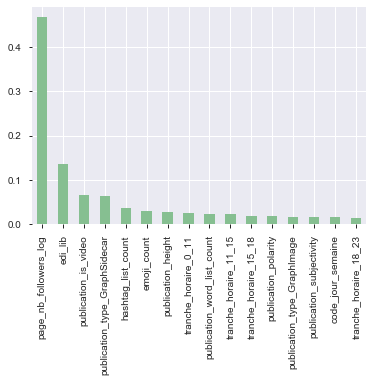

In [86]:
pd.Series(xgb_reg_feat.feature_importances_, index=X_feat_train.columns).nlargest(20).plot(kind='bar',color='#86bf91')